In [ ]:
import os
import pandas as pd
import cv2
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.metrics import classification_report
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import ModelCheckpoint


In [28]:
labels_df = pd.read_csv('labels.csv')

In [29]:
data_dir = '/content/drive/MyDrive/traffic_Data/DATA'
images = []
labels = []

In [30]:
for class_folder in os.listdir(data_dir):
    class_id = int(class_folder)
    class_path = os.path.join(data_dir, class_folder)
    for img_name in os.listdir(class_path):
        img_path = os.path.join(class_path, img_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append(img)

        class_name = labels_df.loc[labels_df['ClassId'] == class_id, 'Name'].iloc[0]
        labels.append(class_name)

In [31]:
resized_images = [cv2.resize(img, (224, 224)) for img in images]
images = np.array(resized_images)
labels = np.array(labels)

In [32]:
unique_labels, label_counts = np.unique(labels, return_counts=True)
max_count = np.max(label_counts)

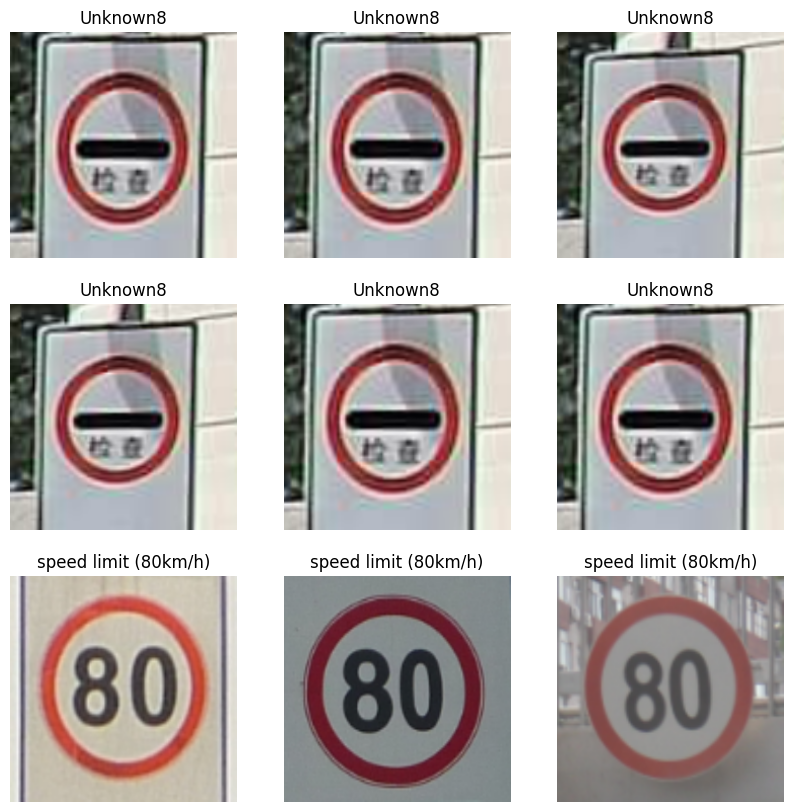

In [33]:
plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.imshow(images[i])
    plt.title(labels[i])
    plt.axis('off')
plt.show()

In [34]:
from tensorflow.keras.applications import NASNetMobile

In [35]:
model = NASNetMobile(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

In [36]:
x = GlobalAveragePooling2D()(model.output)
x = Dense(256, activation='relu')(x)
output = Dense(58, activation='softmax')(x)

In [37]:
nasnet_model = Model(inputs=model.input, outputs=output)

In [38]:
nasnet_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [39]:
nasnet_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 stem_conv1 (Conv2D)         (None, 111, 111, 32)         864       ['input_2[0][0]']             
                                                                                                  
 stem_bn1 (BatchNormalizati  (None, 111, 111, 32)         128       ['stem_conv1[0][0]']          
 on)                                                                                              
                                                                                                  
 activation_188 (Activation  (None, 111, 111, 32)         0         ['stem_bn1[0][0]']      

In [40]:

checkpoint_filepath = 'model_weights.h5'


checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True
)

In [41]:
X_resized = np.array(resized_images)

In [42]:
X_train_resized, X_test_resized, y_train, y_test = train_test_split(X_resized, labels, test_size=0.15, random_state=42, stratify=labels)
train_class_counts = pd.Series(y_train).value_counts().sort_index()
test_class_counts = pd.Series(y_test).value_counts().sort_index()

print("Class distribution in training set:")
print(train_class_counts)

print("\nClass distribution in testing set:")
print(test_class_counts)


Class distribution in training set:
Bicycles crossing               161
Children crossing                49
Danger Ahead                     22
Dangerous curve to the left      25
Dangerous curve to the right     29
Dont Go Left                    117
Dont Go Left or Right            82
Dont Go Right                    31
Dont Go straight                 59
Dont Go straight or Right         2
Dont Go straight or left          7
Dont overtake from Left         109
Fences                           48
Give Way                          2
Go Left                          15
Go Left or right                 12
Go Right                         85
Go left or straight              26
Go right or straight             70
Go straight                      10
Go straight or right             15
Heavy Vehicle Accidents           7
Horn                             37
No Car                          121
No Uturn                         19
No entry                        138
No horn                     

In [43]:
from sklearn.preprocessing import LabelEncoder

In [44]:
label_encoder = LabelEncoder()


y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

In [27]:
history = nasnet_model.fit(X_train_resized, y_train_encoded,
                    epochs=10,
                    batch_size=32,
                    validation_data=(X_test_resized, y_test_encoded),
                    callbacks=[checkpoint_callback])


test_loss, test_acc = nasnet_model.evaluate(X_test_resized, y_test_encoded)
print("Test Accuracy:", test_acc)

Epoch 1/10
111/111 [==============================] - 1269s 11s/step - loss: 0.7444 - accuracy: 0.8225 - val_loss: 7.7007 - val_accuracy: 0.0495
Epoch 2/10
111/111 [==============================] - 1176s 11s/step - loss: 0.2133 - accuracy: 0.9453 - val_loss: 27.4828 - val_accuracy: 0.0511
Epoch 3/10
111/111 [==============================] - 1185s 11s/step - loss: 0.1283 - accuracy: 0.9684 - val_loss: 181.2111 - val_accuracy: 0.0447
Epoch 4/10
111/111 [==============================] - 1219s 11s/step - loss: 0.0736 - accuracy: 0.9845 - val_loss: 143.3768 - val_accuracy: 0.0703
Epoch 5/10
111/111 [==============================] - 1184s 11s/step - loss: 0.1497 - accuracy: 0.9667 - val_loss: 281.3984 - val_accuracy: 0.1262
Epoch 6/10
111/111 [==============================] - 1177s 11s/step - loss: 0.0924 - accuracy: 0.9842 - val_loss: 46.0386 - val_accuracy: 0.0511
Epoch 7/10
Epoch 7/10
111/111 [==============================] - 1173s 11s/step - loss: 0.0962 - accuracy: 0.9800 - val_lo

1/1 [==============================] - 6s 6s/step
input_2 (1, 224, 224, 3)


<Figure size 640x480 with 0 Axes>

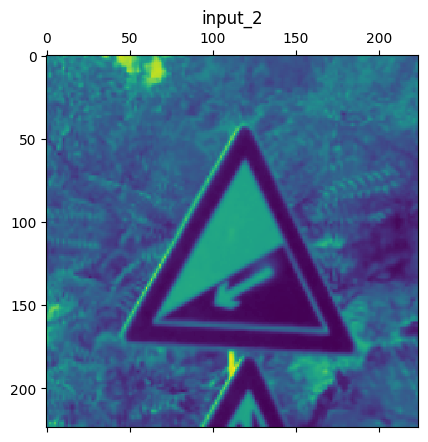

stem_conv1 (1, 111, 111, 32)


<Figure size 640x480 with 0 Axes>

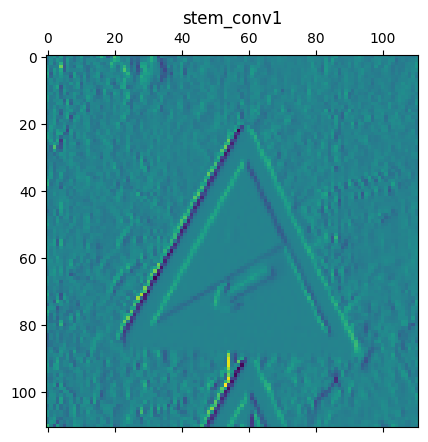

stem_bn1 (1, 111, 111, 32)


<Figure size 640x480 with 0 Axes>

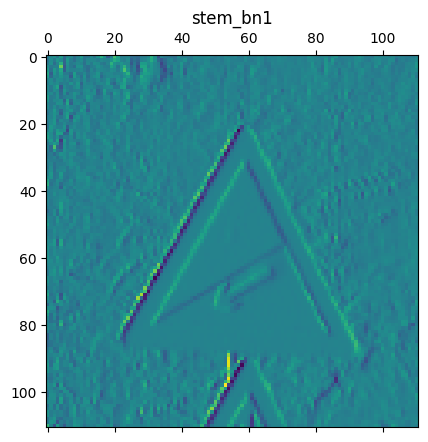

activation_188 (1, 111, 111, 32)


<Figure size 640x480 with 0 Axes>

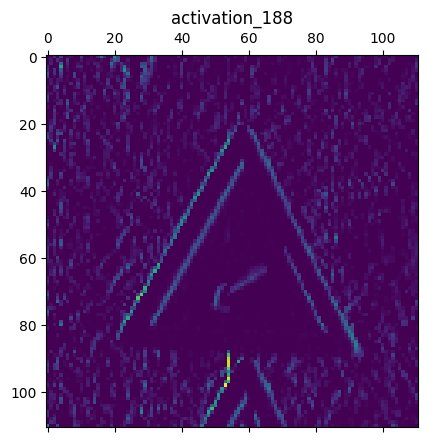

reduction_conv_1_stem_1 (1, 111, 111, 11)


<Figure size 640x480 with 0 Axes>

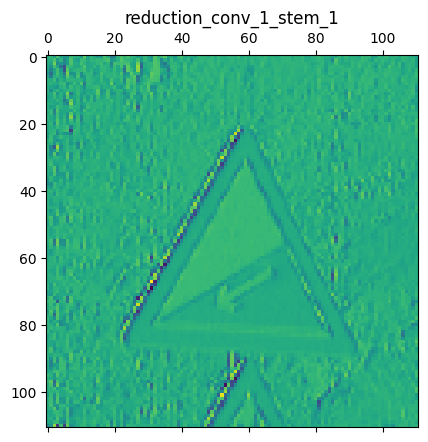

reduction_bn_1_stem_1 (1, 111, 111, 11)


<Figure size 640x480 with 0 Axes>

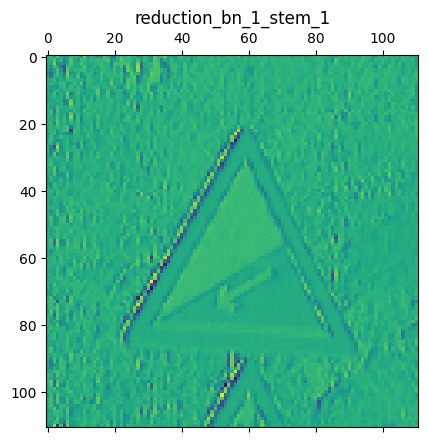

activation_189 (1, 111, 111, 11)


<Figure size 640x480 with 0 Axes>

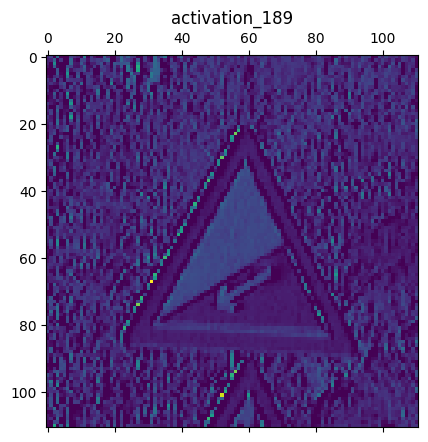

activation_191 (1, 111, 111, 32)


<Figure size 640x480 with 0 Axes>

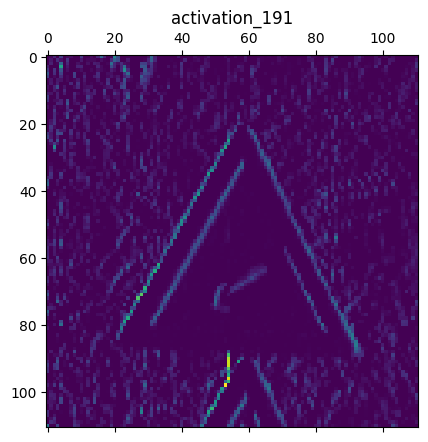

separable_conv_1_pad_reduction_left1_stem_1 (1, 115, 115, 11)


<Figure size 640x480 with 0 Axes>

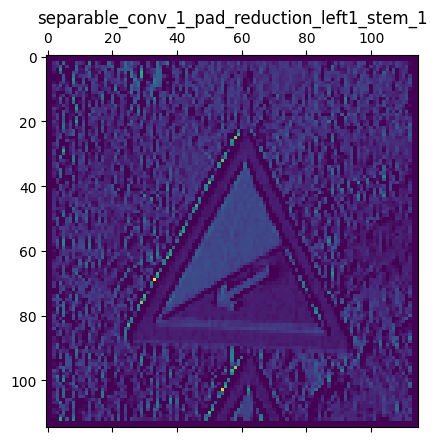

separable_conv_1_pad_reduction_right1_stem_1 (1, 117, 117, 32)


<Figure size 640x480 with 0 Axes>

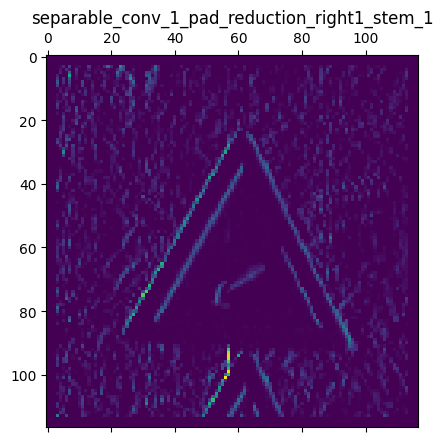

separable_conv_1_reduction_left1_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

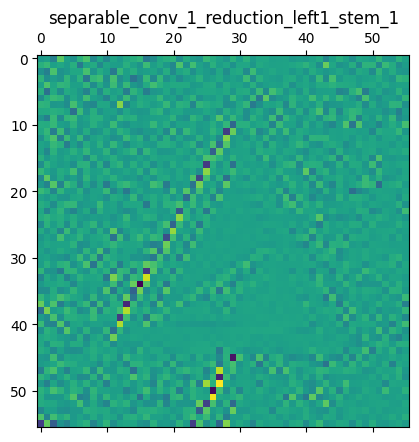

separable_conv_1_reduction_right1_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

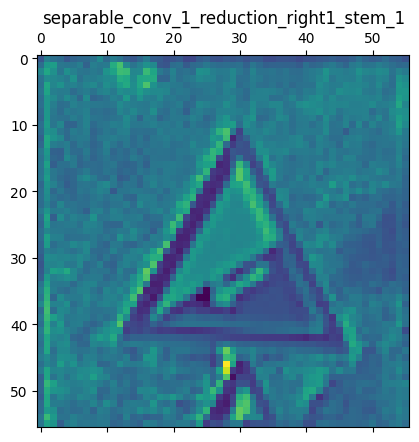

separable_conv_1_bn_reduction_left1_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

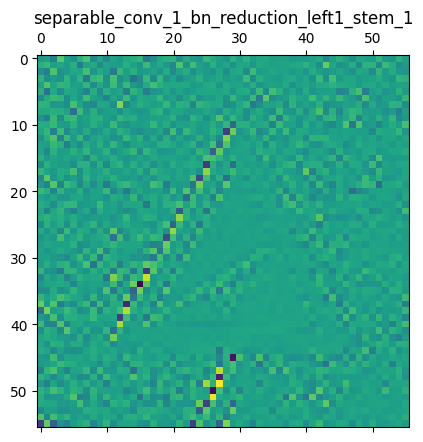

separable_conv_1_bn_reduction_right1_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

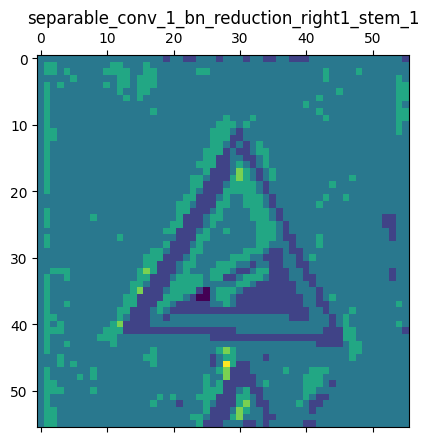

activation_190 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

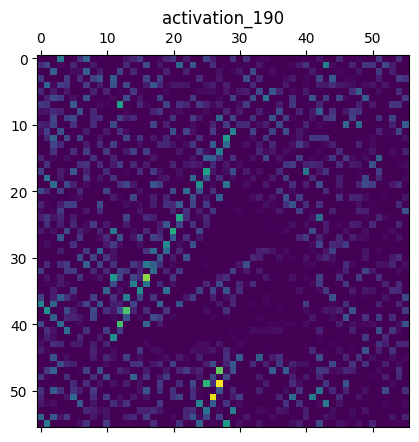

activation_192 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

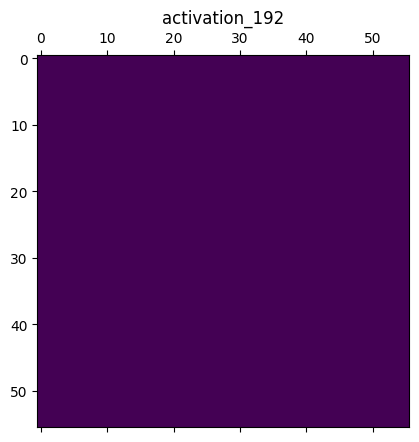

separable_conv_2_reduction_left1_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

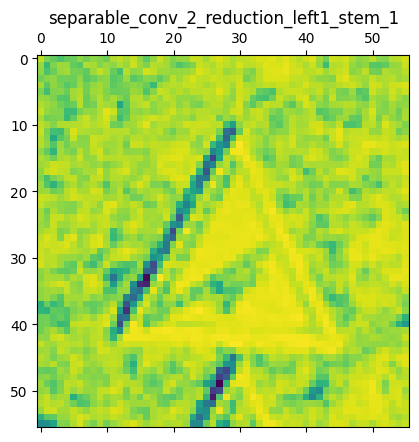

separable_conv_2_reduction_right1_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

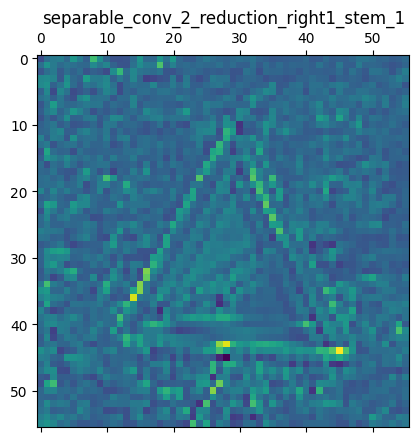

activation_193 (1, 111, 111, 32)


<Figure size 640x480 with 0 Axes>

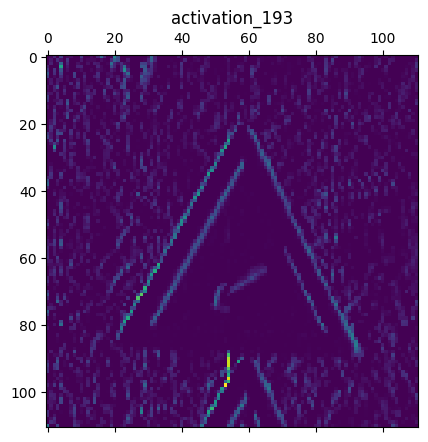

separable_conv_2_bn_reduction_left1_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

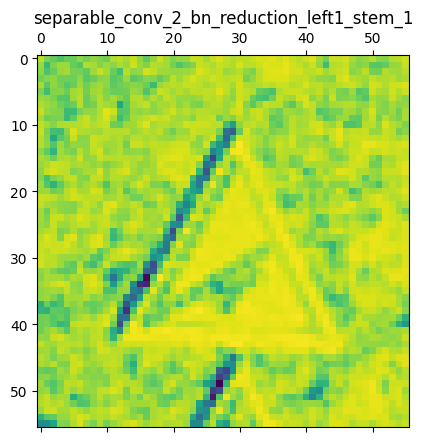

separable_conv_2_bn_reduction_right1_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

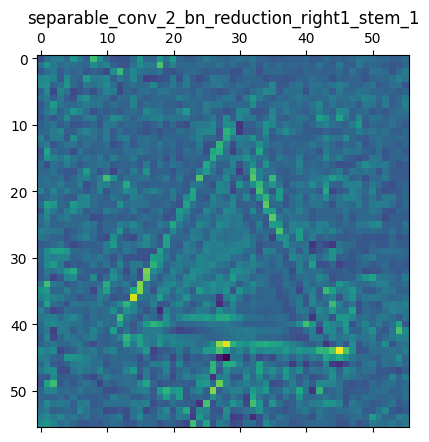

separable_conv_1_pad_reduction_right2_stem_1 (1, 117, 117, 32)


<Figure size 640x480 with 0 Axes>

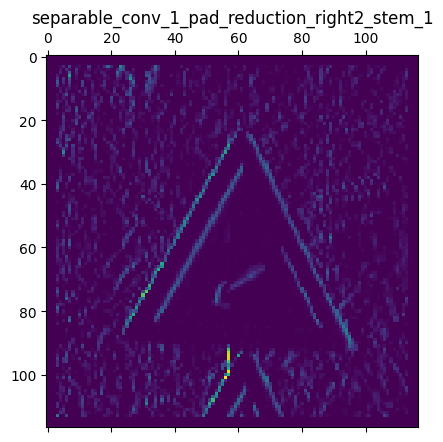

activation_195 (1, 111, 111, 32)


<Figure size 640x480 with 0 Axes>

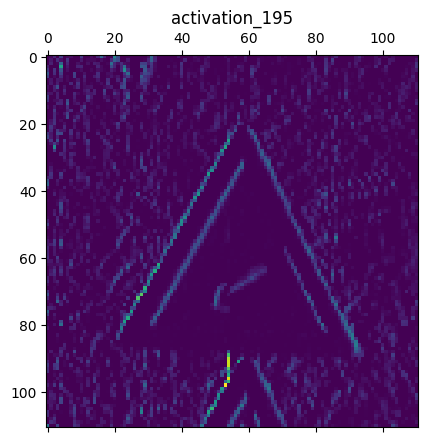

reduction_add_1_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

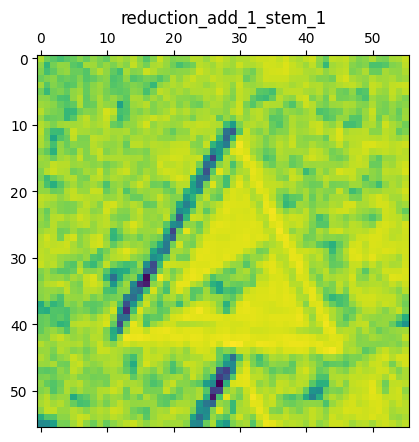

separable_conv_1_reduction_right2_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

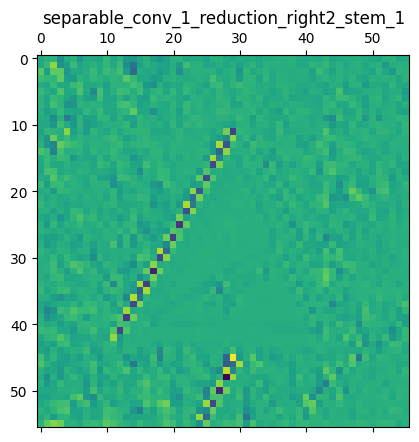

separable_conv_1_pad_reduction_right3_stem_1 (1, 115, 115, 32)


<Figure size 640x480 with 0 Axes>

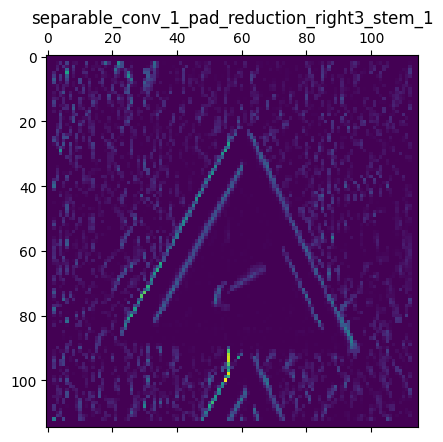

activation_197 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

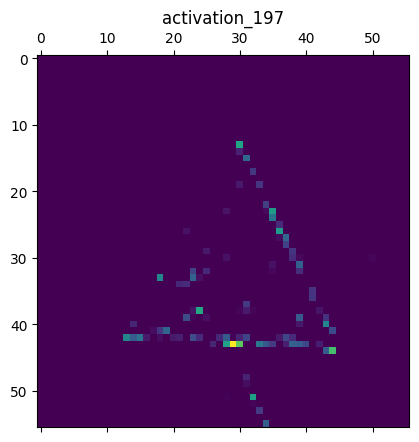

separable_conv_1_bn_reduction_right2_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

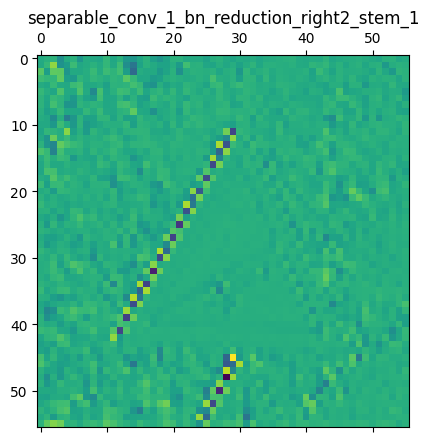

separable_conv_1_reduction_right3_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

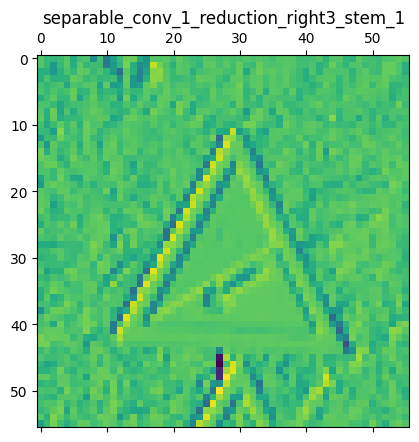

separable_conv_1_reduction_left4_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

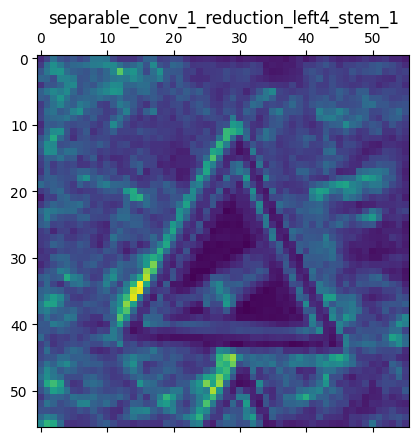

activation_194 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

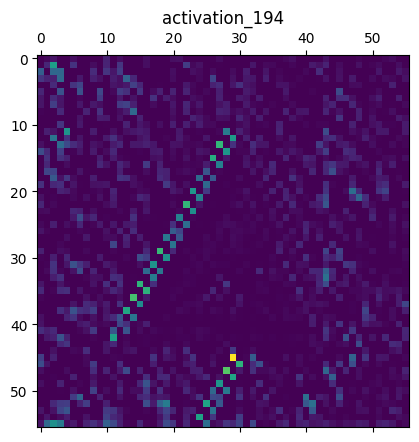

separable_conv_1_bn_reduction_right3_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

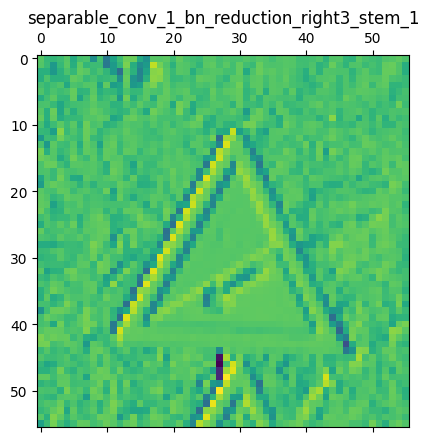

separable_conv_1_bn_reduction_left4_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

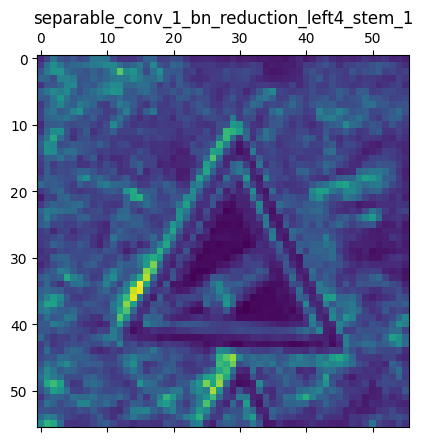

reduction_pad_1_stem_1 (1, 113, 113, 11)


<Figure size 640x480 with 0 Axes>

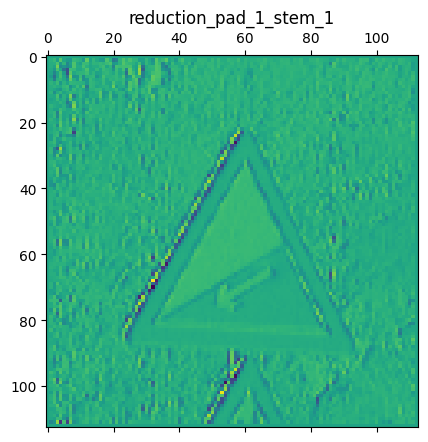

separable_conv_2_reduction_right2_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

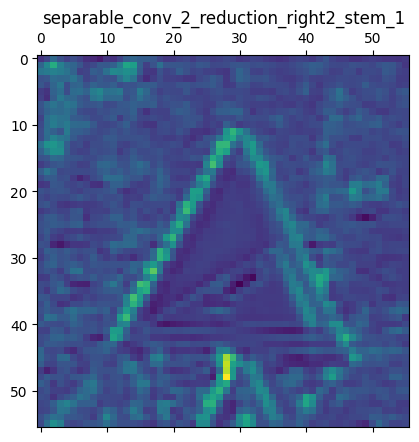

activation_196 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

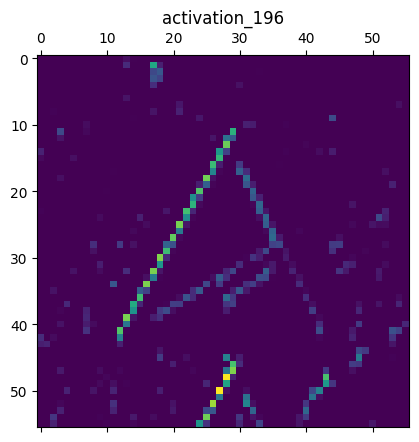

activation_198 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

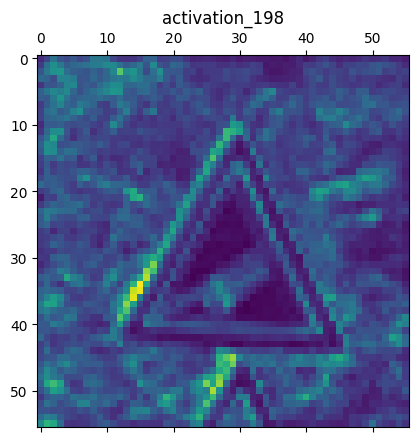

reduction_left2_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

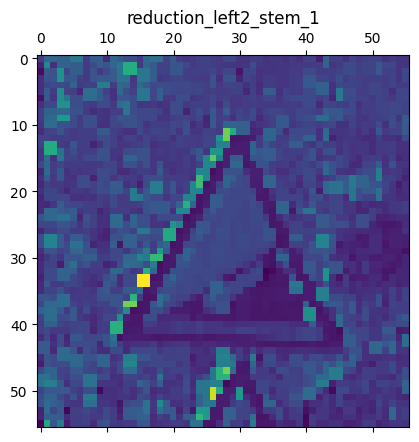

separable_conv_2_bn_reduction_right2_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

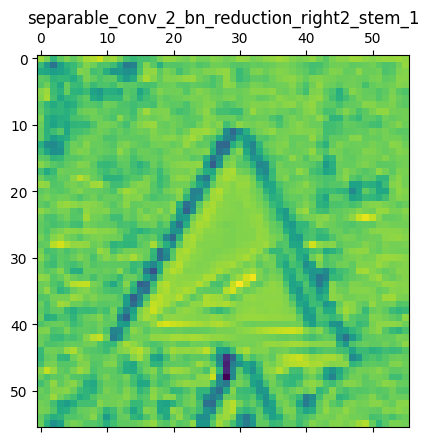

separable_conv_2_reduction_right3_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

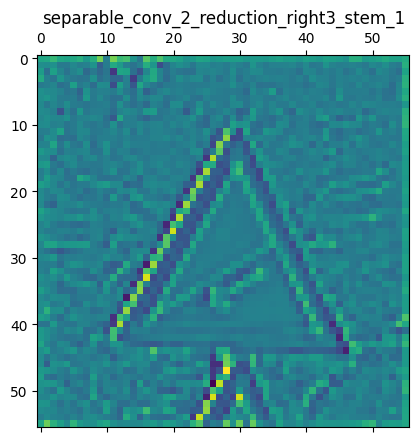

separable_conv_2_reduction_left4_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

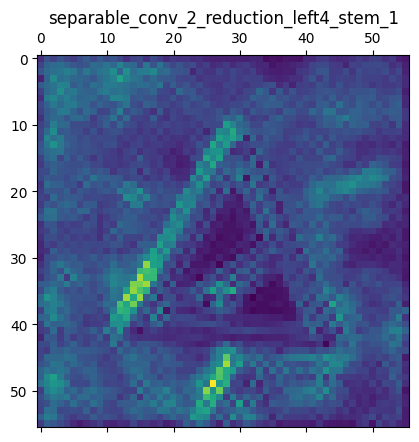

adjust_relu_1_stem_2 (1, 111, 111, 32)


<Figure size 640x480 with 0 Axes>

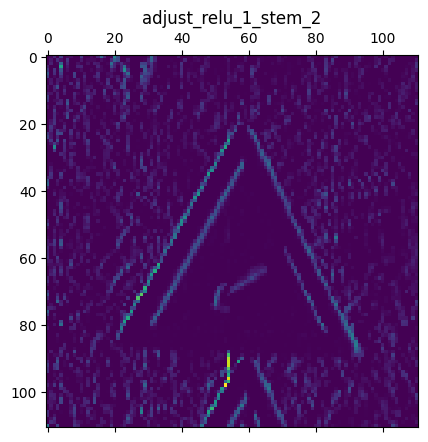

reduction_add_2_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

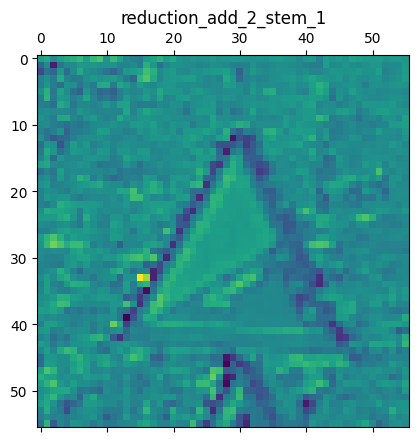

reduction_left3_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

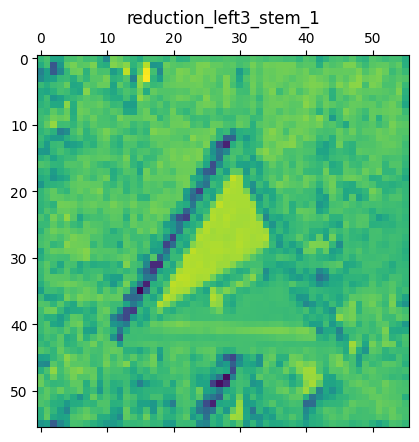

separable_conv_2_bn_reduction_right3_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

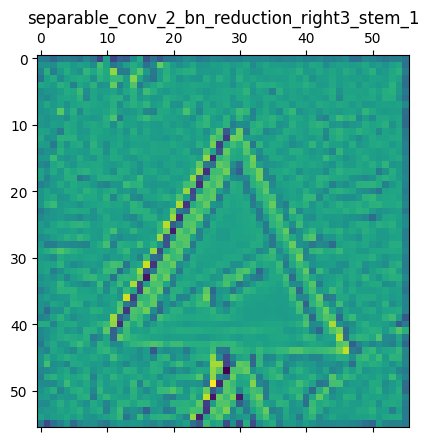

reduction_left4_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

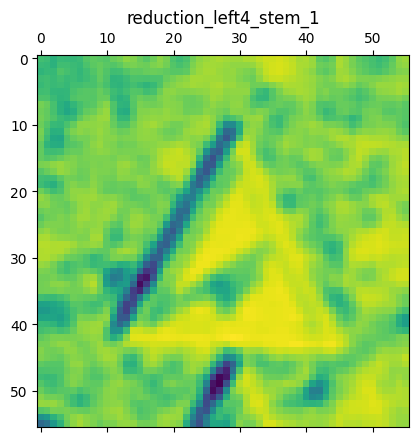

separable_conv_2_bn_reduction_left4_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

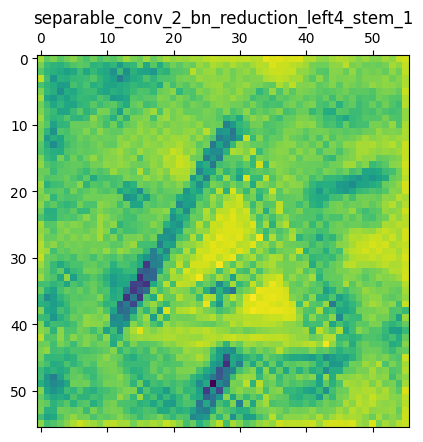

reduction_right5_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

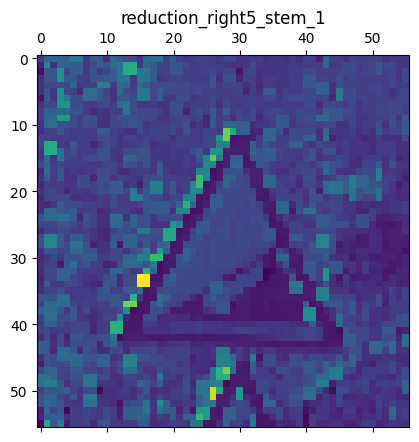

zero_padding2d_4 (1, 112, 112, 32)


<Figure size 640x480 with 0 Axes>

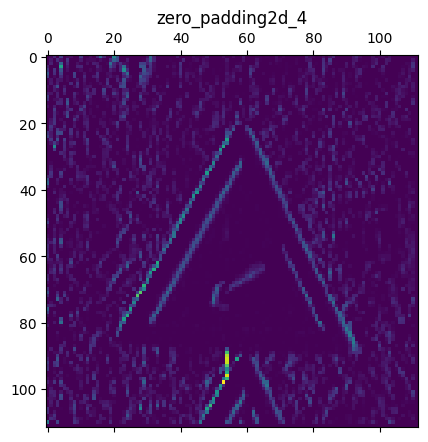

reduction_add3_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

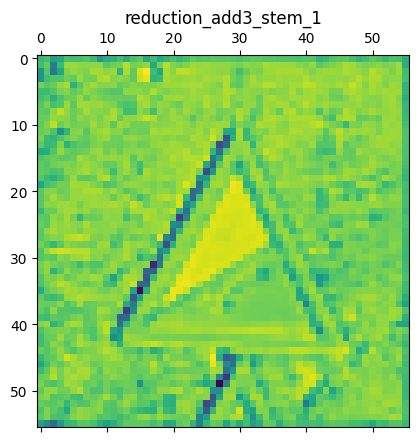

add_4 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

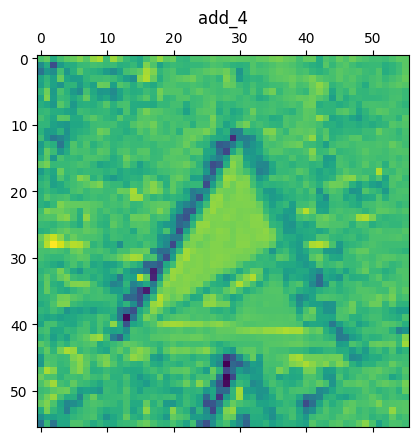

reduction_add4_stem_1 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

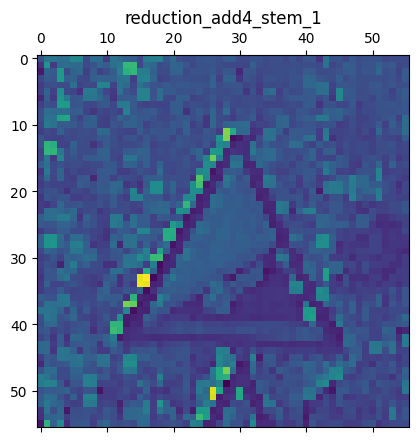

cropping2d_4 (1, 111, 111, 32)


<Figure size 640x480 with 0 Axes>

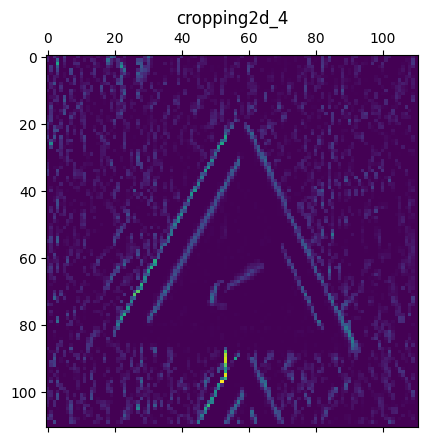

reduction_concat_stem_1 (1, 56, 56, 44)


<Figure size 640x480 with 0 Axes>

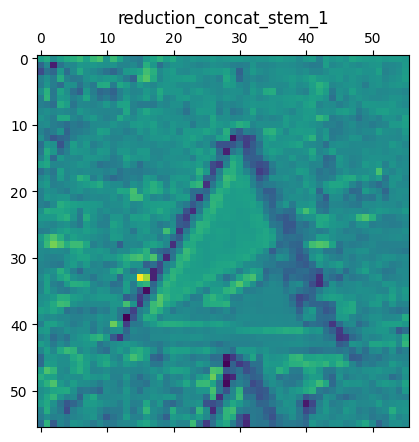

adjust_avg_pool_1_stem_2 (1, 56, 56, 32)


<Figure size 640x480 with 0 Axes>

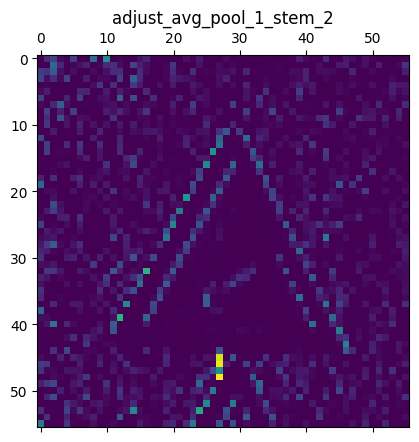

adjust_avg_pool_2_stem_2 (1, 56, 56, 32)


<Figure size 640x480 with 0 Axes>

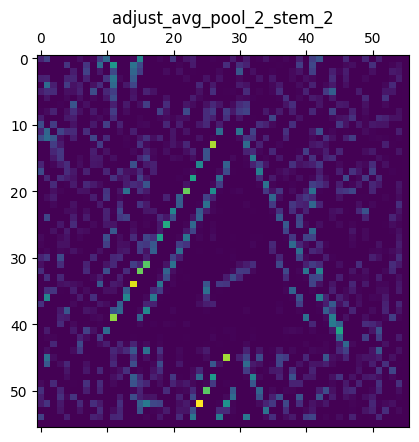

activation_199 (1, 56, 56, 44)


<Figure size 640x480 with 0 Axes>

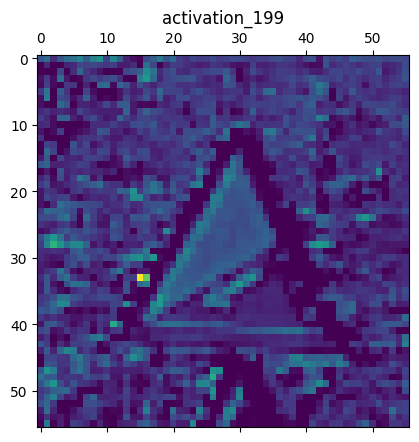

adjust_conv_1_stem_2 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

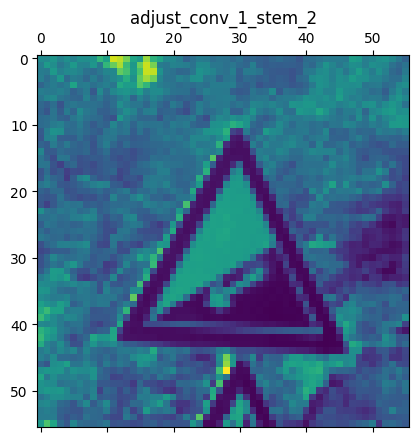

adjust_conv_2_stem_2 (1, 56, 56, 11)


<Figure size 640x480 with 0 Axes>

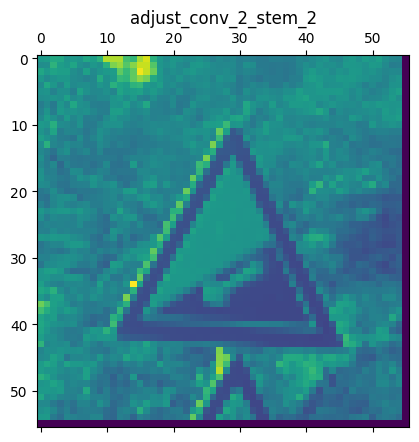

reduction_conv_1_stem_2 (1, 56, 56, 22)


<Figure size 640x480 with 0 Axes>

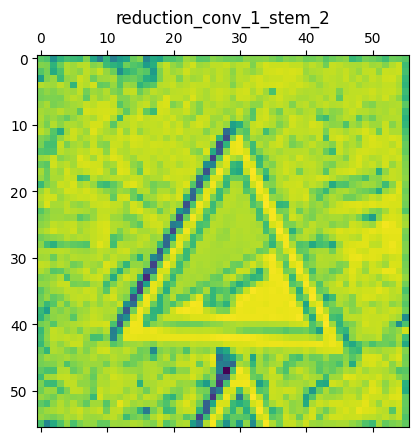

concatenate_4 (1, 56, 56, 22)


<Figure size 640x480 with 0 Axes>

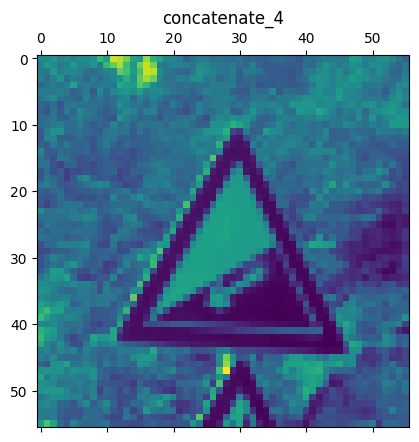

reduction_bn_1_stem_2 (1, 56, 56, 22)


<Figure size 640x480 with 0 Axes>

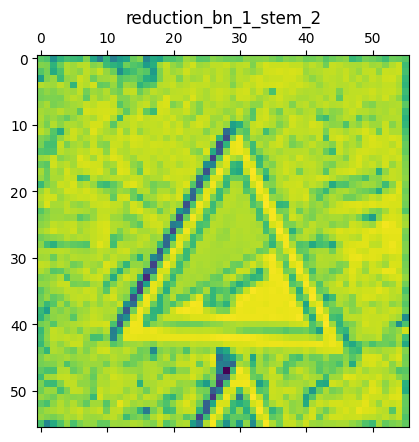

adjust_bn_stem_2 (1, 56, 56, 22)


<Figure size 640x480 with 0 Axes>

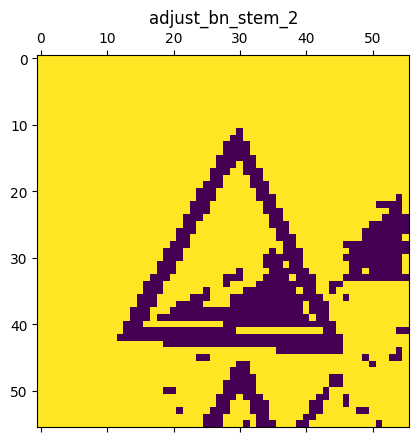

activation_200 (1, 56, 56, 22)


<Figure size 640x480 with 0 Axes>

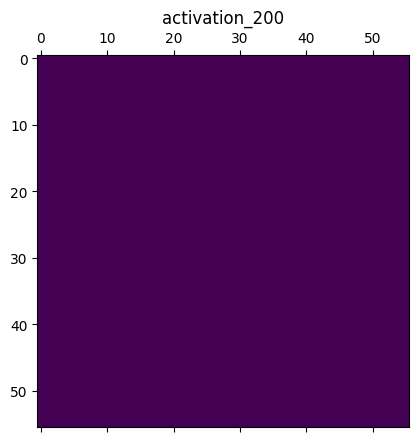

activation_202 (1, 56, 56, 22)


<Figure size 640x480 with 0 Axes>

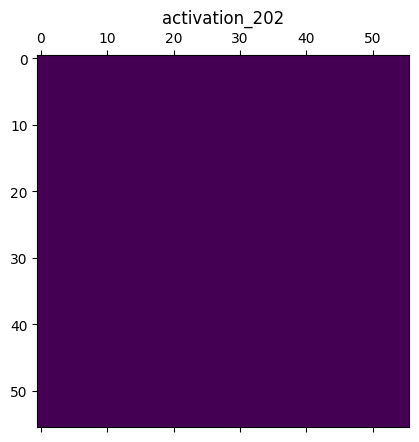

separable_conv_1_pad_reduction_left1_stem_2 (1, 59, 59, 22)


<Figure size 640x480 with 0 Axes>

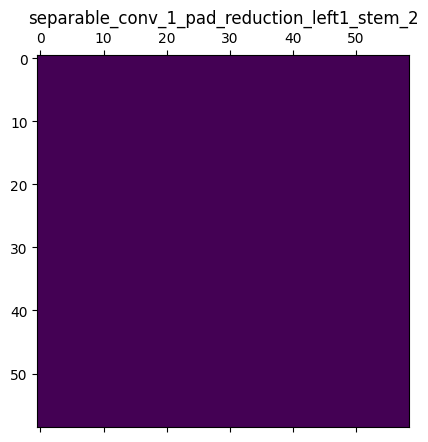

separable_conv_1_pad_reduction_right1_stem_2 (1, 61, 61, 22)


<Figure size 640x480 with 0 Axes>

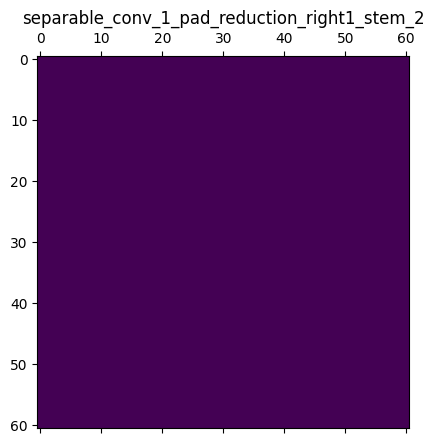

separable_conv_1_reduction_left1_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

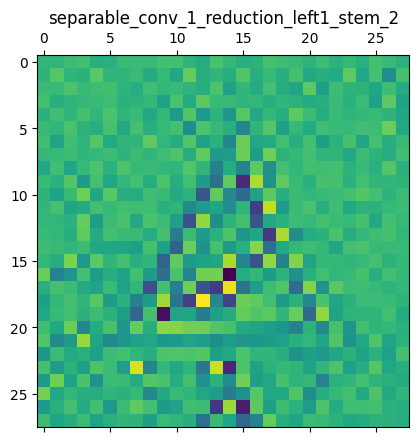

separable_conv_1_reduction_right1_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

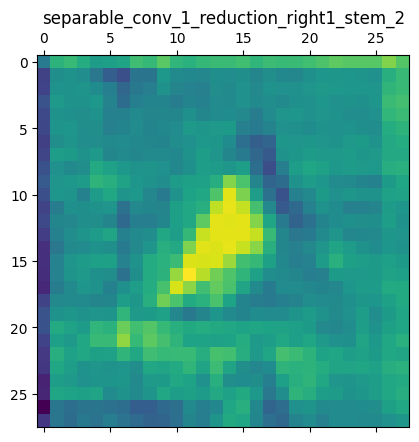

separable_conv_1_bn_reduction_left1_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

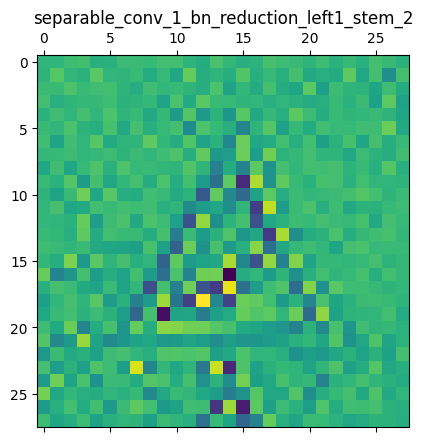

separable_conv_1_bn_reduction_right1_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

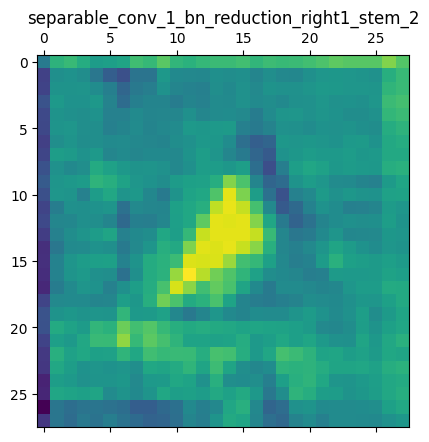

activation_201 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

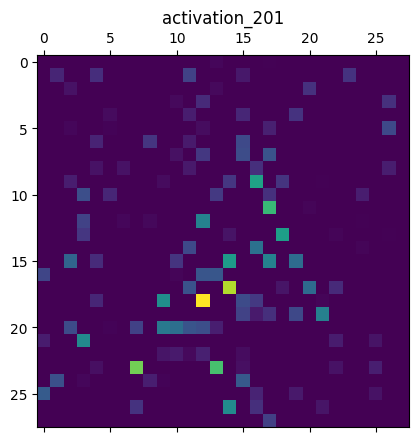

activation_203 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

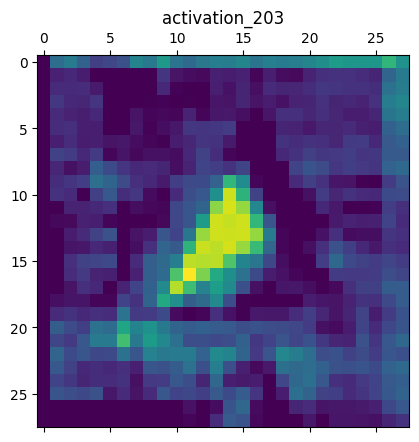

separable_conv_2_reduction_left1_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

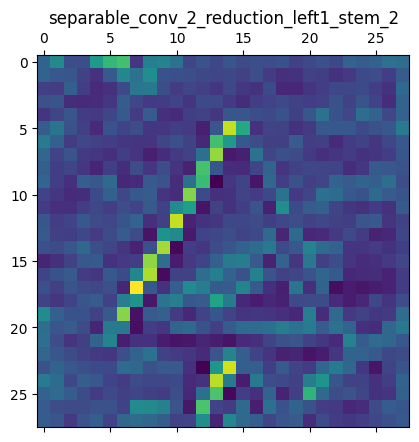

separable_conv_2_reduction_right1_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

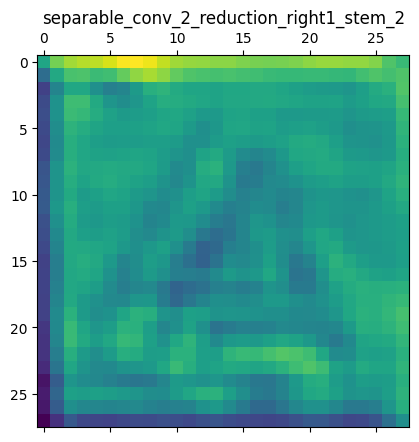

activation_204 (1, 56, 56, 22)


<Figure size 640x480 with 0 Axes>

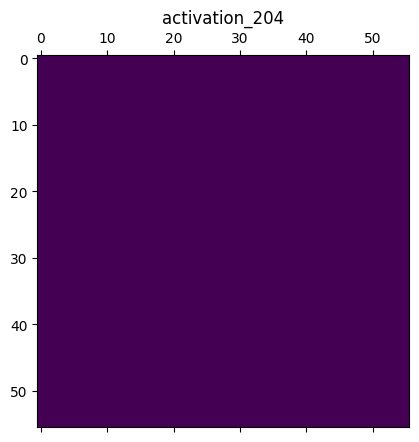

separable_conv_2_bn_reduction_left1_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

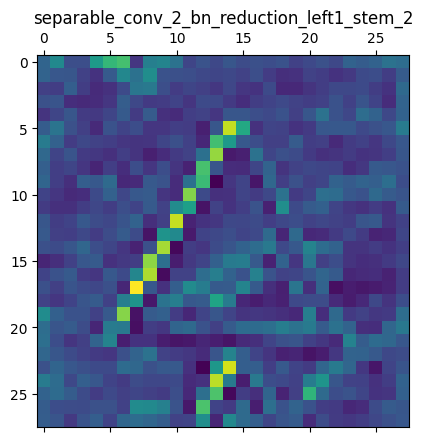

separable_conv_2_bn_reduction_right1_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

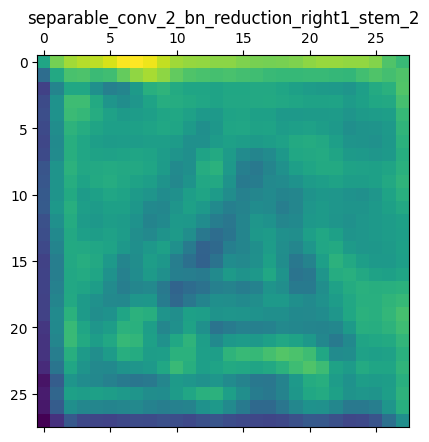

separable_conv_1_pad_reduction_right2_stem_2 (1, 61, 61, 22)


<Figure size 640x480 with 0 Axes>

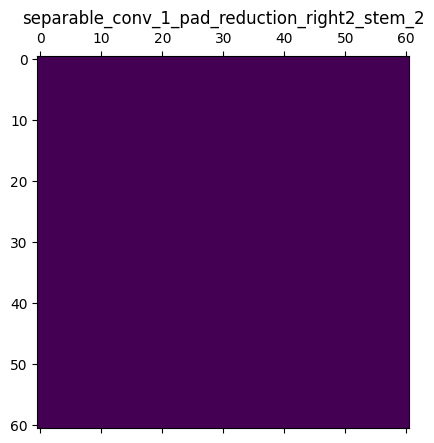

activation_206 (1, 56, 56, 22)


<Figure size 640x480 with 0 Axes>

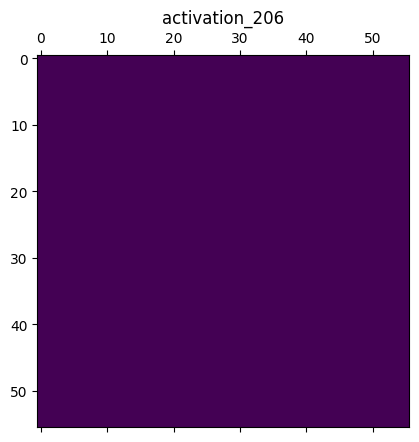

reduction_add_1_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

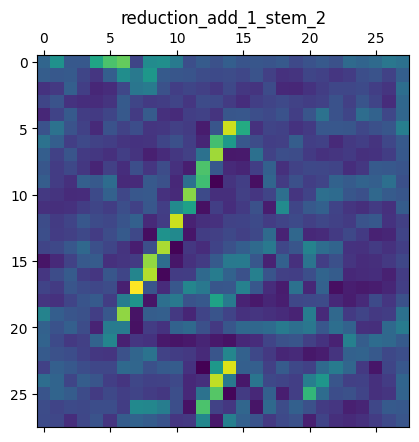

separable_conv_1_reduction_right2_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

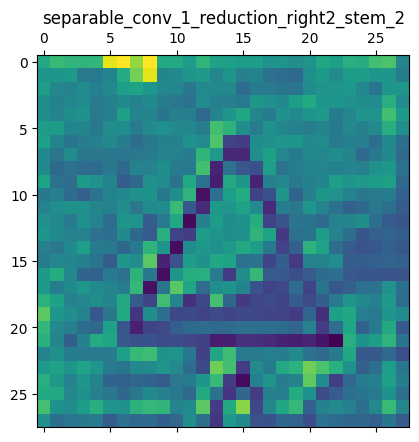

separable_conv_1_pad_reduction_right3_stem_2 (1, 59, 59, 22)


<Figure size 640x480 with 0 Axes>

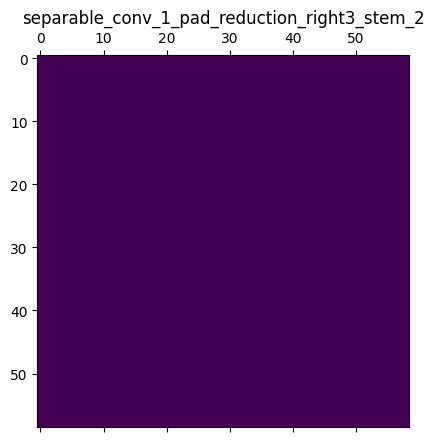

activation_208 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

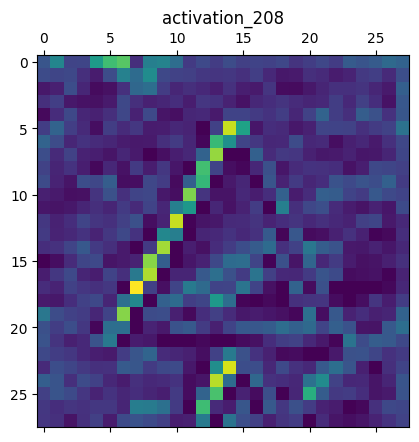

separable_conv_1_bn_reduction_right2_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

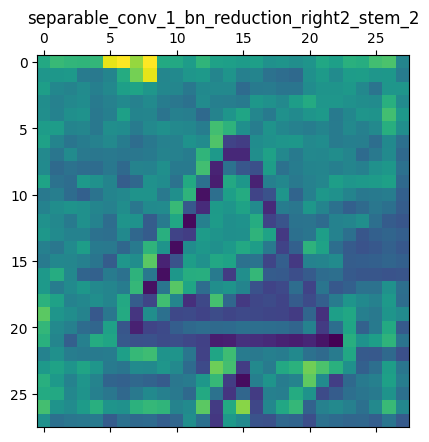

separable_conv_1_reduction_right3_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

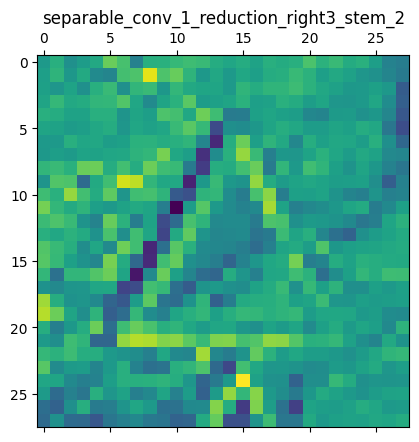

separable_conv_1_reduction_left4_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

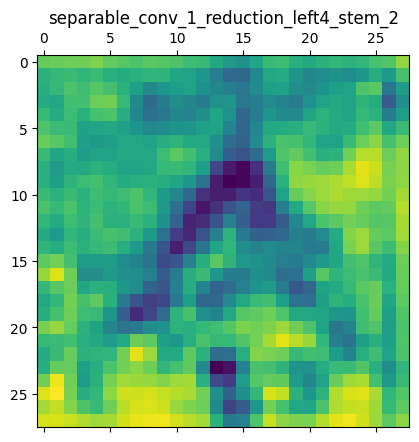

activation_205 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

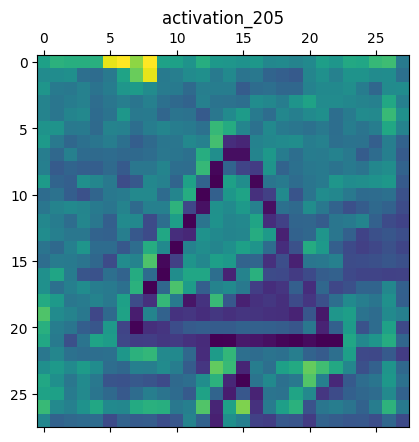

separable_conv_1_bn_reduction_right3_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

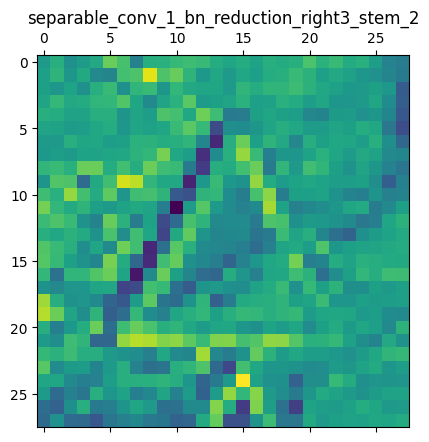

separable_conv_1_bn_reduction_left4_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

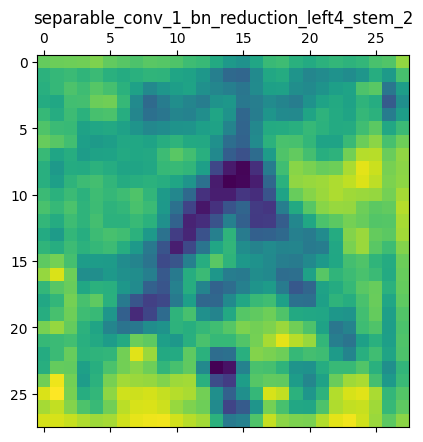

reduction_pad_1_stem_2 (1, 57, 57, 22)


<Figure size 640x480 with 0 Axes>

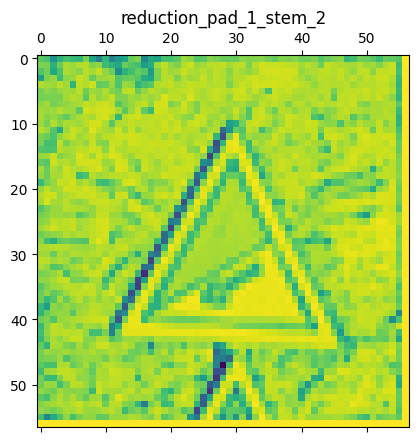

separable_conv_2_reduction_right2_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

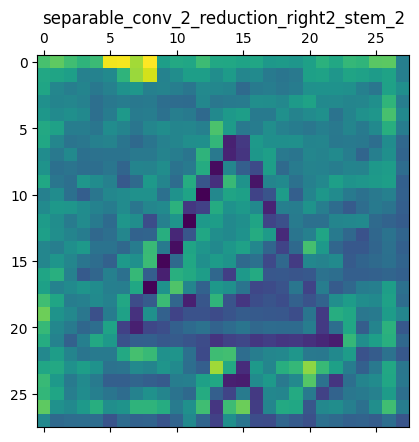

activation_207 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

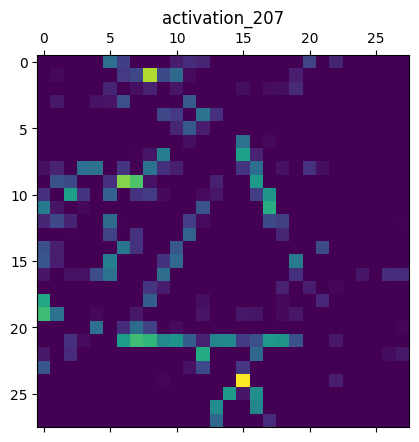

activation_209 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

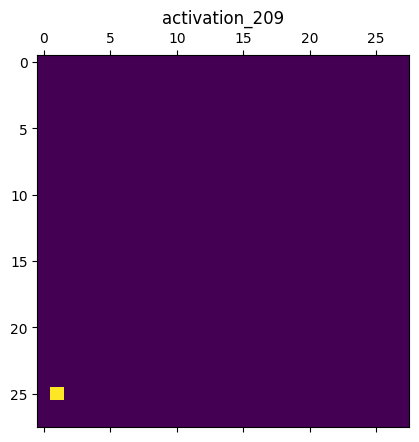

reduction_left2_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

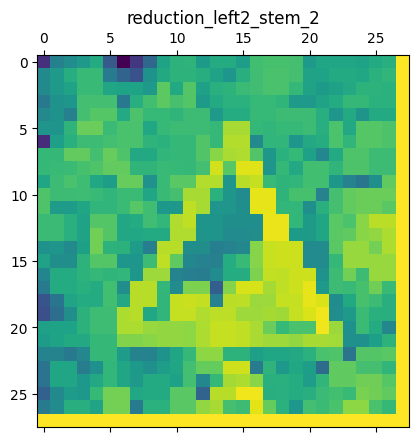

separable_conv_2_bn_reduction_right2_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

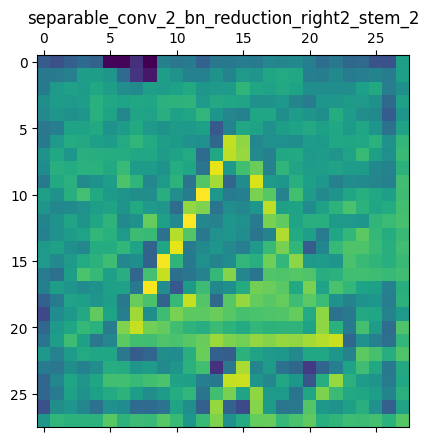

separable_conv_2_reduction_right3_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

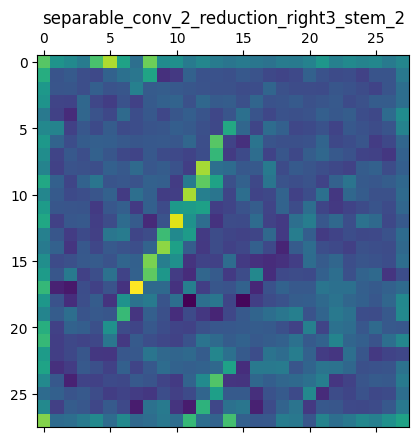

separable_conv_2_reduction_left4_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

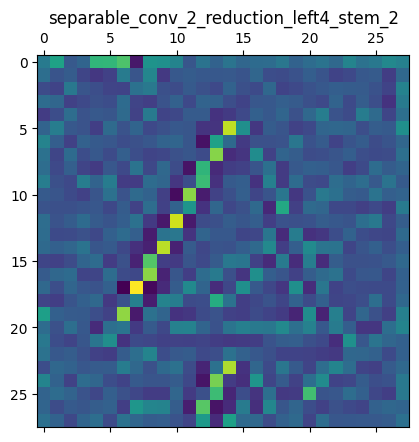

adjust_relu_1_0 (1, 56, 56, 44)


<Figure size 640x480 with 0 Axes>

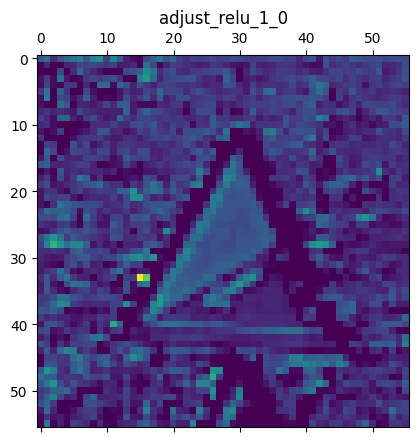

reduction_add_2_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

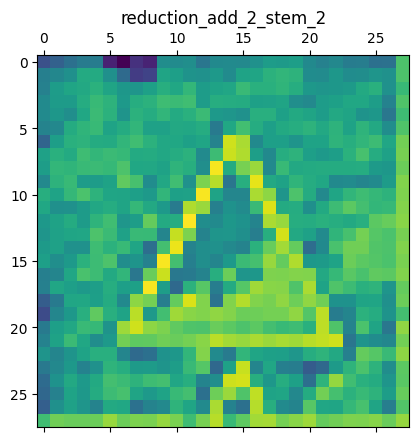

reduction_left3_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

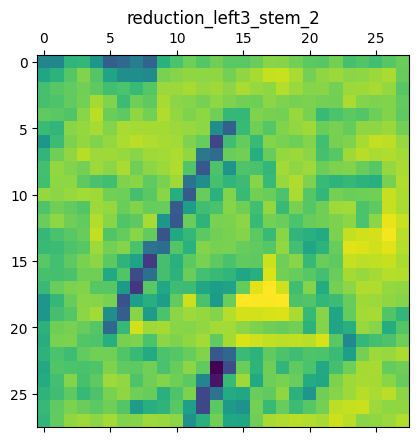

separable_conv_2_bn_reduction_right3_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

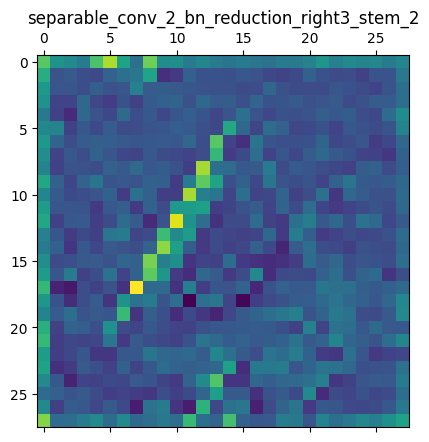

reduction_left4_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

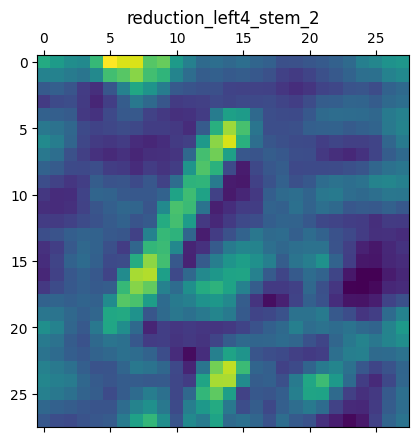

separable_conv_2_bn_reduction_left4_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

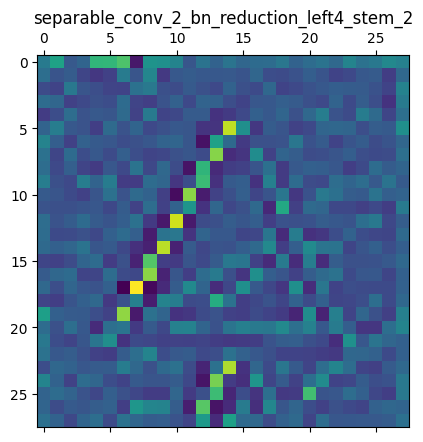

reduction_right5_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

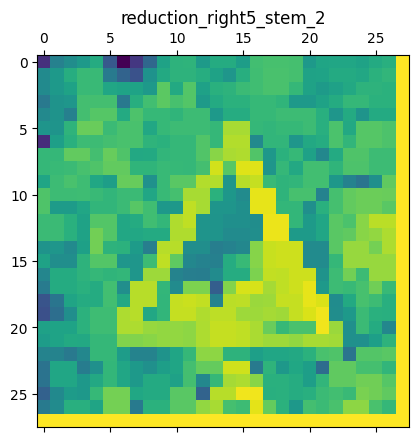

zero_padding2d_5 (1, 57, 57, 44)


<Figure size 640x480 with 0 Axes>

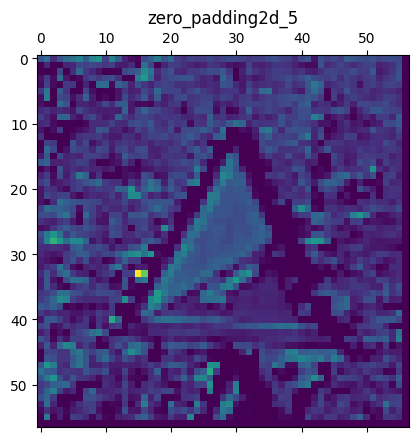

reduction_add3_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

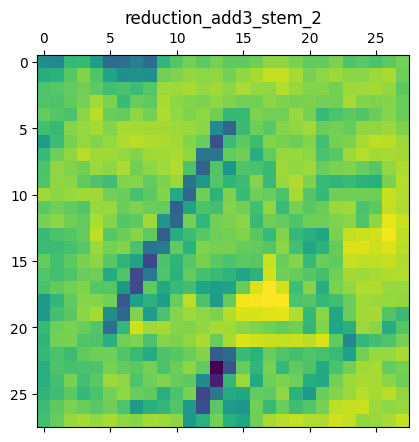

add_5 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

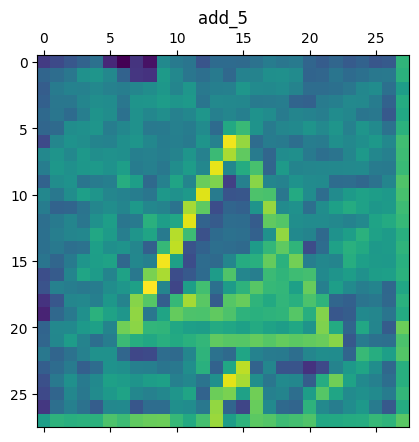

reduction_add4_stem_2 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

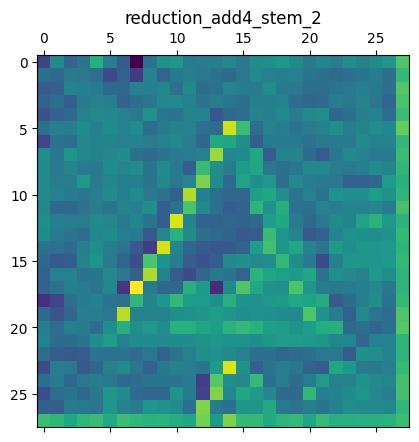

cropping2d_5 (1, 56, 56, 44)


<Figure size 640x480 with 0 Axes>

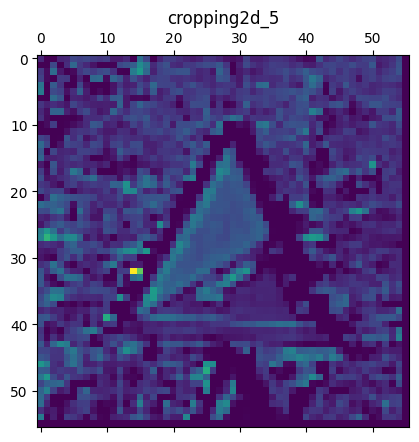

reduction_concat_stem_2 (1, 28, 28, 88)


<Figure size 640x480 with 0 Axes>

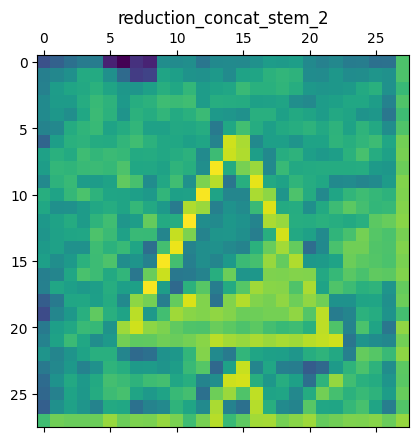

adjust_avg_pool_1_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

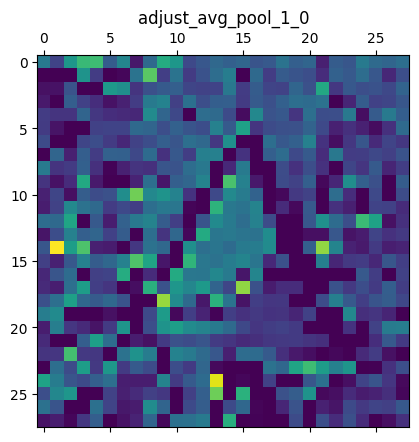

adjust_avg_pool_2_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

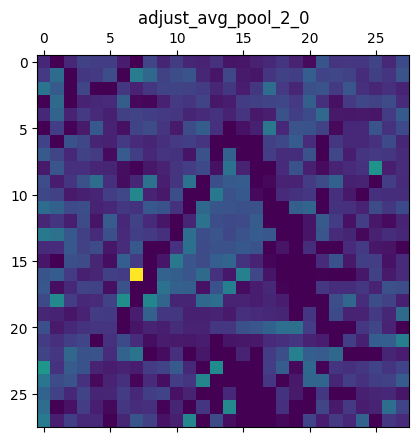

adjust_conv_1_0 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

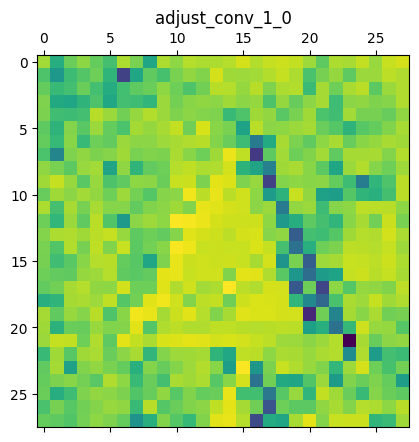

adjust_conv_2_0 (1, 28, 28, 22)


<Figure size 640x480 with 0 Axes>

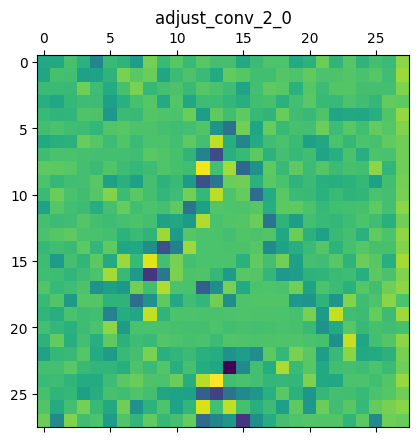

activation_210 (1, 28, 28, 88)


<Figure size 640x480 with 0 Axes>

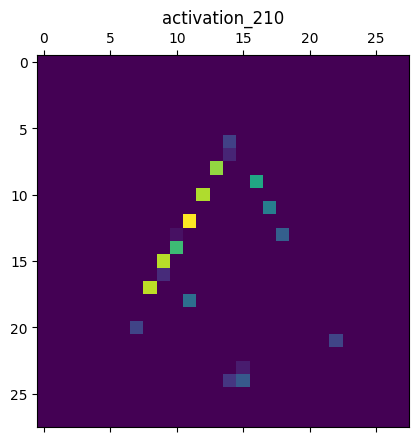

concatenate_5 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

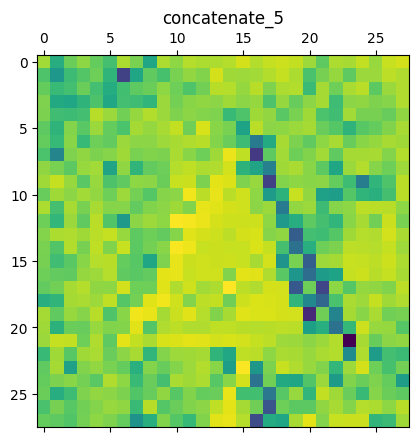

normal_conv_1_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

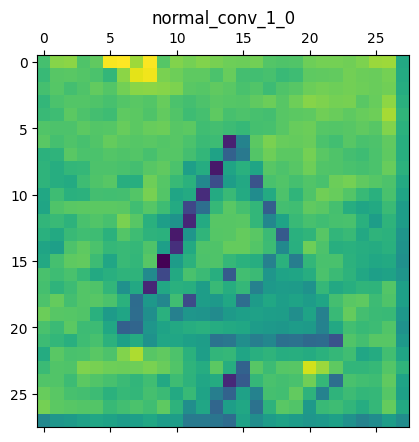

adjust_bn_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

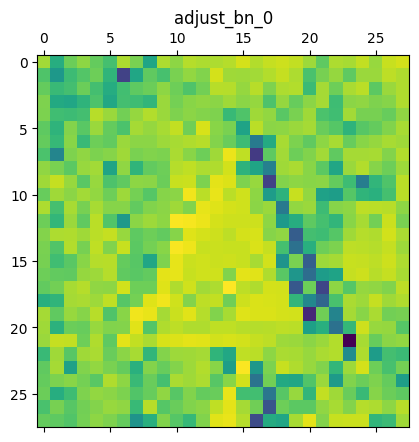

normal_bn_1_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

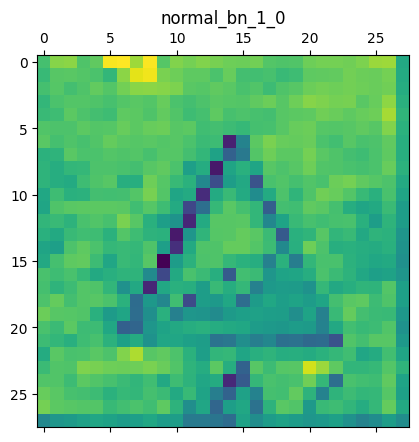

activation_211 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

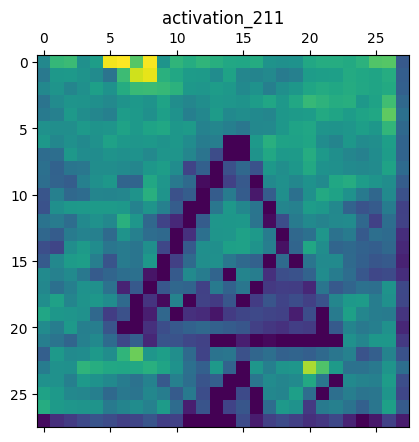

activation_213 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

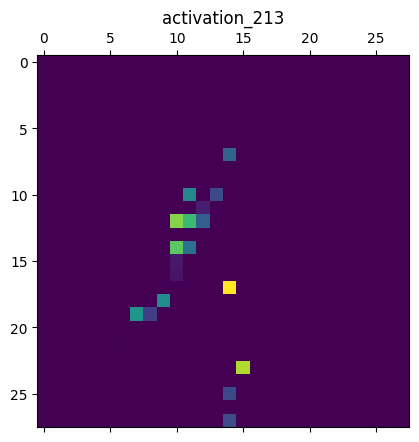

activation_215 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

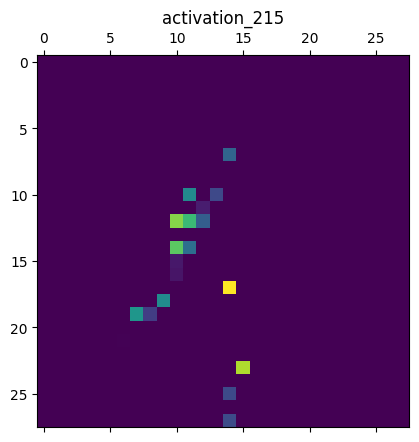

activation_217 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

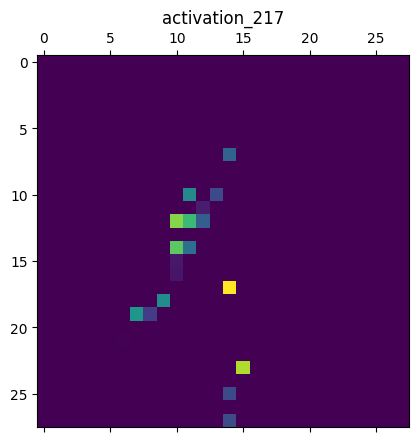

activation_219 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

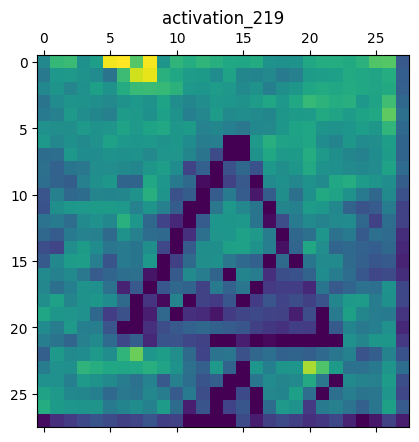

separable_conv_1_normal_left1_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

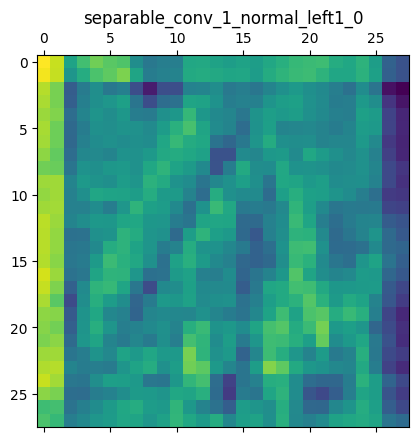

separable_conv_1_normal_right1_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

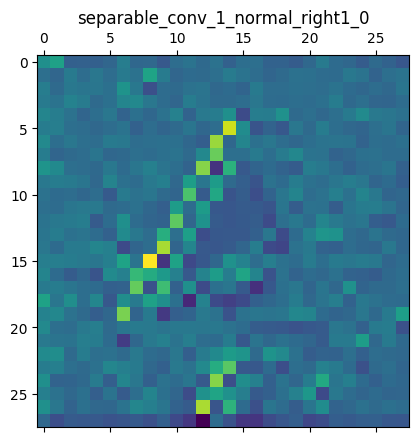

separable_conv_1_normal_left2_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

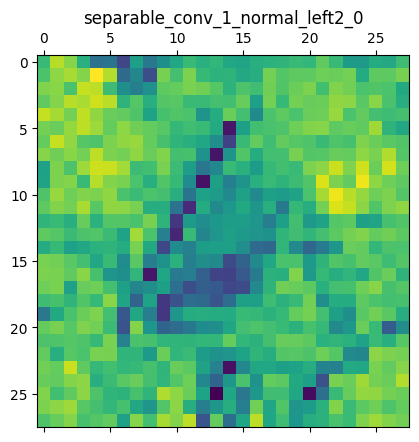

separable_conv_1_normal_right2_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

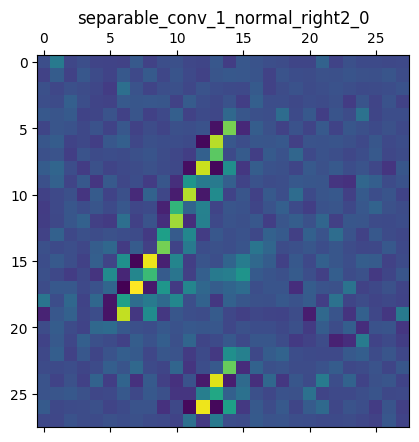

separable_conv_1_normal_left5_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

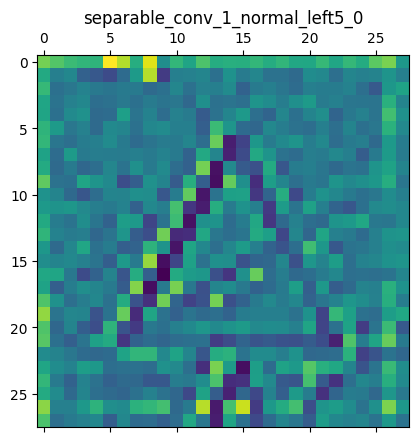

separable_conv_1_bn_normal_left1_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

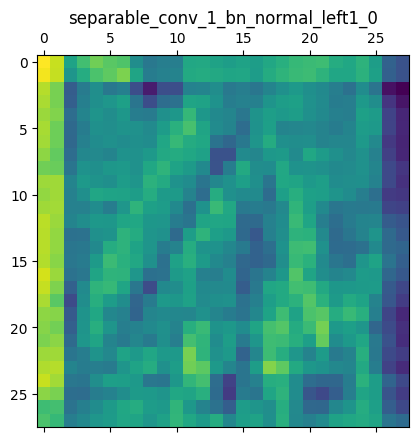

separable_conv_1_bn_normal_right1_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

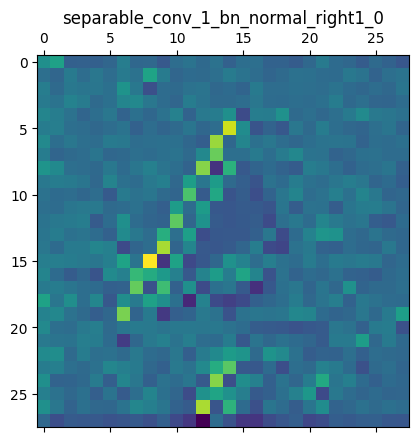

separable_conv_1_bn_normal_left2_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

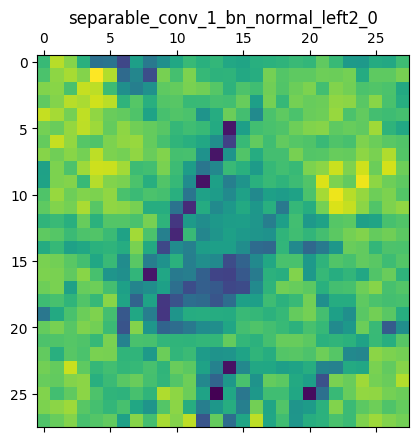

separable_conv_1_bn_normal_right2_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

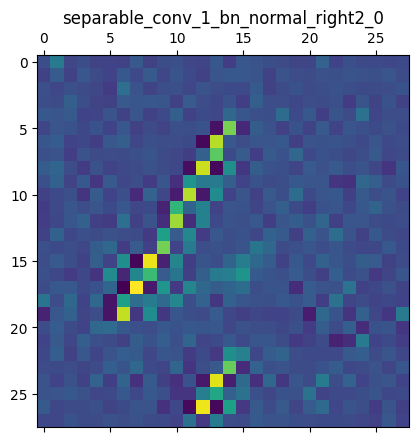

separable_conv_1_bn_normal_left5_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

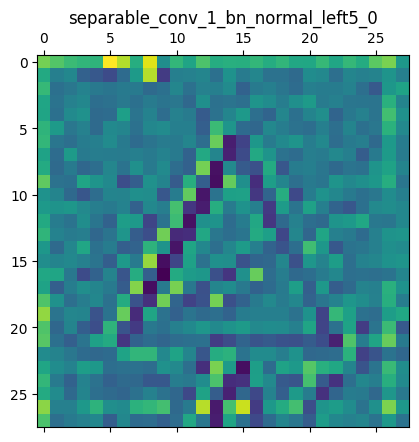

activation_212 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

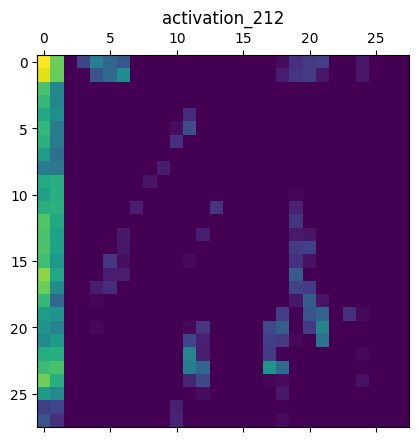

activation_214 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

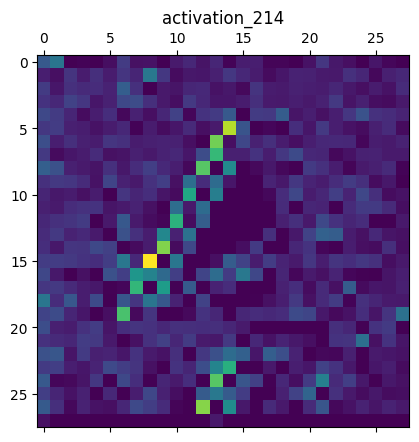

activation_216 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

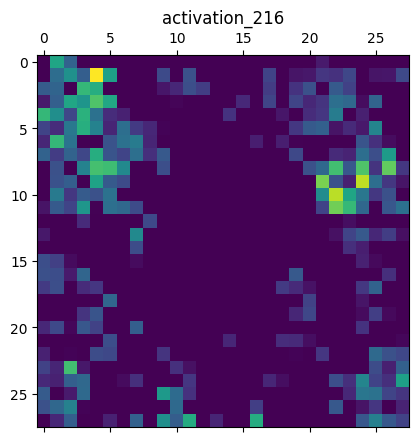

activation_218 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

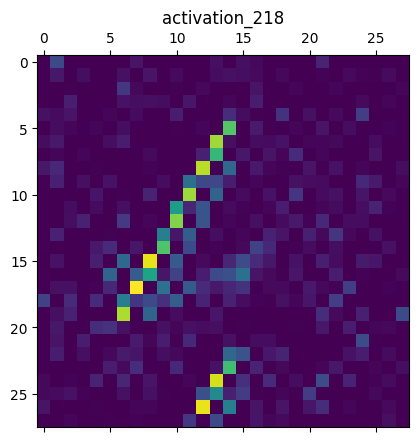

activation_220 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

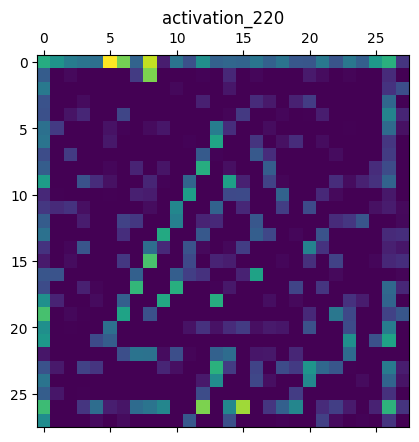

separable_conv_2_normal_left1_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

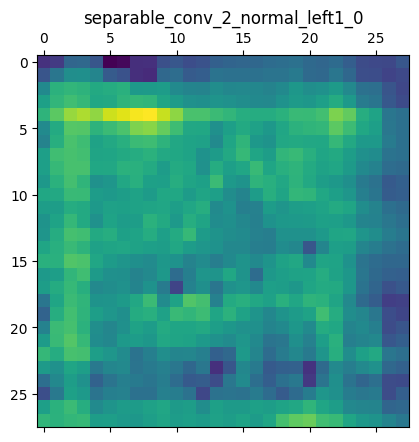

separable_conv_2_normal_right1_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

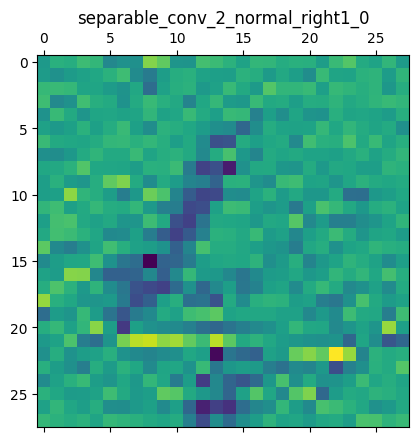

separable_conv_2_normal_left2_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

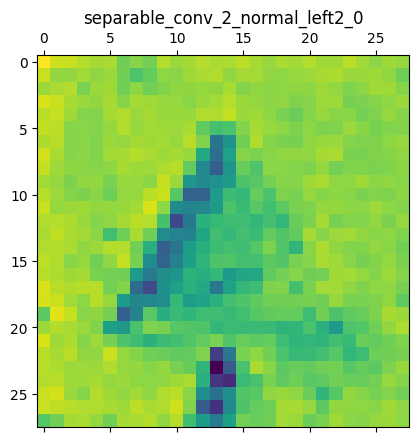

separable_conv_2_normal_right2_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

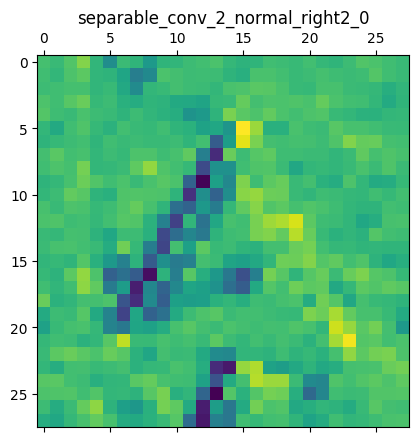

separable_conv_2_normal_left5_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

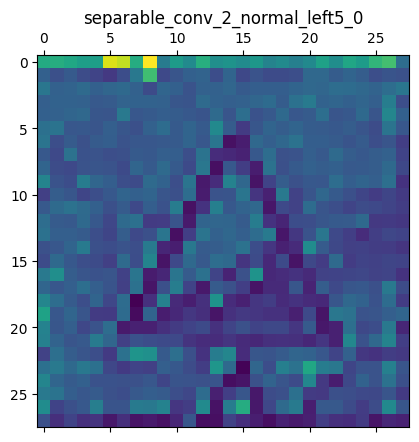

separable_conv_2_bn_normal_left1_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

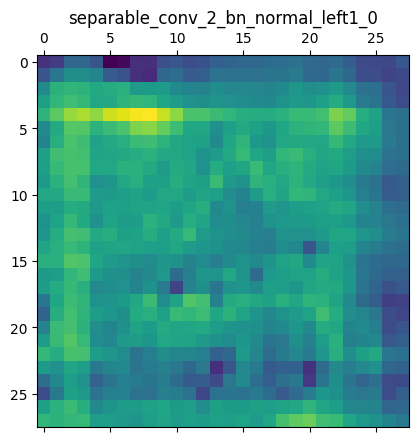

separable_conv_2_bn_normal_right1_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

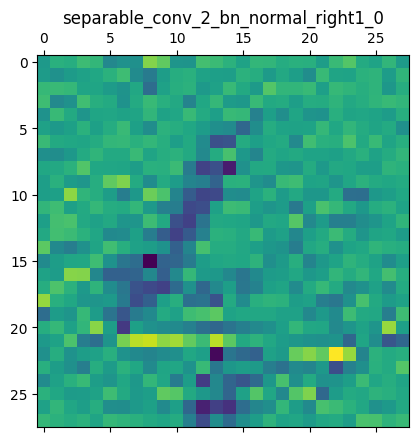

separable_conv_2_bn_normal_left2_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

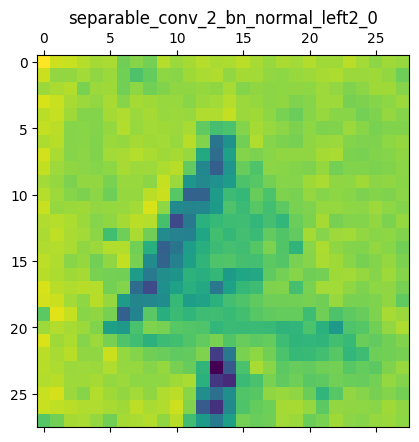

separable_conv_2_bn_normal_right2_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

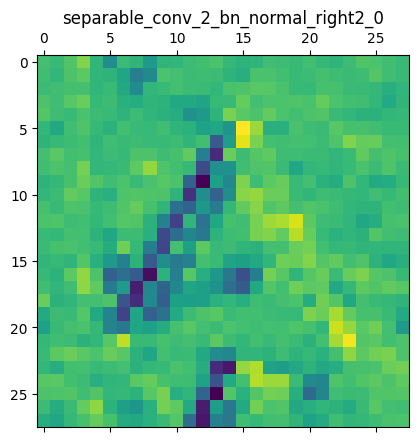

normal_left3_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

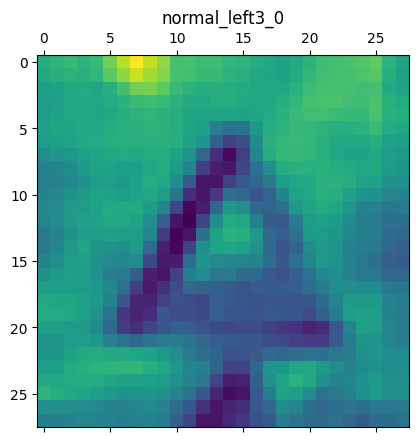

normal_left4_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

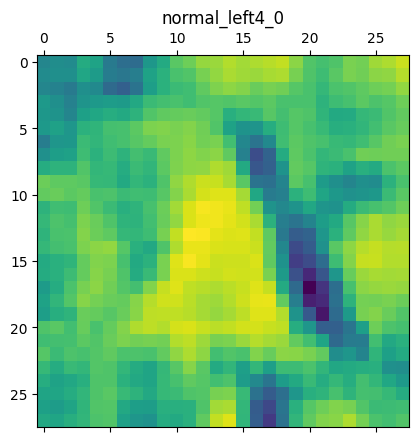

normal_right4_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

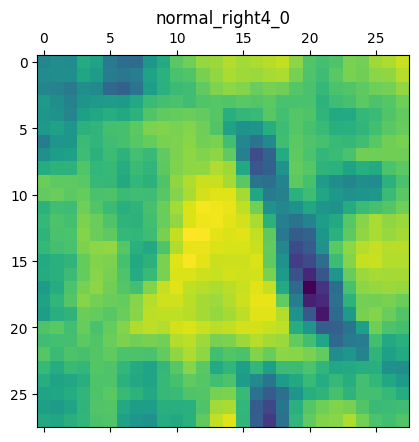

separable_conv_2_bn_normal_left5_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

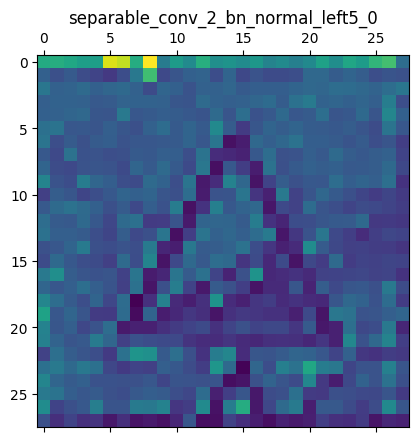

normal_add_1_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

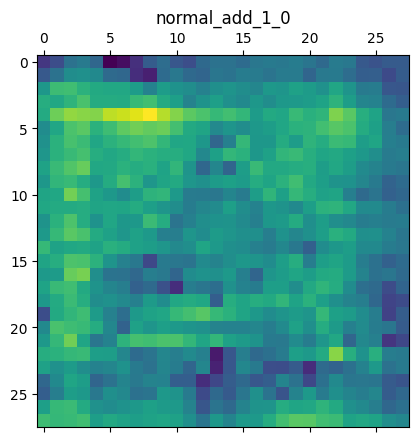

normal_add_2_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

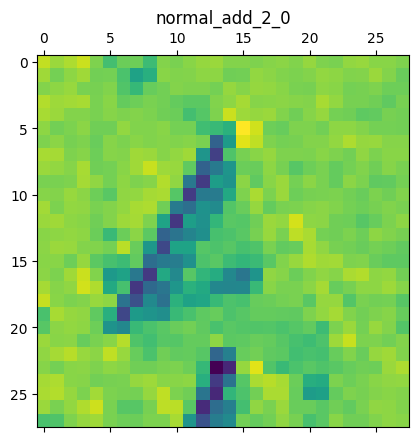

normal_add_3_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

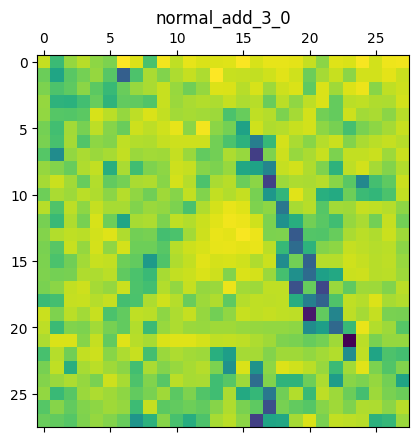

normal_add_4_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

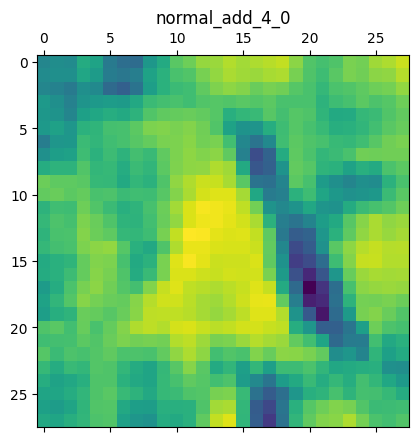

normal_add_5_0 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

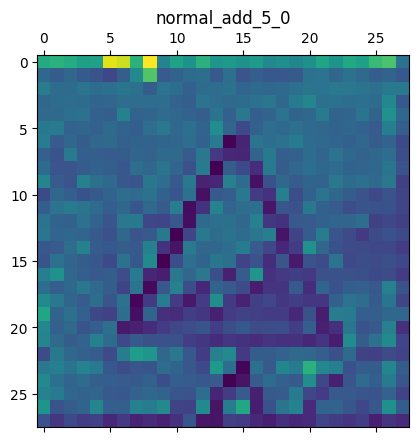

normal_concat_0 (1, 28, 28, 264)


<Figure size 640x480 with 0 Axes>

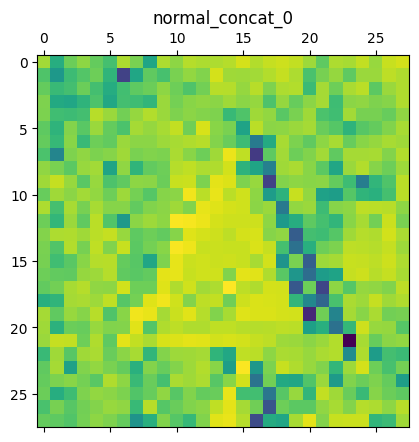

activation_221 (1, 28, 28, 88)


<Figure size 640x480 with 0 Axes>

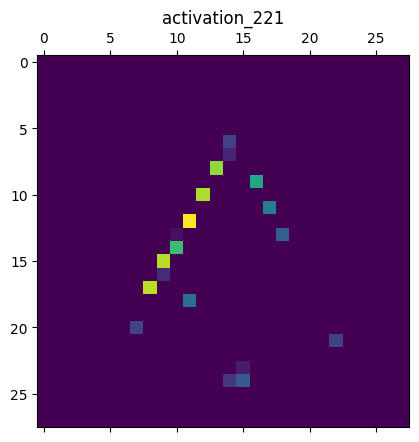

activation_222 (1, 28, 28, 264)


<Figure size 640x480 with 0 Axes>

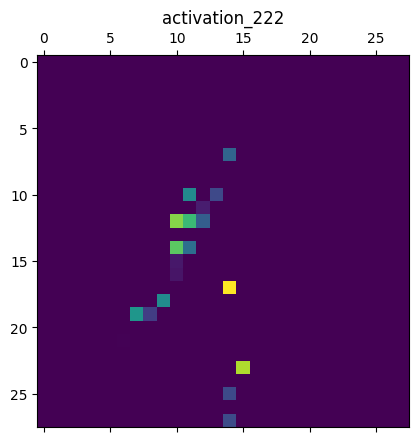

adjust_conv_projection_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

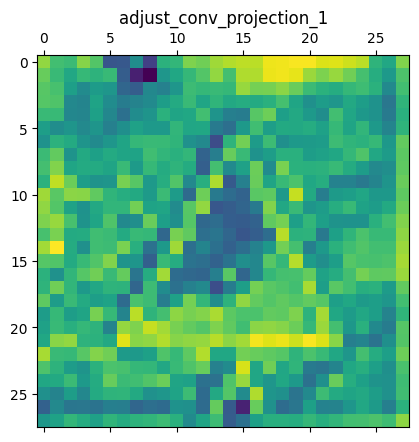

normal_conv_1_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

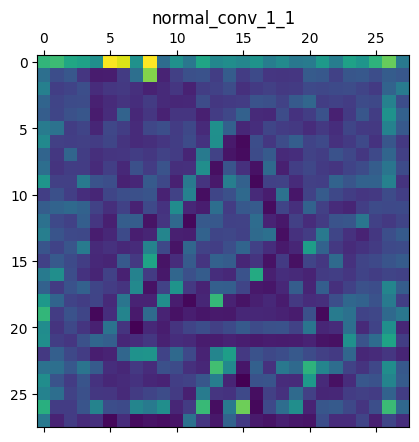

adjust_bn_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

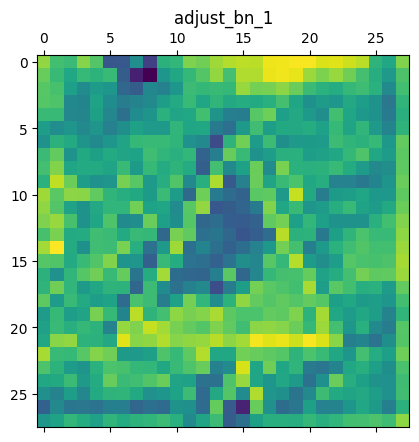

normal_bn_1_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

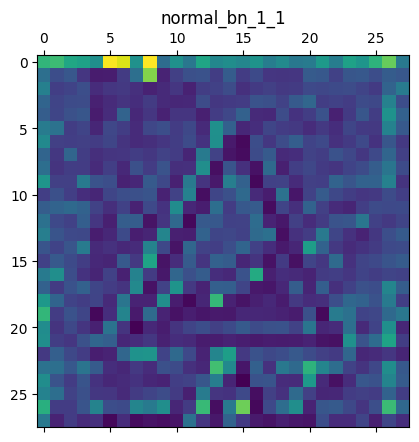

activation_223 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

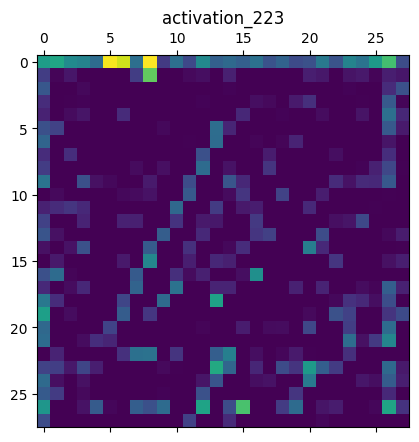

activation_225 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

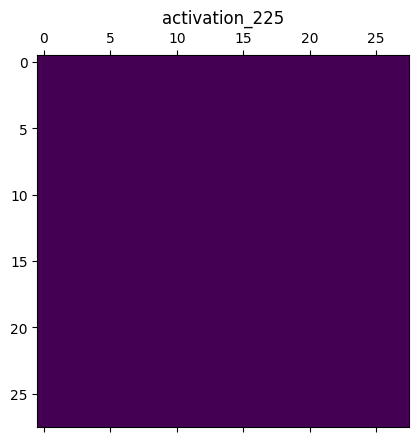

activation_227 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

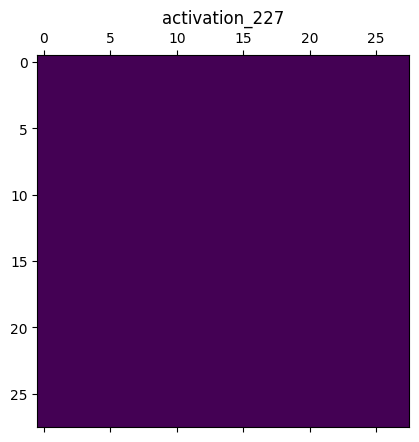

activation_229 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

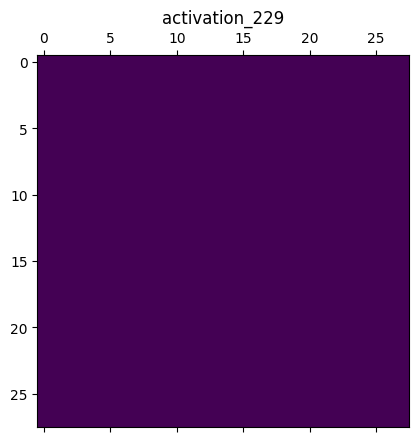

activation_231 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

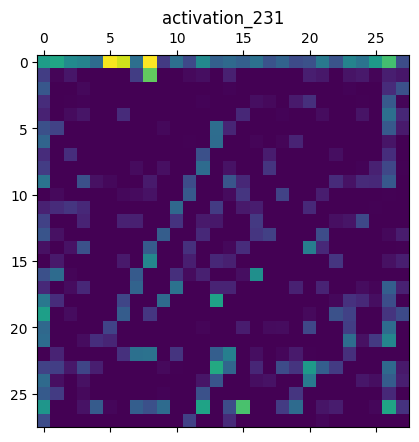

separable_conv_1_normal_left1_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

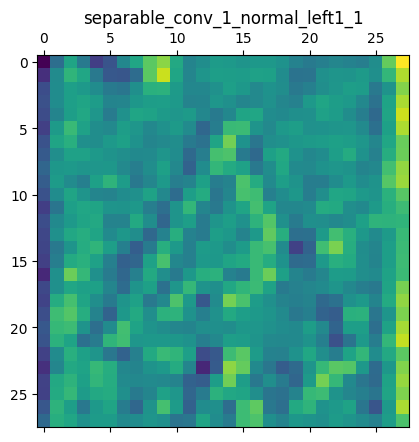

separable_conv_1_normal_right1_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

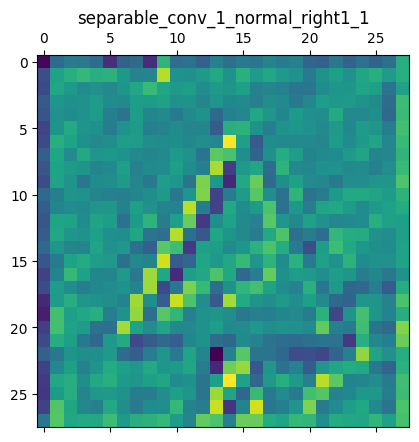

separable_conv_1_normal_left2_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

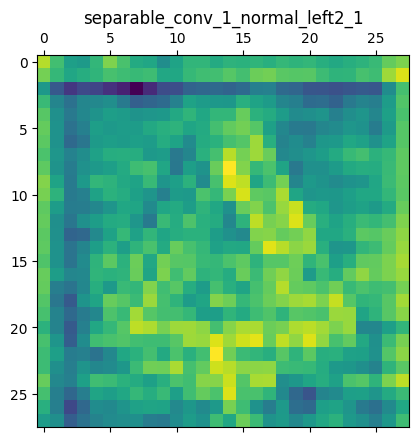

separable_conv_1_normal_right2_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

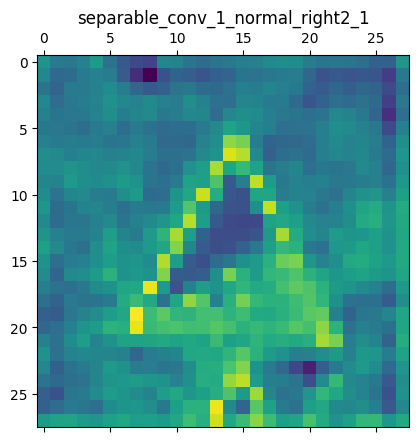

separable_conv_1_normal_left5_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

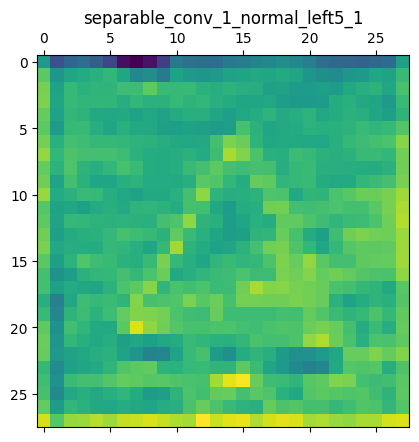

separable_conv_1_bn_normal_left1_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

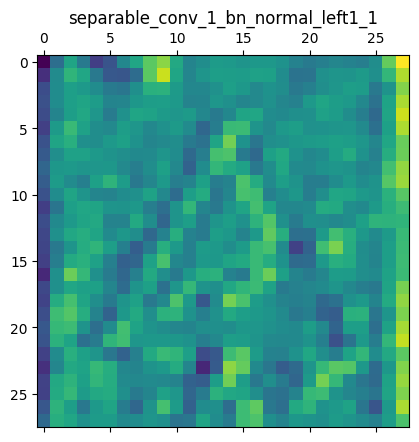

separable_conv_1_bn_normal_right1_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

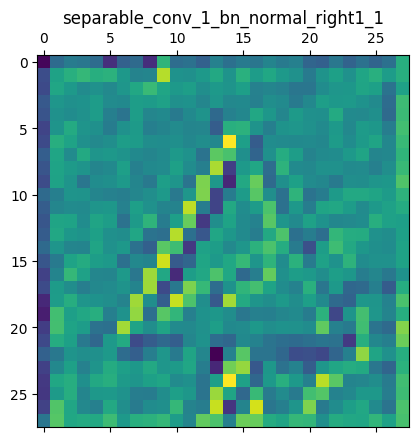

separable_conv_1_bn_normal_left2_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

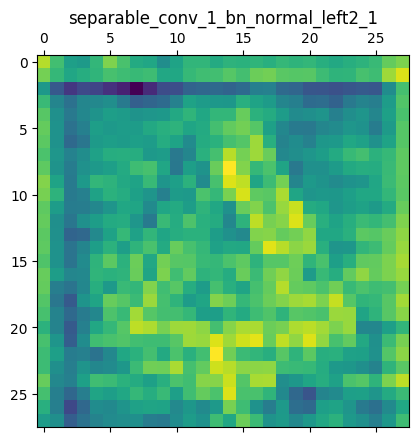

separable_conv_1_bn_normal_right2_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

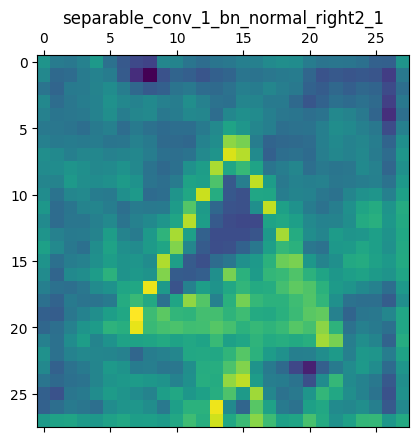

separable_conv_1_bn_normal_left5_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

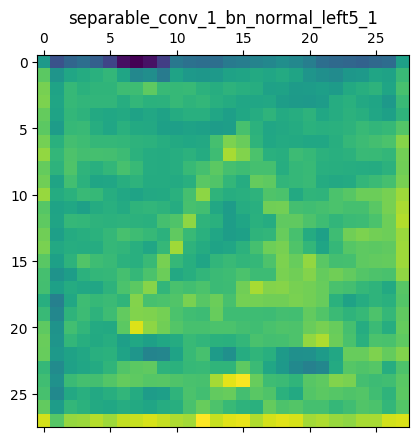

activation_224 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

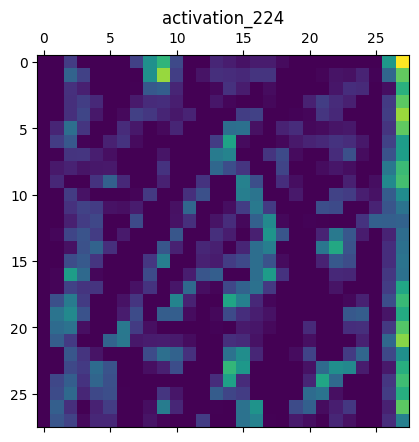

activation_226 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

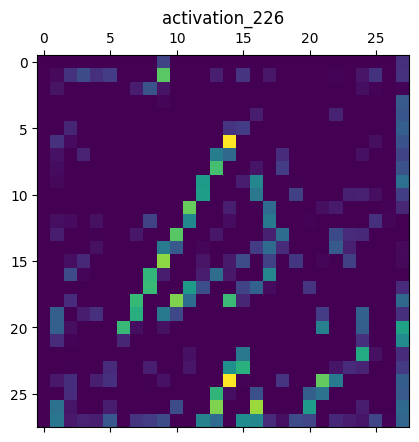

activation_228 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

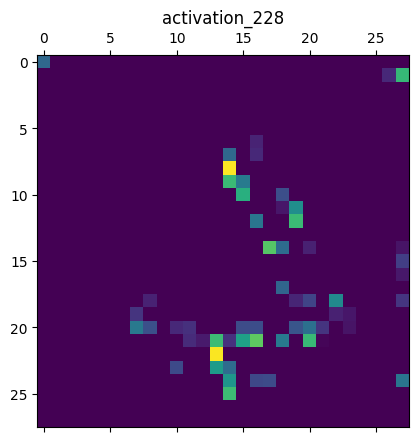

activation_230 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

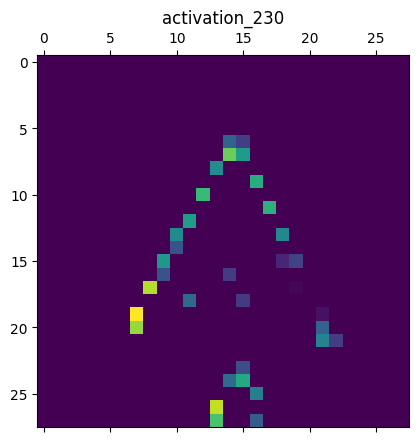

activation_232 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

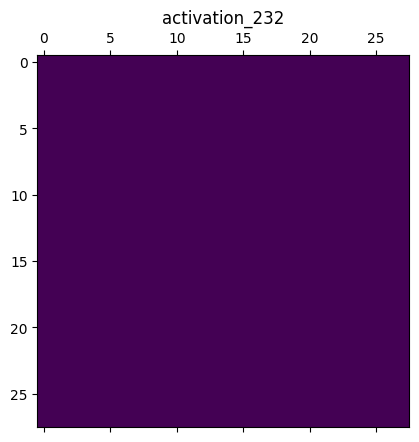

separable_conv_2_normal_left1_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

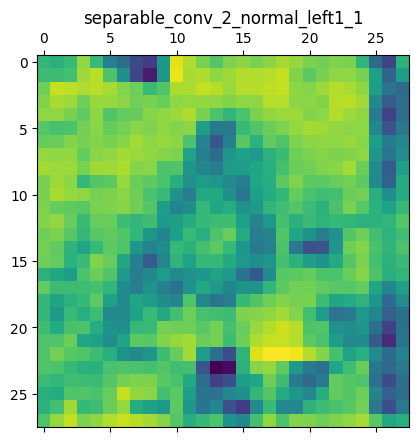

separable_conv_2_normal_right1_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

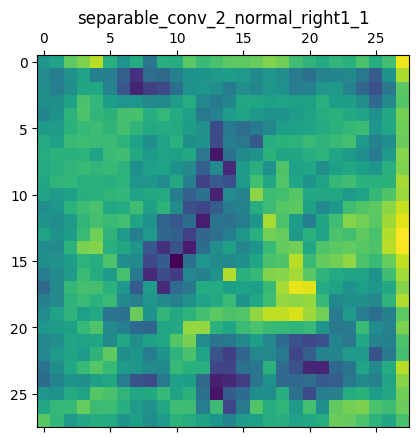

separable_conv_2_normal_left2_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

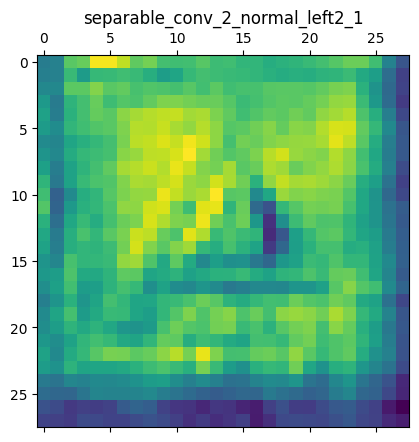

separable_conv_2_normal_right2_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

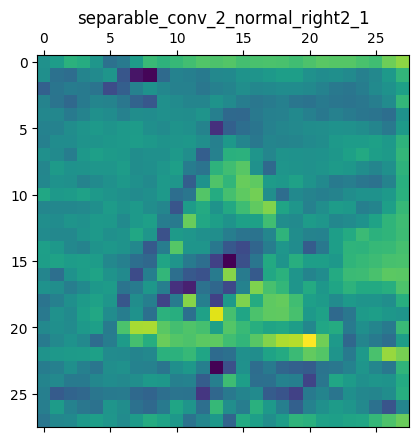

separable_conv_2_normal_left5_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

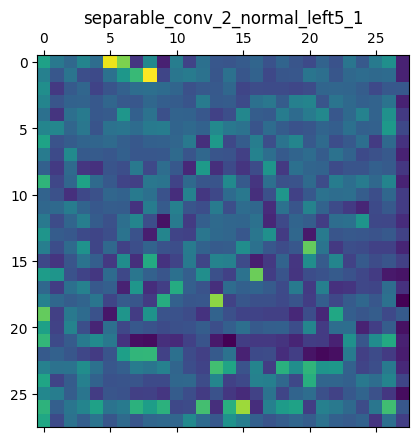

separable_conv_2_bn_normal_left1_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

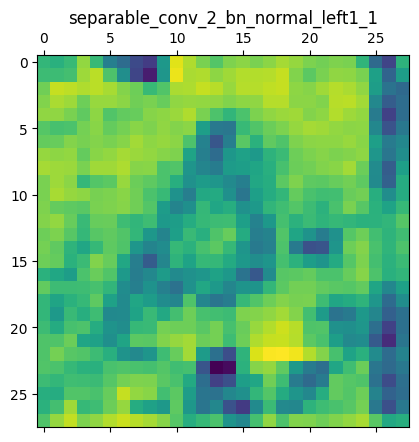

separable_conv_2_bn_normal_right1_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

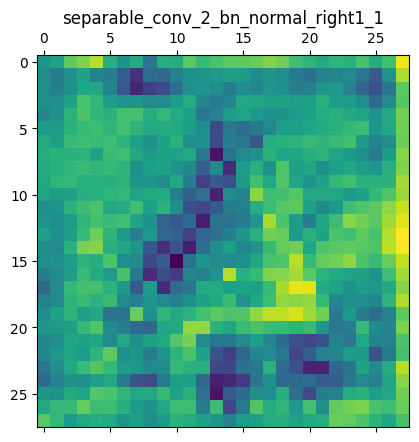

separable_conv_2_bn_normal_left2_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

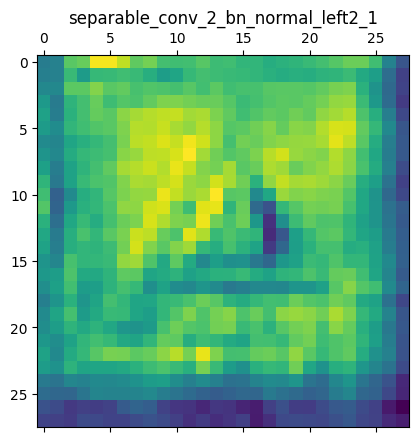

separable_conv_2_bn_normal_right2_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

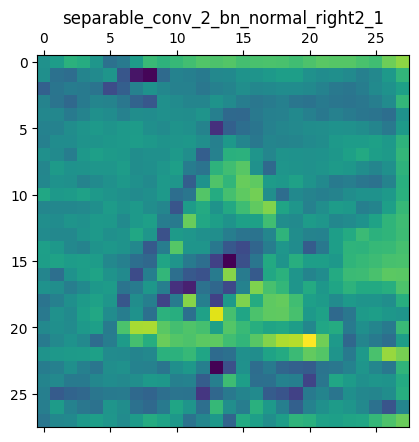

normal_left3_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

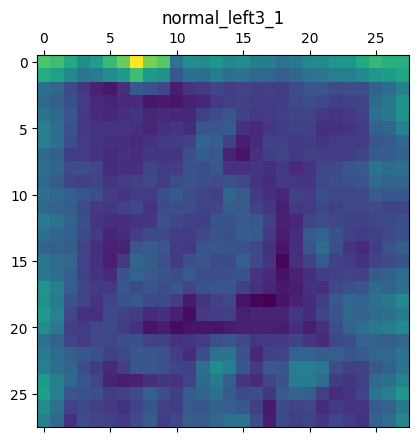

normal_left4_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

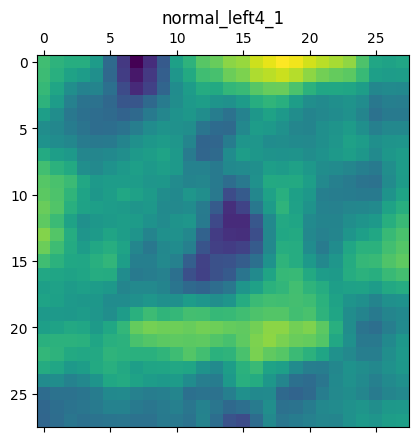

normal_right4_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

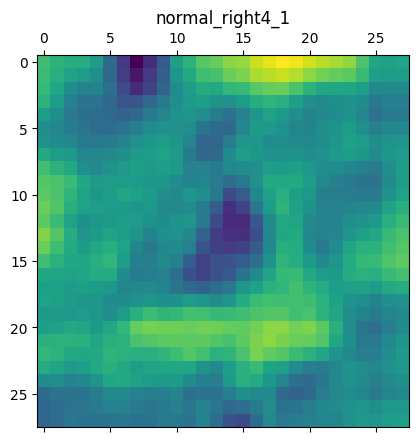

separable_conv_2_bn_normal_left5_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

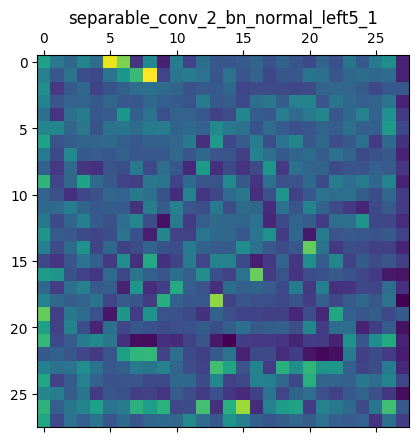

normal_add_1_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

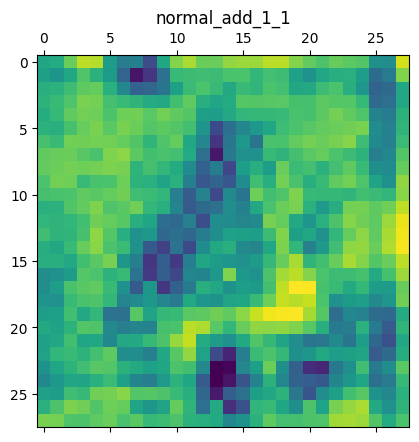

normal_add_2_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

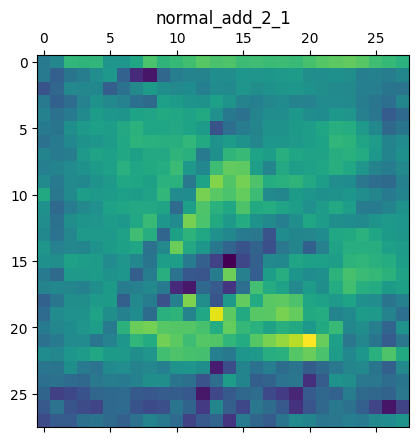

normal_add_3_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

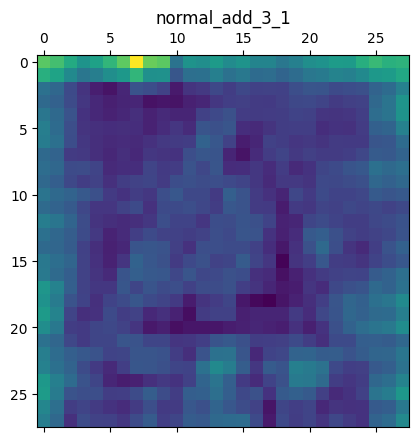

normal_add_4_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

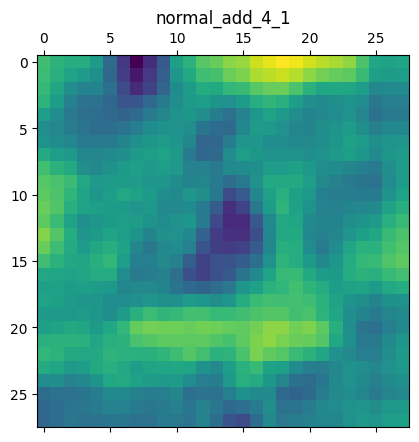

normal_add_5_1 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

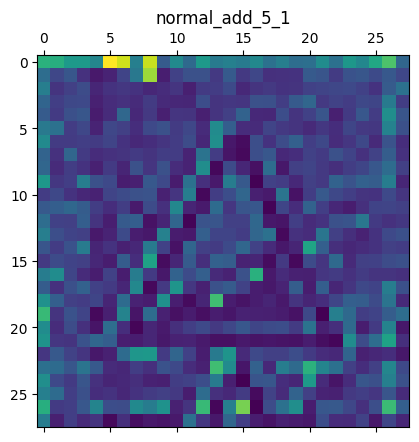

normal_concat_1 (1, 28, 28, 264)


<Figure size 640x480 with 0 Axes>

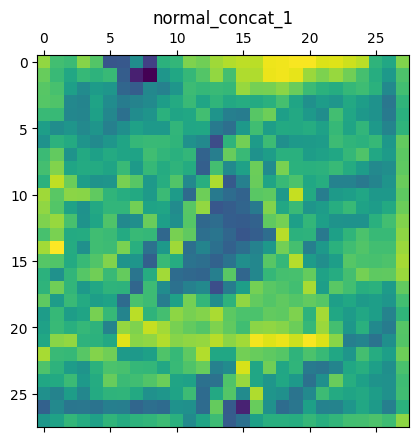

activation_233 (1, 28, 28, 264)


<Figure size 640x480 with 0 Axes>

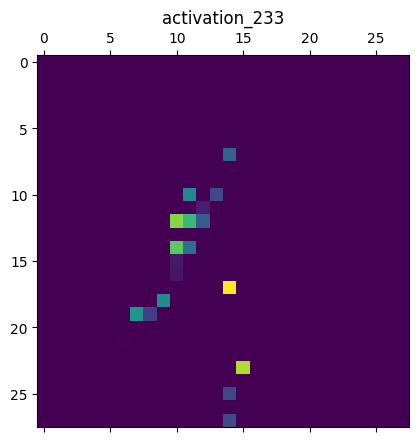

activation_234 (1, 28, 28, 264)


<Figure size 640x480 with 0 Axes>

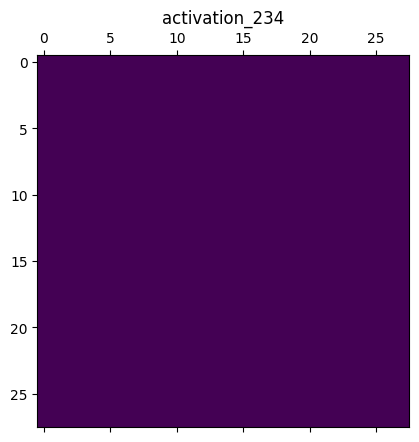

adjust_conv_projection_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

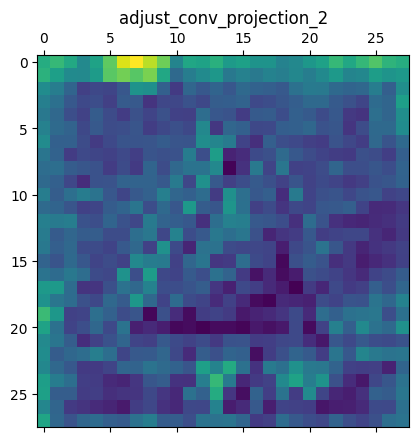

normal_conv_1_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

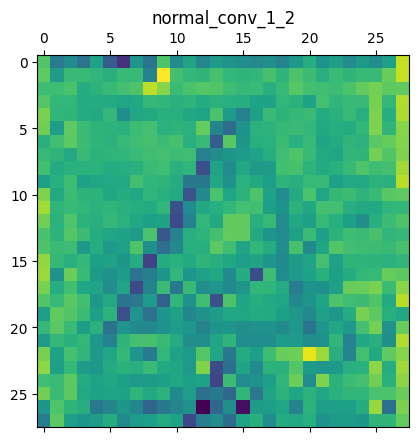

adjust_bn_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

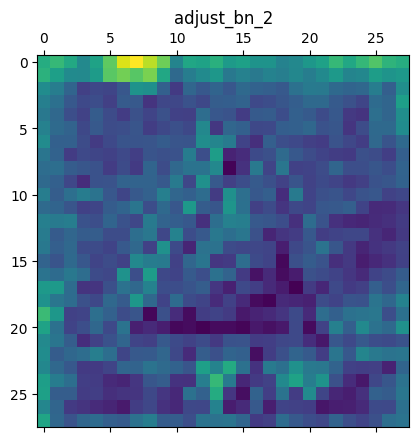

normal_bn_1_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

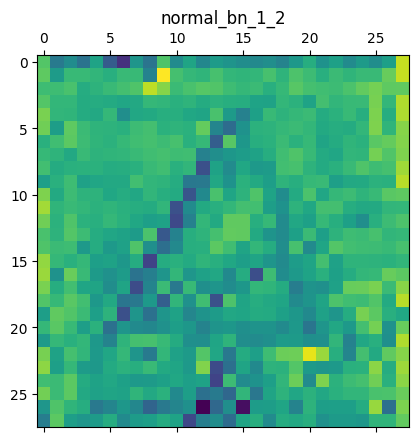

activation_235 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

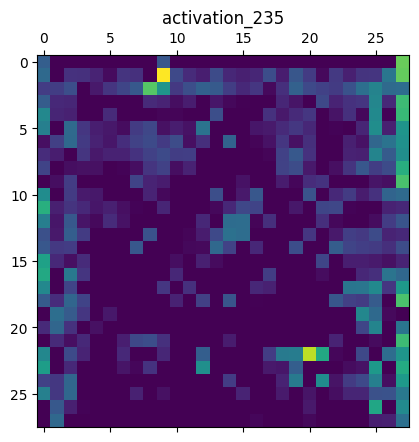

activation_237 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

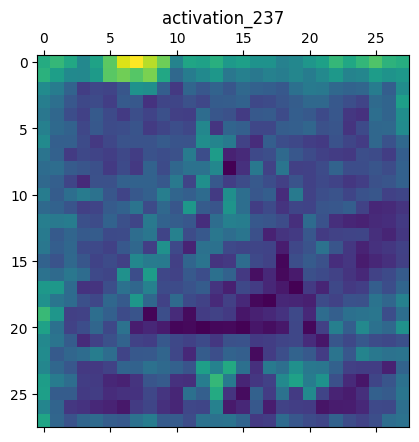

activation_239 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

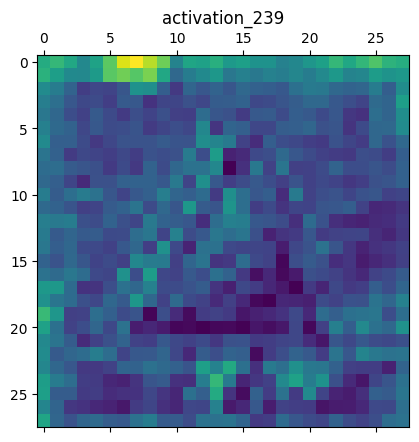

activation_241 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

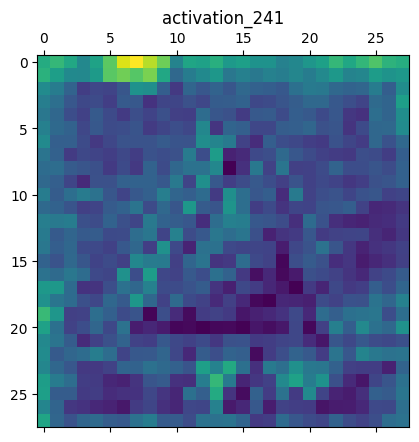

activation_243 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

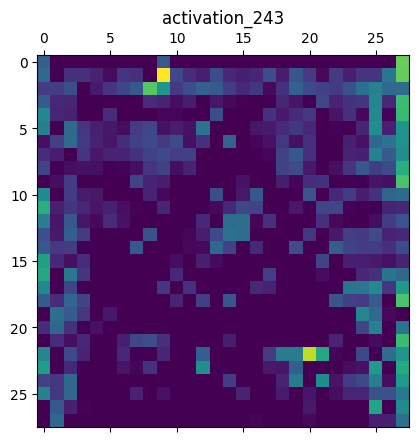

separable_conv_1_normal_left1_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

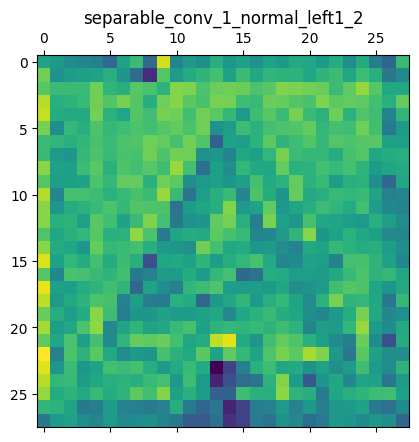

separable_conv_1_normal_right1_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

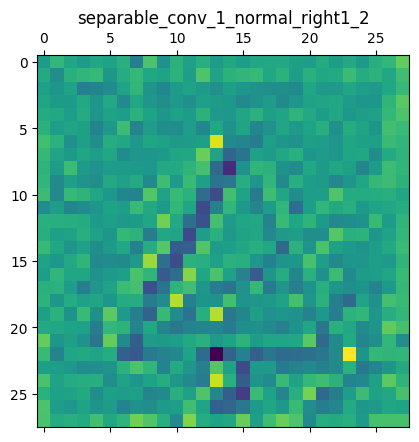

separable_conv_1_normal_left2_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

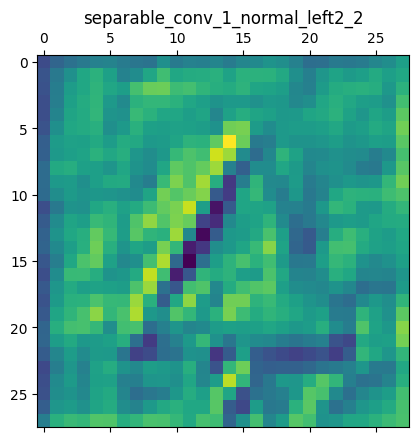

separable_conv_1_normal_right2_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

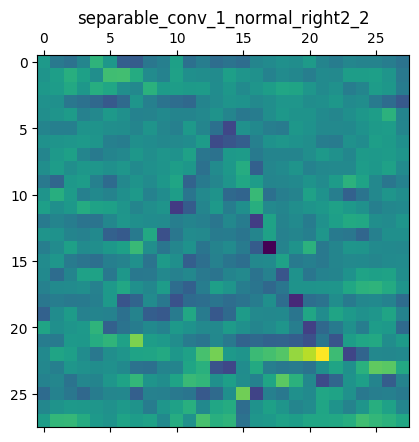

separable_conv_1_normal_left5_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

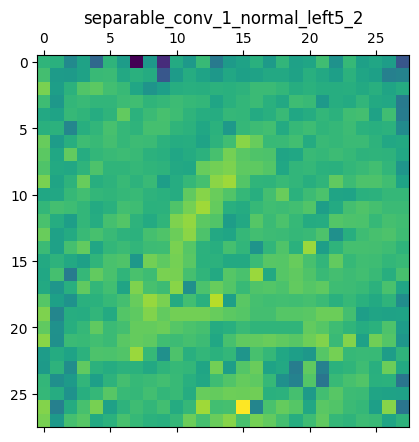

separable_conv_1_bn_normal_left1_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

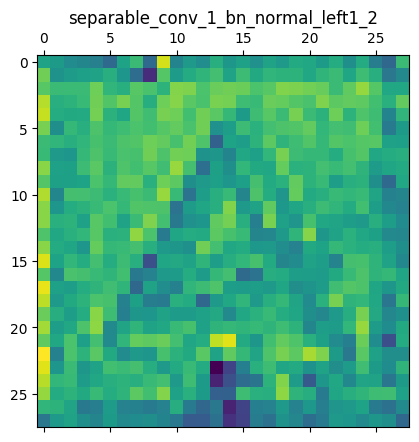

separable_conv_1_bn_normal_right1_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

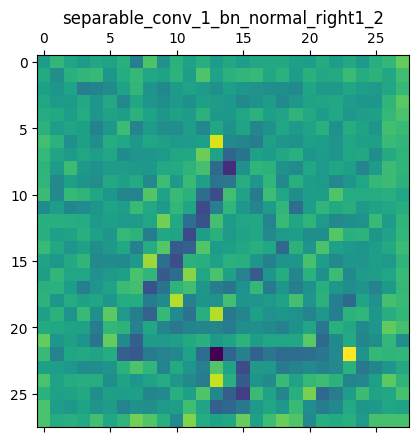

separable_conv_1_bn_normal_left2_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

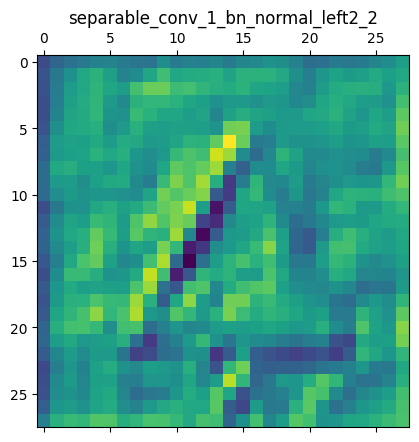

separable_conv_1_bn_normal_right2_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

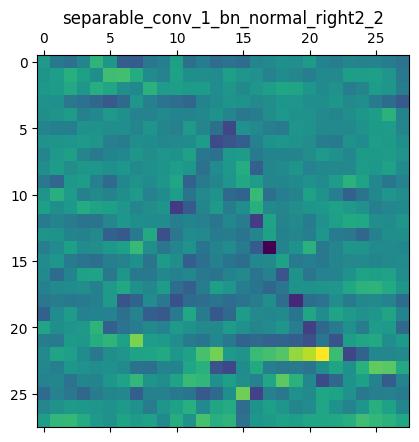

separable_conv_1_bn_normal_left5_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

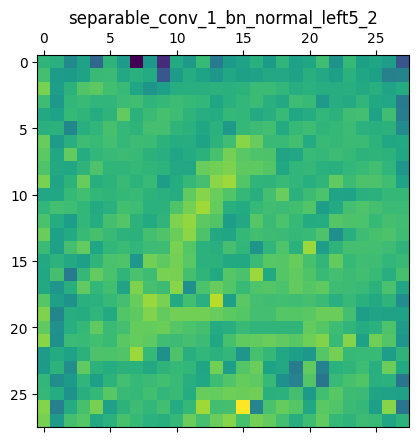

activation_236 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

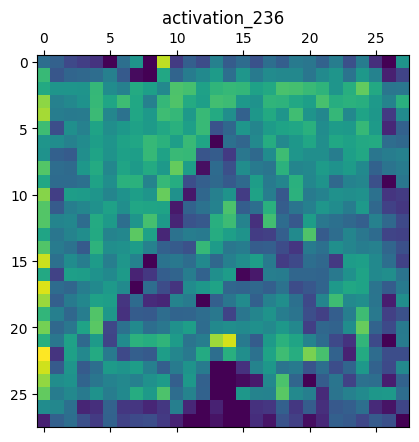

activation_238 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

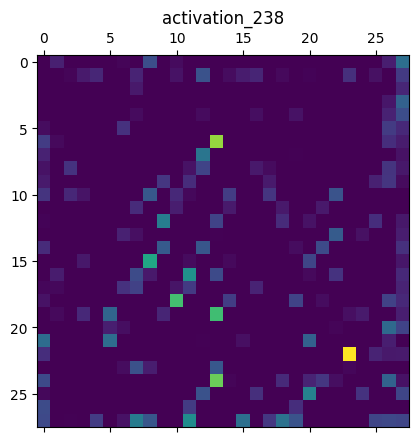

activation_240 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

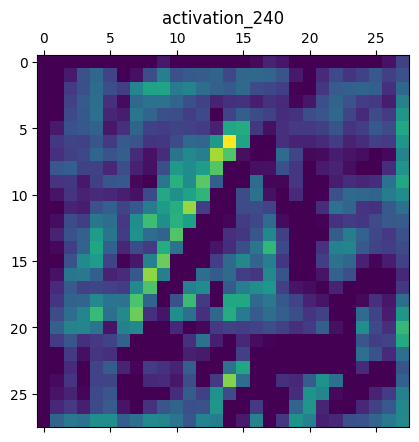

activation_242 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

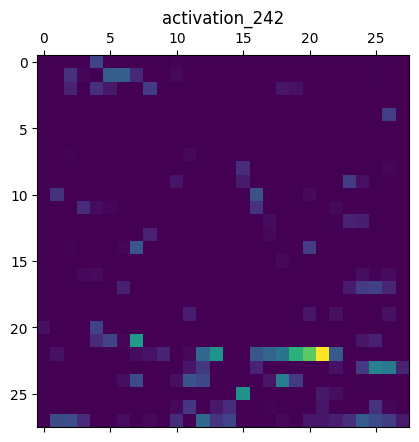

activation_244 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

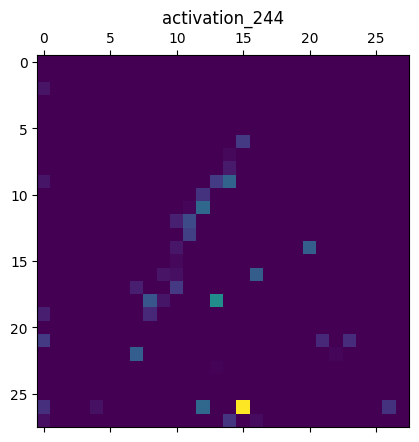

separable_conv_2_normal_left1_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

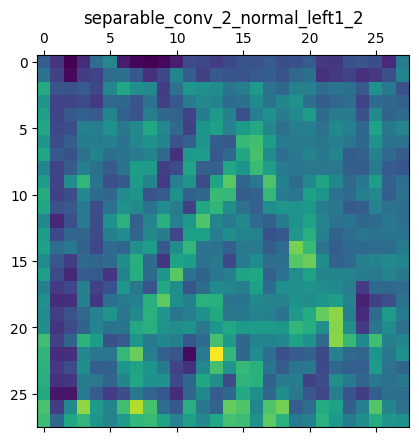

separable_conv_2_normal_right1_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

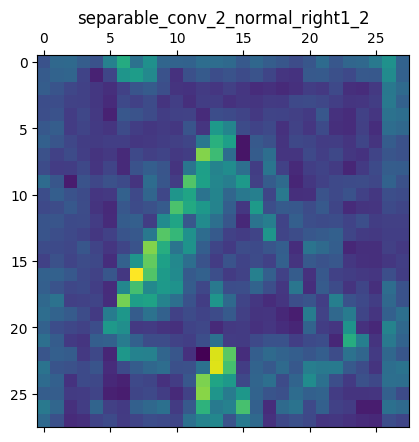

separable_conv_2_normal_left2_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

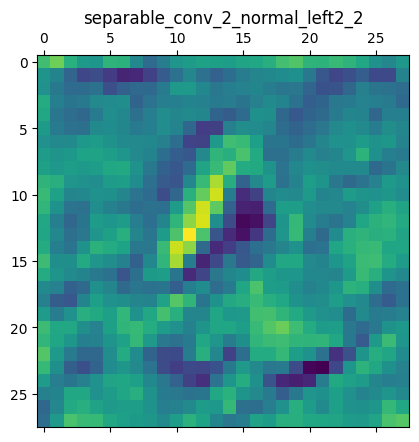

separable_conv_2_normal_right2_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

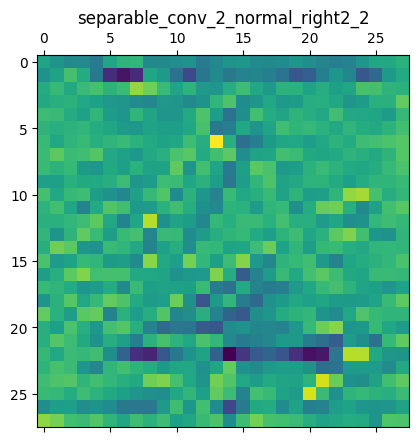

separable_conv_2_normal_left5_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

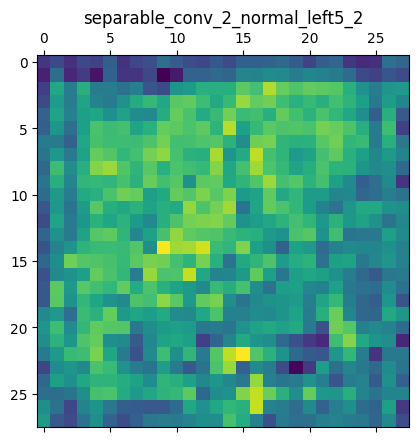

separable_conv_2_bn_normal_left1_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

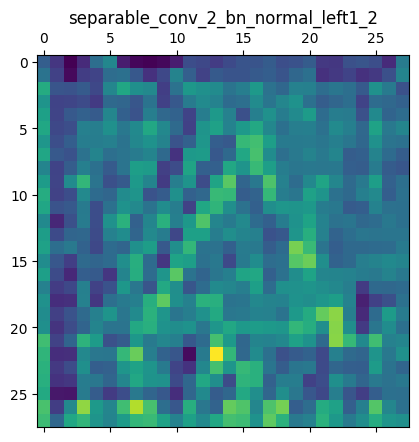

separable_conv_2_bn_normal_right1_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

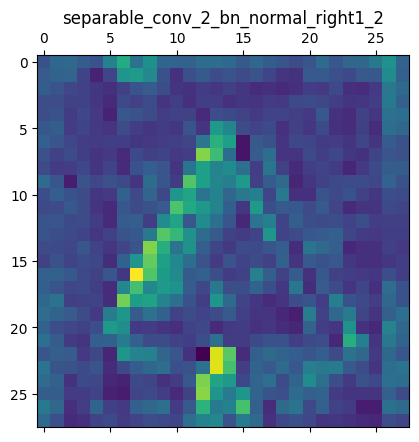

separable_conv_2_bn_normal_left2_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

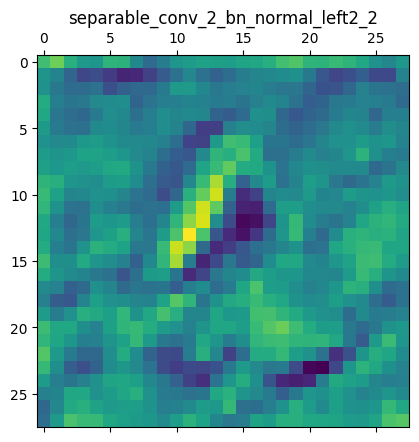

separable_conv_2_bn_normal_right2_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

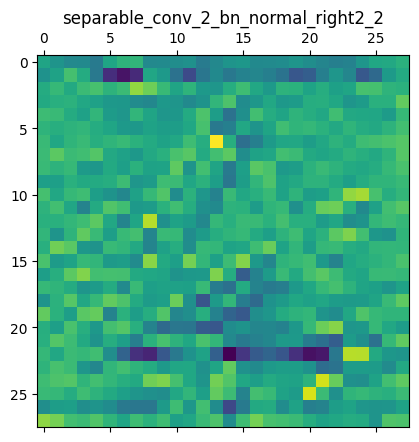

normal_left3_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

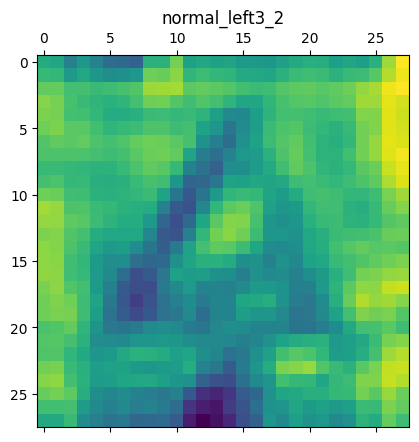

normal_left4_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

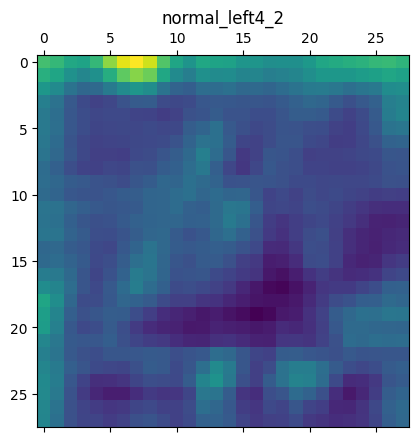

normal_right4_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

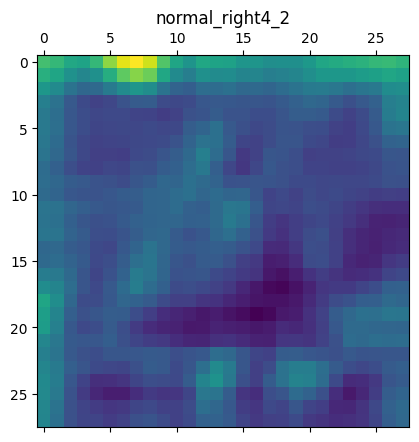

separable_conv_2_bn_normal_left5_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

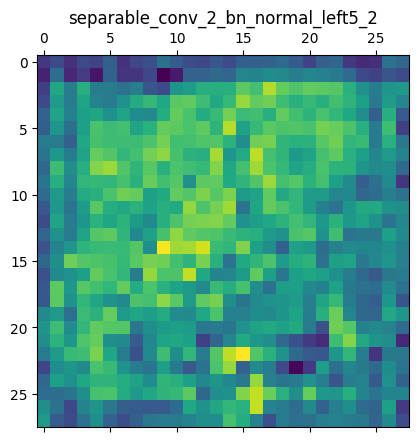

normal_add_1_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

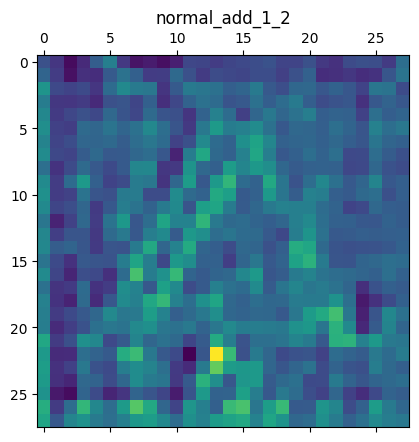

normal_add_2_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

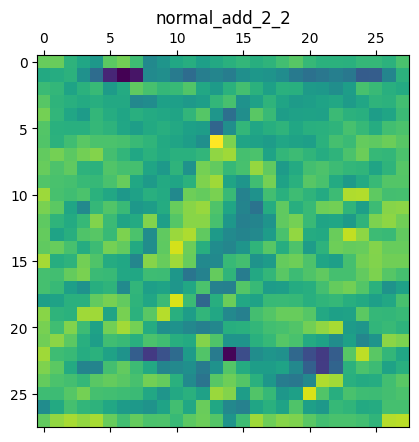

normal_add_3_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

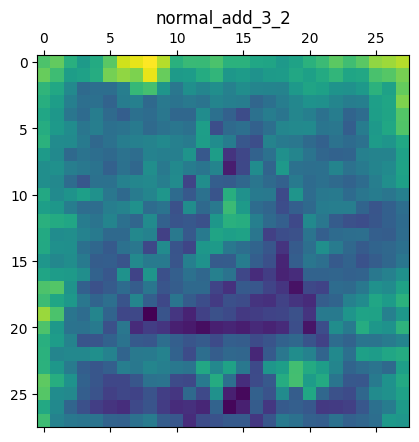

normal_add_4_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

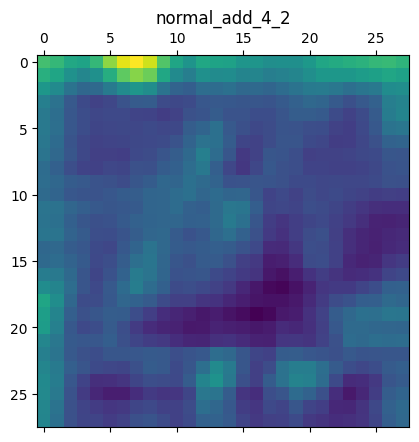

normal_add_5_2 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

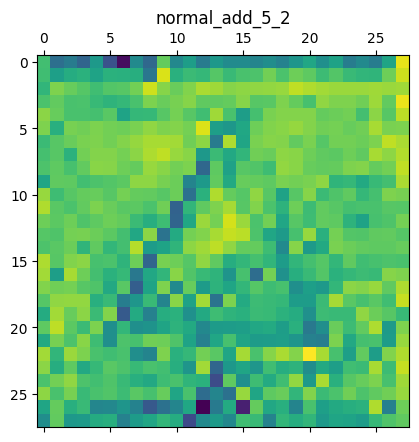

normal_concat_2 (1, 28, 28, 264)


<Figure size 640x480 with 0 Axes>

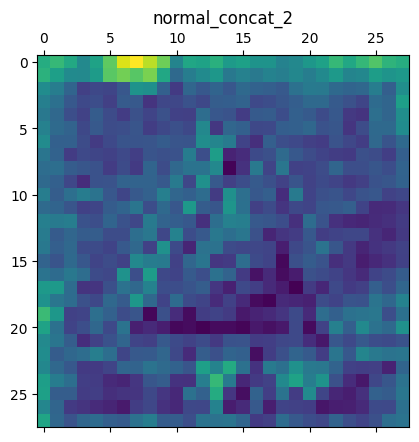

activation_245 (1, 28, 28, 264)


<Figure size 640x480 with 0 Axes>

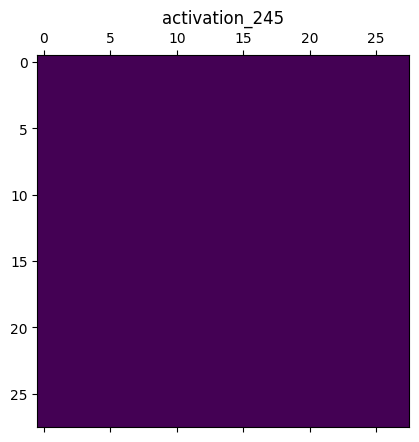

activation_246 (1, 28, 28, 264)


<Figure size 640x480 with 0 Axes>

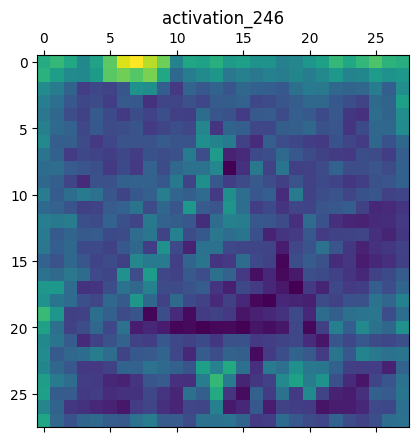

adjust_conv_projection_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

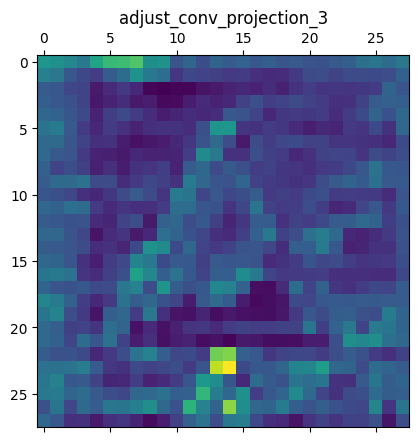

normal_conv_1_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

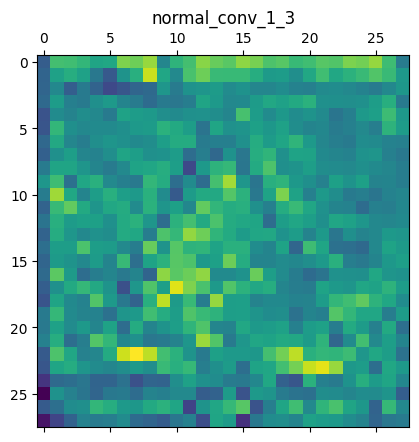

adjust_bn_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

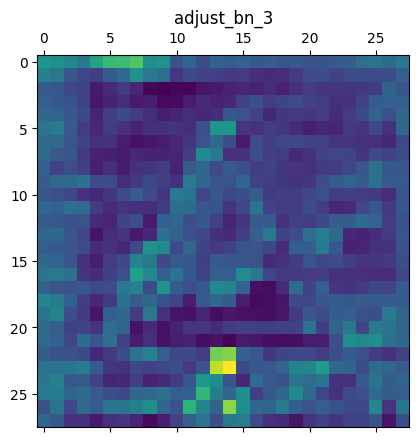

normal_bn_1_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

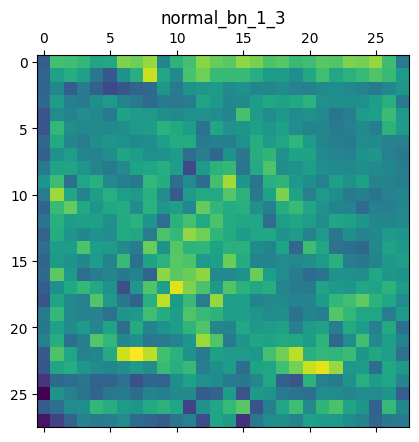

activation_247 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

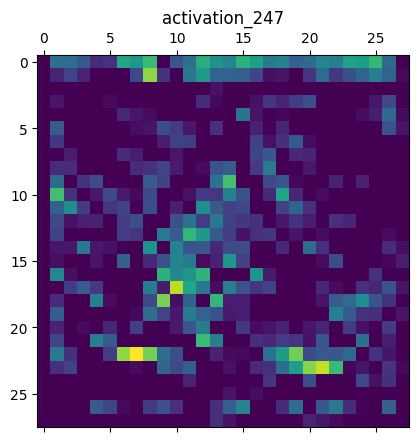

activation_249 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

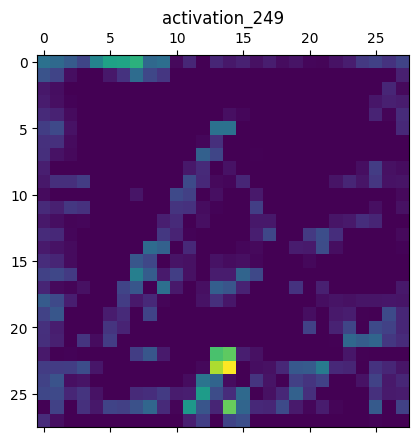

activation_251 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

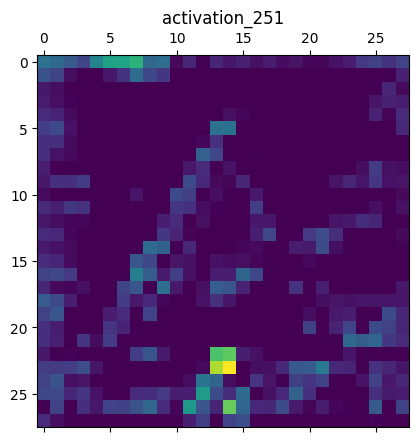

activation_253 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

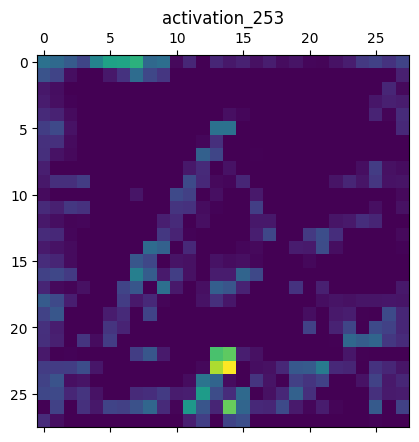

activation_255 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

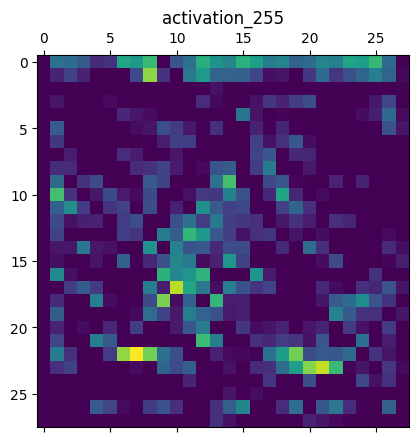

separable_conv_1_normal_left1_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

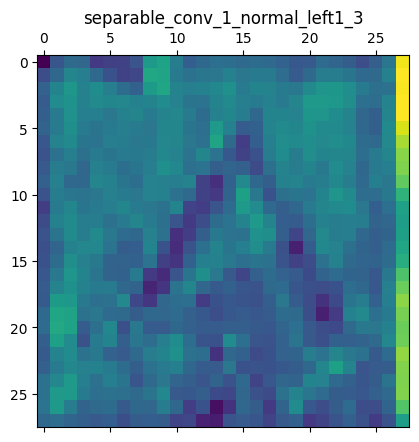

separable_conv_1_normal_right1_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

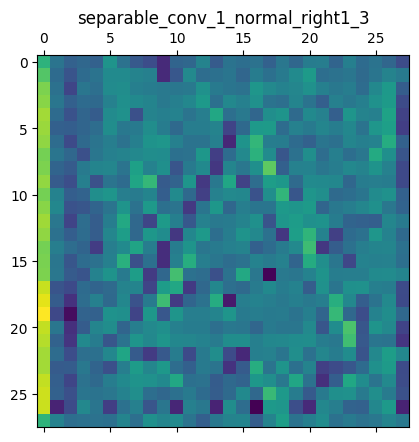

separable_conv_1_normal_left2_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

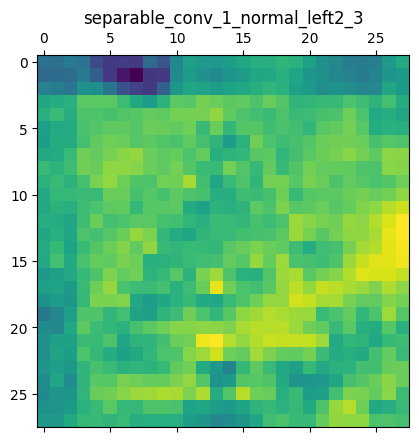

separable_conv_1_normal_right2_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

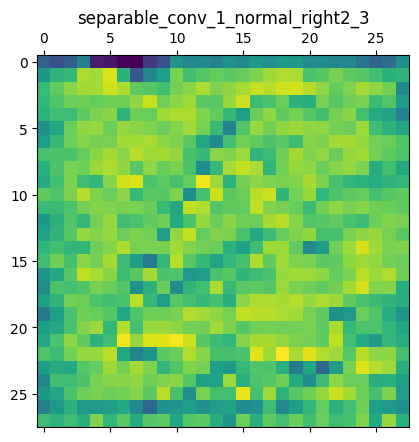

separable_conv_1_normal_left5_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

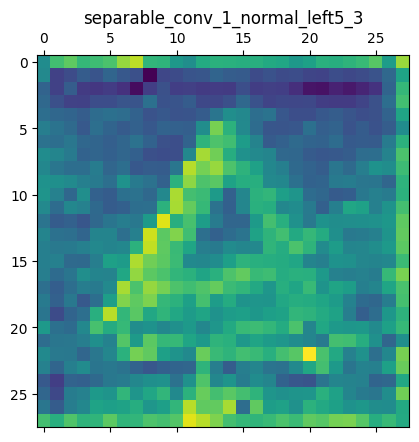

separable_conv_1_bn_normal_left1_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

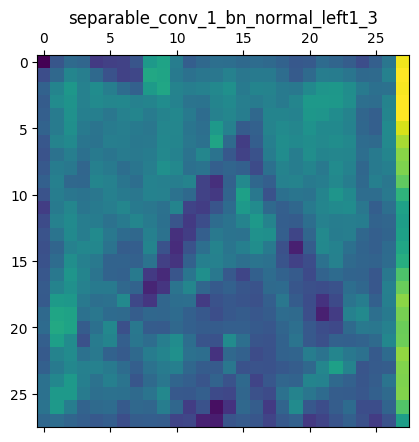

separable_conv_1_bn_normal_right1_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

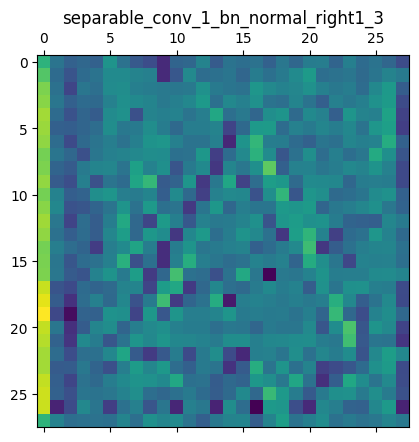

separable_conv_1_bn_normal_left2_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

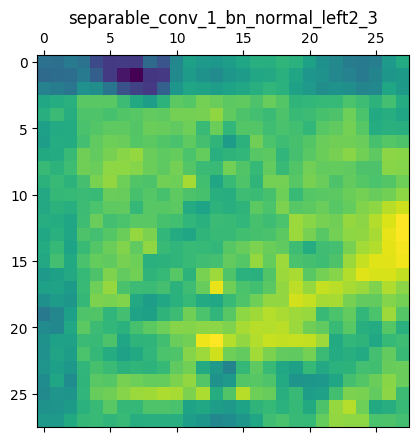

separable_conv_1_bn_normal_right2_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

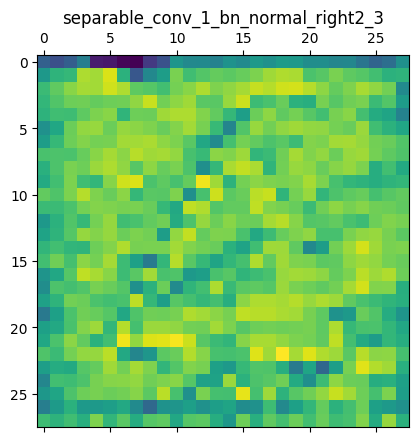

separable_conv_1_bn_normal_left5_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

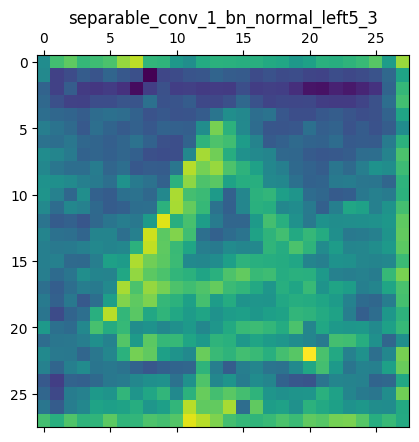

activation_248 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

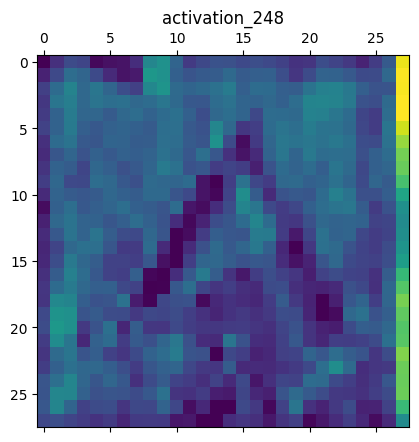

activation_250 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

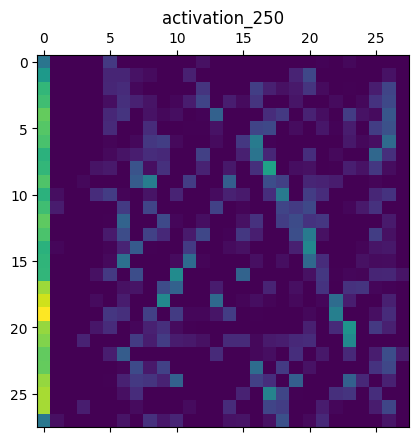

activation_252 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

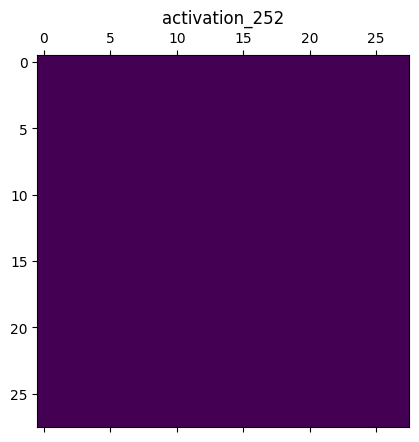

activation_254 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

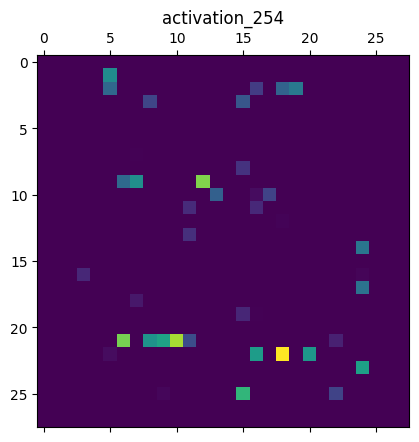

activation_256 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

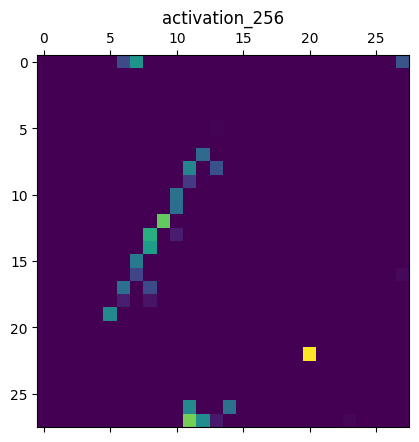

separable_conv_2_normal_left1_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

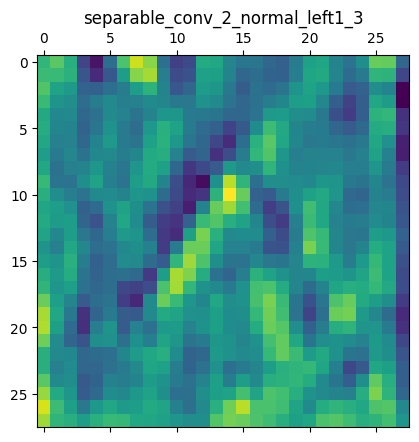

separable_conv_2_normal_right1_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

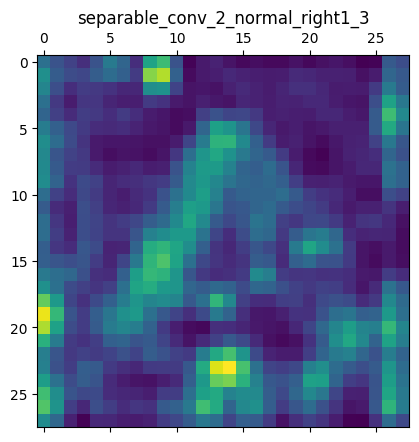

separable_conv_2_normal_left2_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

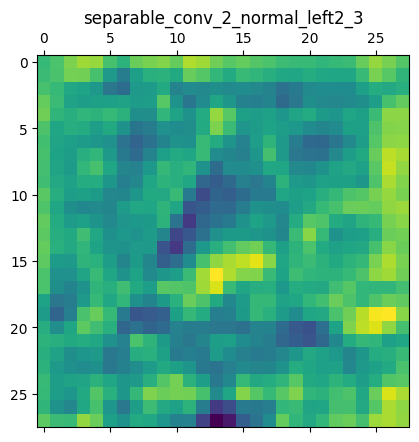

separable_conv_2_normal_right2_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

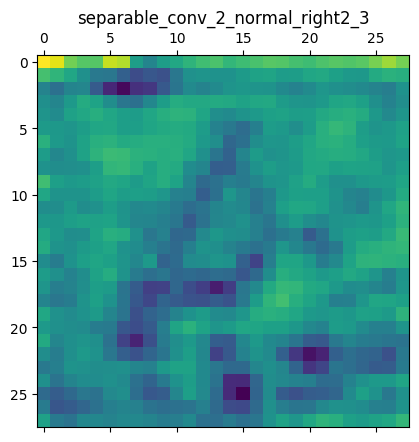

separable_conv_2_normal_left5_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

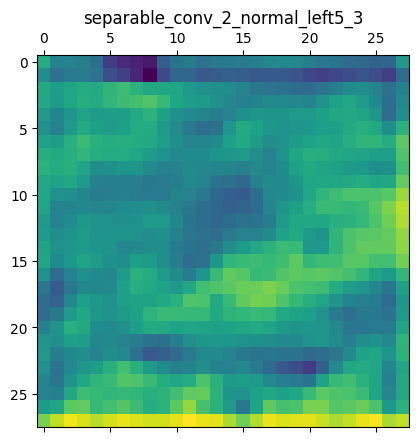

separable_conv_2_bn_normal_left1_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

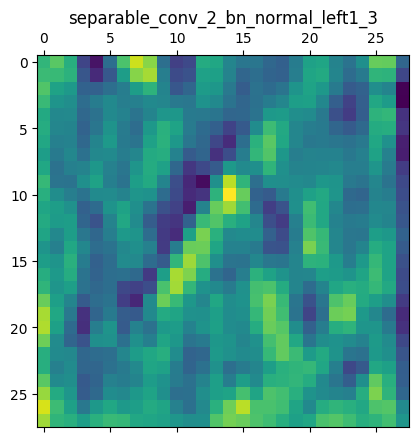

separable_conv_2_bn_normal_right1_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

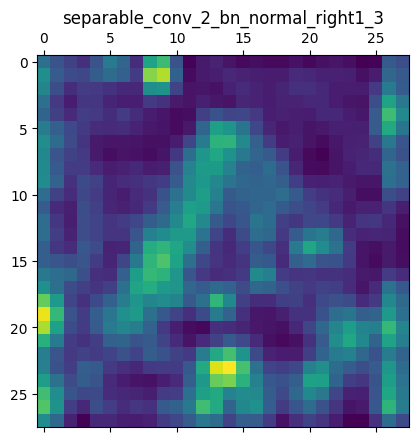

separable_conv_2_bn_normal_left2_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

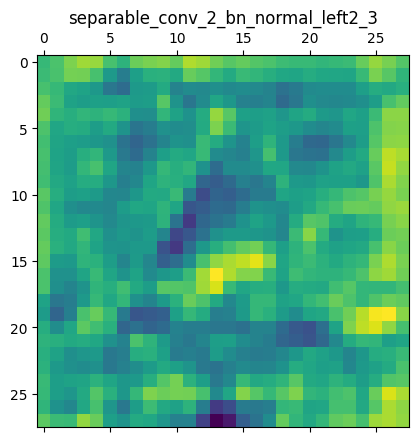

separable_conv_2_bn_normal_right2_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

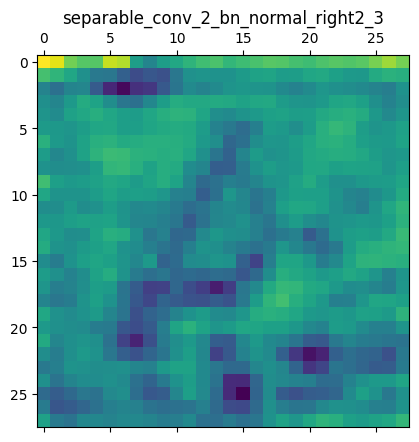

normal_left3_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

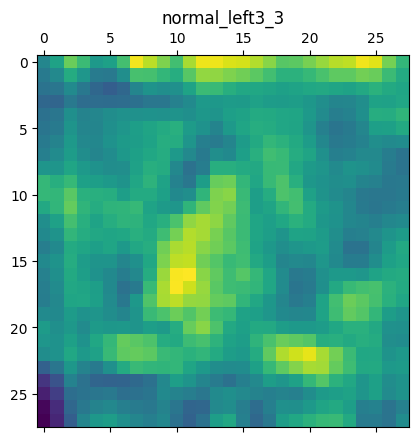

normal_left4_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

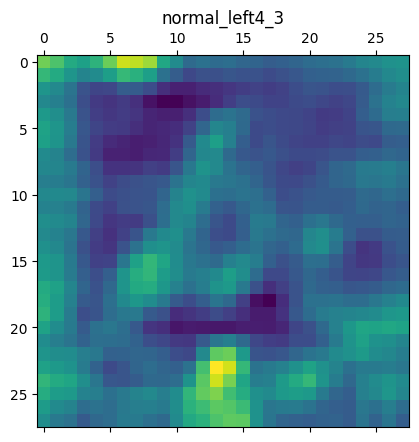

normal_right4_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

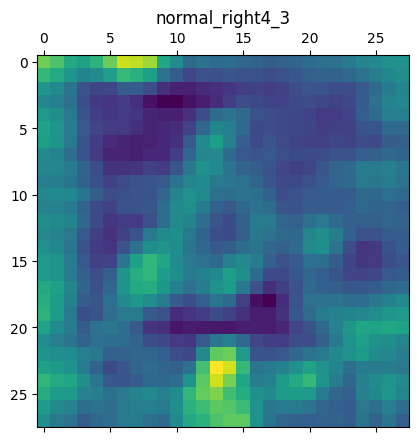

separable_conv_2_bn_normal_left5_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

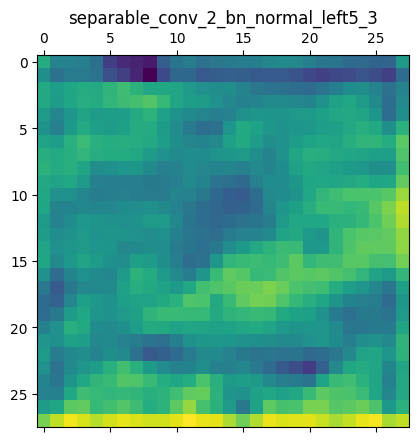

normal_add_1_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

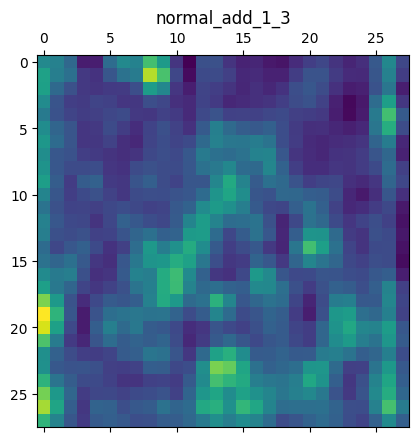

normal_add_2_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

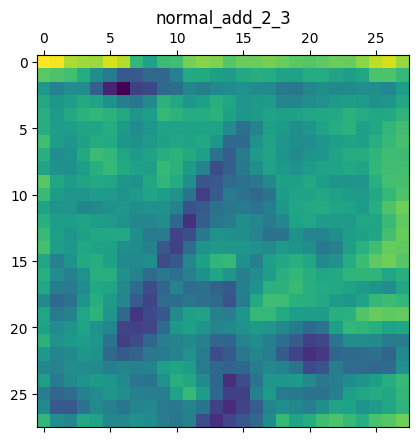

normal_add_3_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

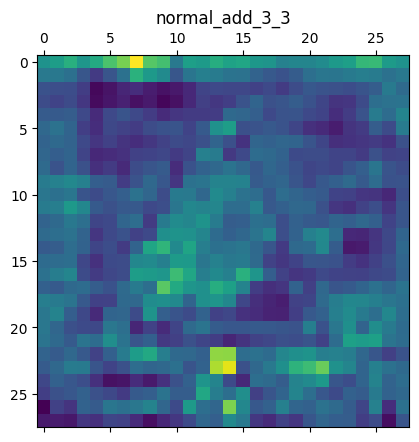

normal_add_4_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

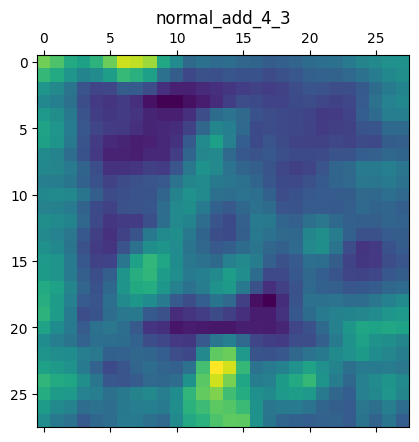

normal_add_5_3 (1, 28, 28, 44)


<Figure size 640x480 with 0 Axes>

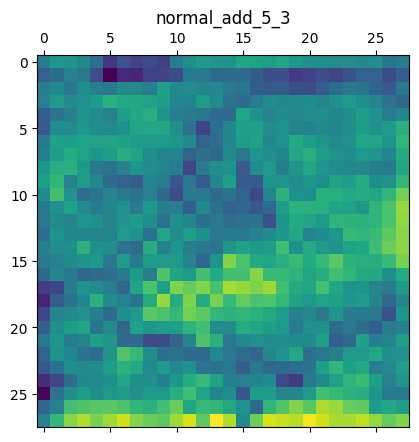

normal_concat_3 (1, 28, 28, 264)


<Figure size 640x480 with 0 Axes>

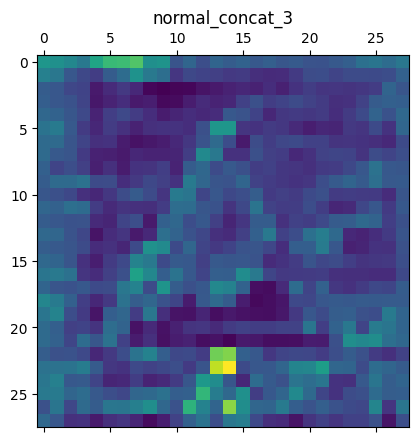

activation_258 (1, 28, 28, 264)


<Figure size 640x480 with 0 Axes>

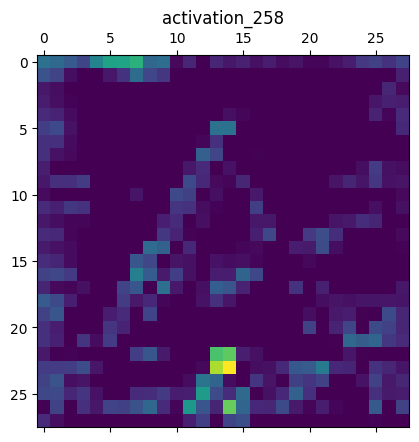

activation_257 (1, 28, 28, 264)


<Figure size 640x480 with 0 Axes>

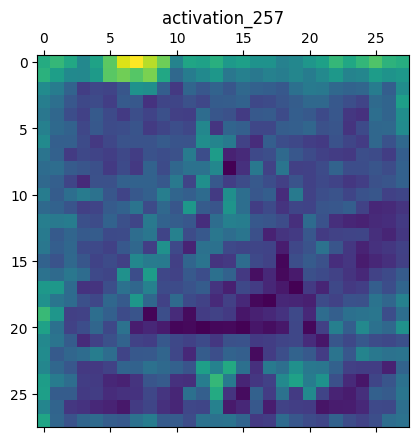

reduction_conv_1_reduce_4 (1, 28, 28, 88)


<Figure size 640x480 with 0 Axes>

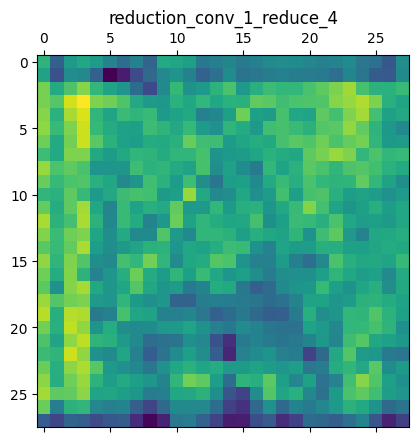

adjust_conv_projection_reduce_4 (1, 28, 28, 88)


<Figure size 640x480 with 0 Axes>

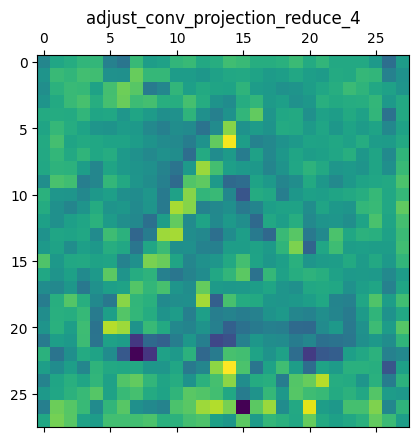

reduction_bn_1_reduce_4 (1, 28, 28, 88)


<Figure size 640x480 with 0 Axes>

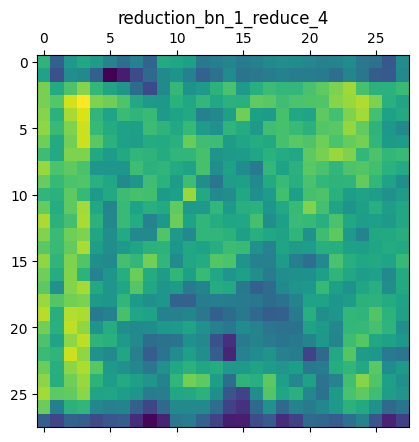

adjust_bn_reduce_4 (1, 28, 28, 88)


<Figure size 640x480 with 0 Axes>

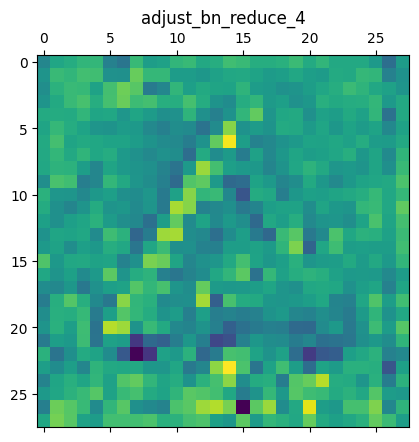

activation_259 (1, 28, 28, 88)


<Figure size 640x480 with 0 Axes>

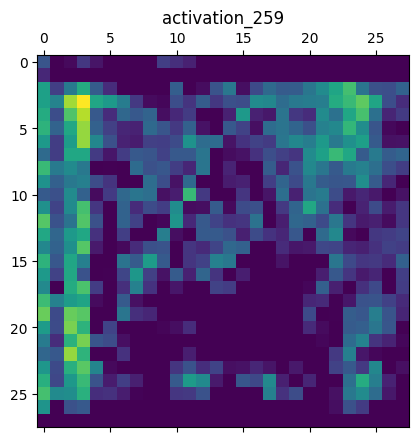

activation_261 (1, 28, 28, 88)


<Figure size 640x480 with 0 Axes>

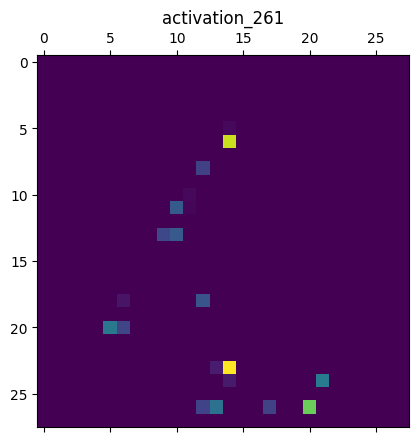

separable_conv_1_pad_reduction_left1_reduce_4 (1, 31, 31, 88)


<Figure size 640x480 with 0 Axes>

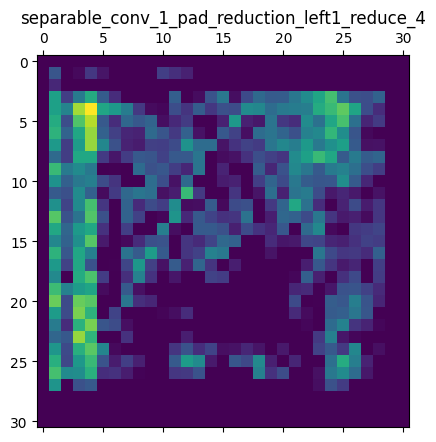

separable_conv_1_pad_reduction_right1_reduce_4 (1, 33, 33, 88)


<Figure size 640x480 with 0 Axes>

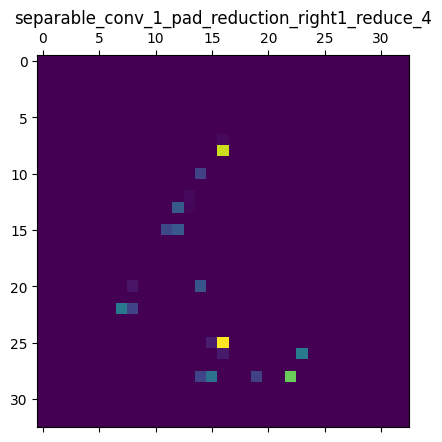

separable_conv_1_reduction_left1_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

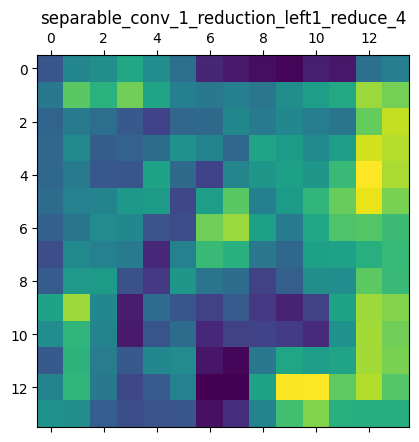

separable_conv_1_reduction_right1_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

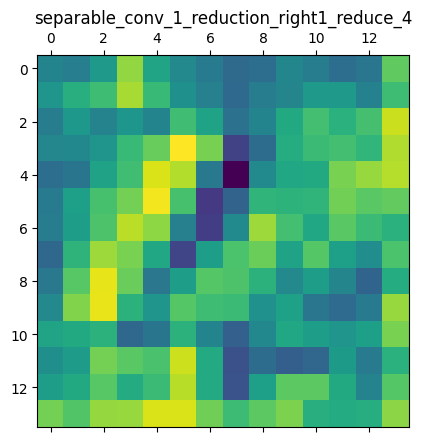

separable_conv_1_bn_reduction_left1_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

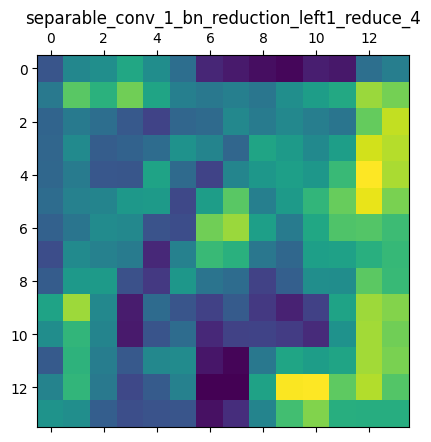

separable_conv_1_bn_reduction_right1_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

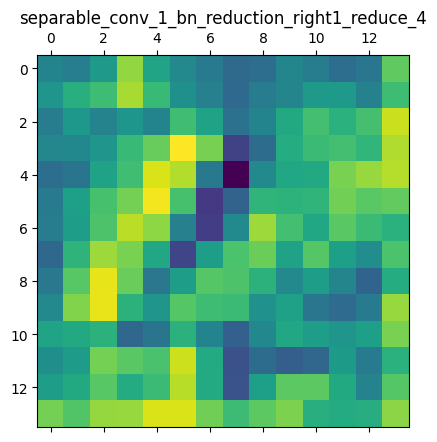

activation_260 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

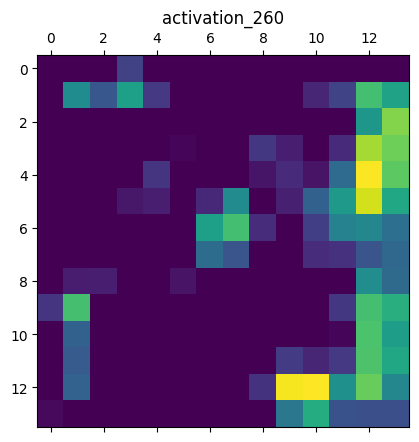

activation_262 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

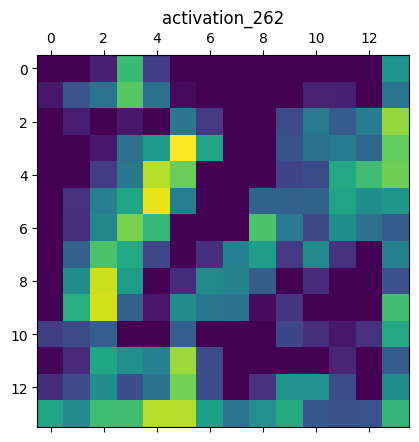

separable_conv_2_reduction_left1_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

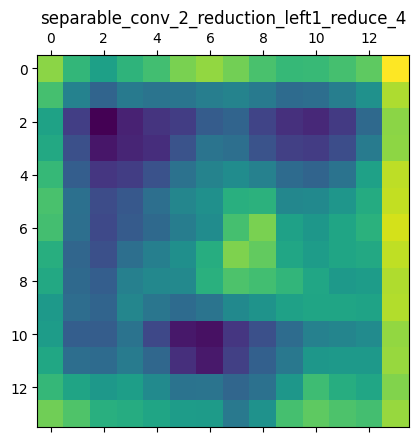

separable_conv_2_reduction_right1_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

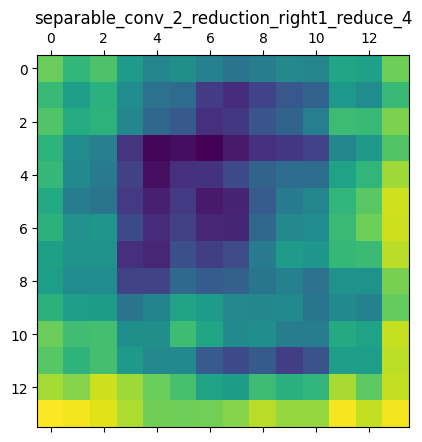

activation_263 (1, 28, 28, 88)


<Figure size 640x480 with 0 Axes>

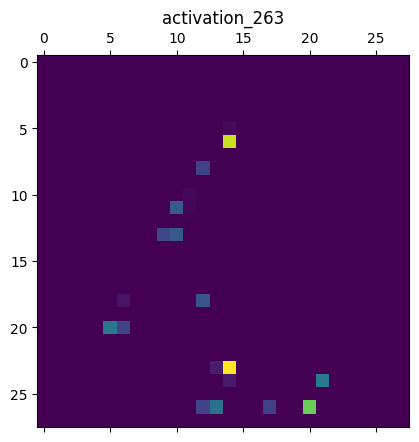

separable_conv_2_bn_reduction_left1_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

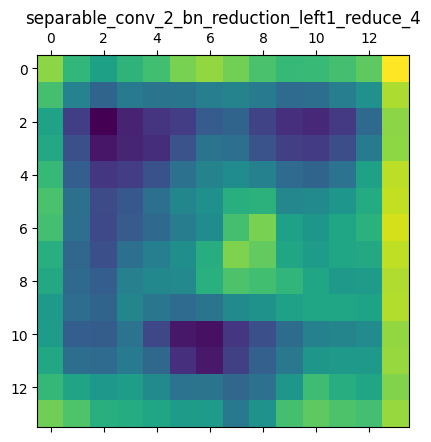

separable_conv_2_bn_reduction_right1_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

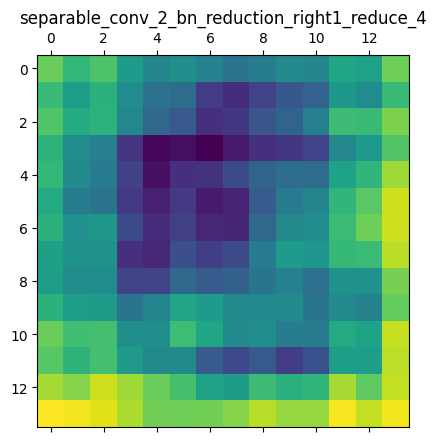

separable_conv_1_pad_reduction_right2_reduce_4 (1, 33, 33, 88)


<Figure size 640x480 with 0 Axes>

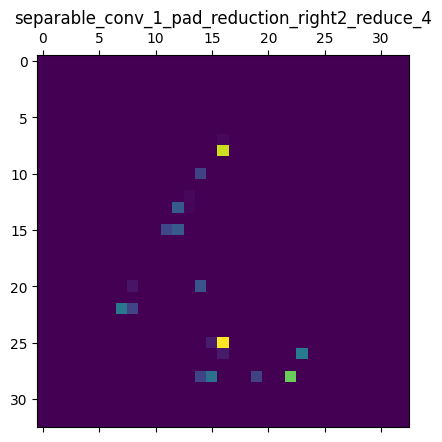

activation_265 (1, 28, 28, 88)


<Figure size 640x480 with 0 Axes>

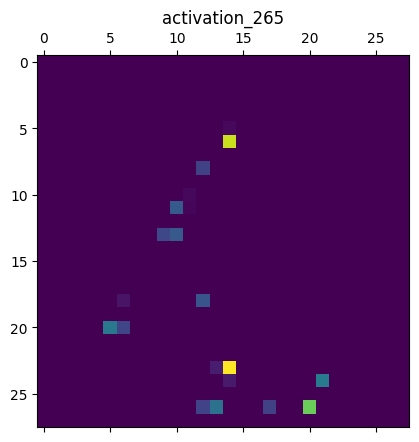

reduction_add_1_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

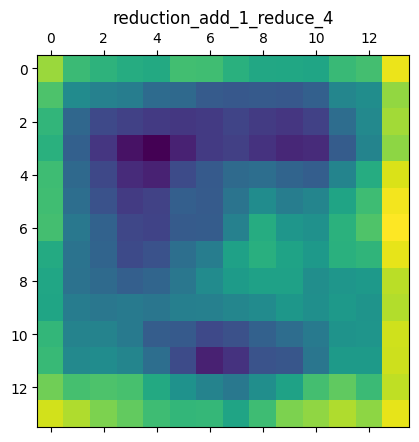

separable_conv_1_reduction_right2_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

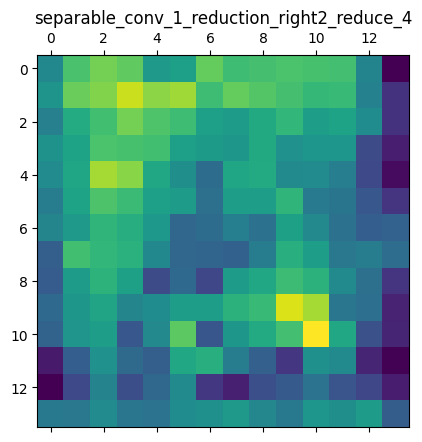

separable_conv_1_pad_reduction_right3_reduce_4 (1, 31, 31, 88)


<Figure size 640x480 with 0 Axes>

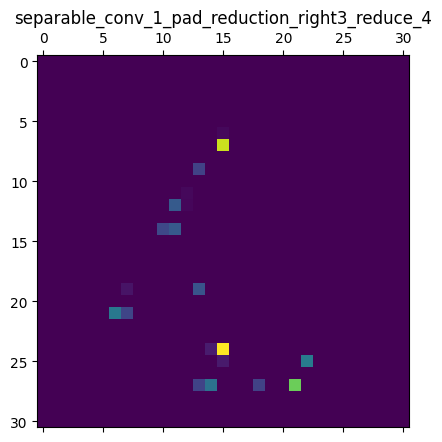

activation_267 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

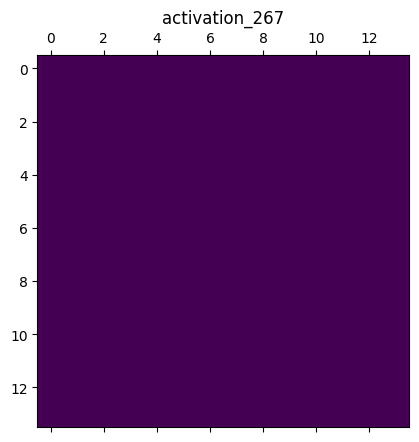

separable_conv_1_bn_reduction_right2_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

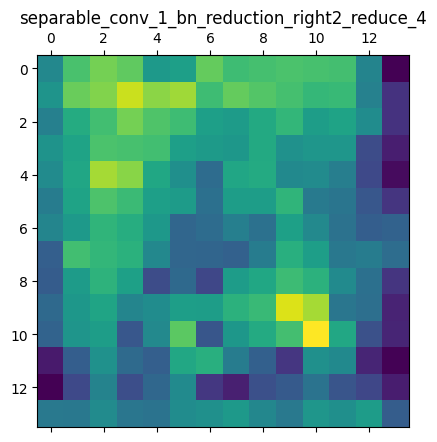

separable_conv_1_reduction_right3_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

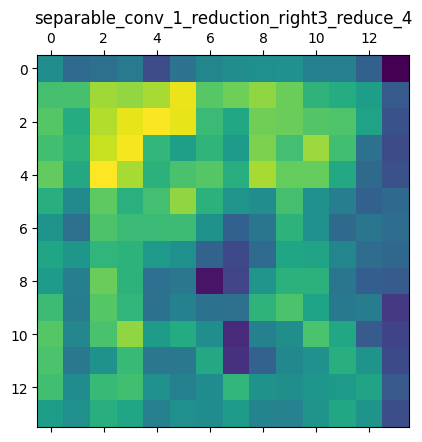

separable_conv_1_reduction_left4_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

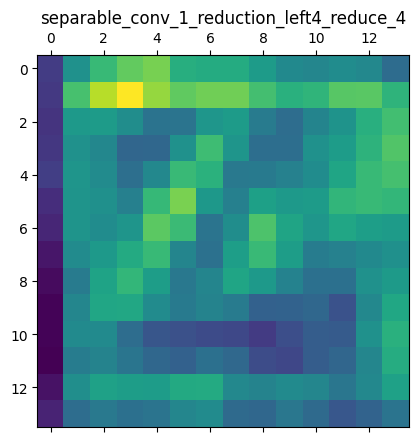

activation_264 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

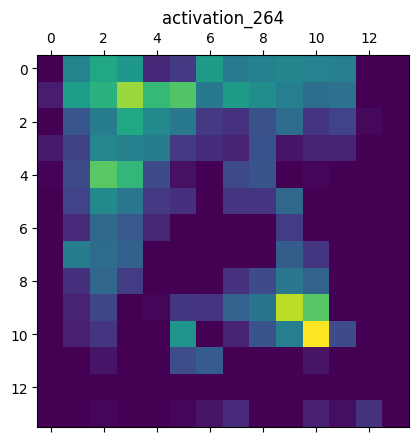

separable_conv_1_bn_reduction_right3_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

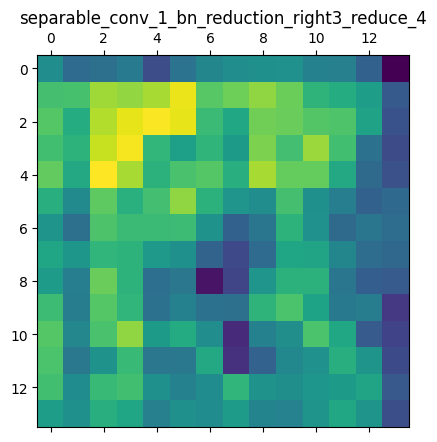

separable_conv_1_bn_reduction_left4_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

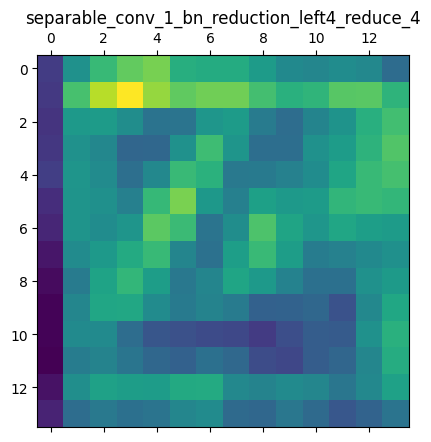

reduction_pad_1_reduce_4 (1, 29, 29, 88)


<Figure size 640x480 with 0 Axes>

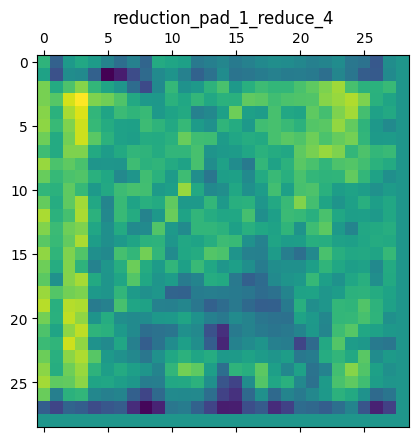

separable_conv_2_reduction_right2_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

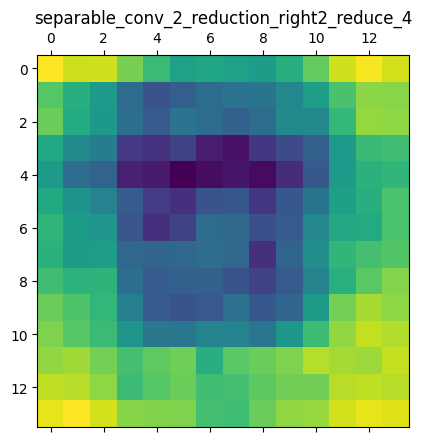

activation_266 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

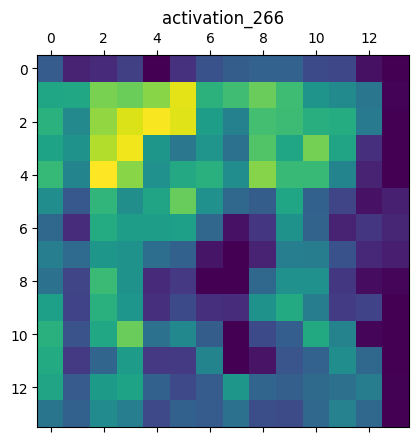

activation_268 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

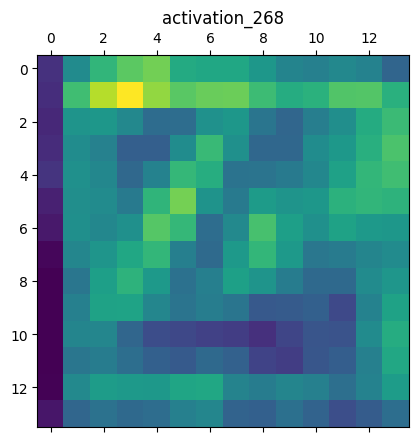

reduction_left2_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

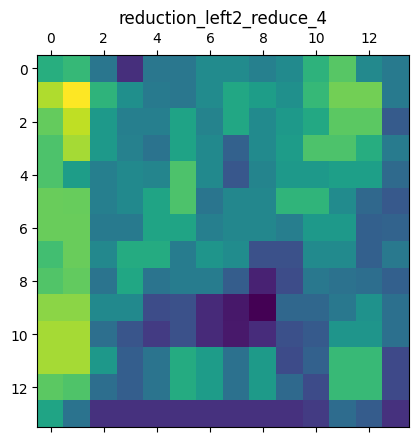

separable_conv_2_bn_reduction_right2_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

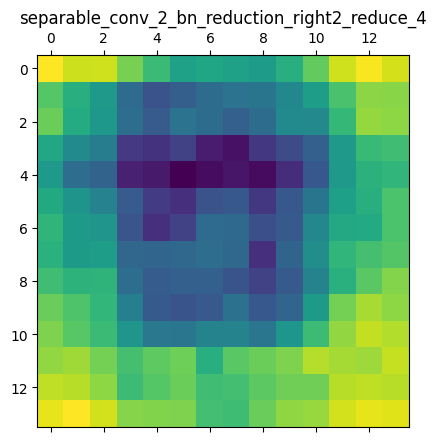

separable_conv_2_reduction_right3_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

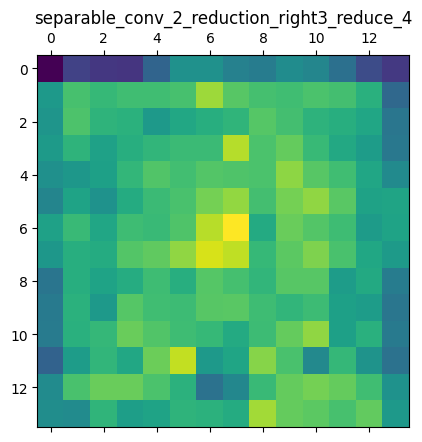

separable_conv_2_reduction_left4_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

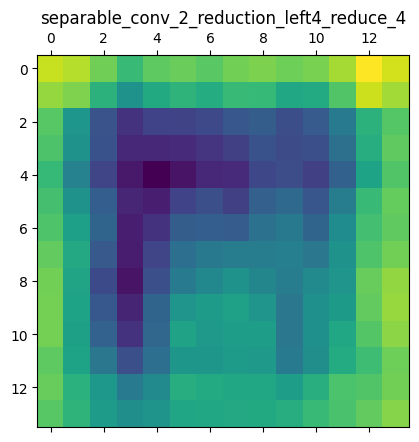

adjust_relu_1_5 (1, 28, 28, 264)


<Figure size 640x480 with 0 Axes>

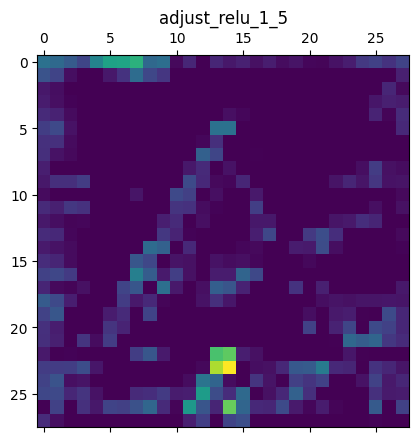

reduction_add_2_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

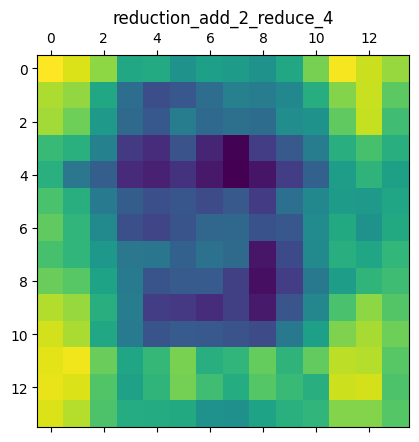

reduction_left3_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

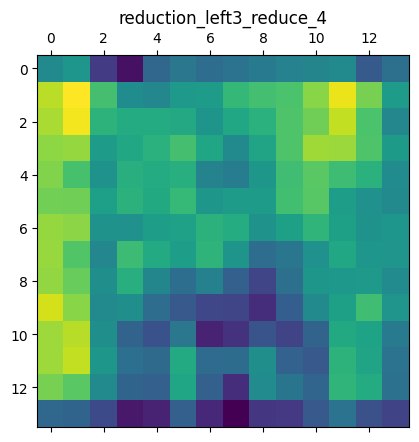

separable_conv_2_bn_reduction_right3_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

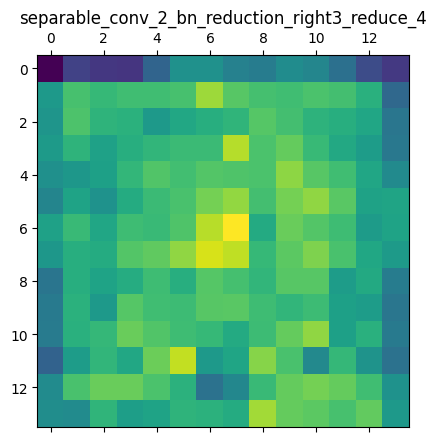

reduction_left4_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

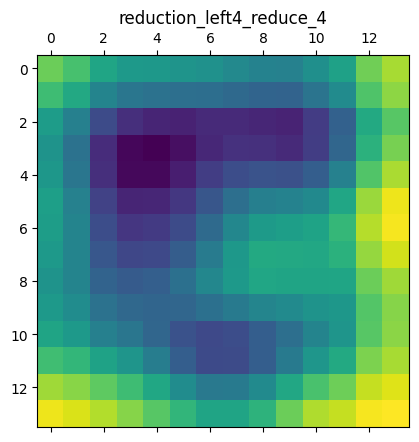

separable_conv_2_bn_reduction_left4_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

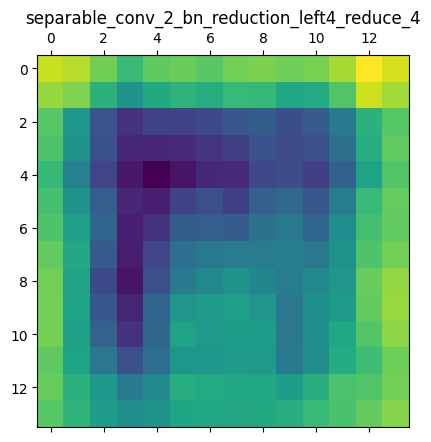

reduction_right5_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

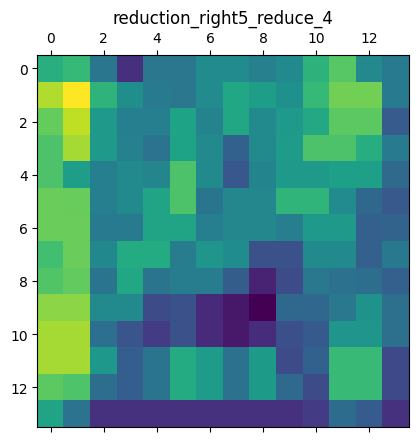

zero_padding2d_6 (1, 29, 29, 264)


<Figure size 640x480 with 0 Axes>

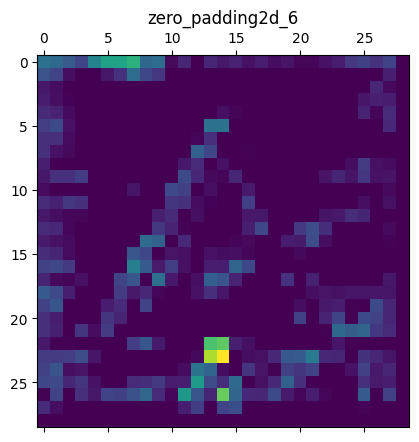

reduction_add3_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

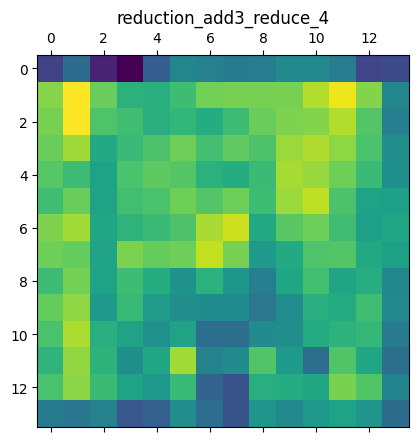

add_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

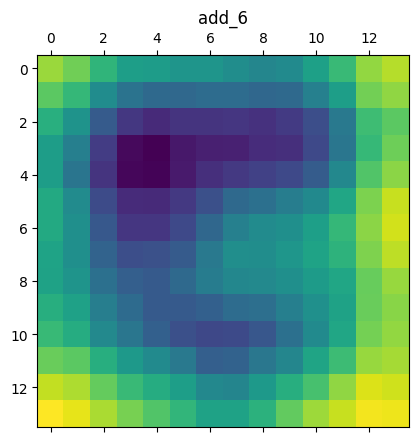

reduction_add4_reduce_4 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

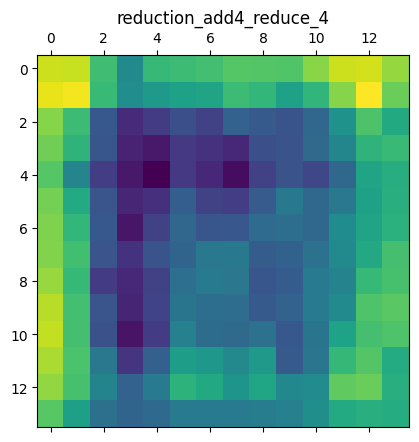

cropping2d_6 (1, 28, 28, 264)


<Figure size 640x480 with 0 Axes>

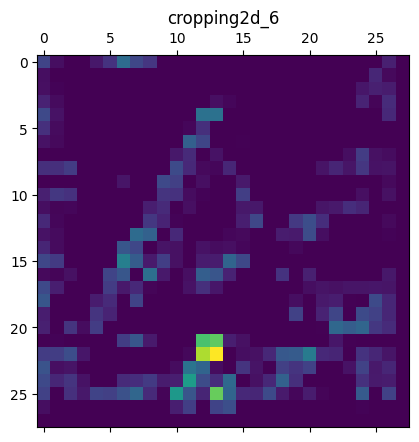

reduction_concat_reduce_4 (1, 14, 14, 352)


<Figure size 640x480 with 0 Axes>

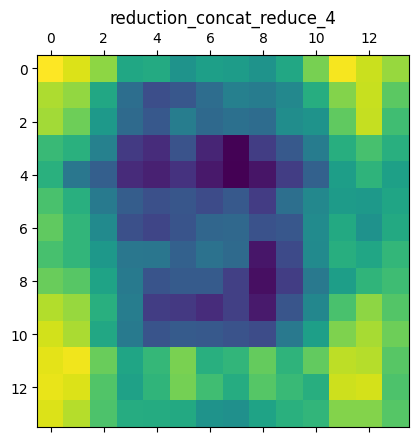

adjust_avg_pool_1_5 (1, 14, 14, 264)


<Figure size 640x480 with 0 Axes>

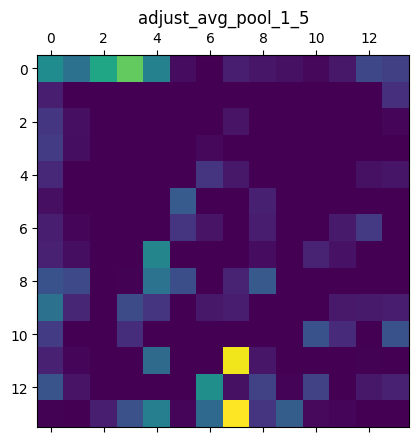

adjust_avg_pool_2_5 (1, 14, 14, 264)


<Figure size 640x480 with 0 Axes>

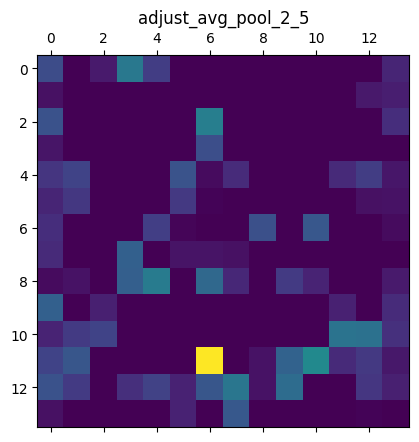

adjust_conv_1_5 (1, 14, 14, 44)


<Figure size 640x480 with 0 Axes>

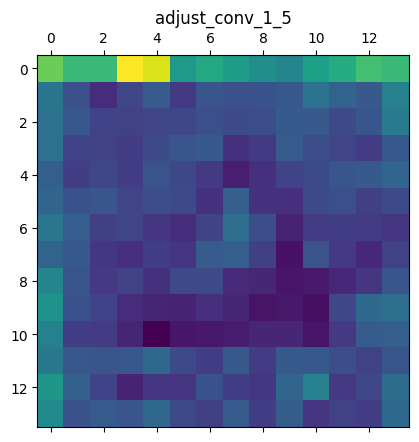

adjust_conv_2_5 (1, 14, 14, 44)


<Figure size 640x480 with 0 Axes>

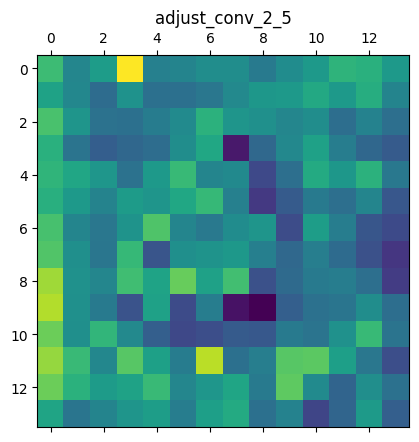

activation_269 (1, 14, 14, 352)


<Figure size 640x480 with 0 Axes>

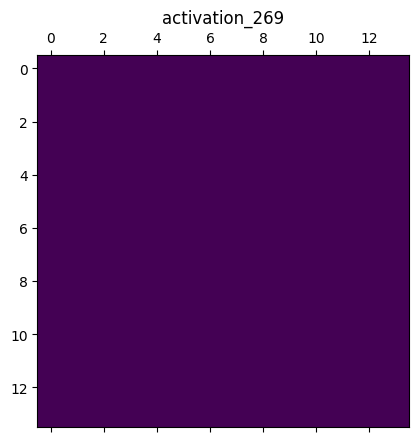

concatenate_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

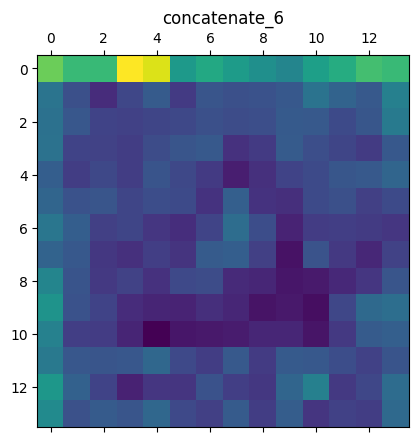

normal_conv_1_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

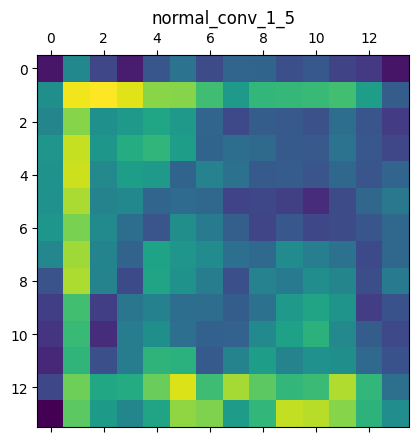

adjust_bn_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

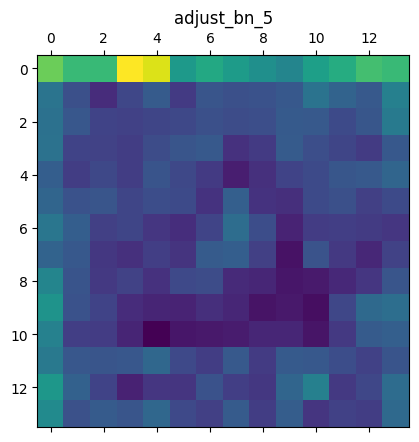

normal_bn_1_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

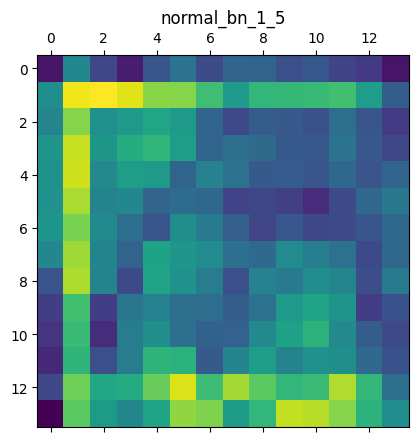

activation_270 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

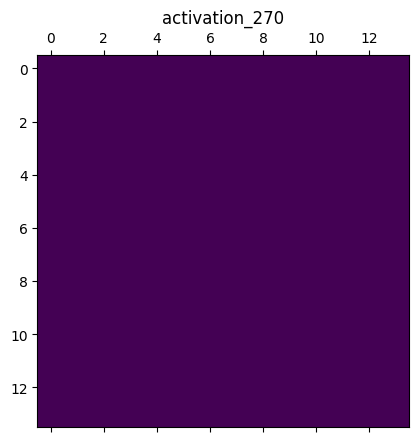

activation_272 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

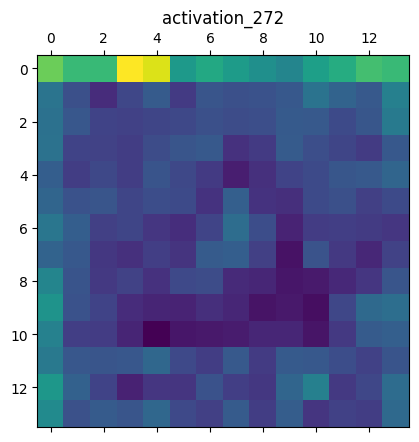

activation_274 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

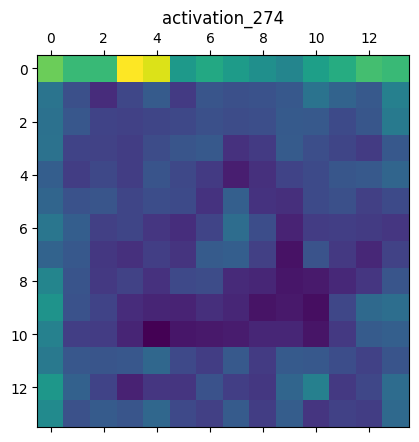

activation_276 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

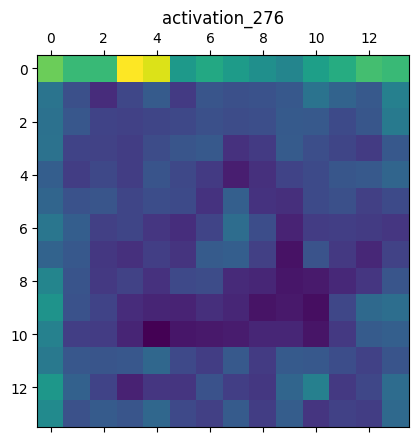

activation_278 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

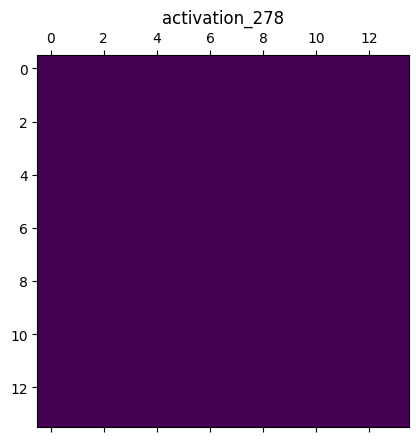

separable_conv_1_normal_left1_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

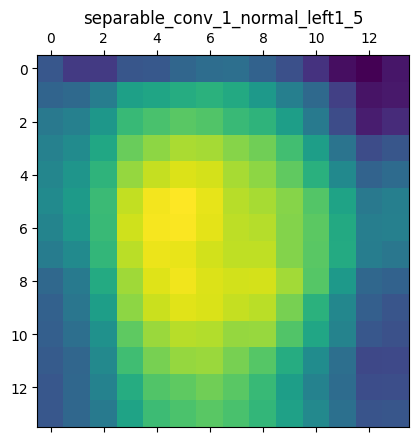

separable_conv_1_normal_right1_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

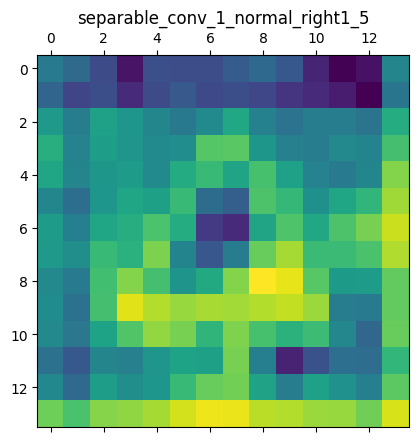

separable_conv_1_normal_left2_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

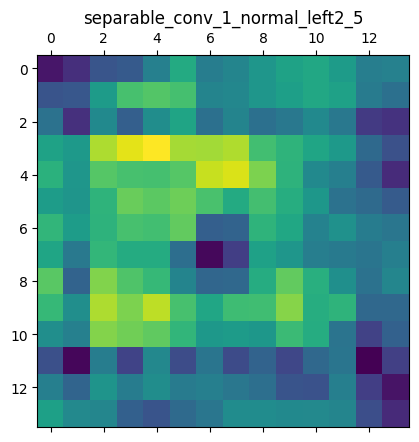

separable_conv_1_normal_right2_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

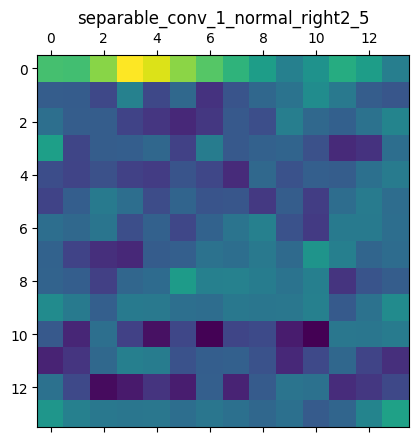

separable_conv_1_normal_left5_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

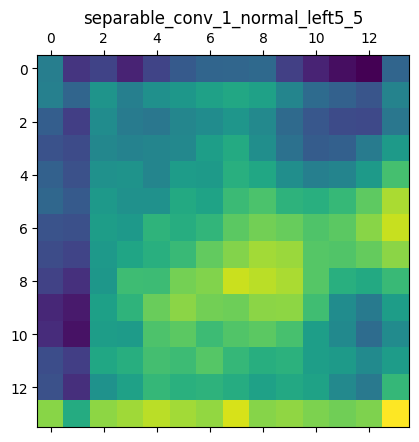

separable_conv_1_bn_normal_left1_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

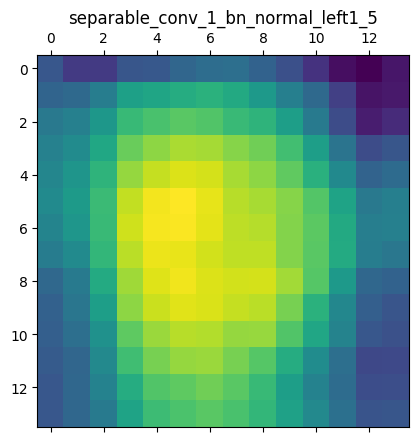

separable_conv_1_bn_normal_right1_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

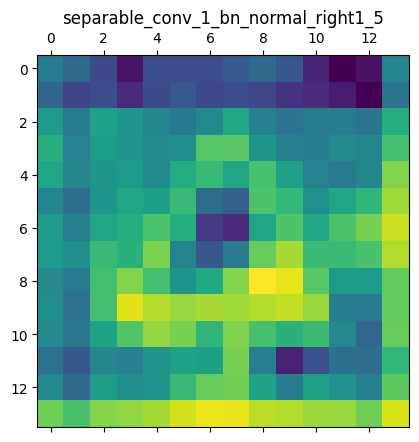

separable_conv_1_bn_normal_left2_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

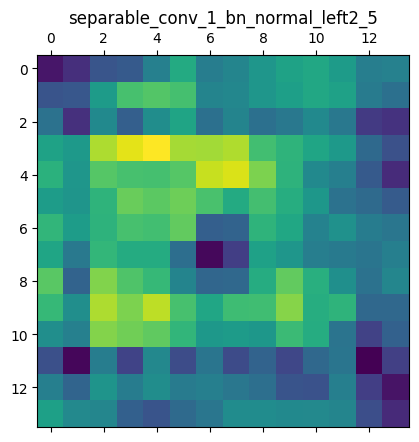

separable_conv_1_bn_normal_right2_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

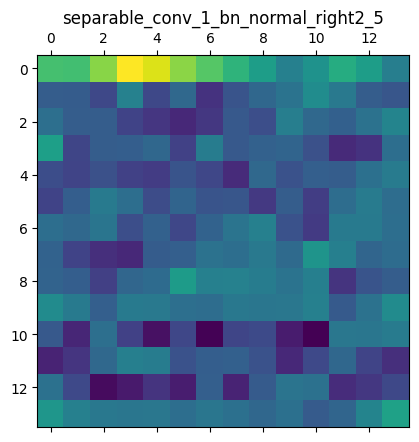

separable_conv_1_bn_normal_left5_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

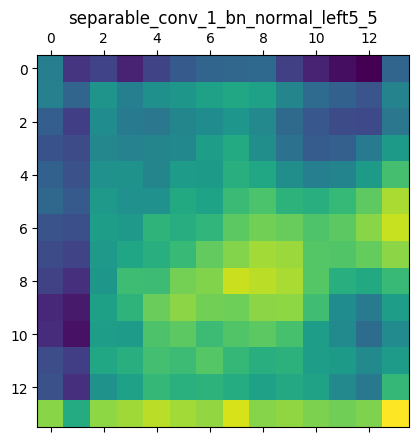

activation_271 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

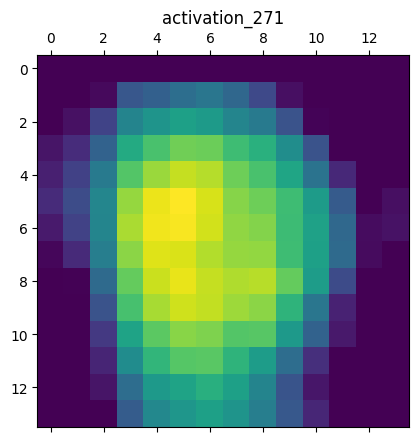

activation_273 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

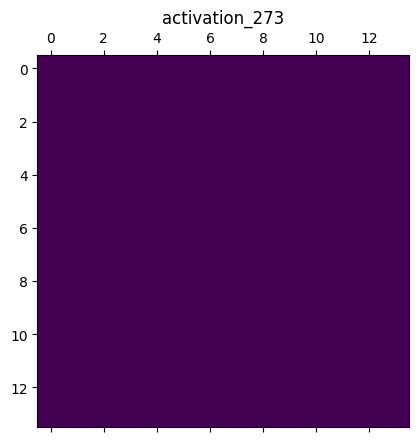

activation_275 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

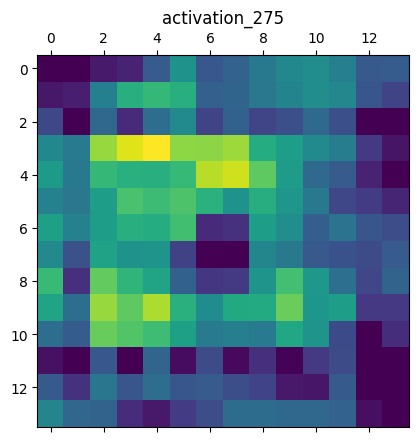

activation_277 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

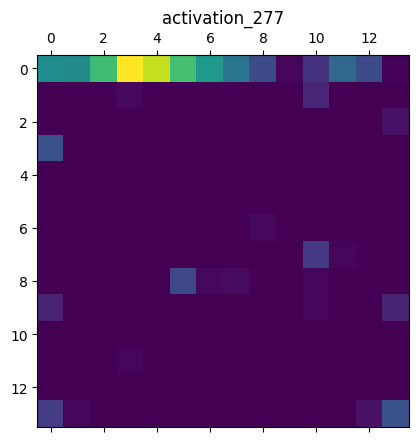

activation_279 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

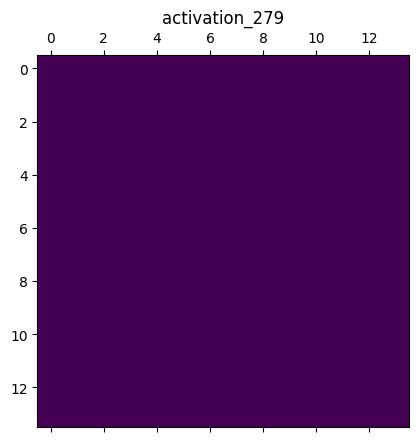

separable_conv_2_normal_left1_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

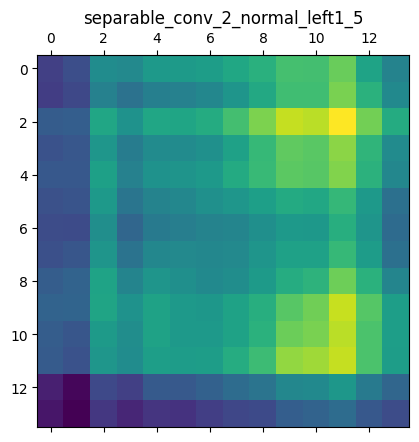

separable_conv_2_normal_right1_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

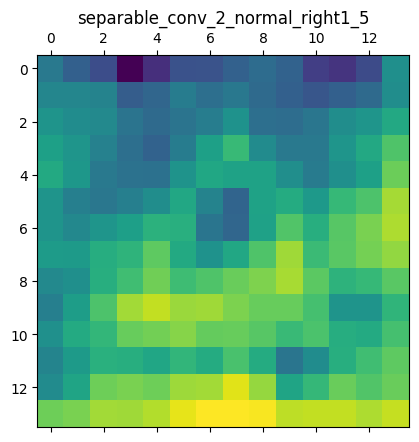

separable_conv_2_normal_left2_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

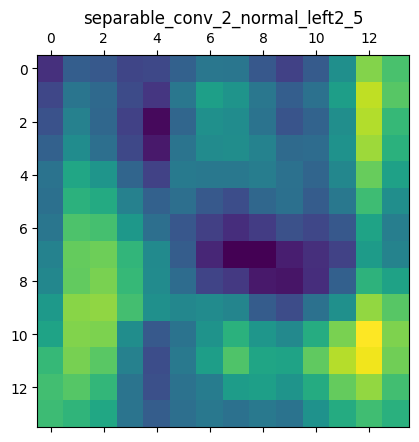

separable_conv_2_normal_right2_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

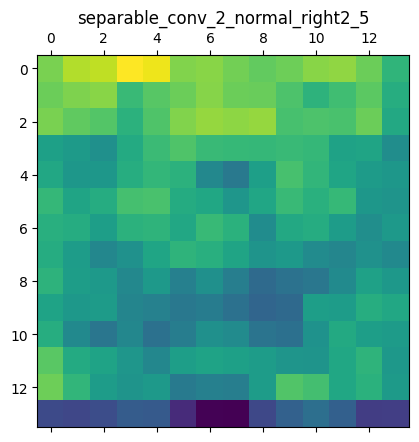

separable_conv_2_normal_left5_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

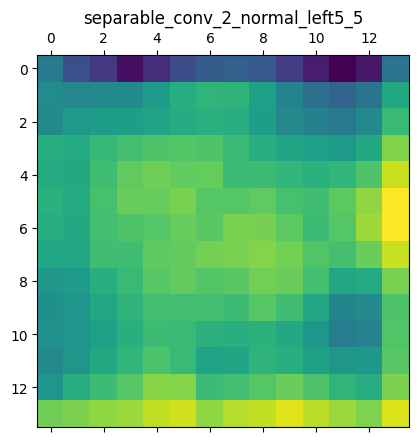

separable_conv_2_bn_normal_left1_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

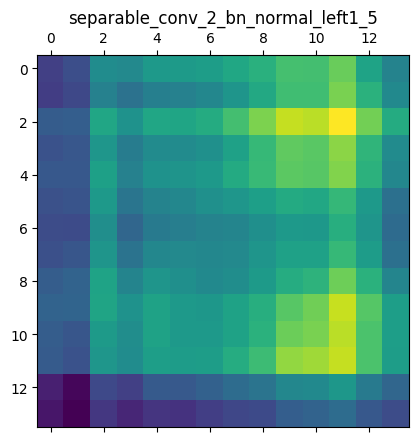

separable_conv_2_bn_normal_right1_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

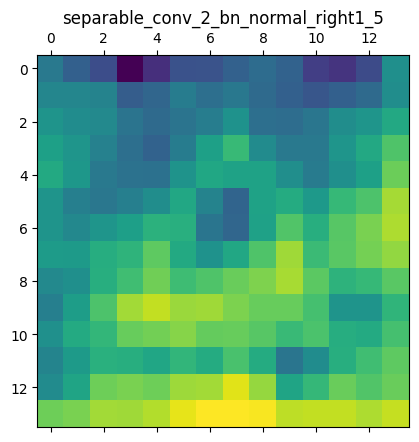

separable_conv_2_bn_normal_left2_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

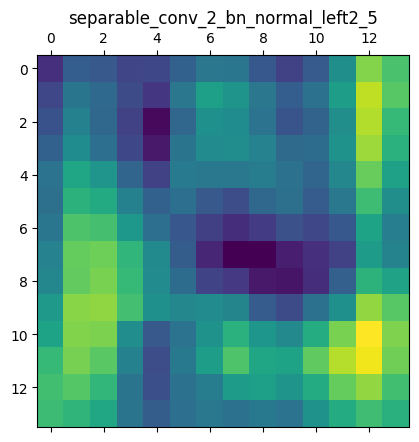

separable_conv_2_bn_normal_right2_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

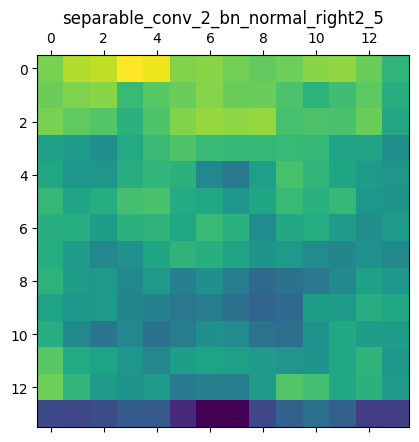

normal_left3_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

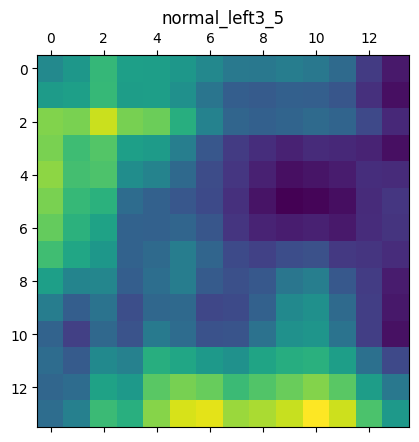

normal_left4_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

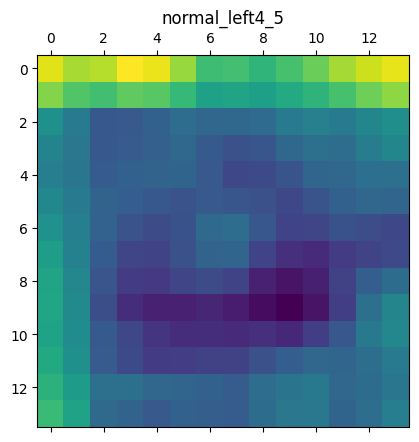

normal_right4_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

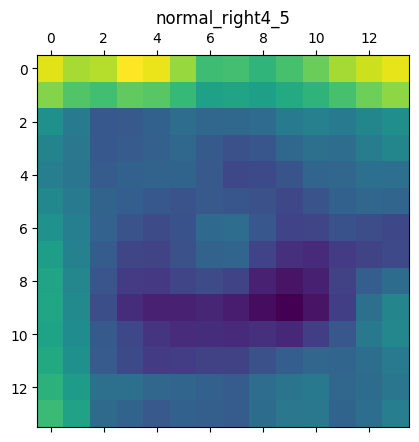

separable_conv_2_bn_normal_left5_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

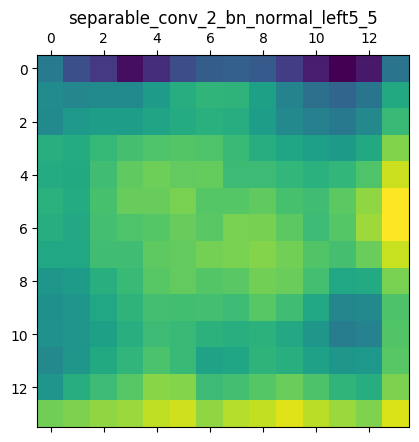

normal_add_1_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

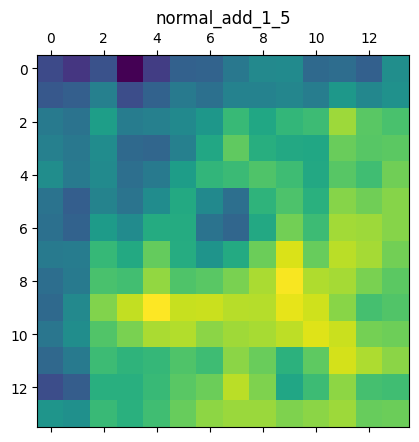

normal_add_2_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

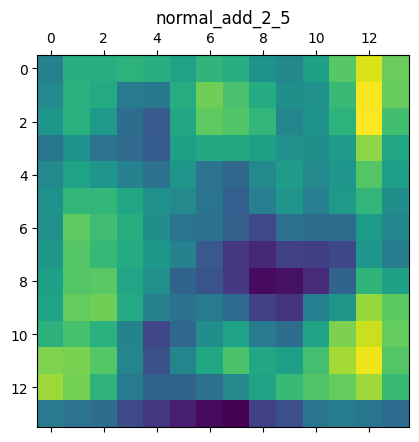

normal_add_3_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

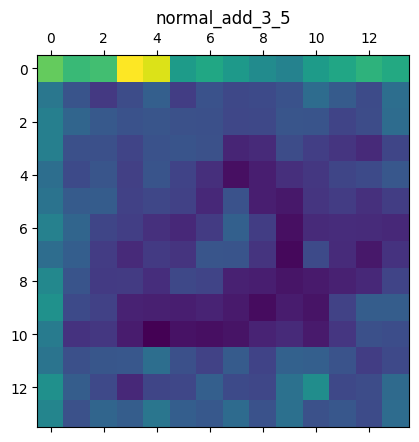

normal_add_4_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

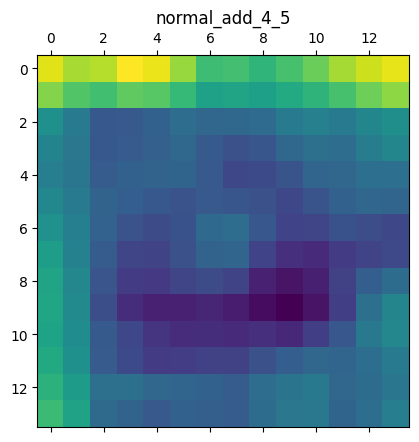

normal_add_5_5 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

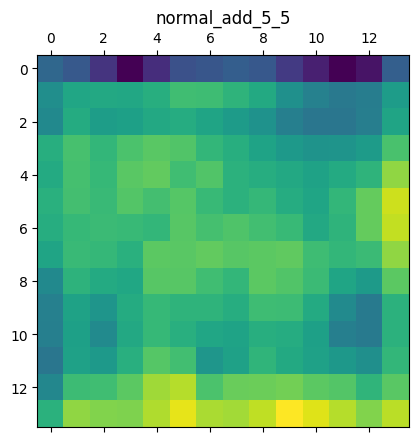

normal_concat_5 (1, 14, 14, 528)


<Figure size 640x480 with 0 Axes>

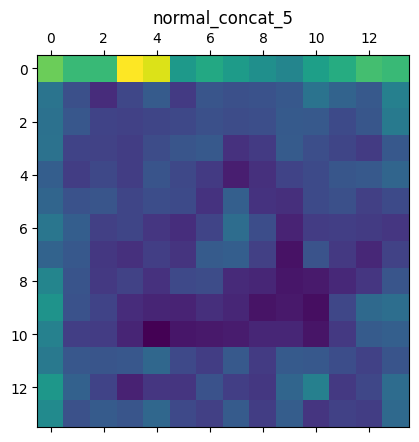

activation_280 (1, 14, 14, 352)


<Figure size 640x480 with 0 Axes>

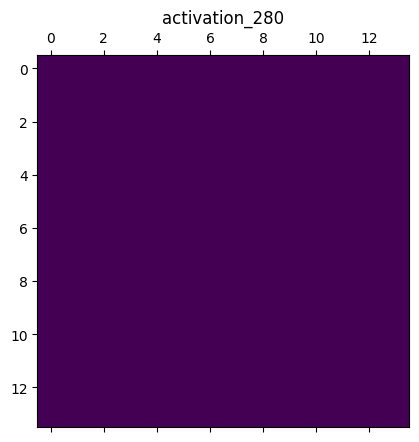

activation_281 (1, 14, 14, 528)


<Figure size 640x480 with 0 Axes>

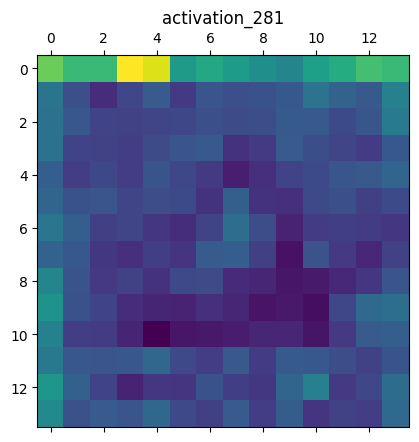

adjust_conv_projection_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

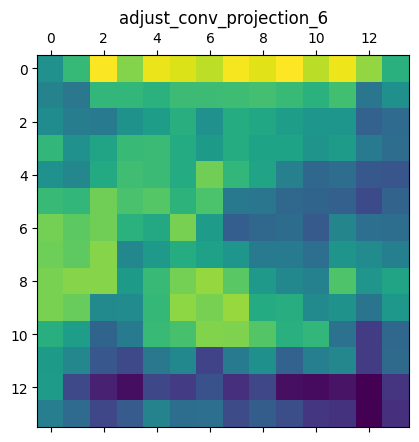

normal_conv_1_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

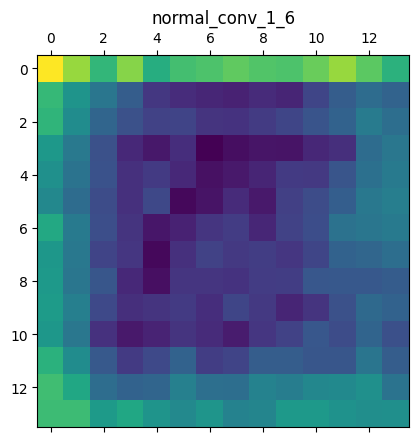

adjust_bn_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

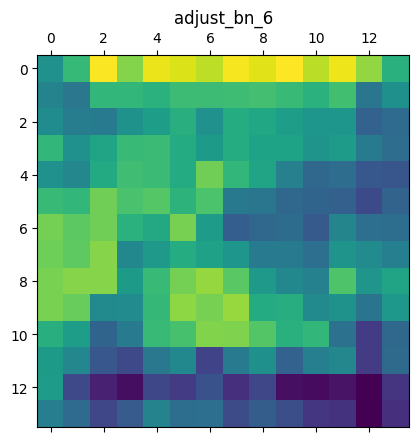

normal_bn_1_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

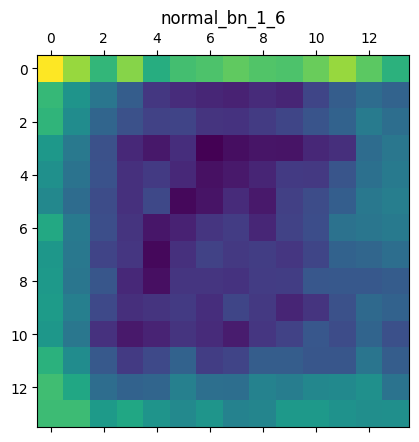

activation_282 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

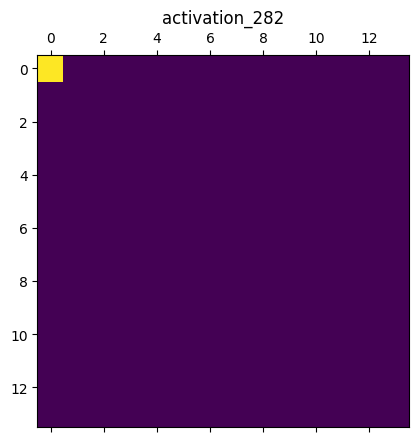

activation_284 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

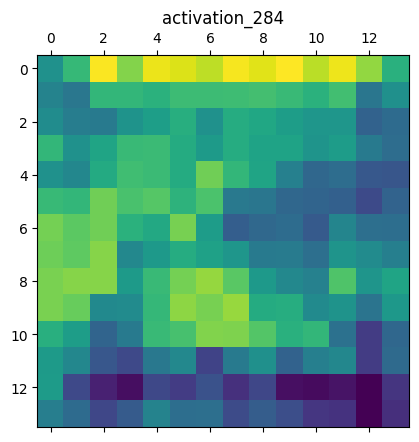

activation_286 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

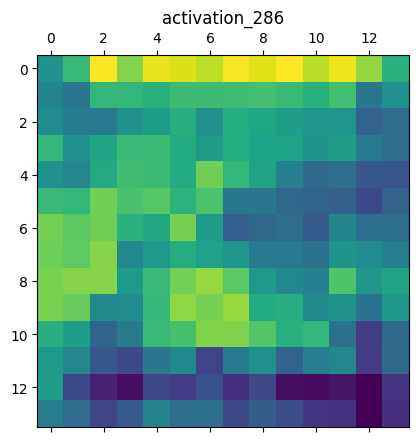

activation_288 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

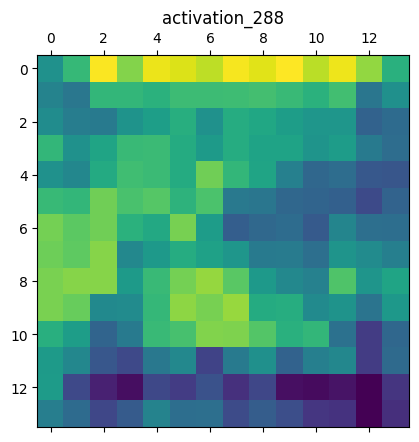

activation_290 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

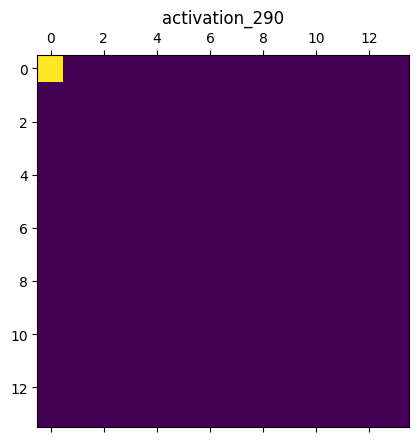

separable_conv_1_normal_left1_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

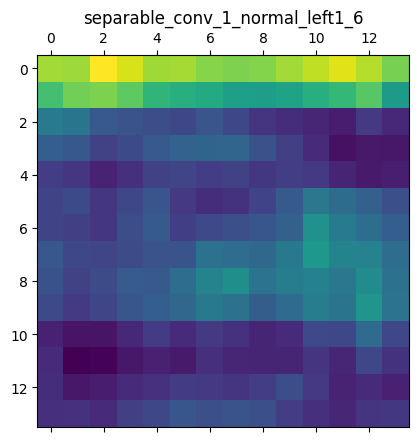

separable_conv_1_normal_right1_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

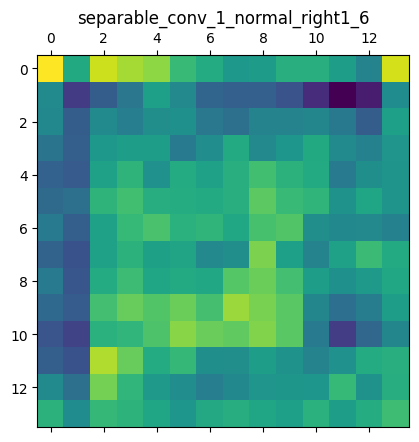

separable_conv_1_normal_left2_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

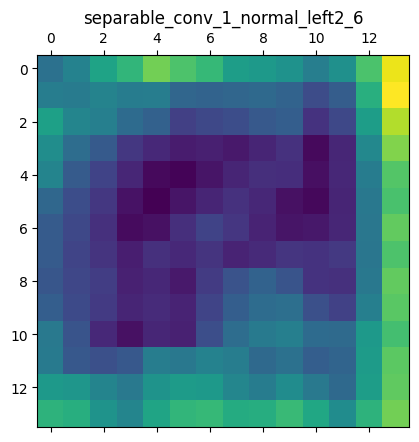

separable_conv_1_normal_right2_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

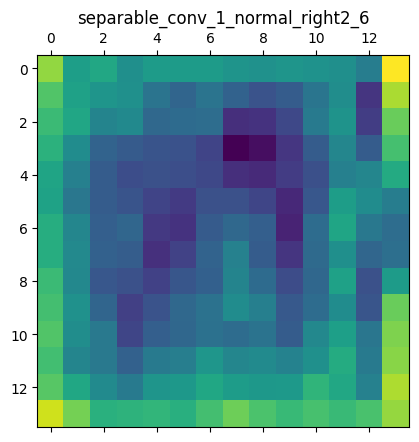

separable_conv_1_normal_left5_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

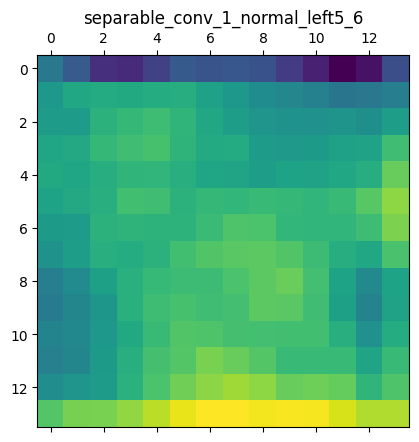

separable_conv_1_bn_normal_left1_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

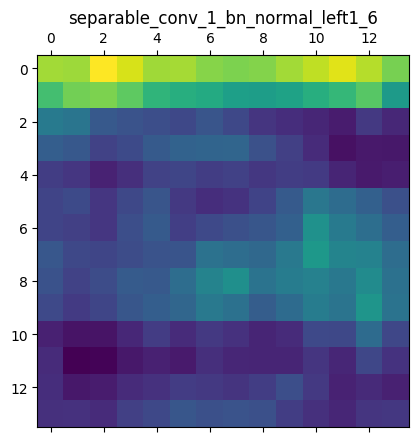

separable_conv_1_bn_normal_right1_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

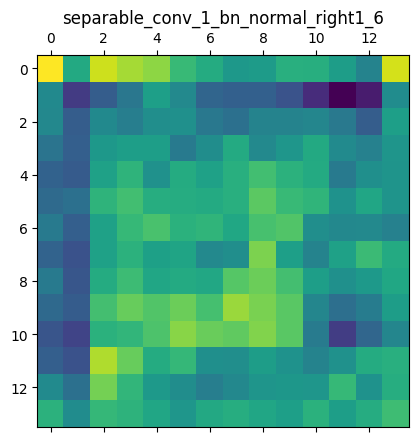

separable_conv_1_bn_normal_left2_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

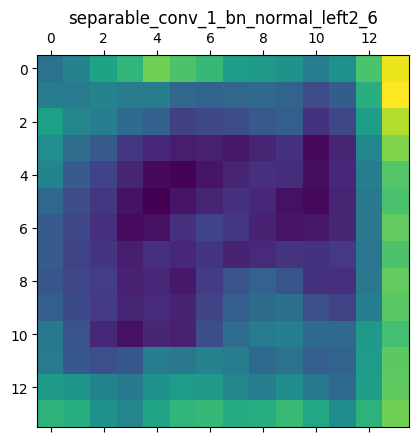

separable_conv_1_bn_normal_right2_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

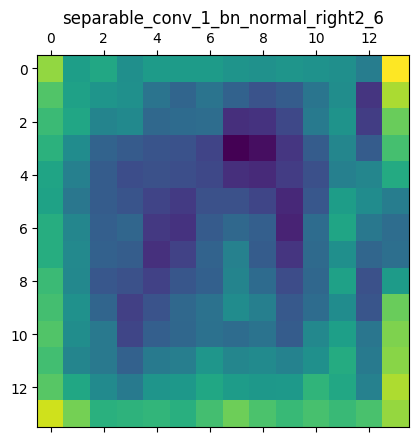

separable_conv_1_bn_normal_left5_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

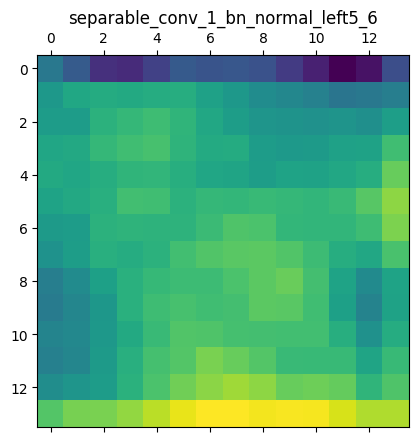

activation_283 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

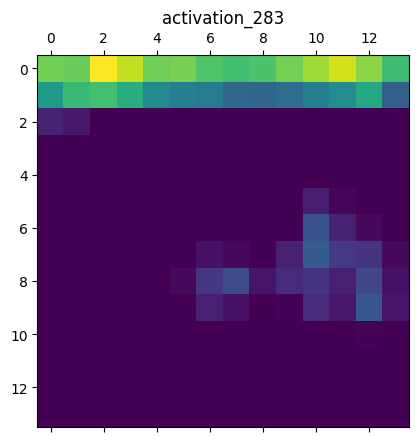

activation_285 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

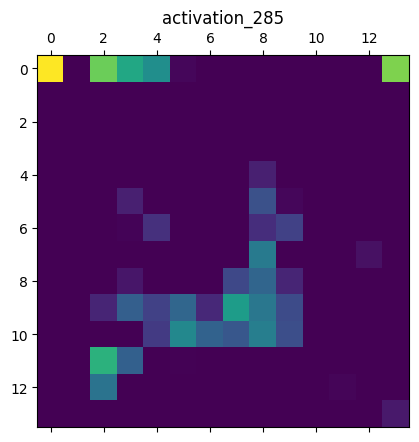

activation_287 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

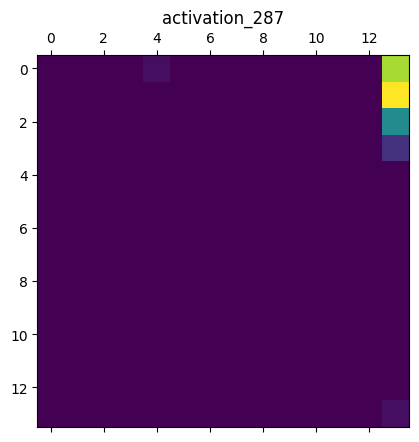

activation_289 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

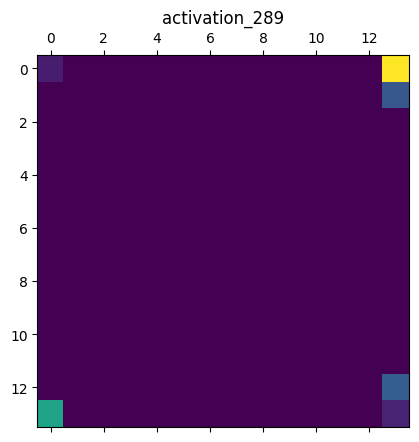

activation_291 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

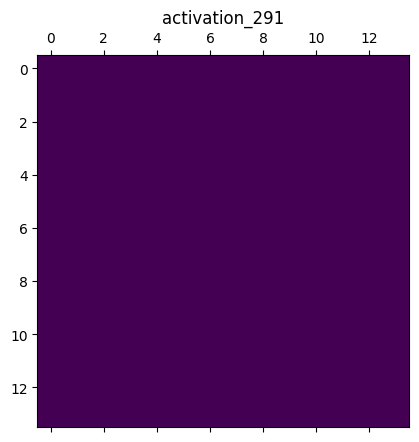

separable_conv_2_normal_left1_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

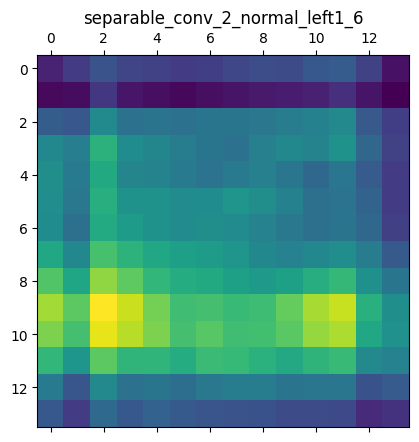

separable_conv_2_normal_right1_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

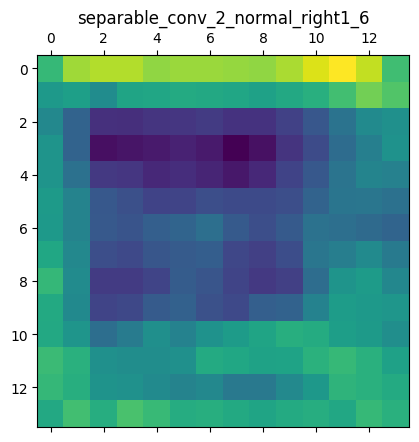

separable_conv_2_normal_left2_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

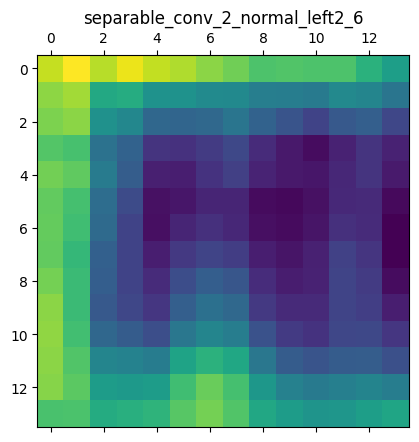

separable_conv_2_normal_right2_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

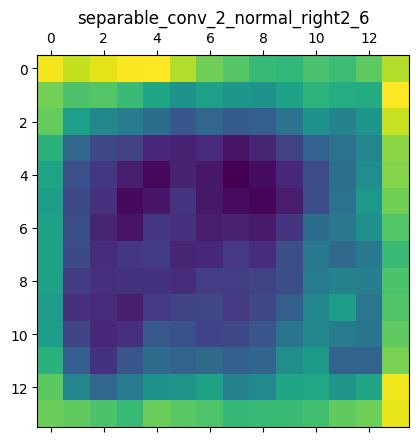

separable_conv_2_normal_left5_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

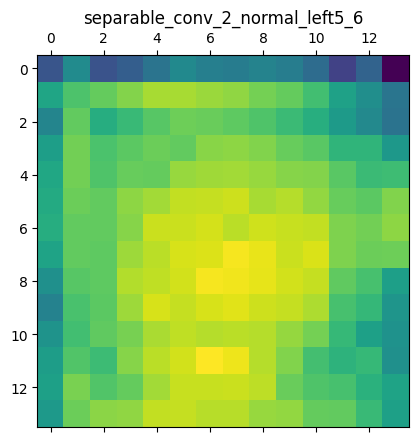

separable_conv_2_bn_normal_left1_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

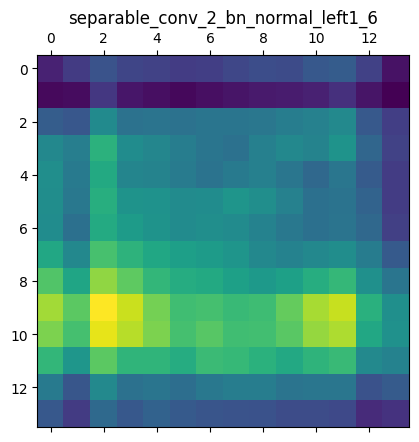

separable_conv_2_bn_normal_right1_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

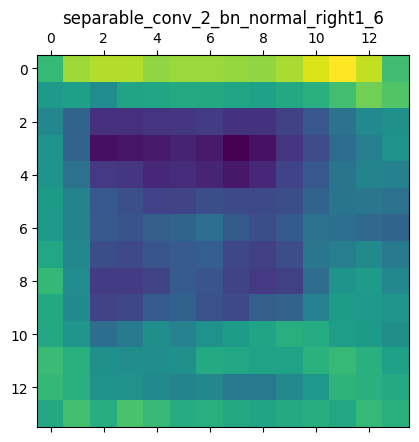

separable_conv_2_bn_normal_left2_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

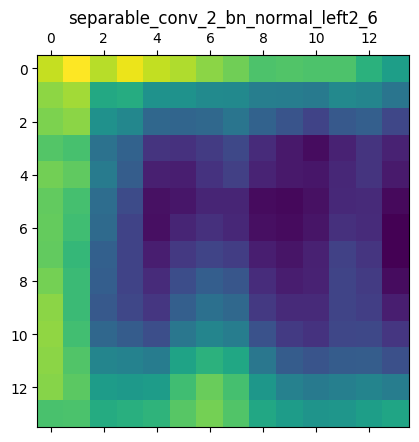

separable_conv_2_bn_normal_right2_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

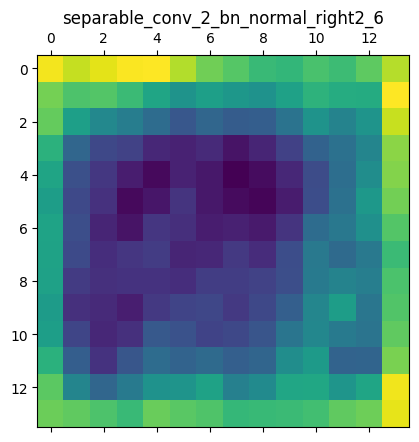

normal_left3_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

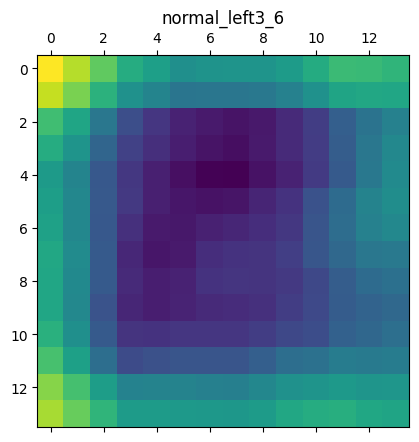

normal_left4_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

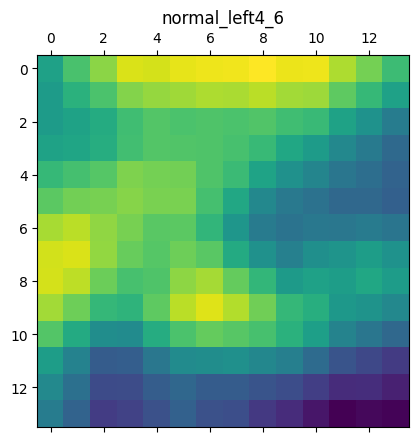

normal_right4_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

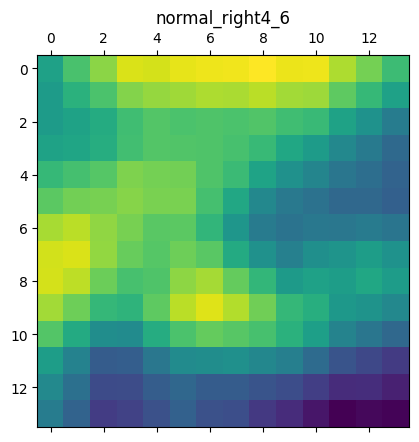

separable_conv_2_bn_normal_left5_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

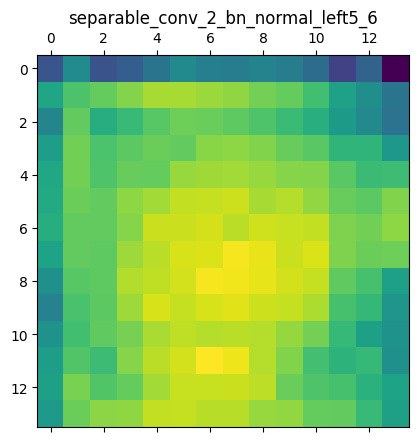

normal_add_1_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

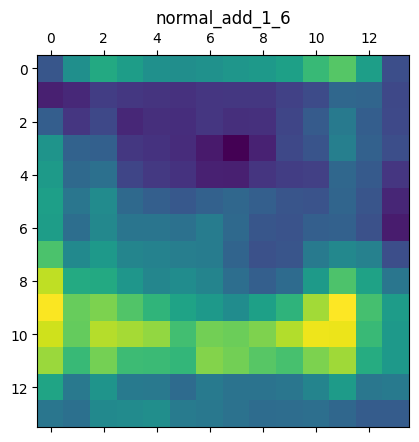

normal_add_2_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

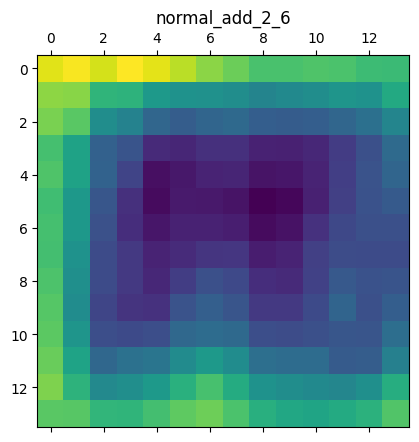

normal_add_3_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

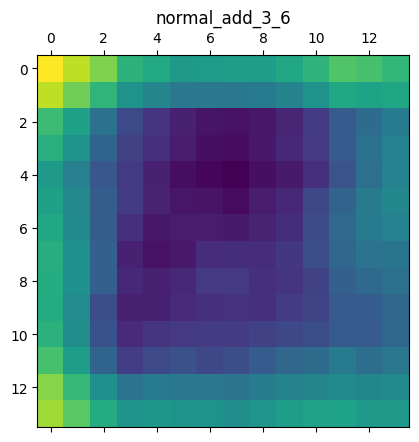

normal_add_4_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

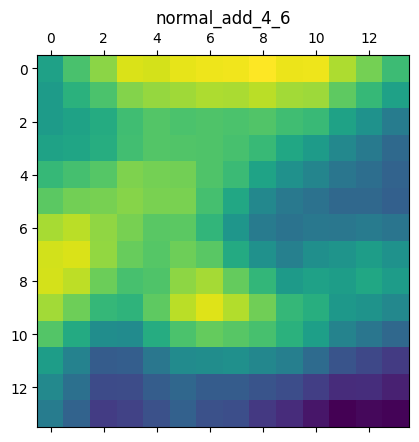

normal_add_5_6 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

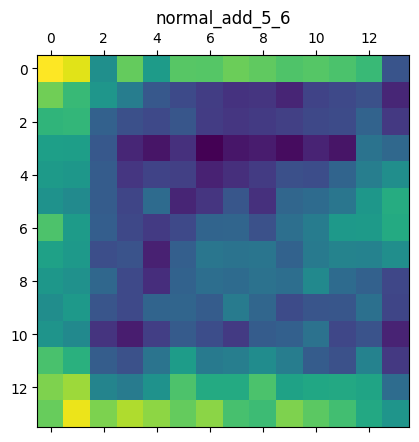

normal_concat_6 (1, 14, 14, 528)


<Figure size 640x480 with 0 Axes>

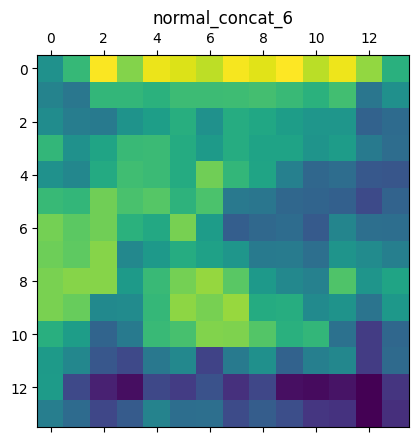

activation_292 (1, 14, 14, 528)


<Figure size 640x480 with 0 Axes>

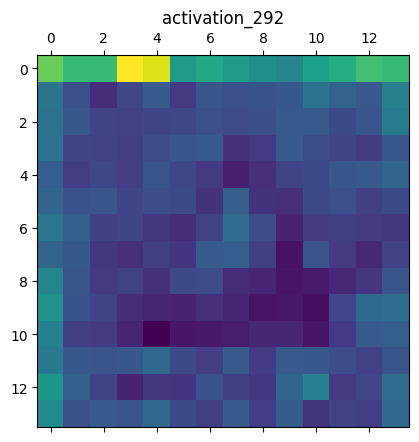

activation_293 (1, 14, 14, 528)


<Figure size 640x480 with 0 Axes>

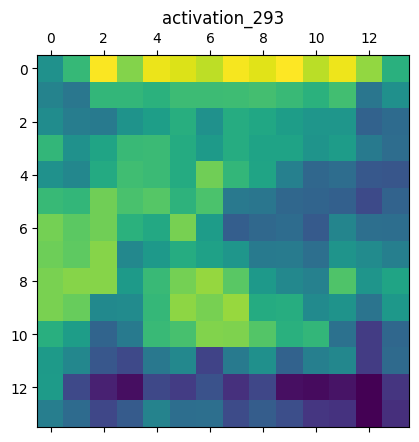

adjust_conv_projection_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

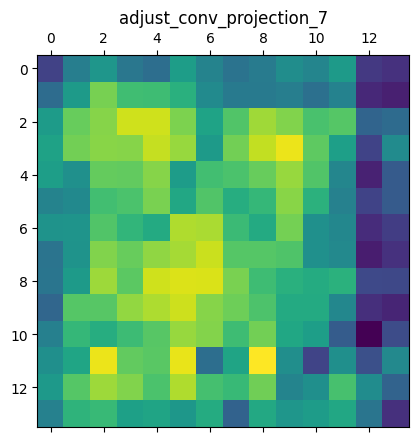

normal_conv_1_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

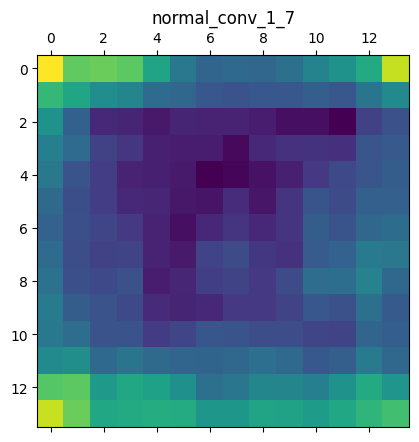

adjust_bn_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

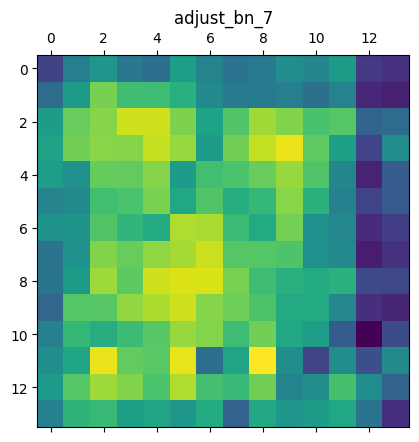

normal_bn_1_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

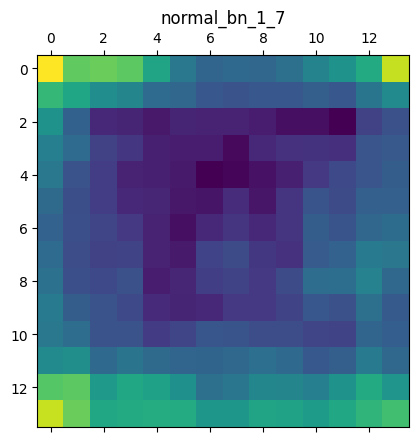

activation_294 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

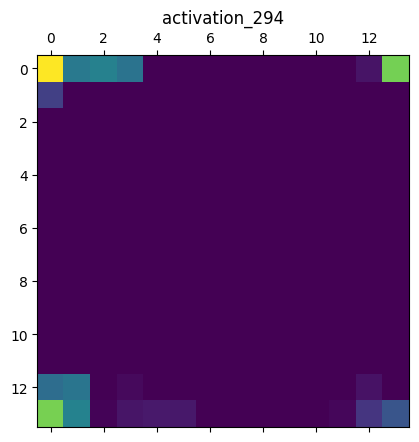

activation_296 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

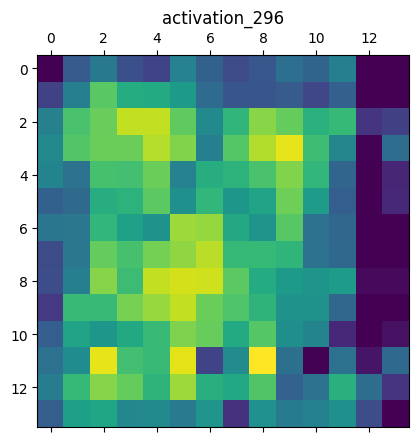

activation_298 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

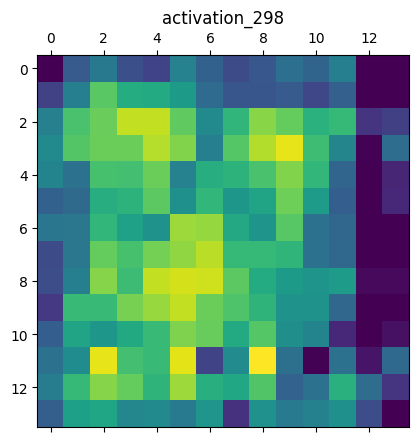

activation_300 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

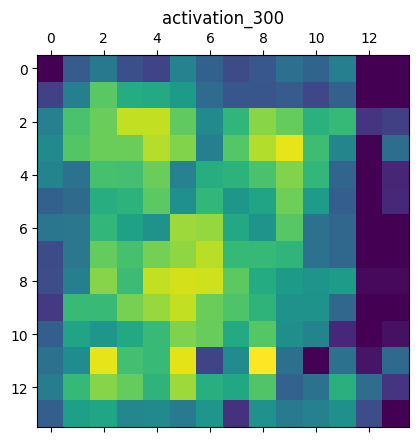

activation_302 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

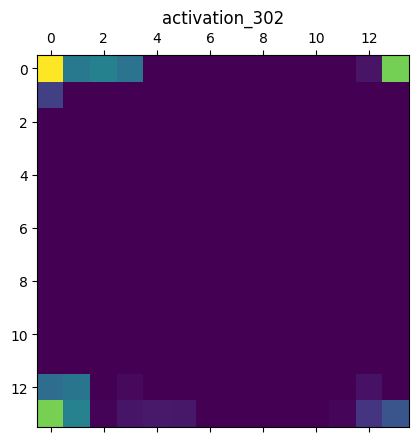

separable_conv_1_normal_left1_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

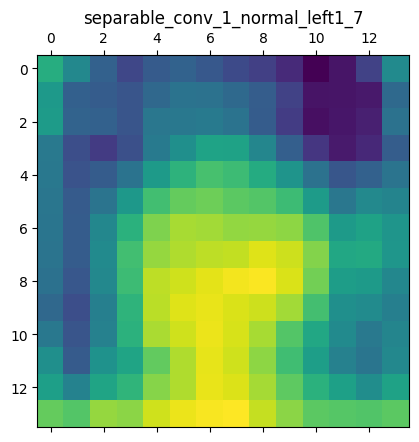

separable_conv_1_normal_right1_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

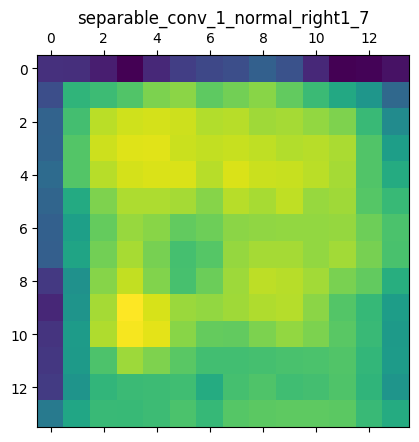

separable_conv_1_normal_left2_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

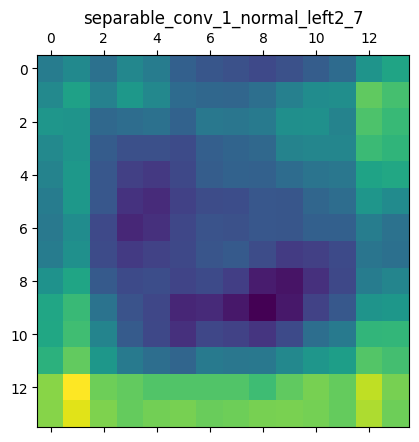

separable_conv_1_normal_right2_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

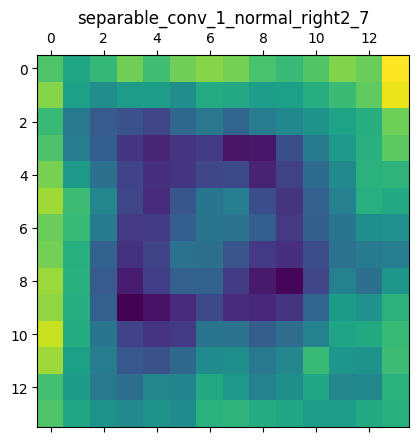

separable_conv_1_normal_left5_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

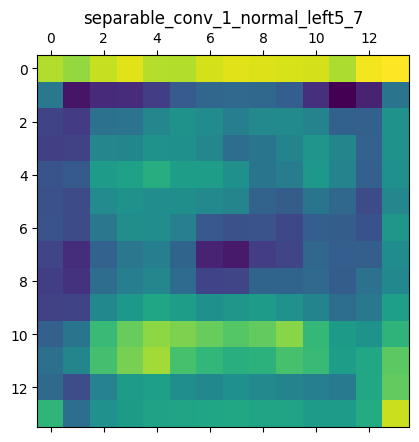

separable_conv_1_bn_normal_left1_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

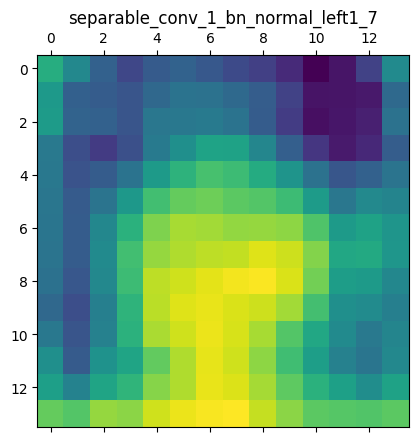

separable_conv_1_bn_normal_right1_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

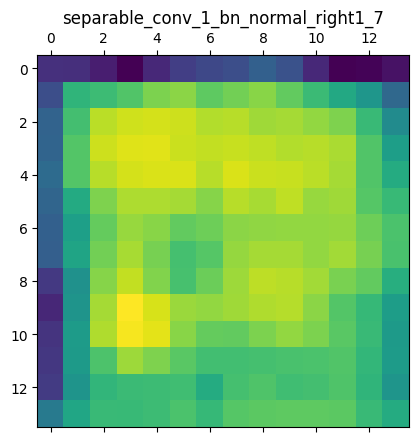

separable_conv_1_bn_normal_left2_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

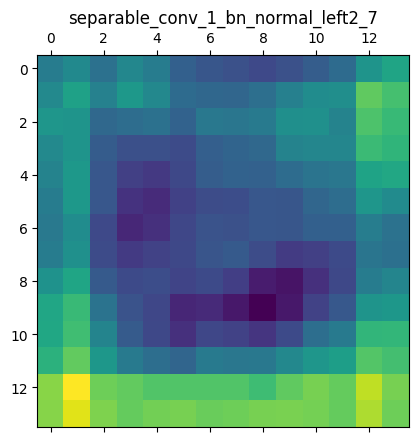

separable_conv_1_bn_normal_right2_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

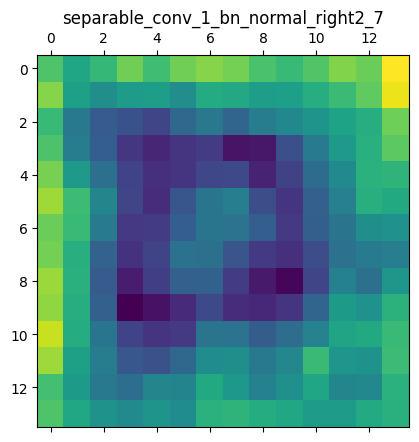

separable_conv_1_bn_normal_left5_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

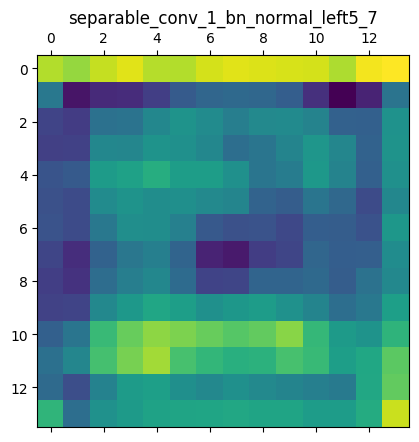

activation_295 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

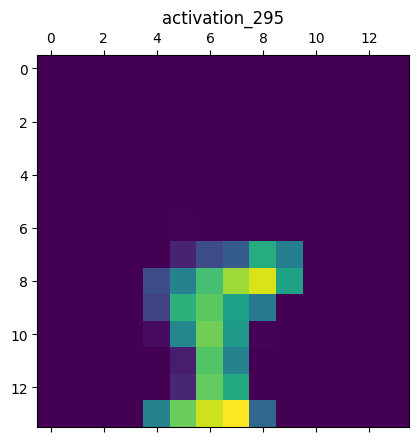

activation_297 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

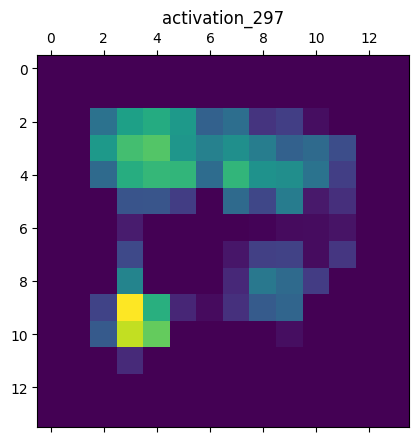

activation_299 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

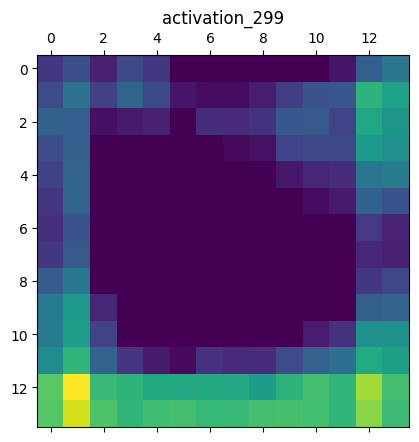

activation_301 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

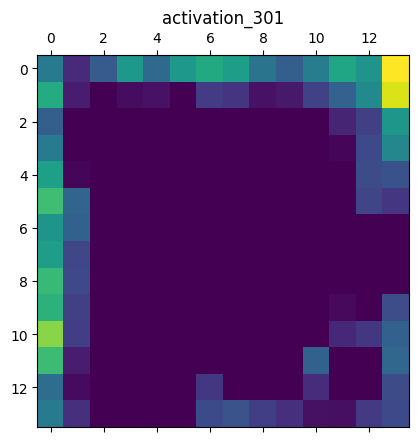

activation_303 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

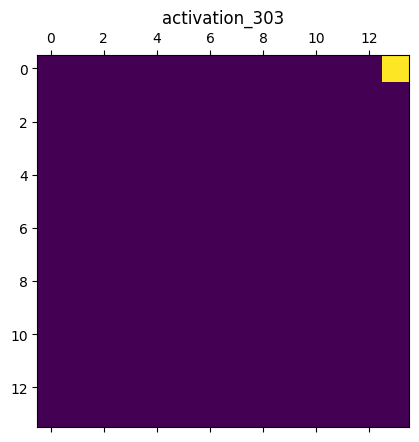

separable_conv_2_normal_left1_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

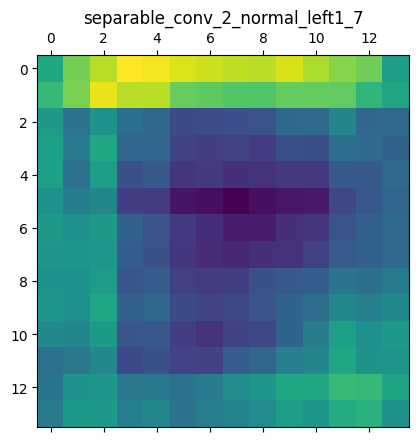

separable_conv_2_normal_right1_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

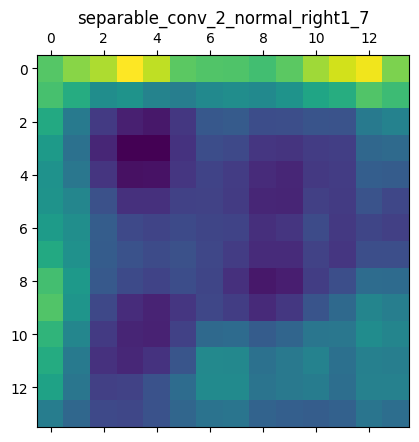

separable_conv_2_normal_left2_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

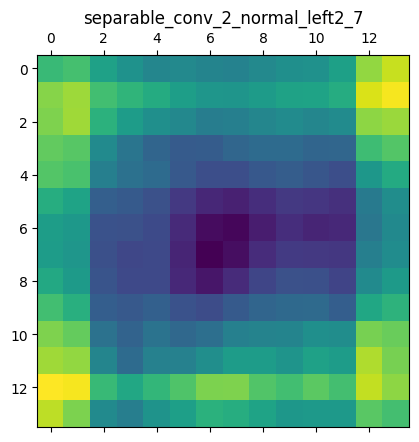

separable_conv_2_normal_right2_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

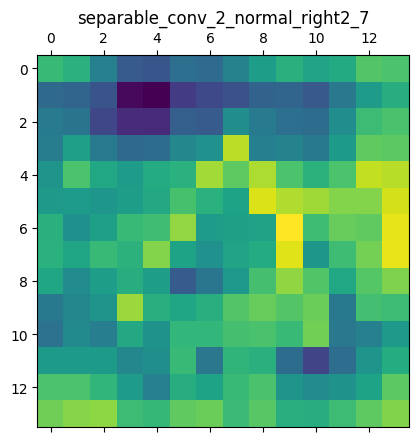

separable_conv_2_normal_left5_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

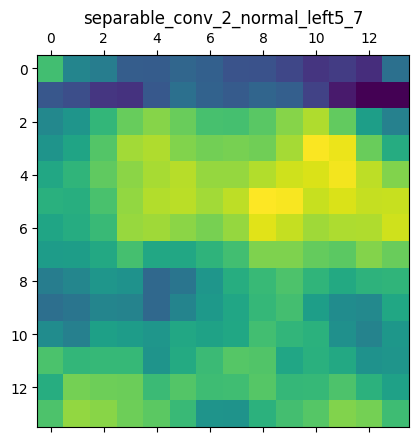

separable_conv_2_bn_normal_left1_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

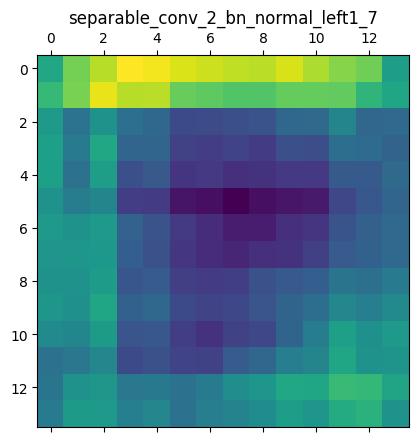

separable_conv_2_bn_normal_right1_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

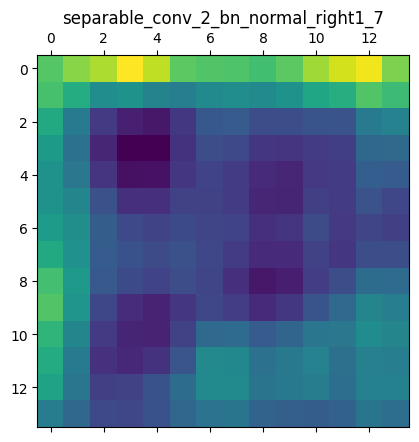

separable_conv_2_bn_normal_left2_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

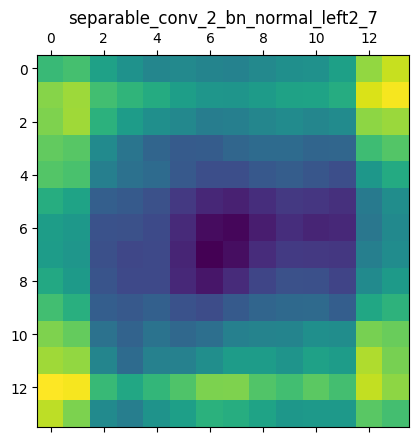

separable_conv_2_bn_normal_right2_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

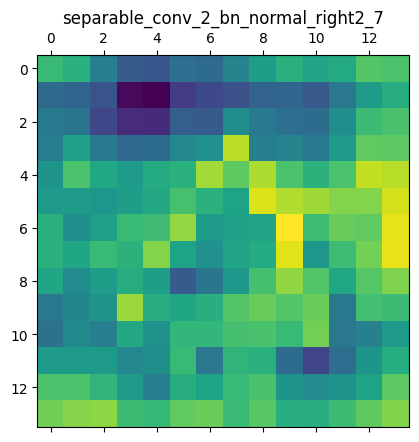

normal_left3_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

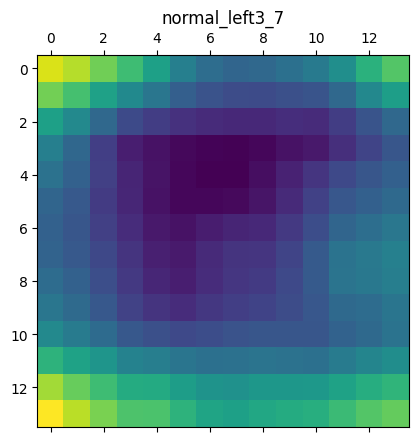

normal_left4_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

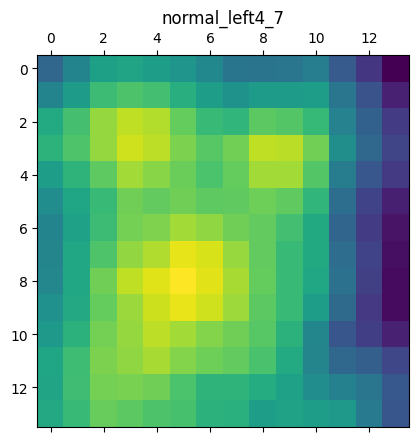

normal_right4_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

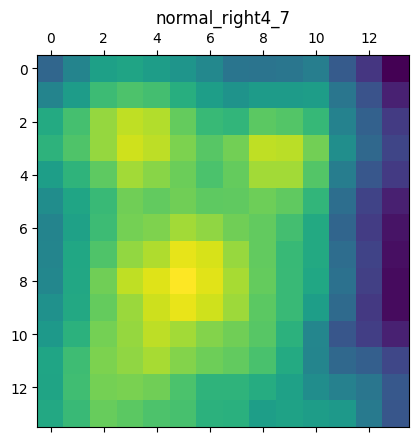

separable_conv_2_bn_normal_left5_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

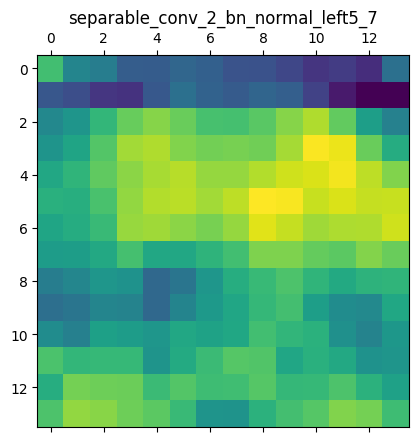

normal_add_1_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

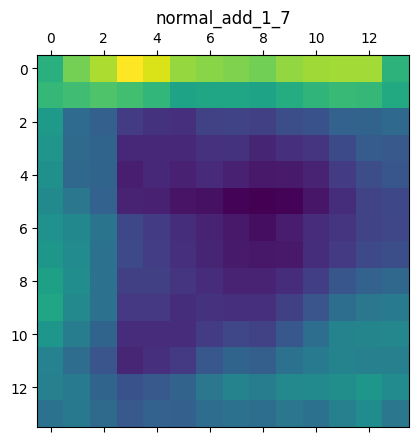

normal_add_2_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

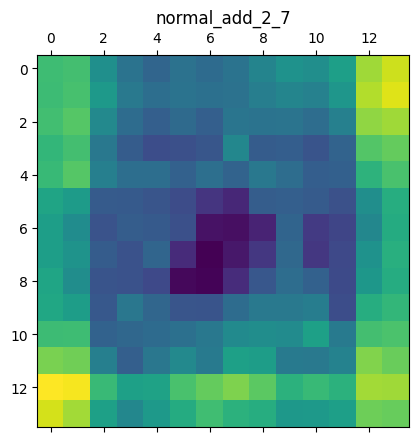

normal_add_3_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

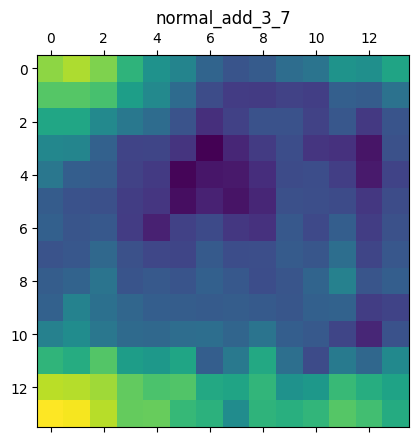

normal_add_4_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

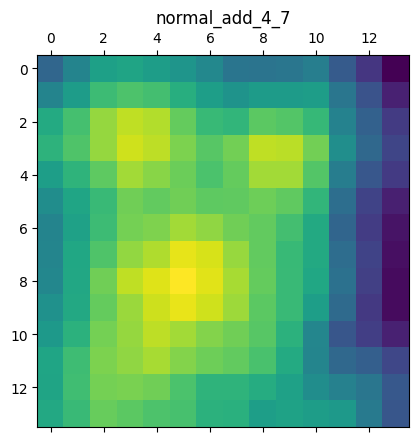

normal_add_5_7 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

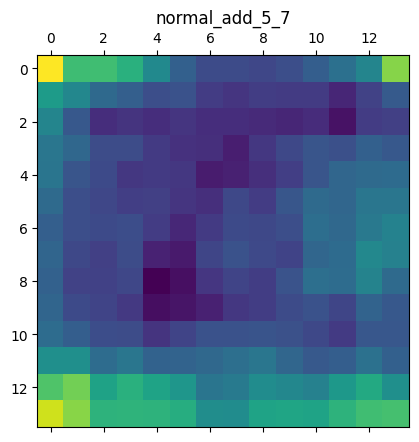

normal_concat_7 (1, 14, 14, 528)


<Figure size 640x480 with 0 Axes>

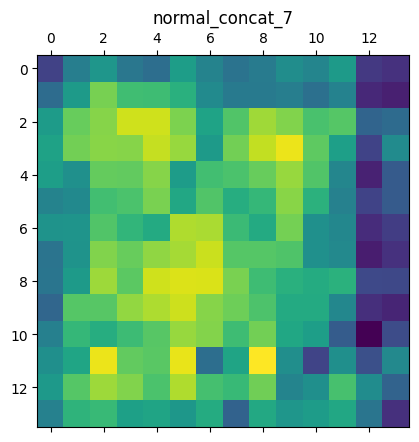

activation_304 (1, 14, 14, 528)


<Figure size 640x480 with 0 Axes>

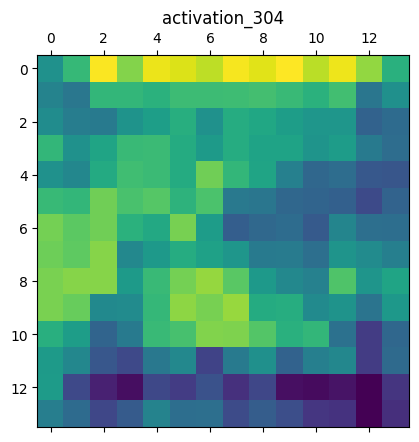

activation_305 (1, 14, 14, 528)


<Figure size 640x480 with 0 Axes>

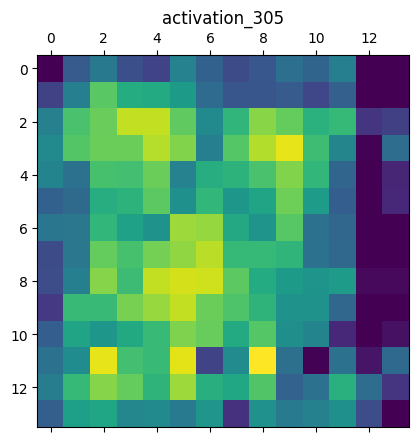

adjust_conv_projection_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

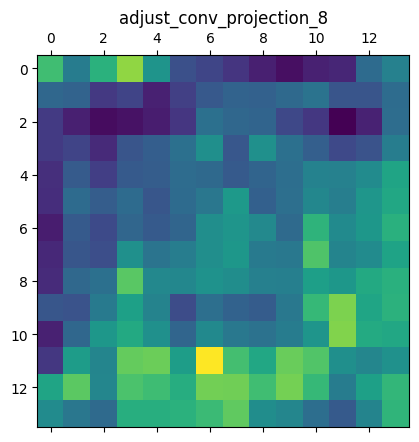

normal_conv_1_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

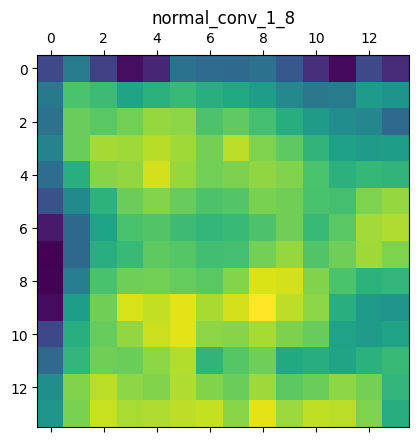

adjust_bn_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

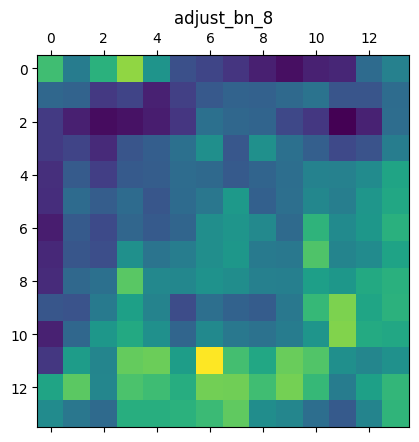

normal_bn_1_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

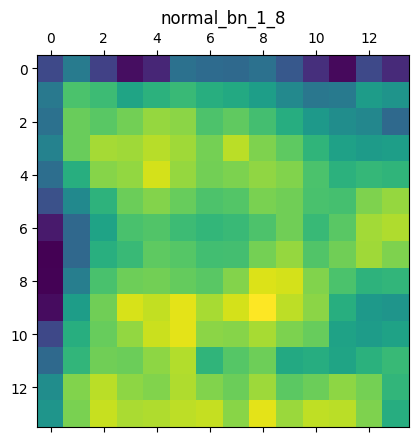

activation_306 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

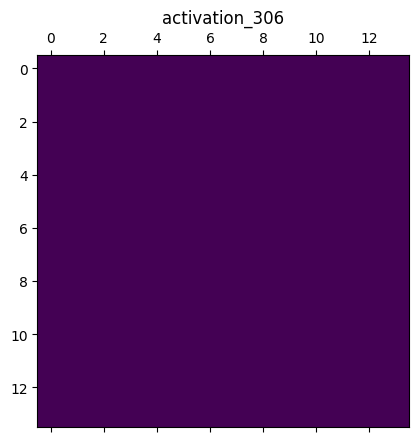

activation_308 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

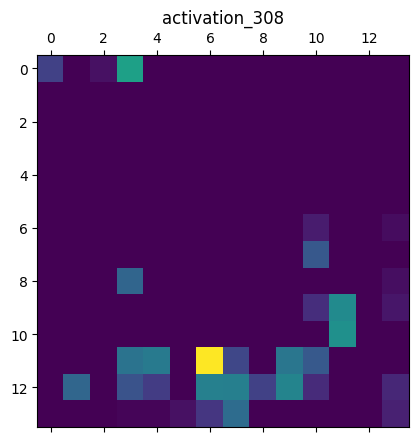

activation_310 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

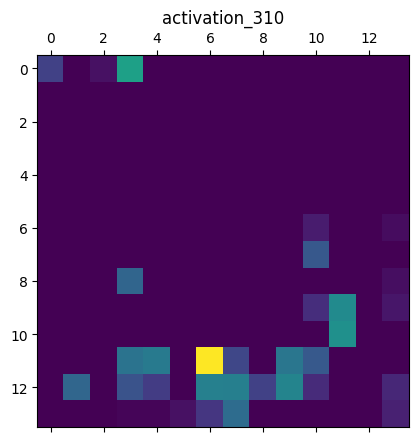

activation_312 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

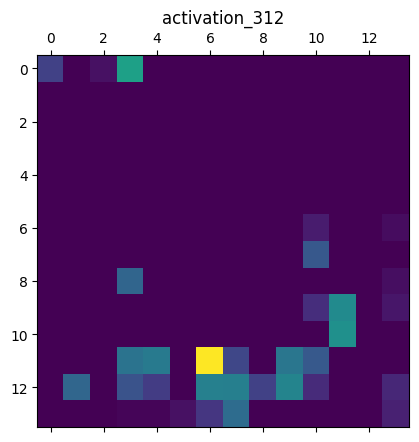

activation_314 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

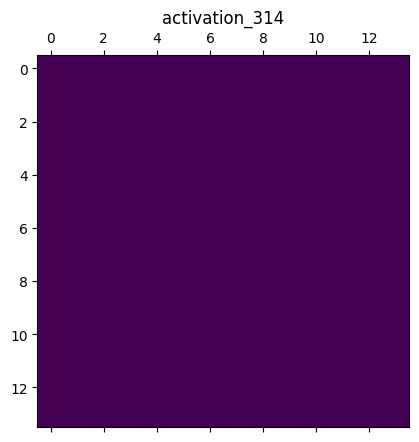

separable_conv_1_normal_left1_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

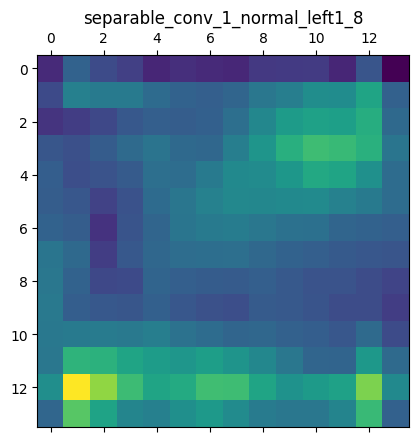

separable_conv_1_normal_right1_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

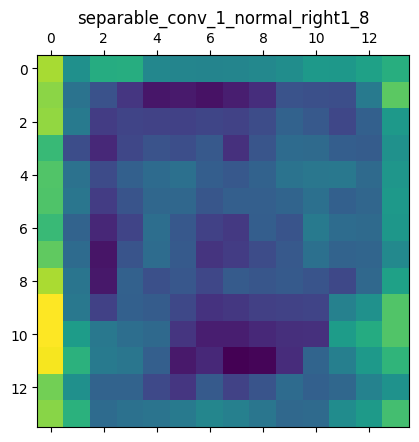

separable_conv_1_normal_left2_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

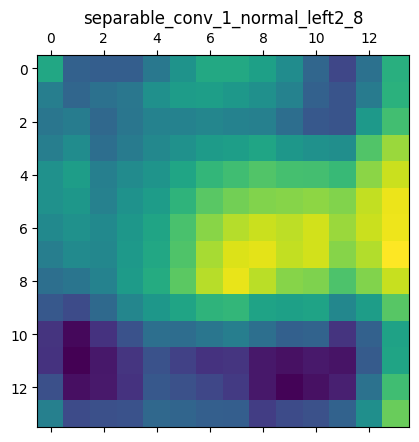

separable_conv_1_normal_right2_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

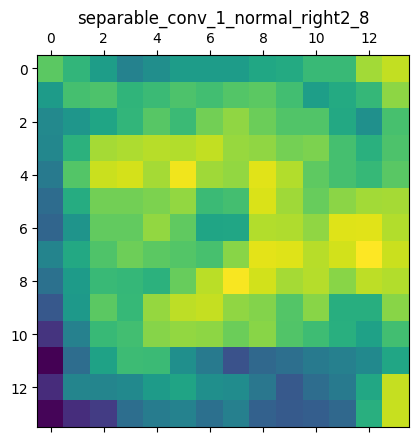

separable_conv_1_normal_left5_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

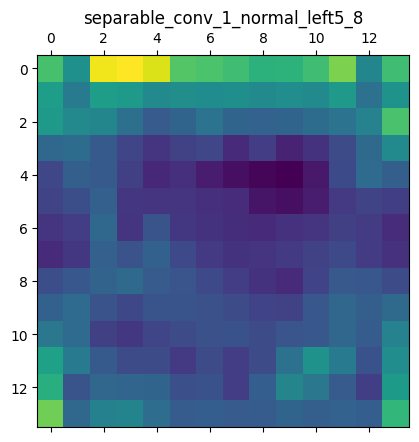

separable_conv_1_bn_normal_left1_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

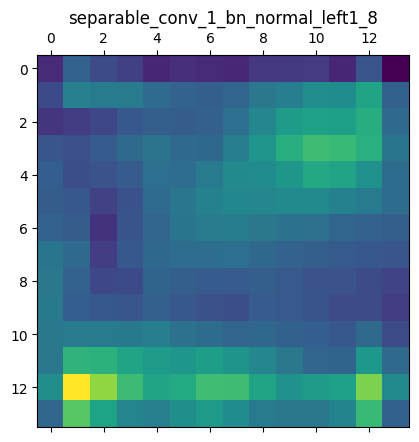

separable_conv_1_bn_normal_right1_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

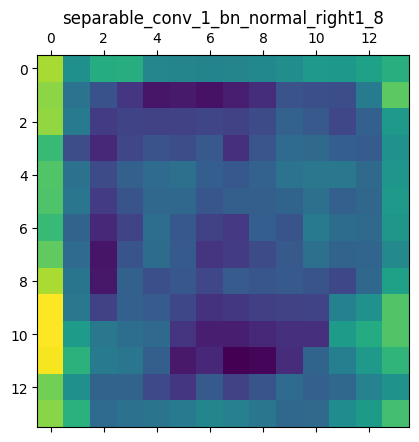

separable_conv_1_bn_normal_left2_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

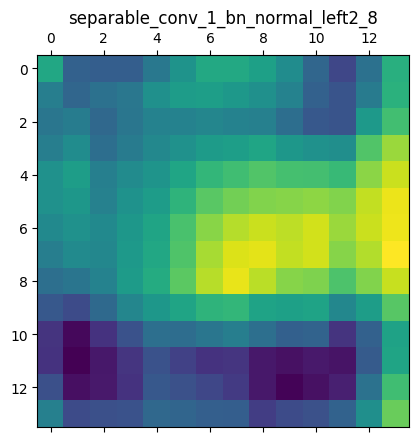

separable_conv_1_bn_normal_right2_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

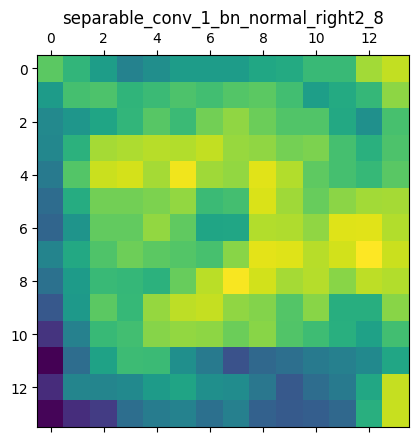

separable_conv_1_bn_normal_left5_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

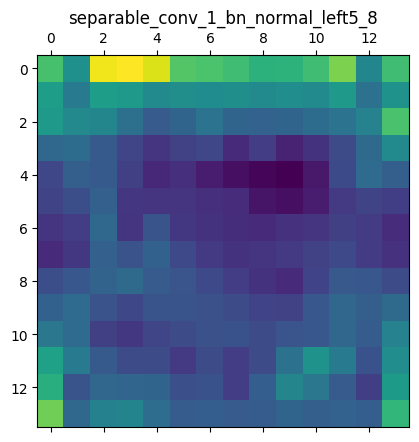

activation_307 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

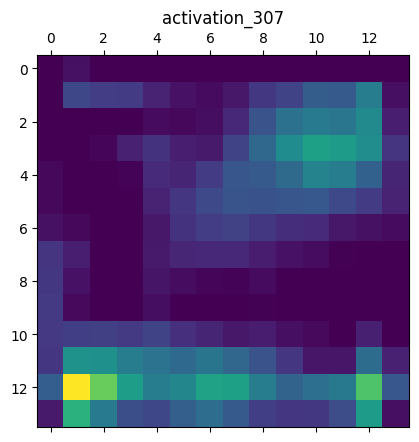

activation_309 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

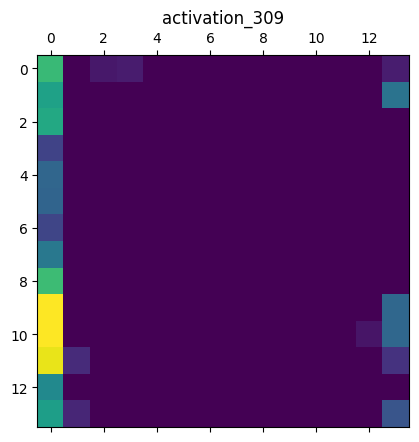

activation_311 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

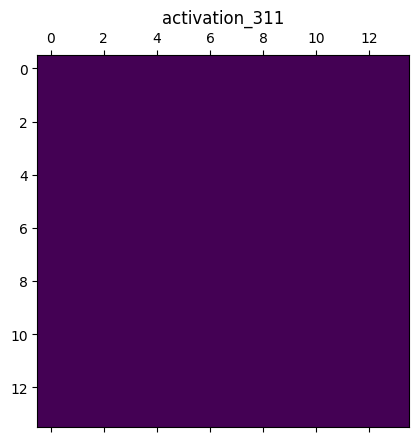

activation_313 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

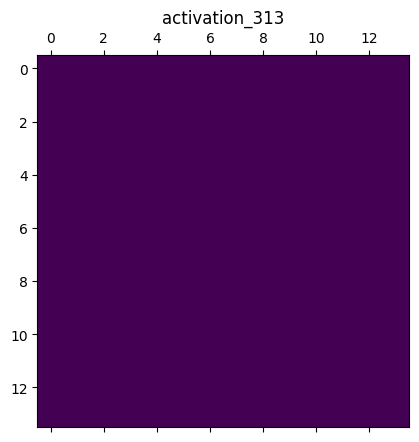

activation_315 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

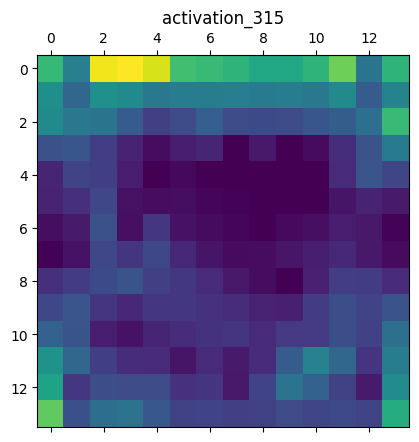

separable_conv_2_normal_left1_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

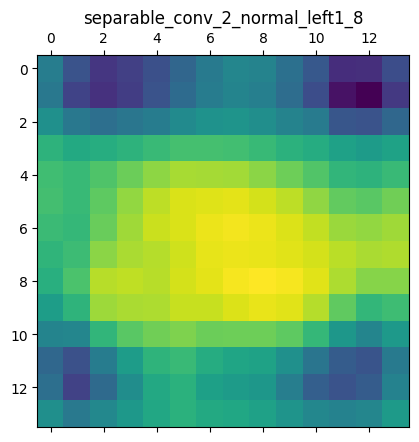

separable_conv_2_normal_right1_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

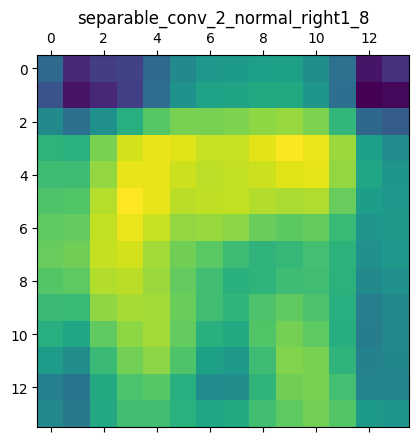

separable_conv_2_normal_left2_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

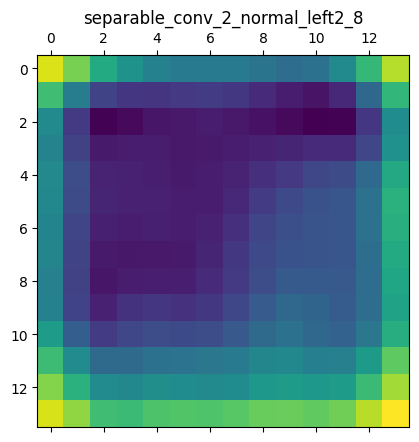

separable_conv_2_normal_right2_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

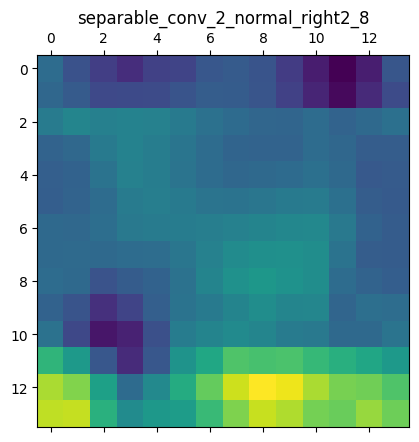

separable_conv_2_normal_left5_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

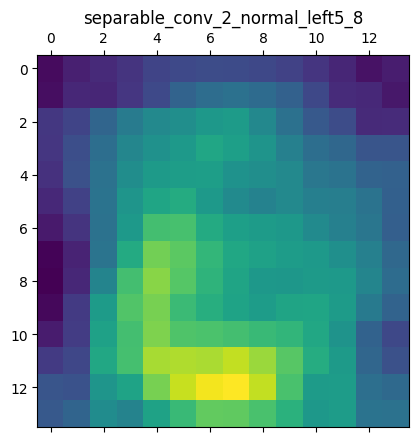

separable_conv_2_bn_normal_left1_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

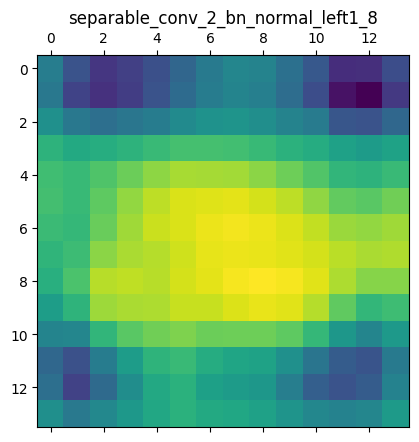

separable_conv_2_bn_normal_right1_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

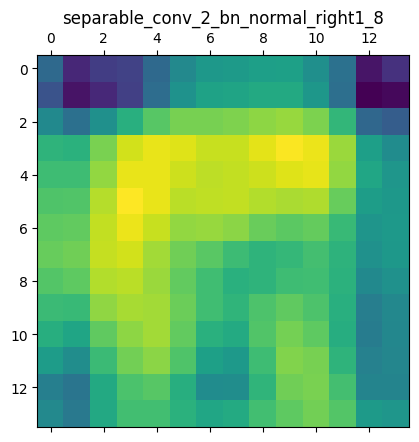

separable_conv_2_bn_normal_left2_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

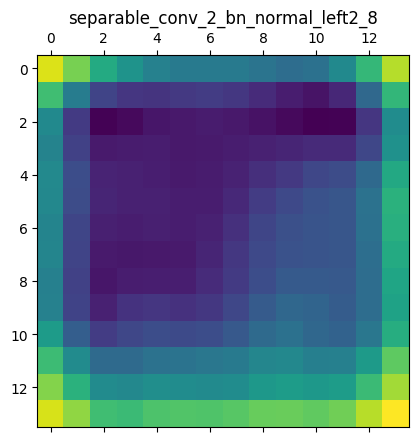

separable_conv_2_bn_normal_right2_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

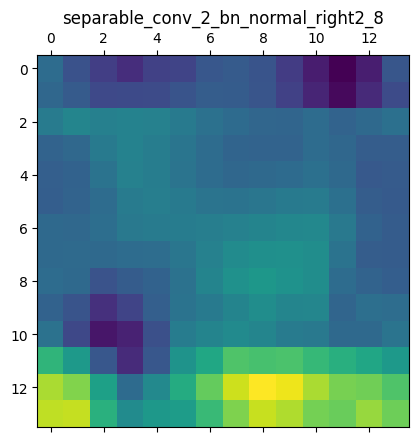

normal_left3_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

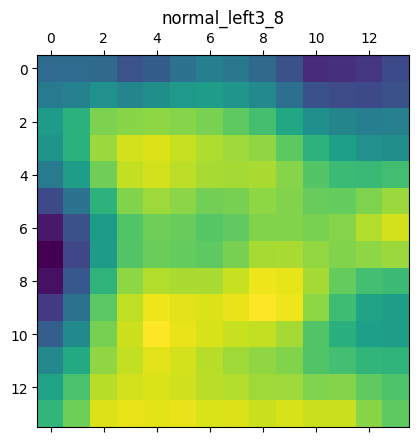

normal_left4_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

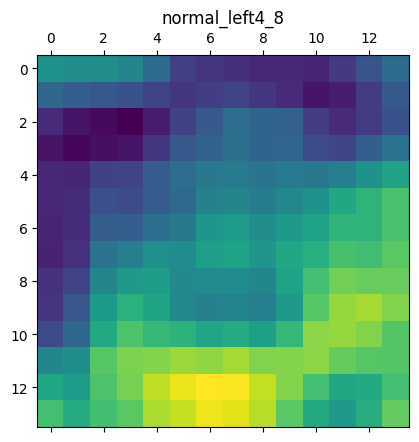

normal_right4_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

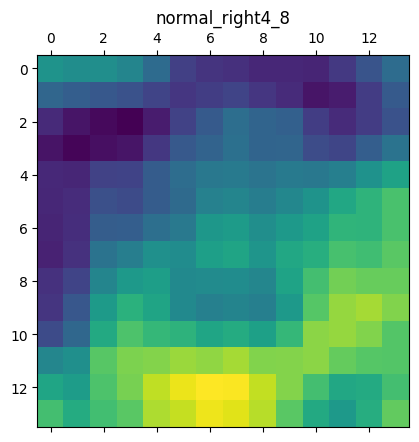

separable_conv_2_bn_normal_left5_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

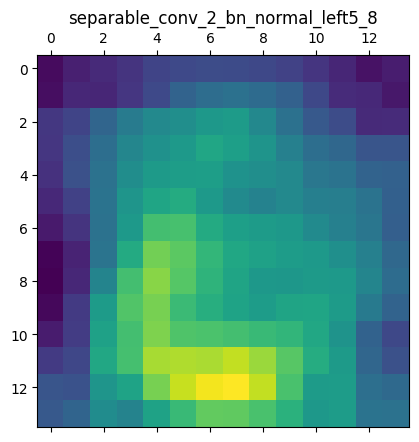

normal_add_1_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

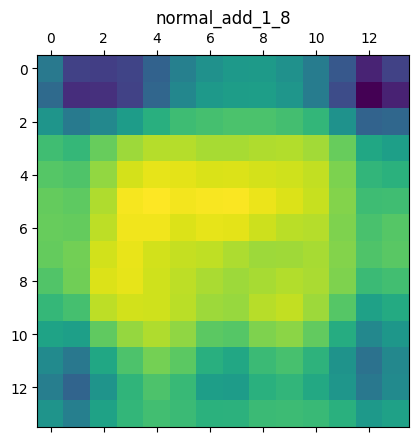

normal_add_2_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

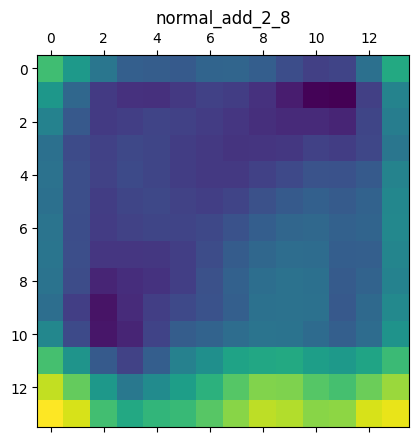

normal_add_3_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

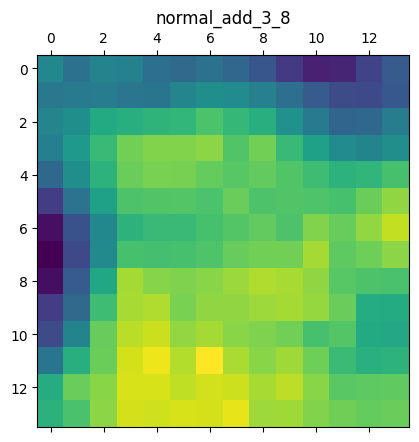

normal_add_4_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

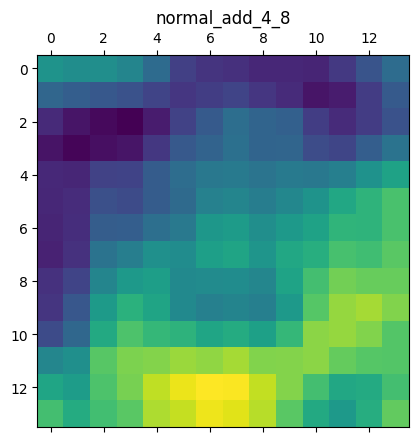

normal_add_5_8 (1, 14, 14, 88)


<Figure size 640x480 with 0 Axes>

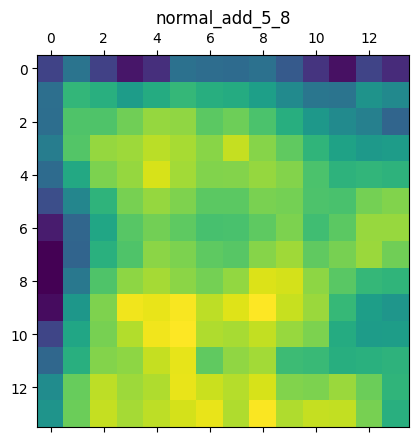

normal_concat_8 (1, 14, 14, 528)


<Figure size 640x480 with 0 Axes>

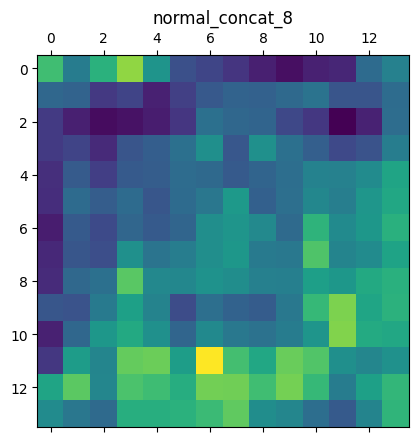

activation_317 (1, 14, 14, 528)


<Figure size 640x480 with 0 Axes>

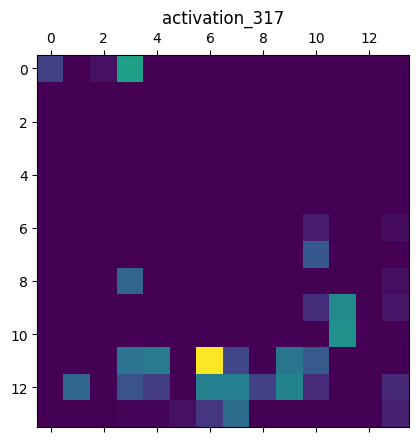

activation_316 (1, 14, 14, 528)


<Figure size 640x480 with 0 Axes>

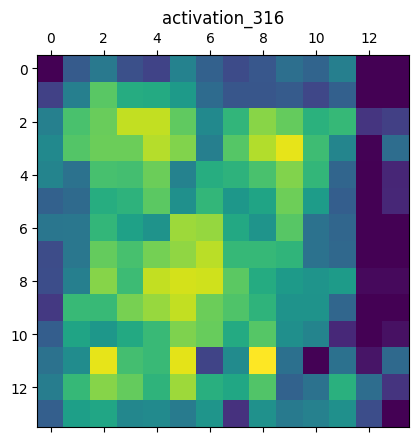

reduction_conv_1_reduce_8 (1, 14, 14, 176)


<Figure size 640x480 with 0 Axes>

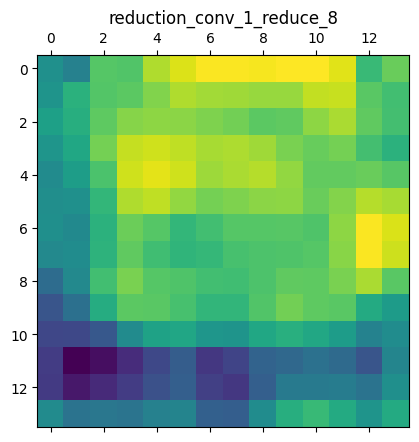

adjust_conv_projection_reduce_8 (1, 14, 14, 176)


<Figure size 640x480 with 0 Axes>

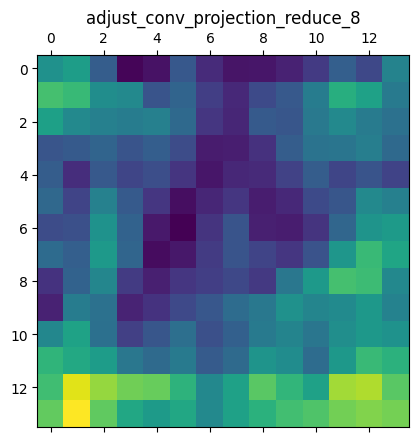

reduction_bn_1_reduce_8 (1, 14, 14, 176)


<Figure size 640x480 with 0 Axes>

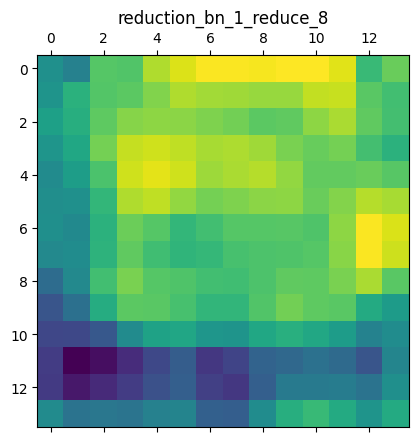

adjust_bn_reduce_8 (1, 14, 14, 176)


<Figure size 640x480 with 0 Axes>

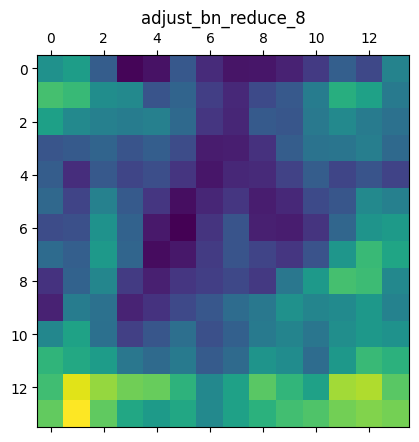

activation_318 (1, 14, 14, 176)


<Figure size 640x480 with 0 Axes>

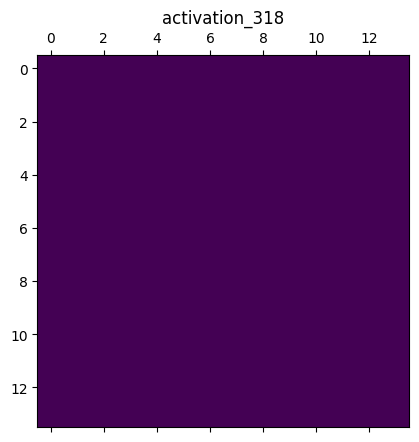

activation_320 (1, 14, 14, 176)


<Figure size 640x480 with 0 Axes>

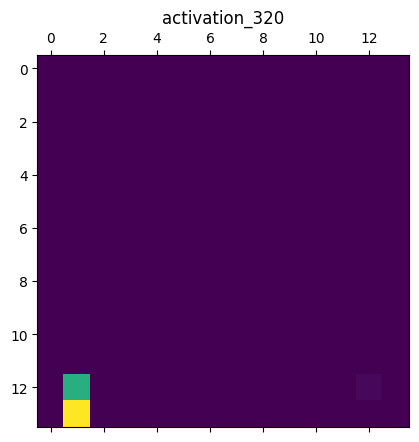

separable_conv_1_pad_reduction_left1_reduce_8 (1, 17, 17, 176)


<Figure size 640x480 with 0 Axes>

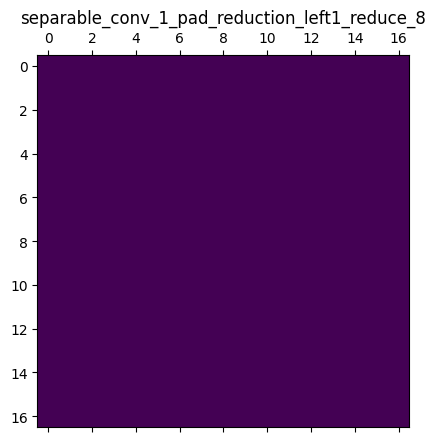

separable_conv_1_pad_reduction_right1_reduce_8 (1, 19, 19, 176)


<Figure size 640x480 with 0 Axes>

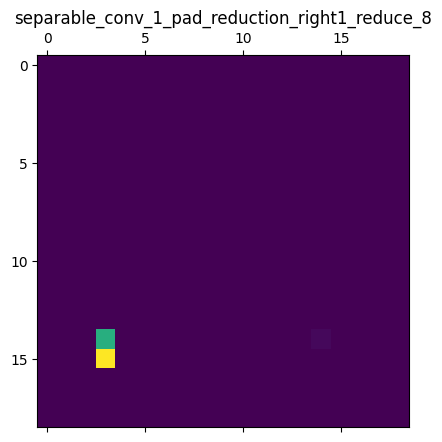

separable_conv_1_reduction_left1_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

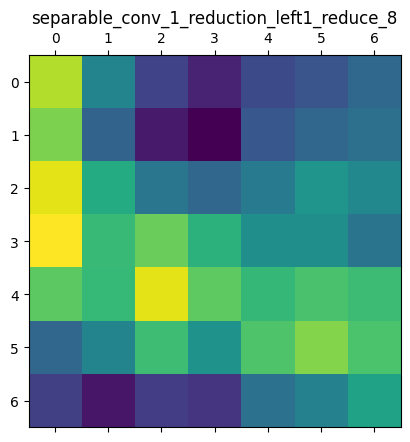

separable_conv_1_reduction_right1_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

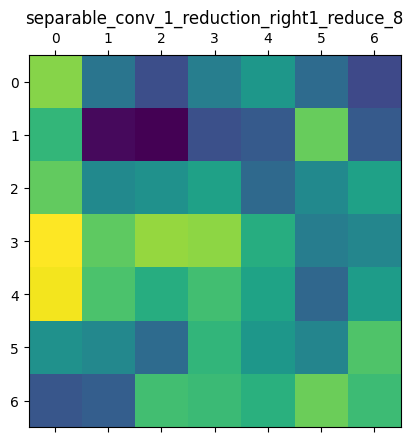

separable_conv_1_bn_reduction_left1_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

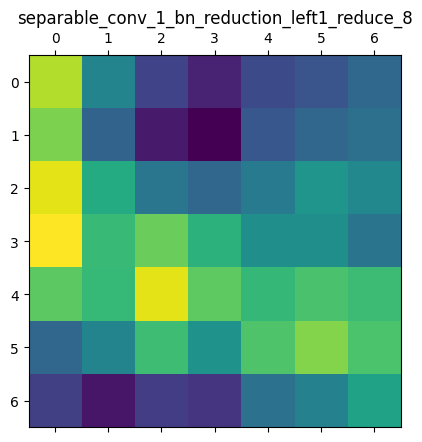

separable_conv_1_bn_reduction_right1_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

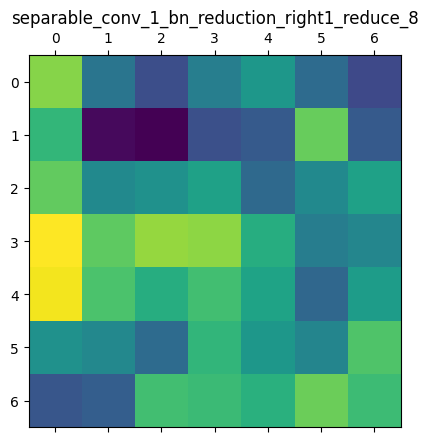

activation_319 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

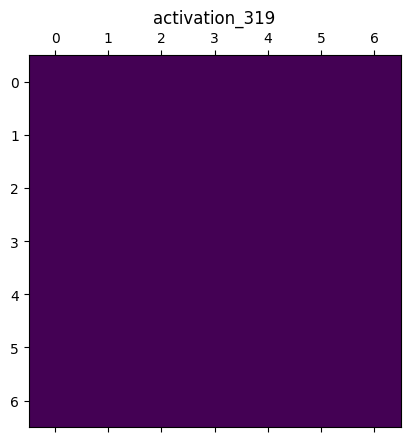

activation_321 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

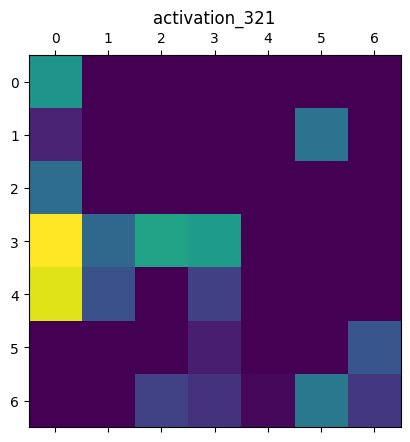

separable_conv_2_reduction_left1_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

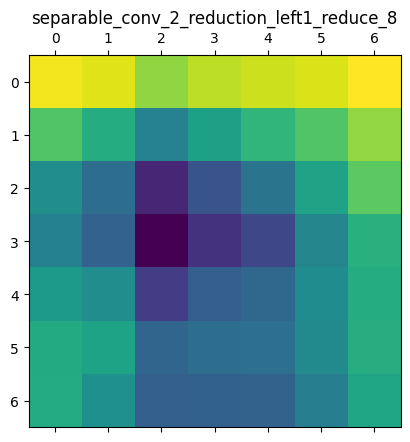

separable_conv_2_reduction_right1_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

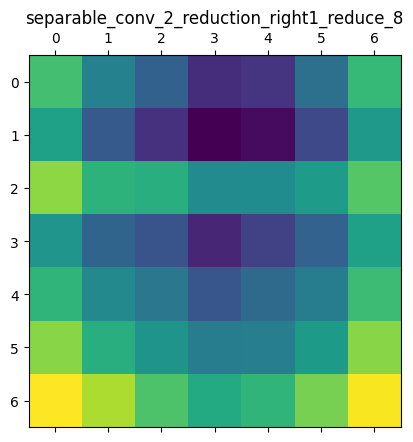

activation_322 (1, 14, 14, 176)


<Figure size 640x480 with 0 Axes>

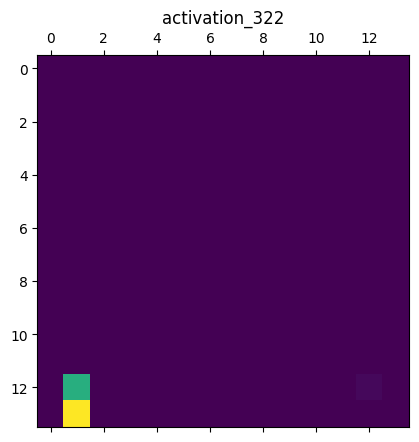

separable_conv_2_bn_reduction_left1_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

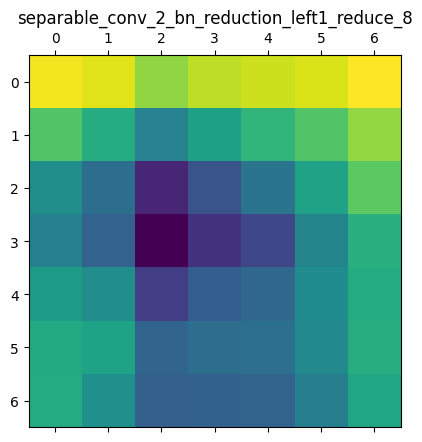

separable_conv_2_bn_reduction_right1_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

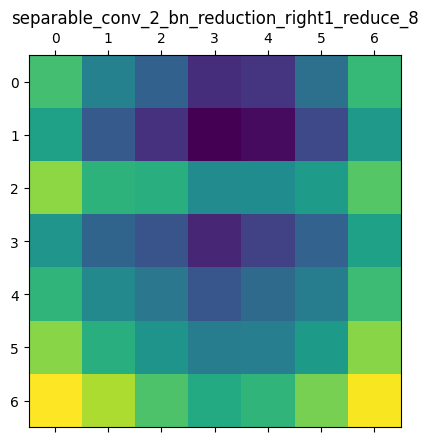

separable_conv_1_pad_reduction_right2_reduce_8 (1, 19, 19, 176)


<Figure size 640x480 with 0 Axes>

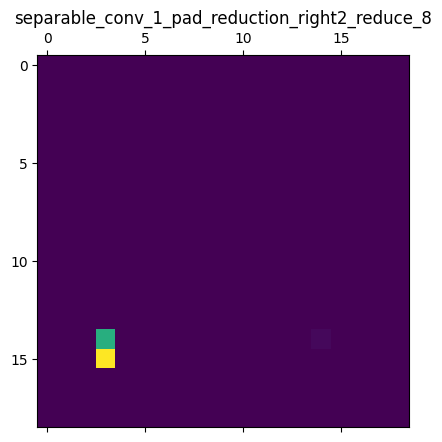

activation_324 (1, 14, 14, 176)


<Figure size 640x480 with 0 Axes>

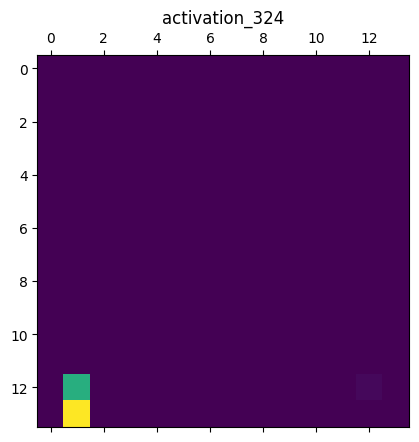

reduction_add_1_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

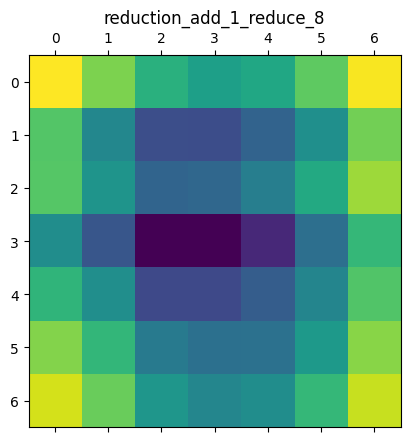

separable_conv_1_reduction_right2_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

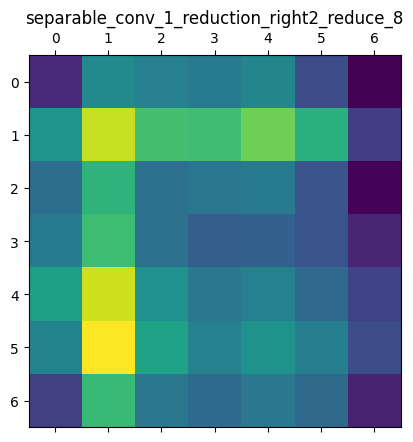

separable_conv_1_pad_reduction_right3_reduce_8 (1, 17, 17, 176)


<Figure size 640x480 with 0 Axes>

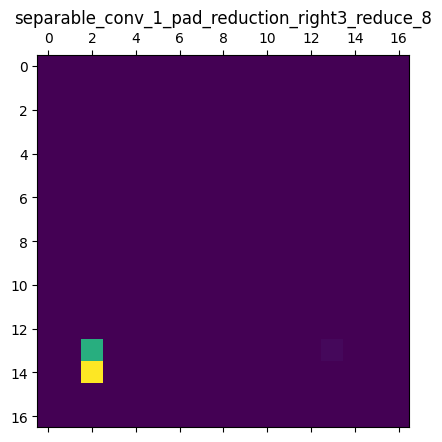

activation_326 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

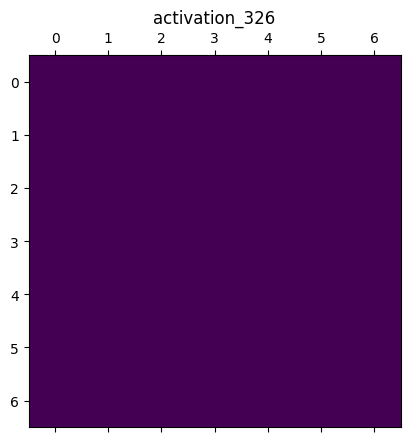

separable_conv_1_bn_reduction_right2_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

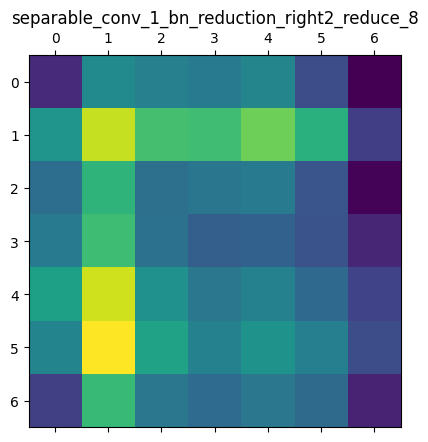

separable_conv_1_reduction_right3_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

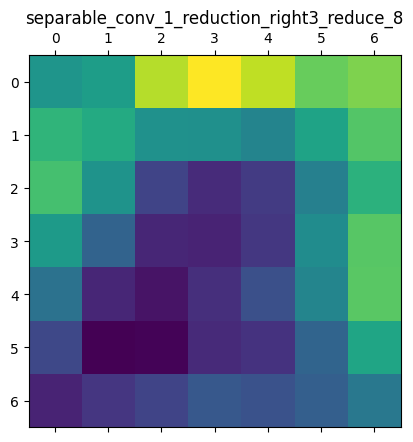

separable_conv_1_reduction_left4_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

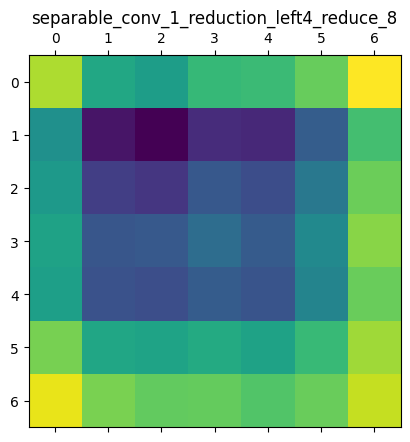

activation_323 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

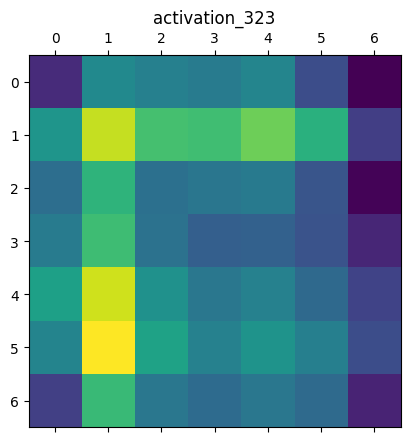

separable_conv_1_bn_reduction_right3_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

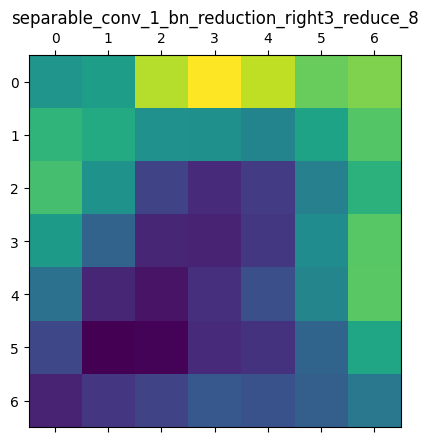

separable_conv_1_bn_reduction_left4_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

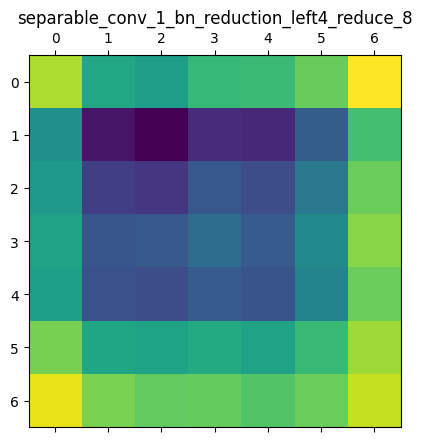

reduction_pad_1_reduce_8 (1, 15, 15, 176)


<Figure size 640x480 with 0 Axes>

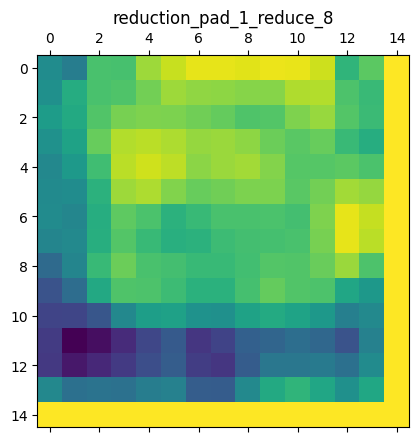

separable_conv_2_reduction_right2_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

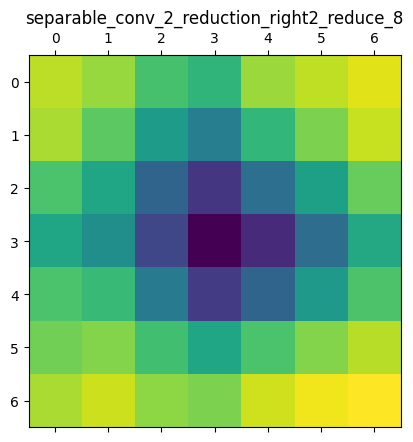

activation_325 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

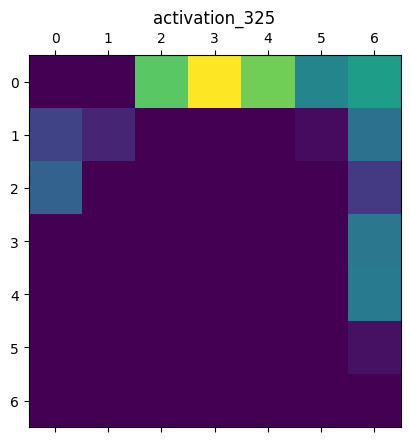

activation_327 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

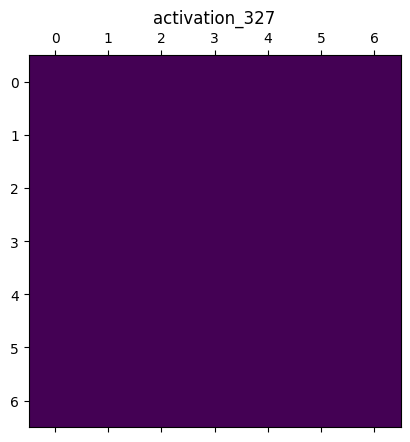

reduction_left2_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

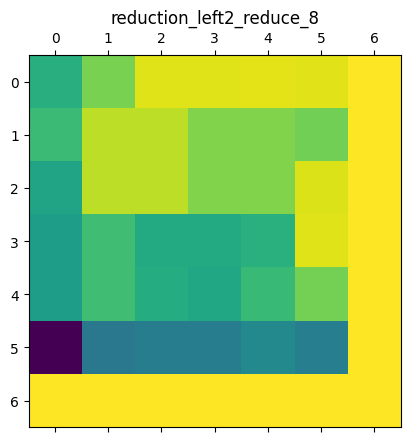

separable_conv_2_bn_reduction_right2_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

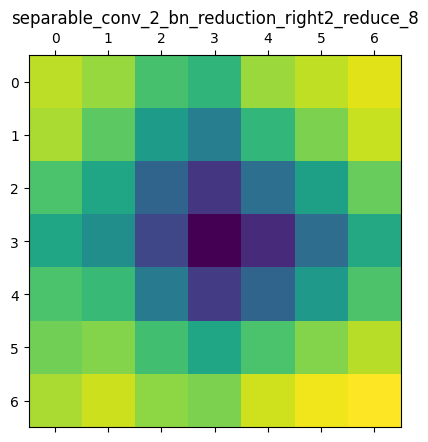

separable_conv_2_reduction_right3_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

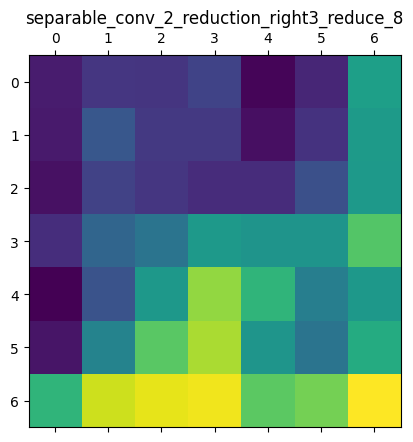

separable_conv_2_reduction_left4_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

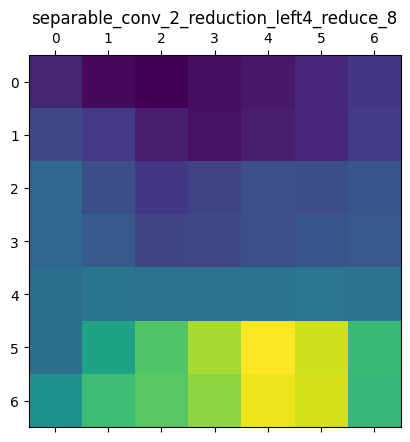

adjust_relu_1_9 (1, 14, 14, 528)


<Figure size 640x480 with 0 Axes>

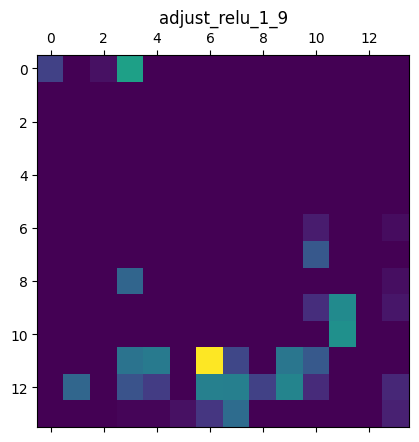

reduction_add_2_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

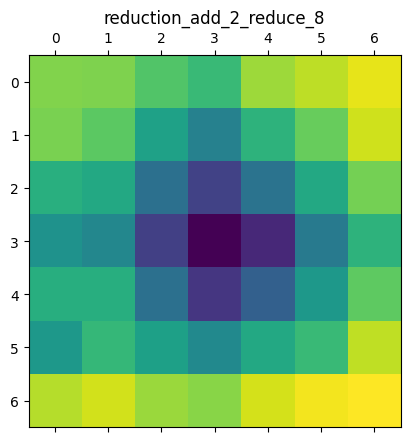

reduction_left3_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

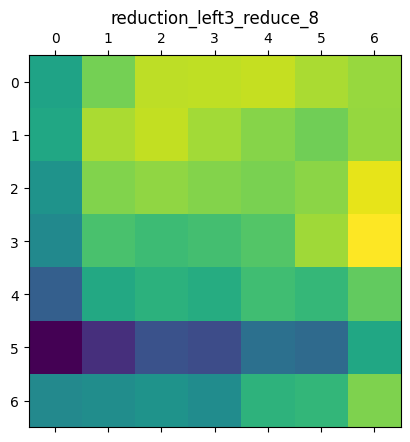

separable_conv_2_bn_reduction_right3_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

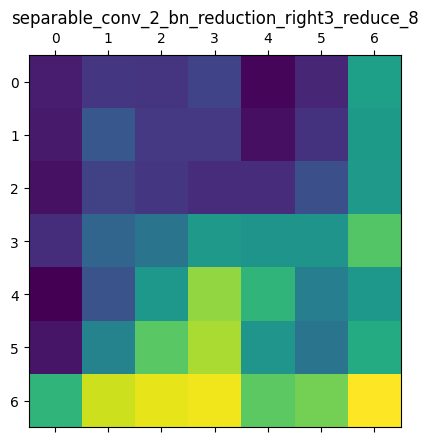

reduction_left4_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

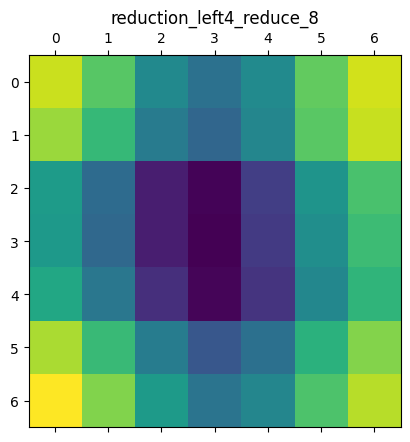

separable_conv_2_bn_reduction_left4_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

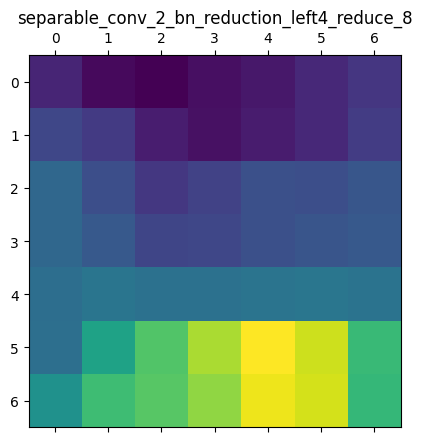

reduction_right5_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

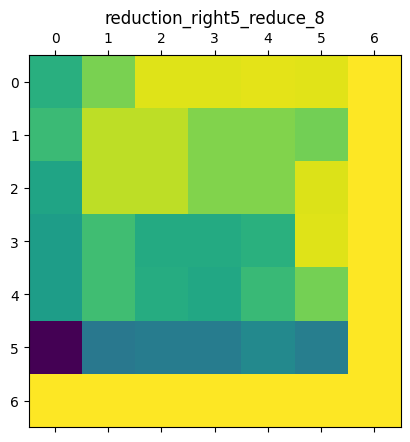

zero_padding2d_7 (1, 15, 15, 528)


<Figure size 640x480 with 0 Axes>

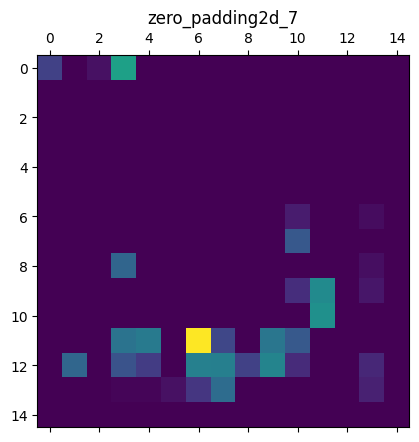

reduction_add3_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

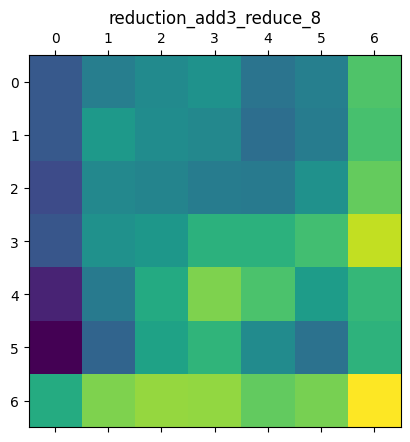

add_7 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

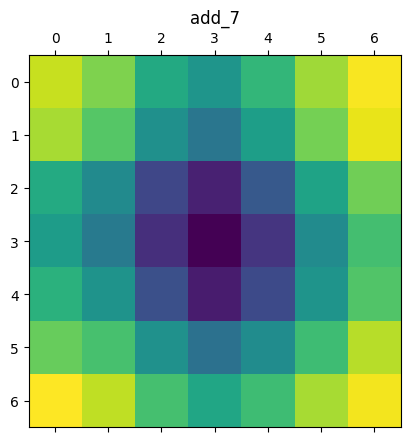

reduction_add4_reduce_8 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

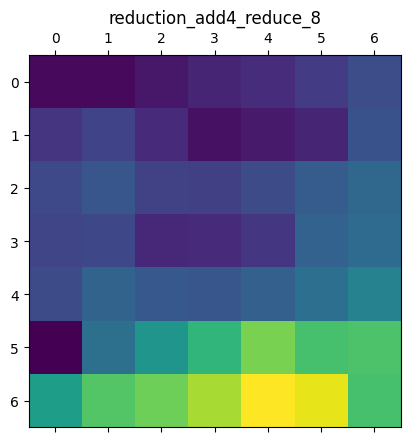

cropping2d_7 (1, 14, 14, 528)


<Figure size 640x480 with 0 Axes>

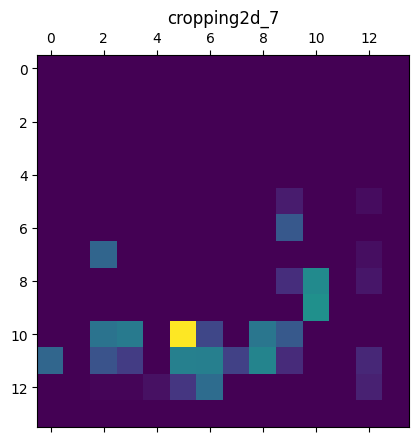

reduction_concat_reduce_8 (1, 7, 7, 704)


<Figure size 640x480 with 0 Axes>

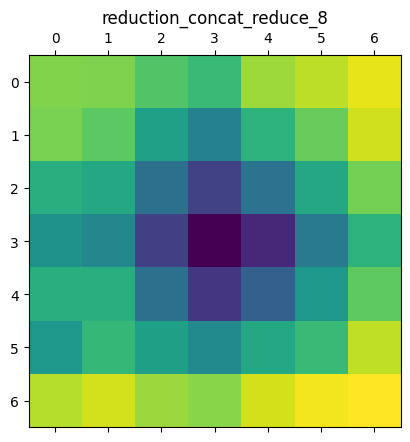

adjust_avg_pool_1_9 (1, 7, 7, 528)


<Figure size 640x480 with 0 Axes>

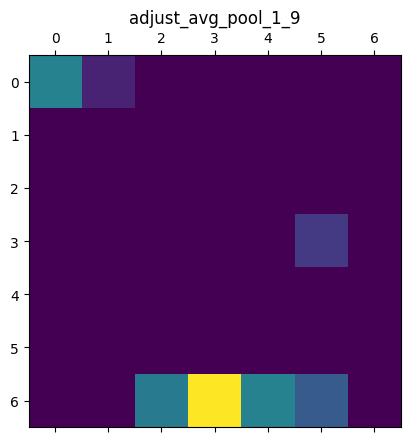

adjust_avg_pool_2_9 (1, 7, 7, 528)


<Figure size 640x480 with 0 Axes>

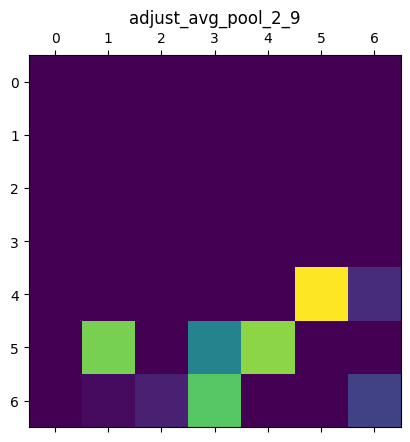

adjust_conv_1_9 (1, 7, 7, 88)


<Figure size 640x480 with 0 Axes>

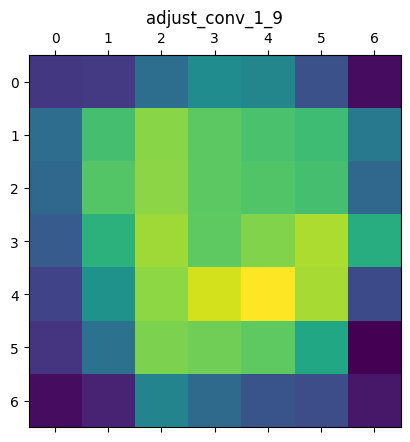

adjust_conv_2_9 (1, 7, 7, 88)


<Figure size 640x480 with 0 Axes>

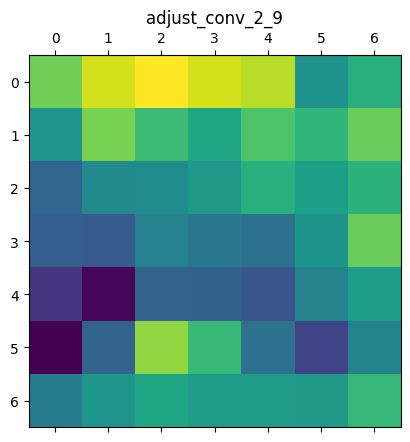

activation_328 (1, 7, 7, 704)


<Figure size 640x480 with 0 Axes>

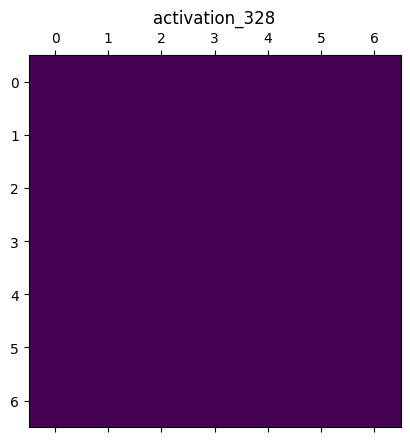

concatenate_7 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

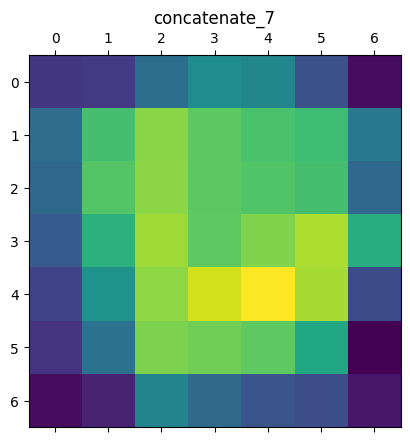

normal_conv_1_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

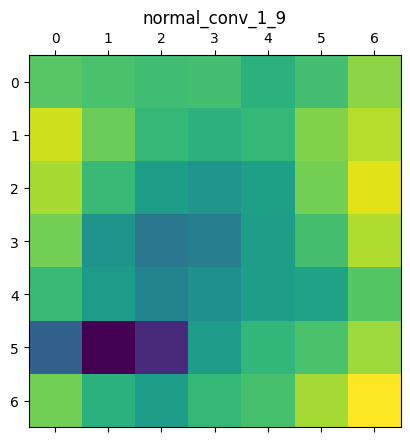

adjust_bn_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

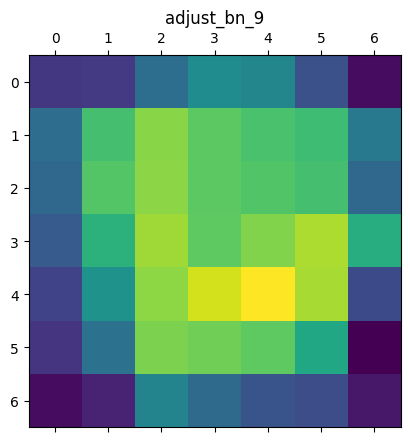

normal_bn_1_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

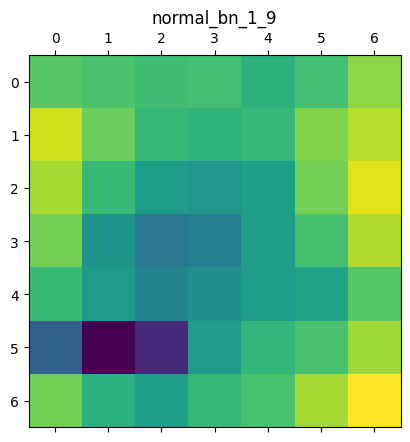

activation_329 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

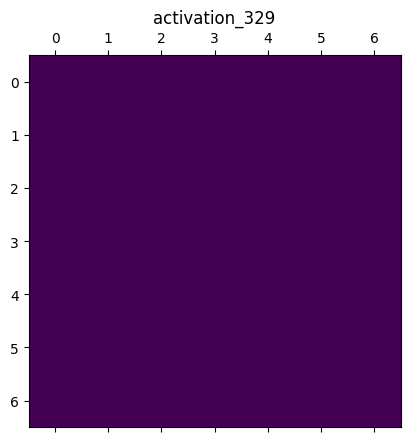

activation_331 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

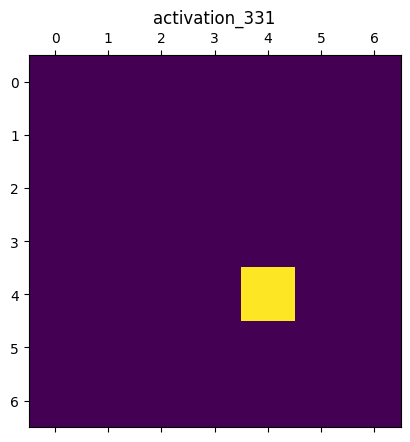

activation_333 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

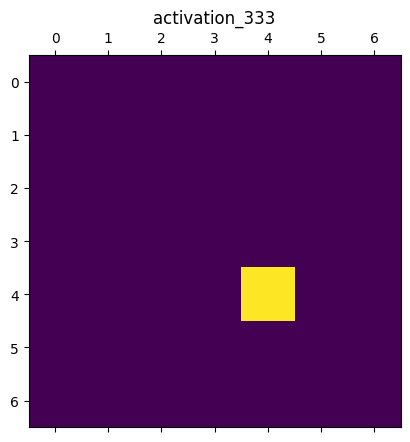

activation_335 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

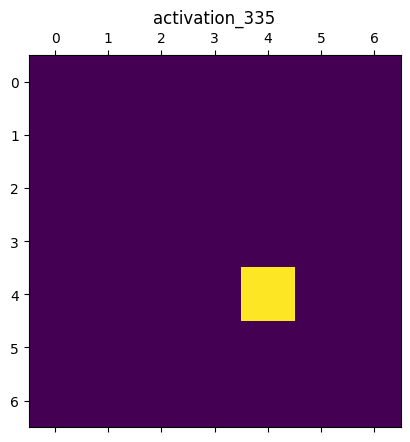

activation_337 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

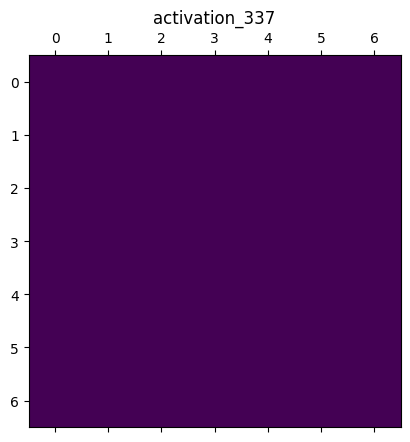

separable_conv_1_normal_left1_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

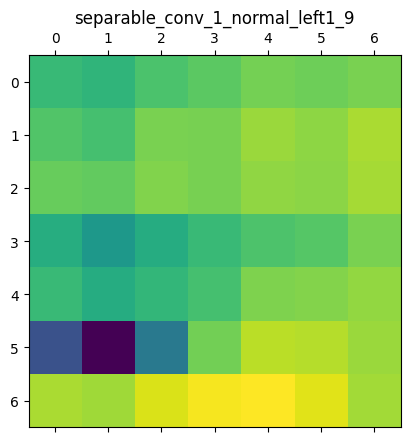

separable_conv_1_normal_right1_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

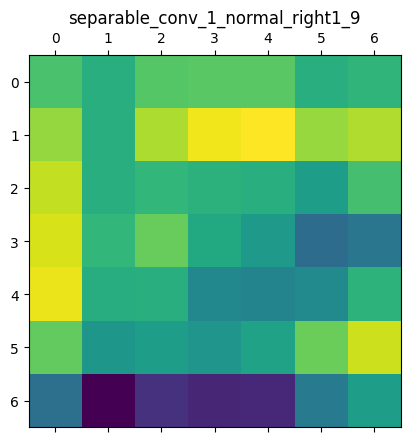

separable_conv_1_normal_left2_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

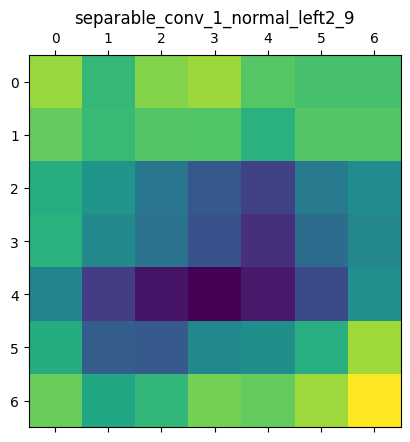

separable_conv_1_normal_right2_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

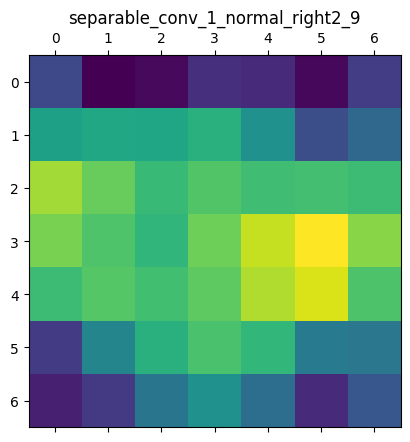

separable_conv_1_normal_left5_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

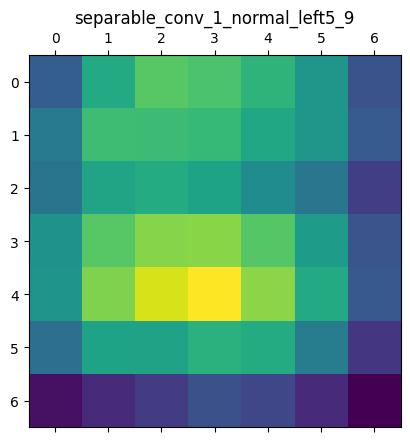

separable_conv_1_bn_normal_left1_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

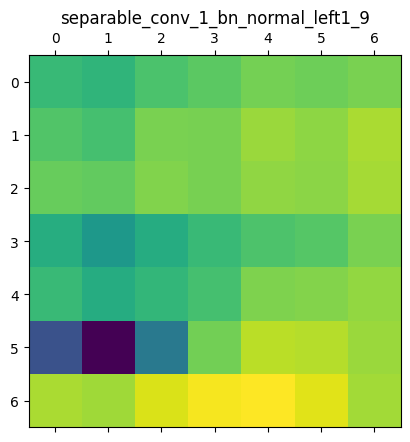

separable_conv_1_bn_normal_right1_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

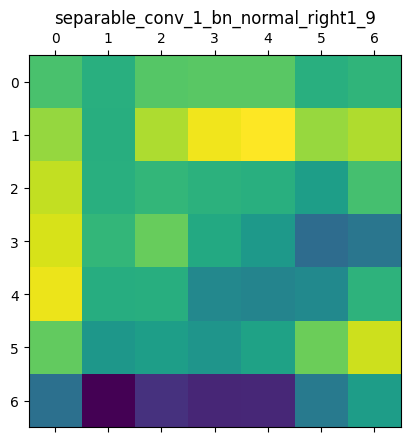

separable_conv_1_bn_normal_left2_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

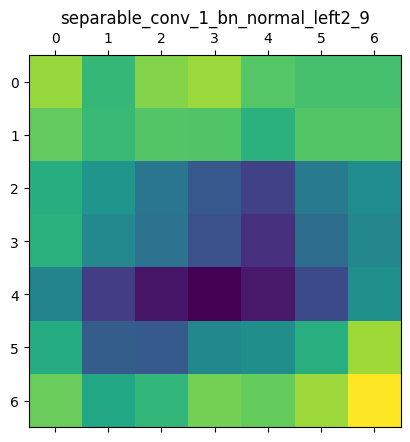

separable_conv_1_bn_normal_right2_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

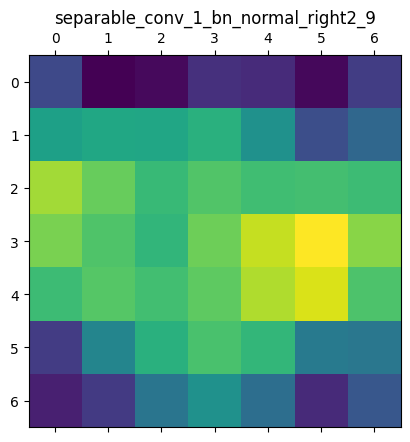

separable_conv_1_bn_normal_left5_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

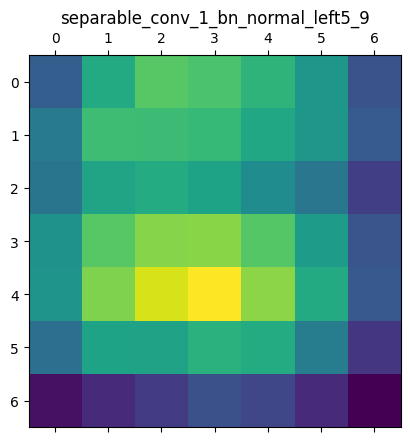

activation_330 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

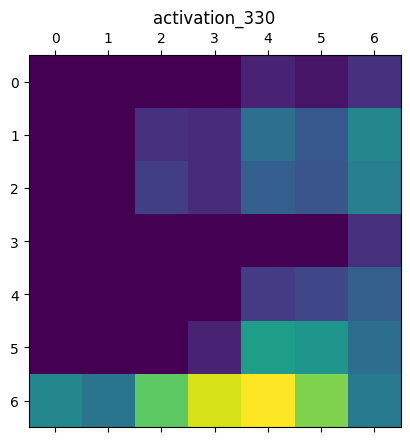

activation_332 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

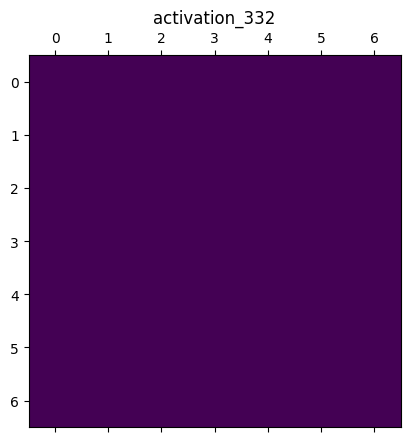

activation_334 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

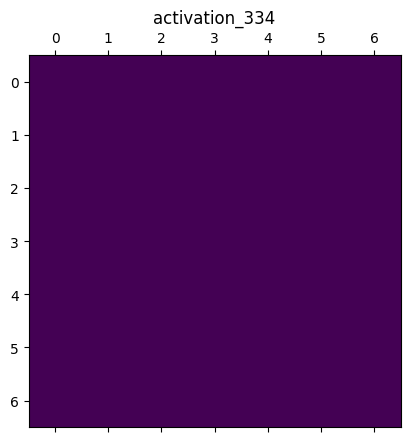

activation_336 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

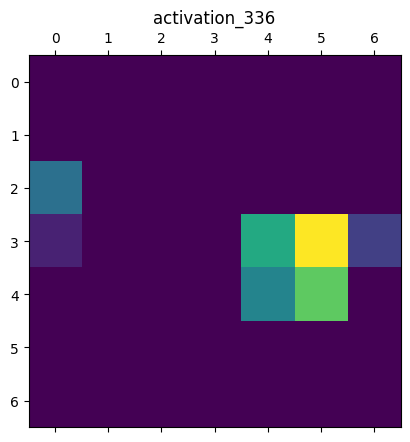

activation_338 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

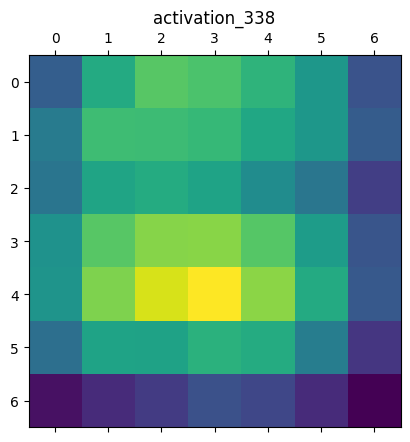

separable_conv_2_normal_left1_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

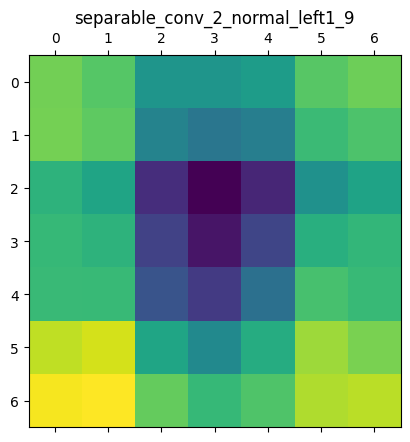

separable_conv_2_normal_right1_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

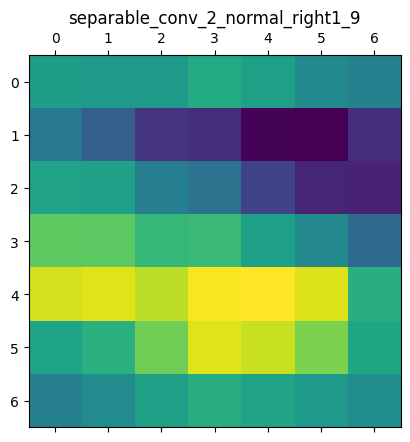

separable_conv_2_normal_left2_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

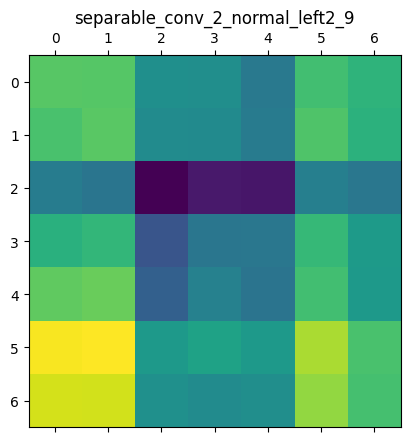

separable_conv_2_normal_right2_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

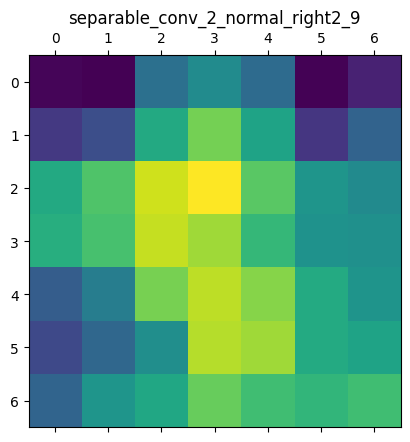

separable_conv_2_normal_left5_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

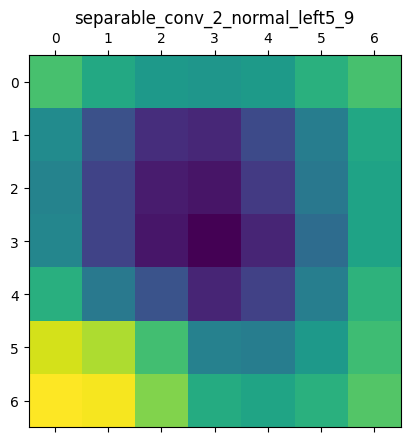

separable_conv_2_bn_normal_left1_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

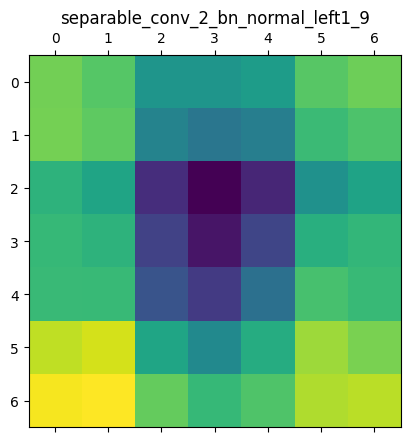

separable_conv_2_bn_normal_right1_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

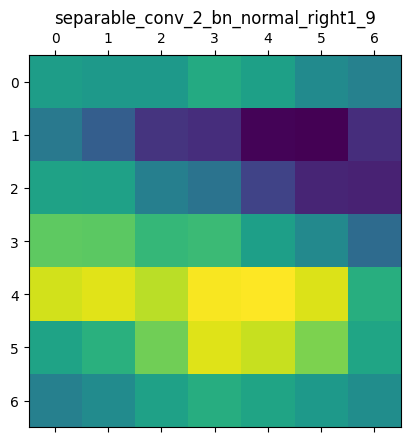

separable_conv_2_bn_normal_left2_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

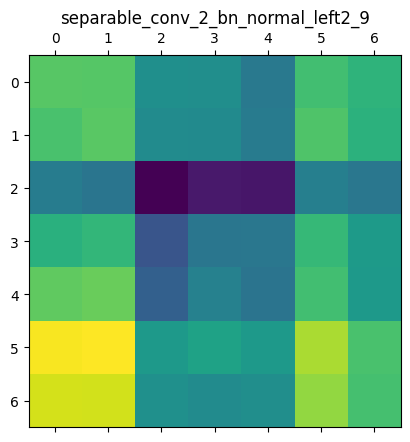

separable_conv_2_bn_normal_right2_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

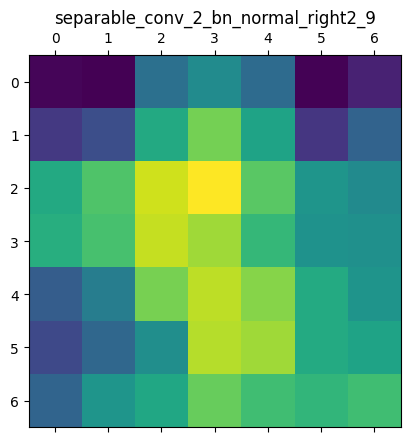

normal_left3_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

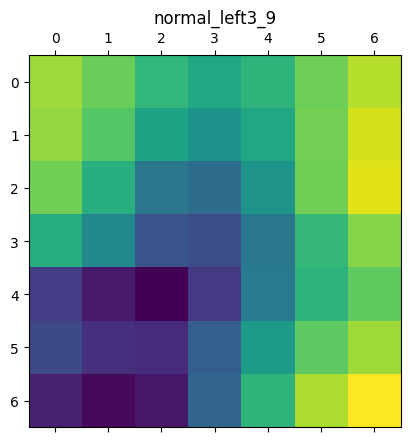

normal_left4_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

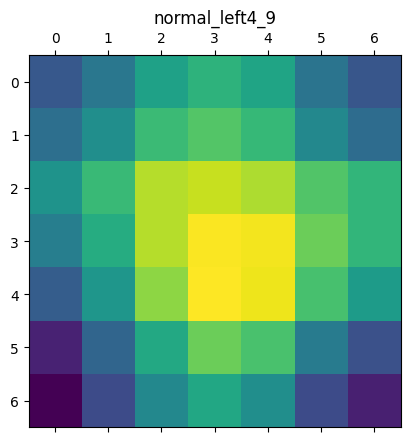

normal_right4_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

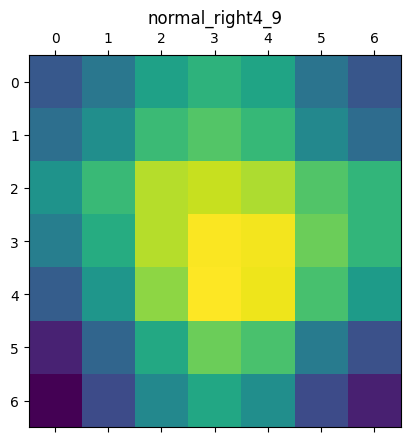

separable_conv_2_bn_normal_left5_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

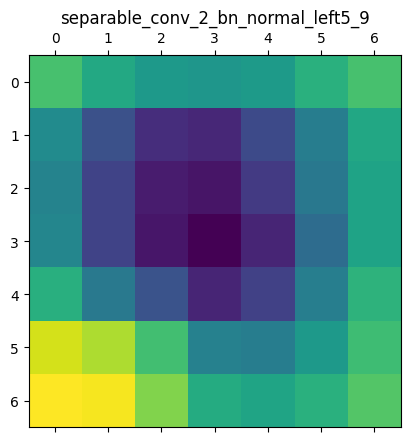

normal_add_1_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

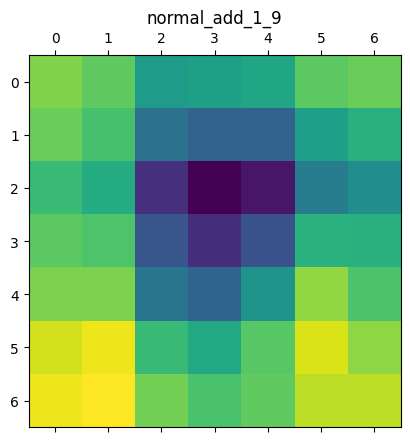

normal_add_2_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

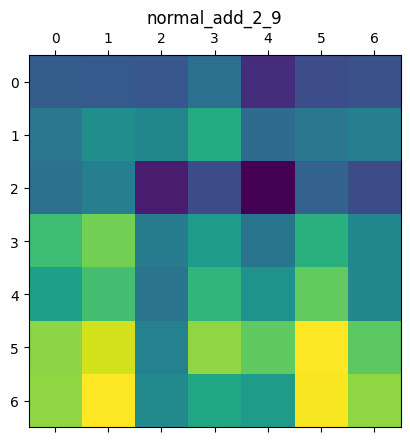

normal_add_3_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

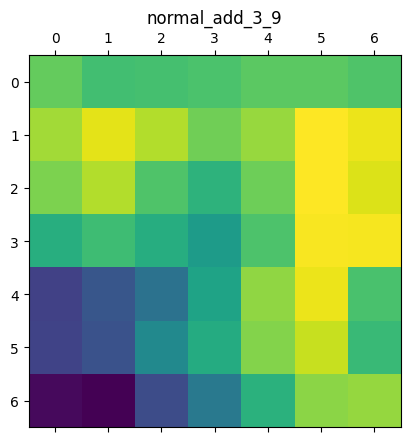

normal_add_4_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

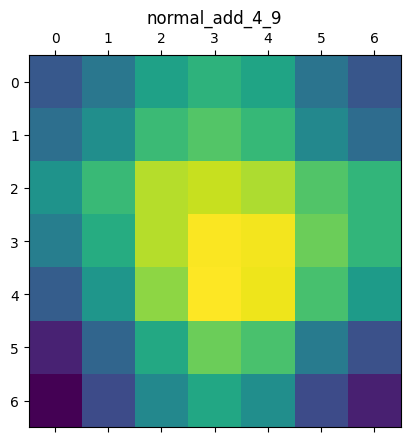

normal_add_5_9 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

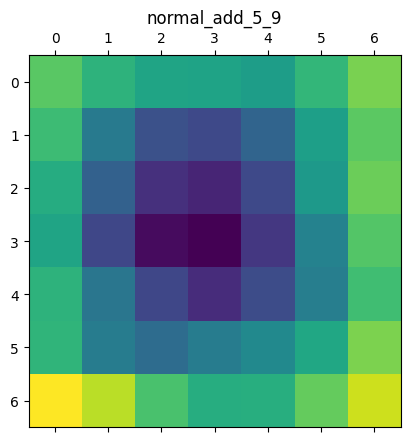

normal_concat_9 (1, 7, 7, 1056)


<Figure size 640x480 with 0 Axes>

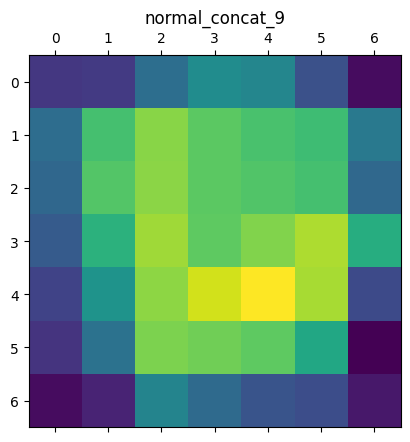

activation_339 (1, 7, 7, 704)


<Figure size 640x480 with 0 Axes>

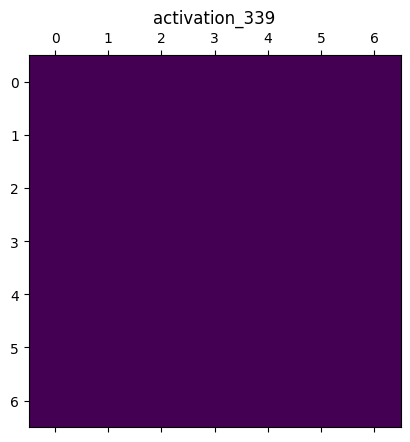

activation_340 (1, 7, 7, 1056)


<Figure size 640x480 with 0 Axes>

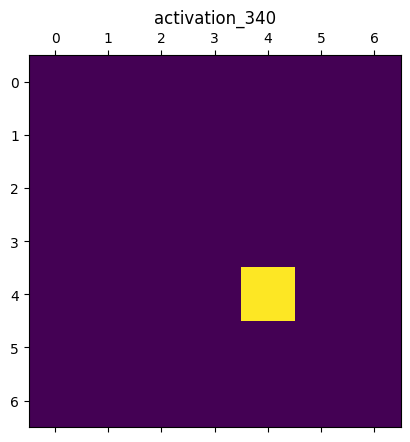

adjust_conv_projection_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

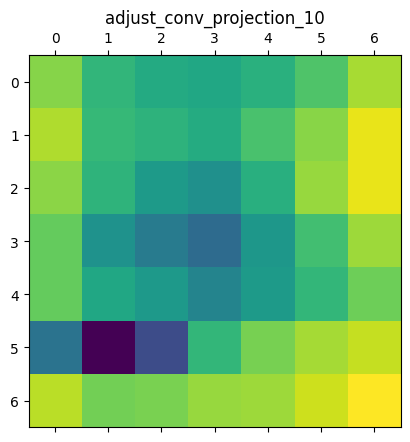

normal_conv_1_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

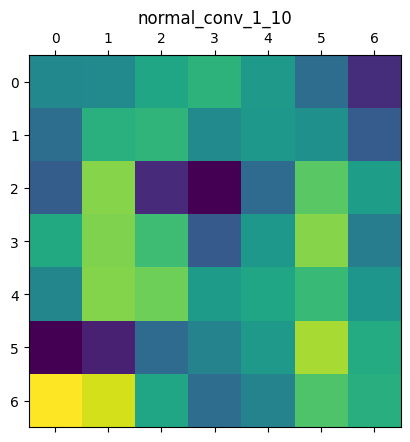

adjust_bn_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

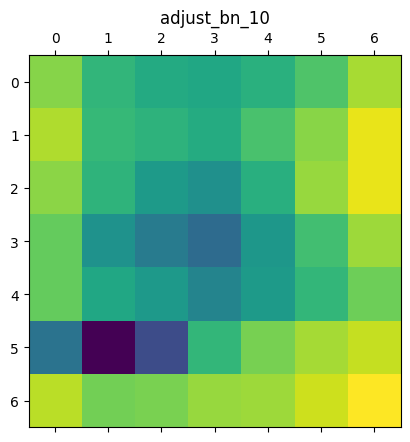

normal_bn_1_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

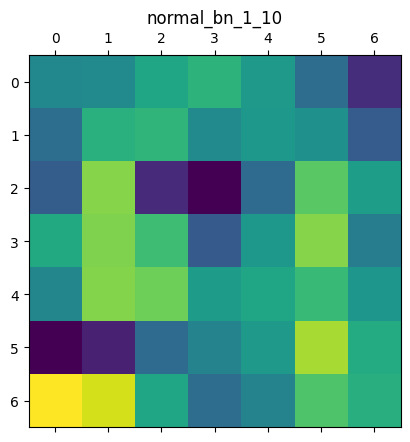

activation_341 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

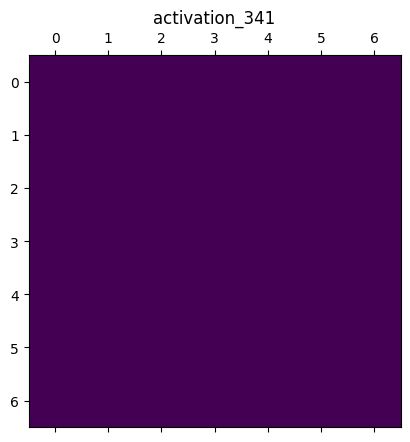

activation_343 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

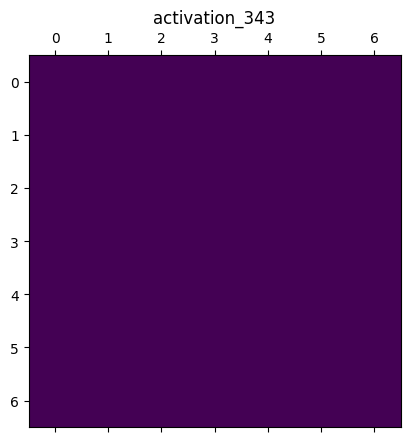

activation_345 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

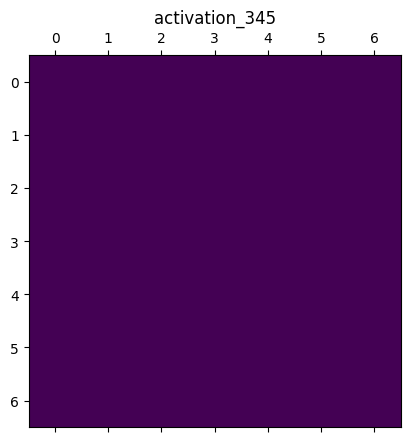

activation_347 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

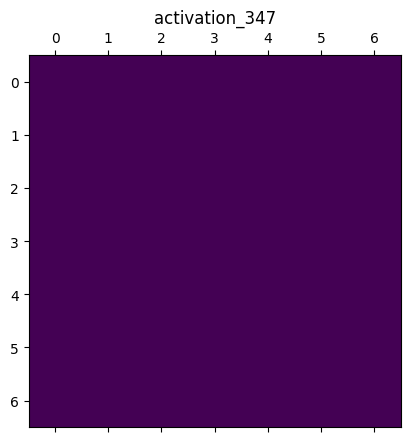

activation_349 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

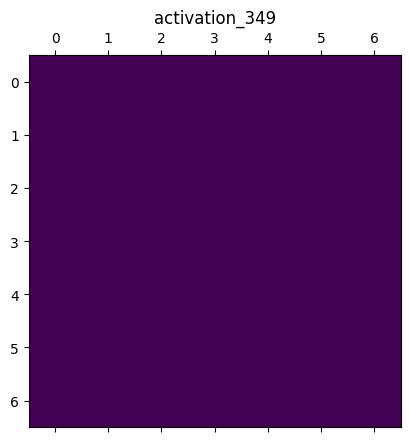

separable_conv_1_normal_left1_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

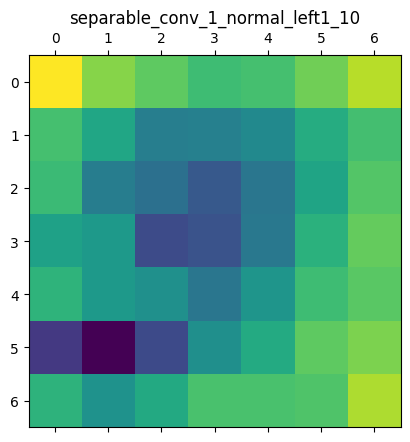

separable_conv_1_normal_right1_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

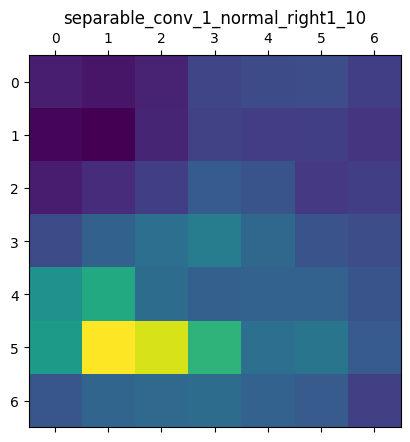

separable_conv_1_normal_left2_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

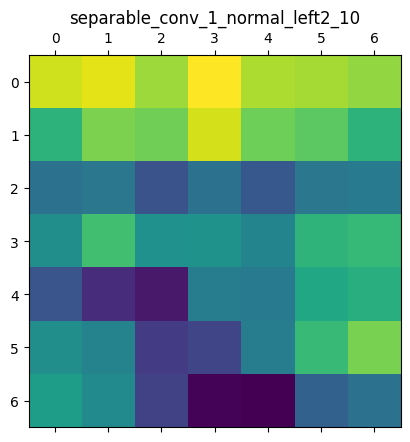

separable_conv_1_normal_right2_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

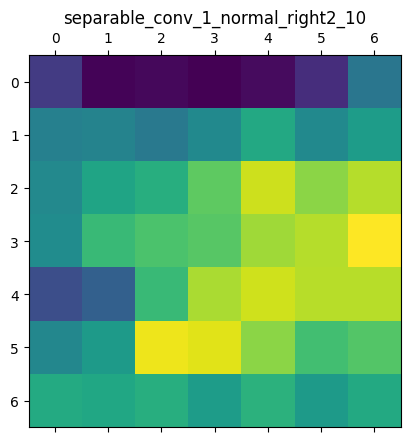

separable_conv_1_normal_left5_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

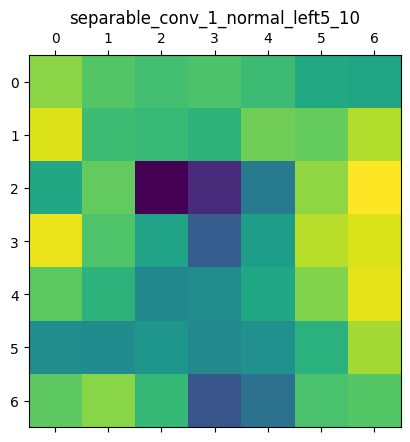

separable_conv_1_bn_normal_left1_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

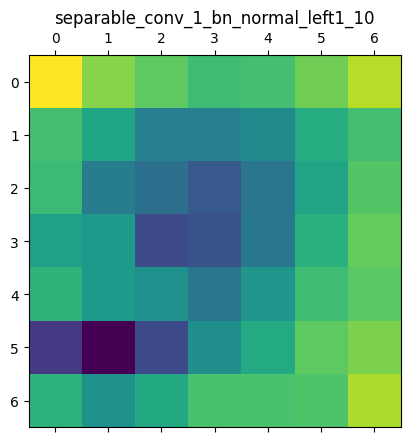

separable_conv_1_bn_normal_right1_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

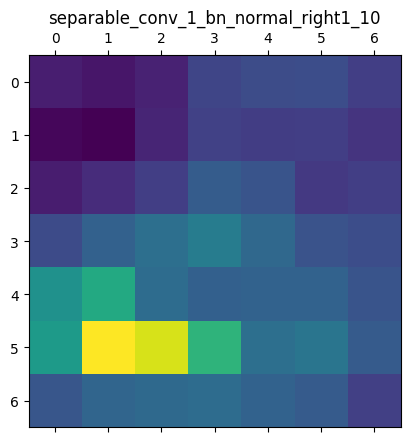

separable_conv_1_bn_normal_left2_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

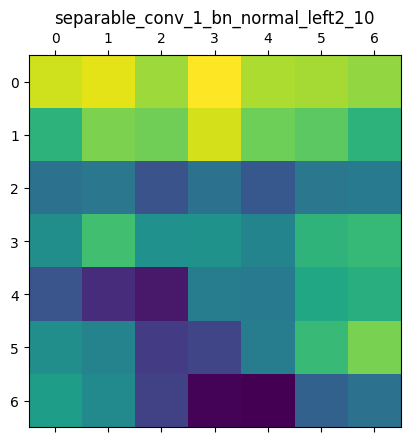

separable_conv_1_bn_normal_right2_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

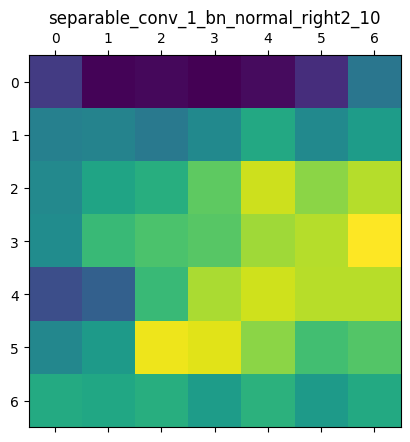

separable_conv_1_bn_normal_left5_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

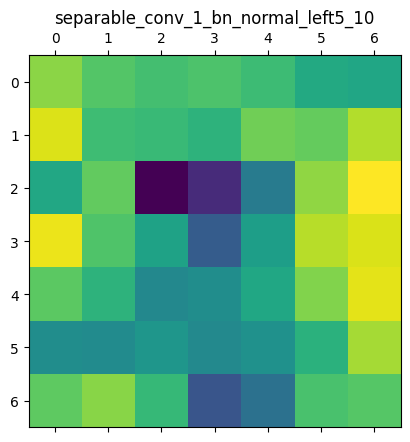

activation_342 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

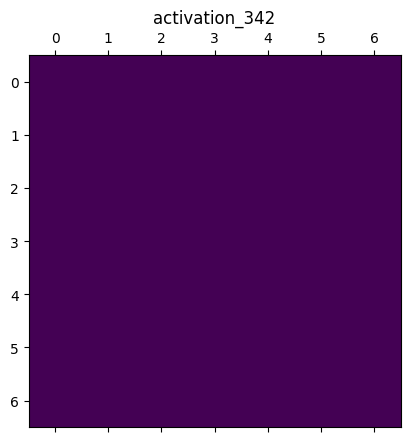

activation_344 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

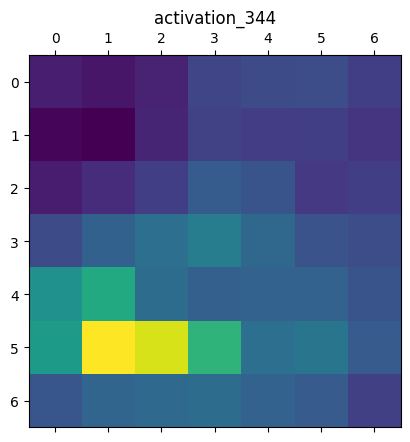

activation_346 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

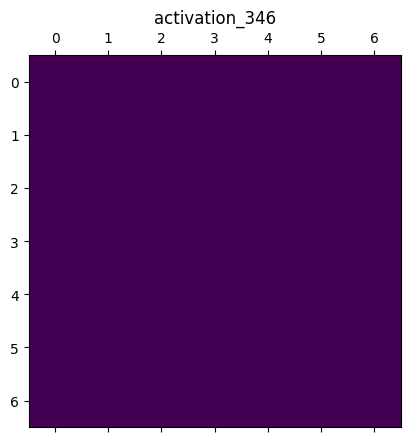

activation_348 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

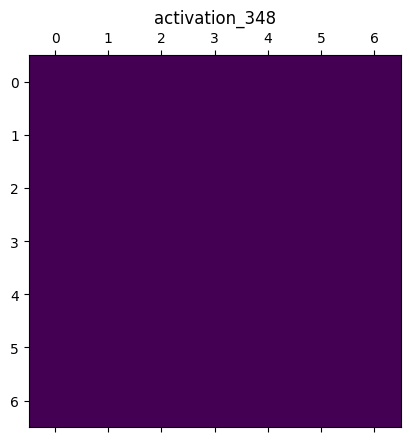

activation_350 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

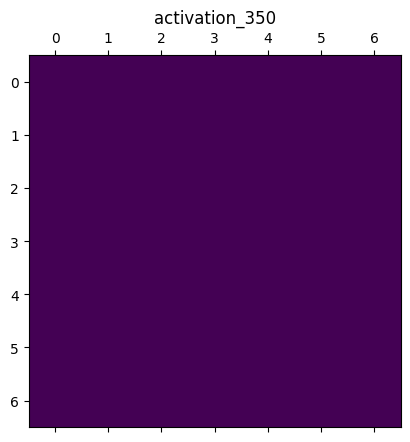

separable_conv_2_normal_left1_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

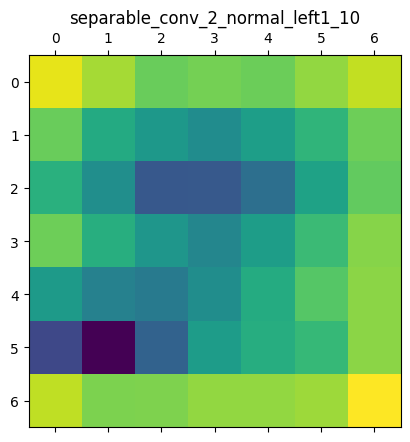

separable_conv_2_normal_right1_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

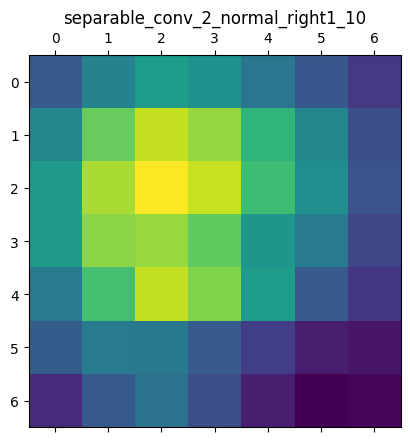

separable_conv_2_normal_left2_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

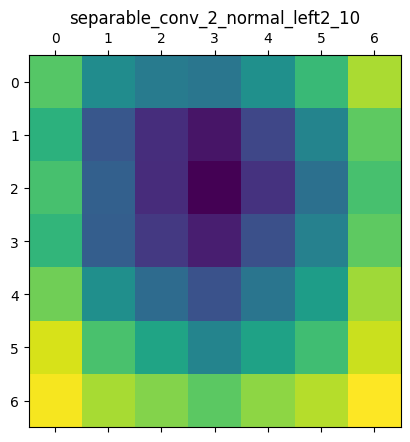

separable_conv_2_normal_right2_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

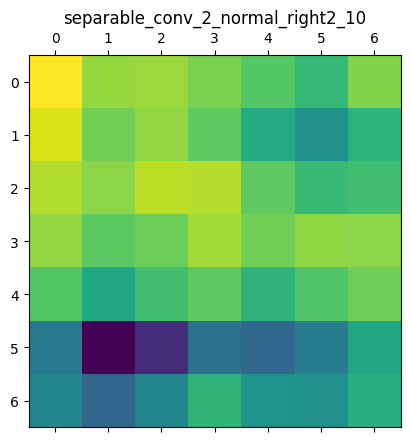

separable_conv_2_normal_left5_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

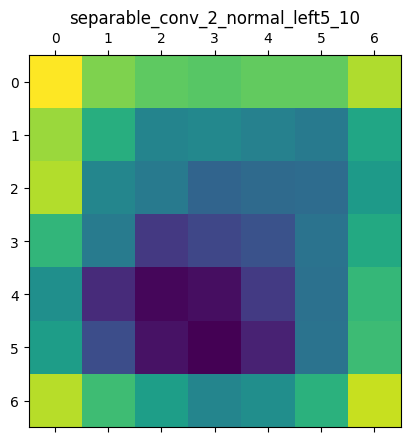

separable_conv_2_bn_normal_left1_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

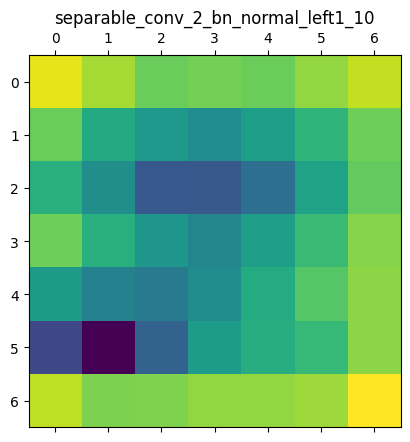

separable_conv_2_bn_normal_right1_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

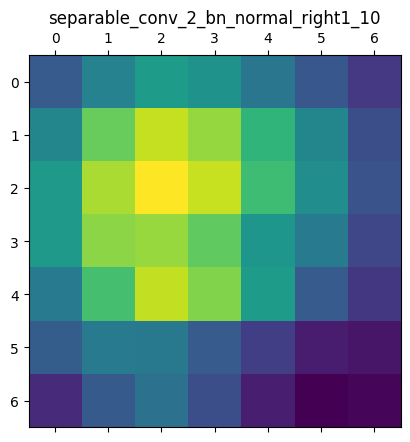

separable_conv_2_bn_normal_left2_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

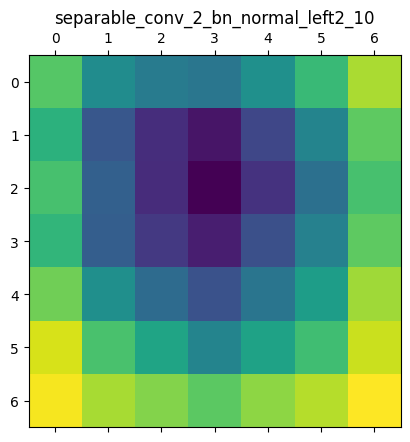

separable_conv_2_bn_normal_right2_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

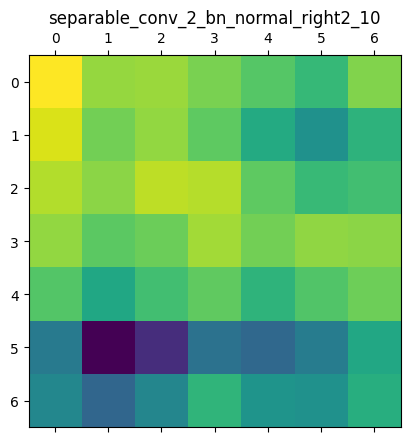

normal_left3_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

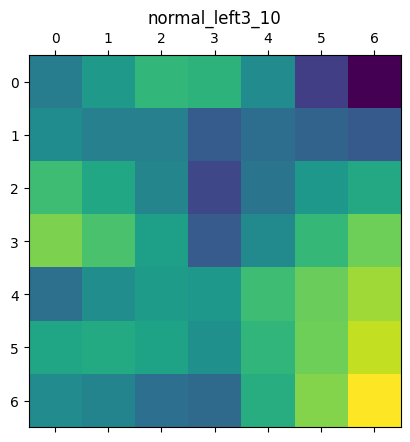

normal_left4_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

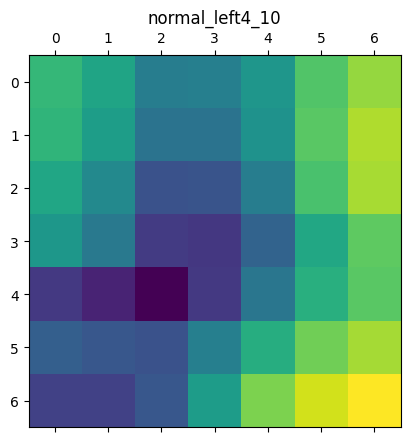

normal_right4_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

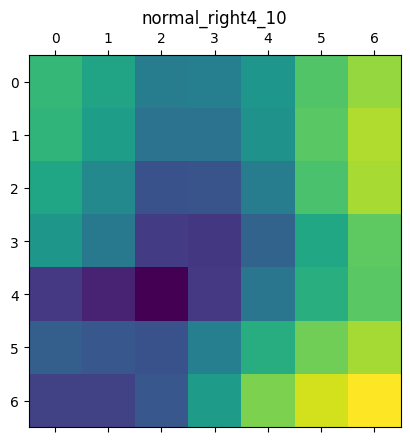

separable_conv_2_bn_normal_left5_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

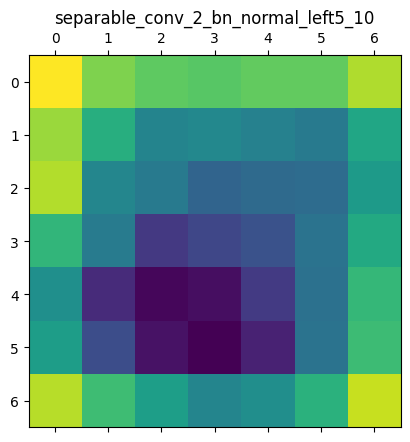

normal_add_1_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

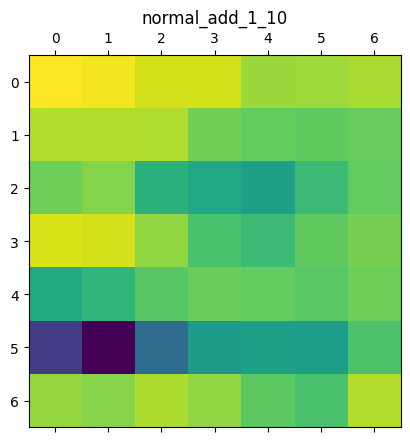

normal_add_2_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

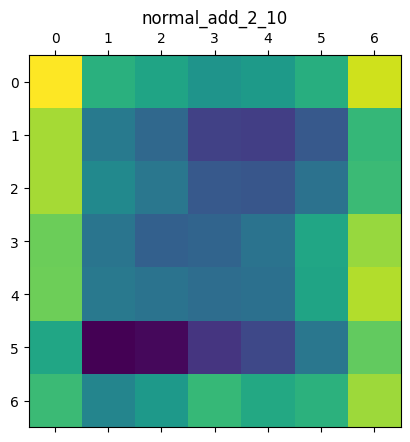

normal_add_3_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

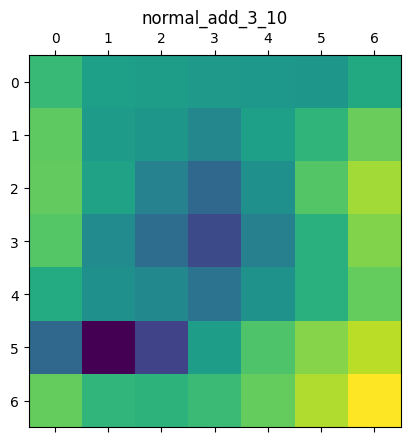

normal_add_4_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

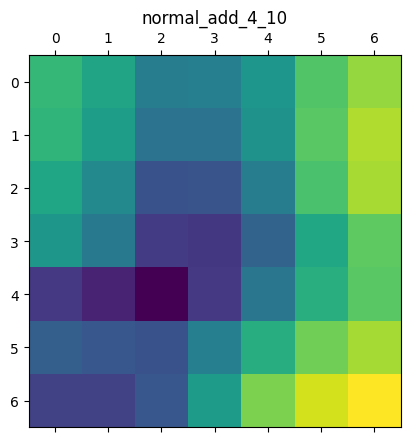

normal_add_5_10 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

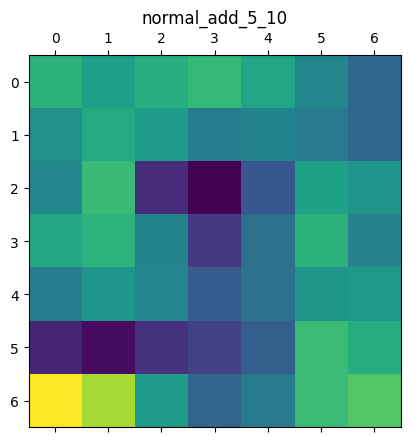

normal_concat_10 (1, 7, 7, 1056)


<Figure size 640x480 with 0 Axes>

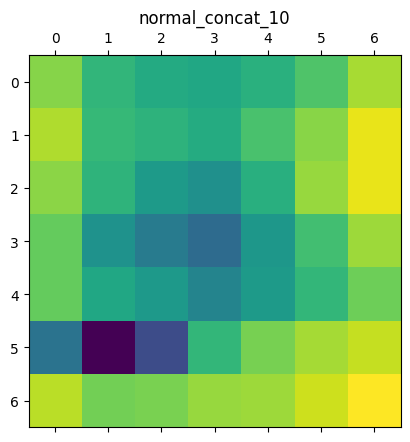

activation_351 (1, 7, 7, 1056)


<Figure size 640x480 with 0 Axes>

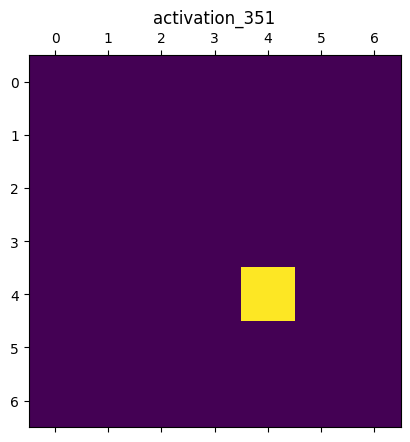

activation_352 (1, 7, 7, 1056)


<Figure size 640x480 with 0 Axes>

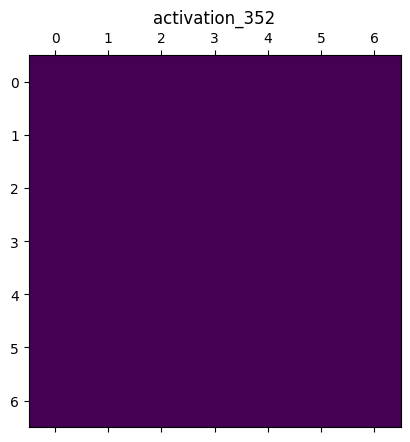

adjust_conv_projection_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

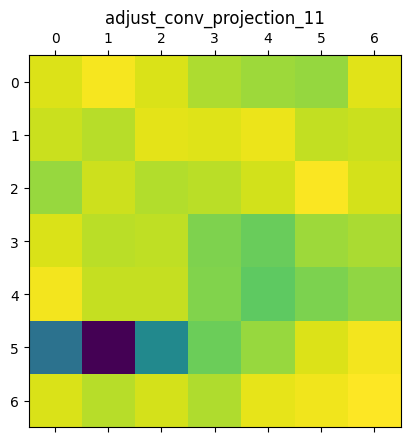

normal_conv_1_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

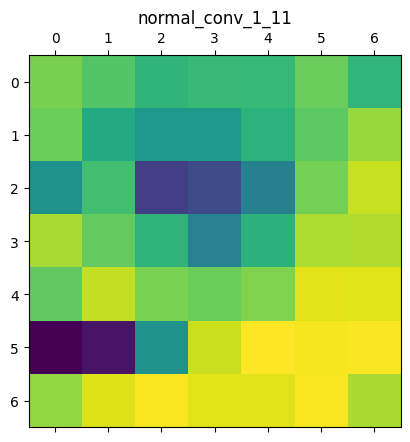

adjust_bn_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

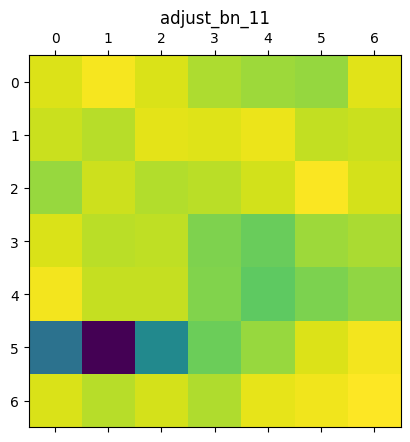

normal_bn_1_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

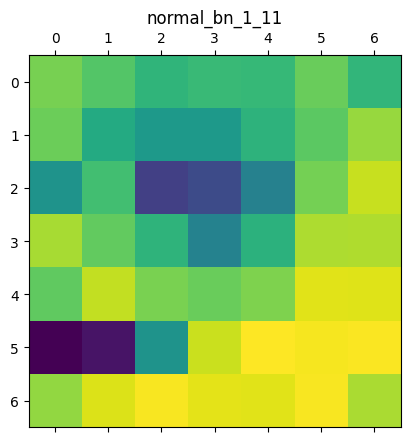

activation_353 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

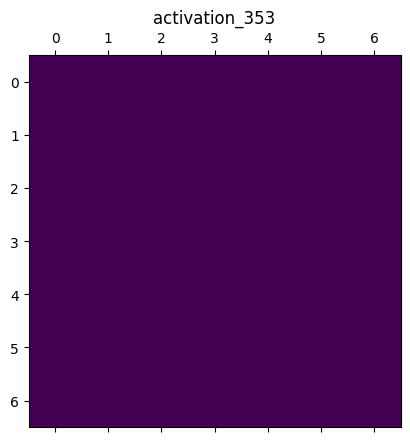

activation_355 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

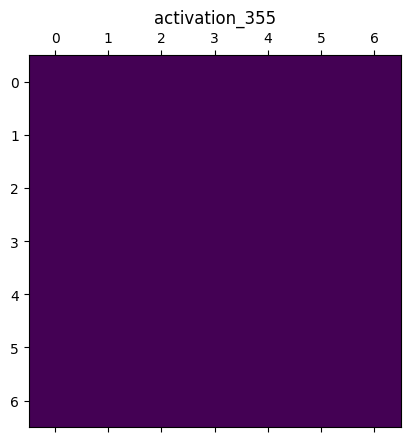

activation_357 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

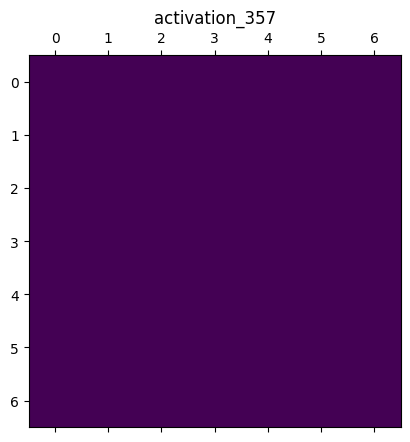

activation_359 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

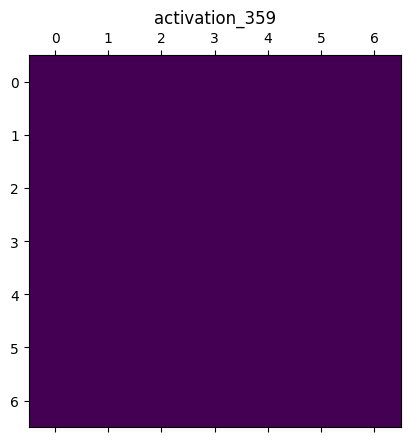

activation_361 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

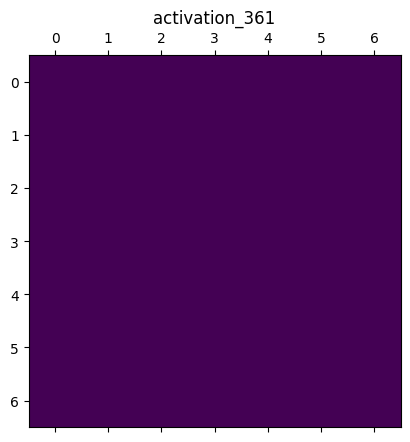

separable_conv_1_normal_left1_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

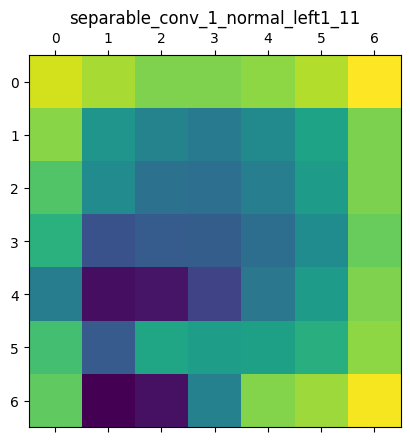

separable_conv_1_normal_right1_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

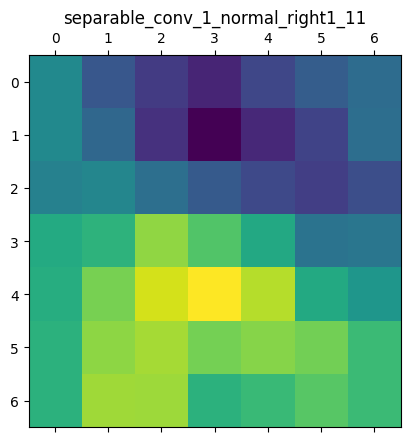

separable_conv_1_normal_left2_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

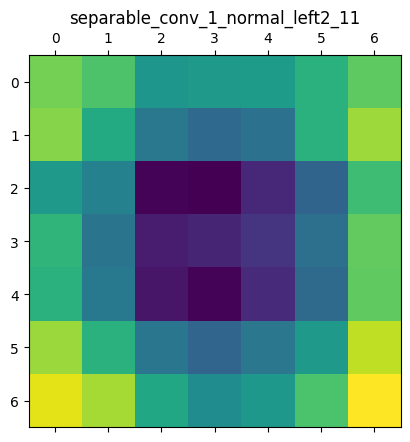

separable_conv_1_normal_right2_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

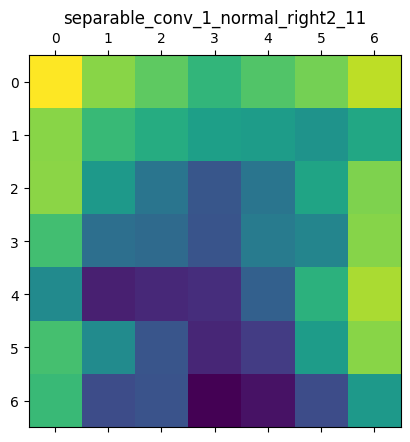

separable_conv_1_normal_left5_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

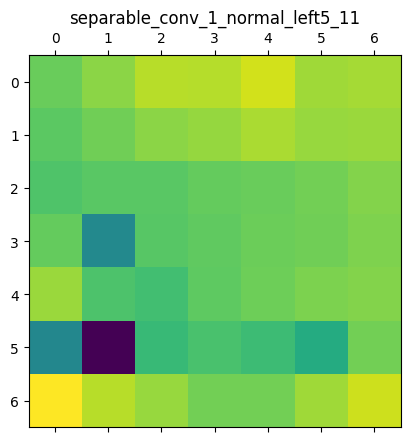

separable_conv_1_bn_normal_left1_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

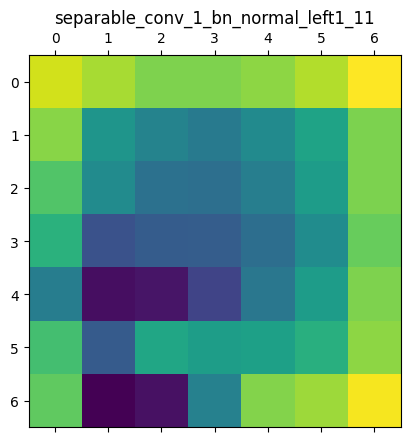

separable_conv_1_bn_normal_right1_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

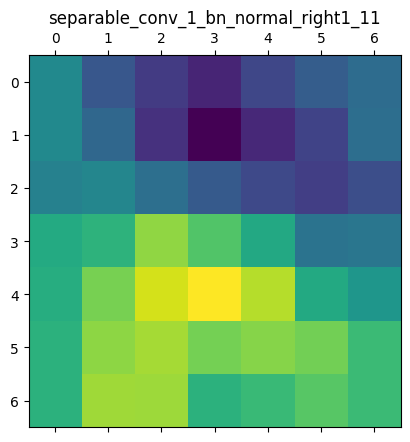

separable_conv_1_bn_normal_left2_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

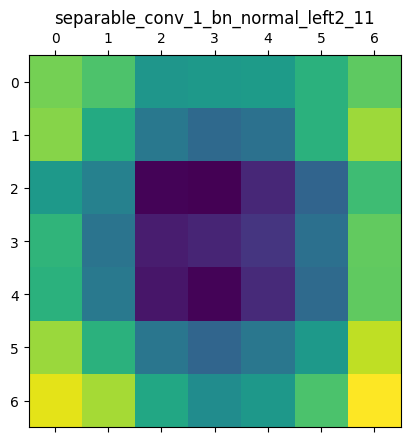

separable_conv_1_bn_normal_right2_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

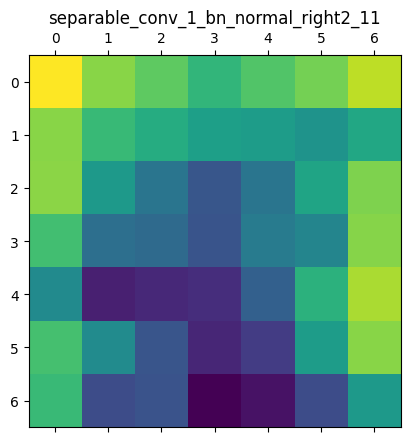

separable_conv_1_bn_normal_left5_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

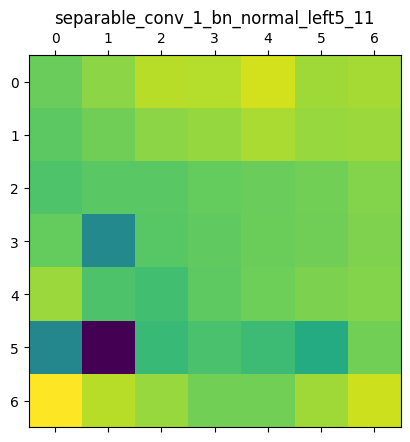

activation_354 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

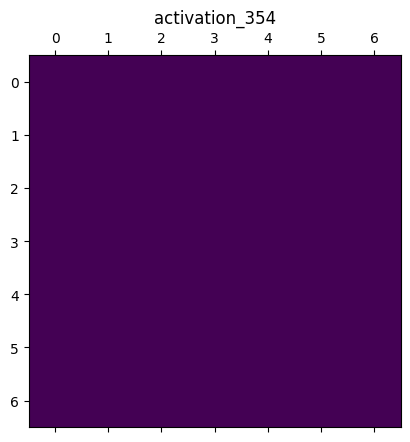

activation_356 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

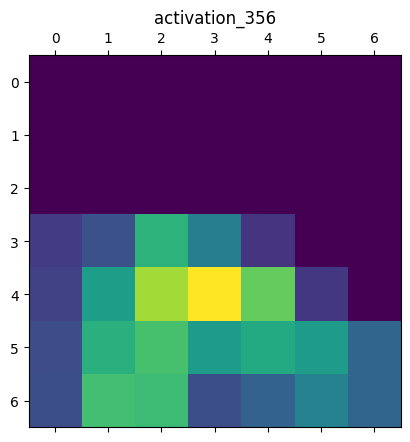

activation_358 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

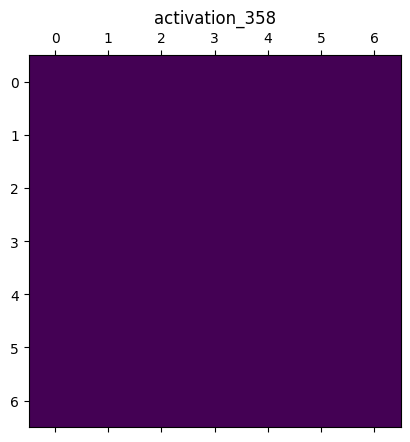

activation_360 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

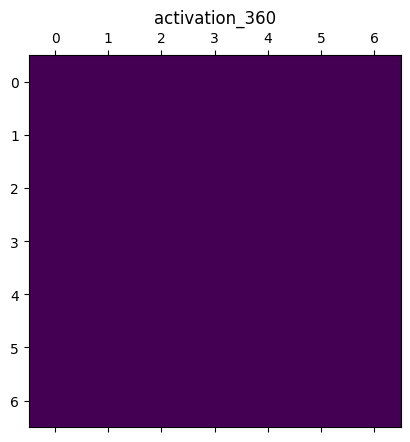

activation_362 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

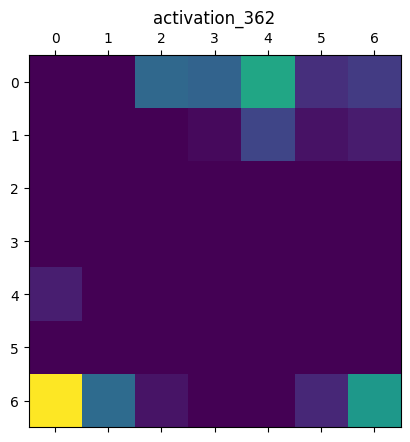

separable_conv_2_normal_left1_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

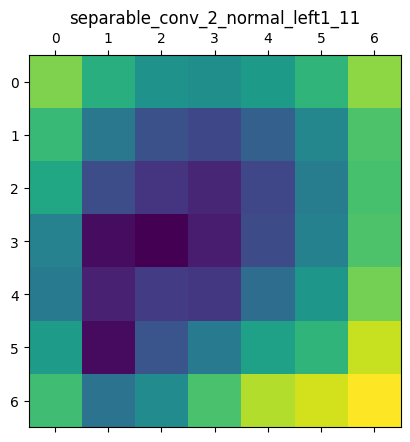

separable_conv_2_normal_right1_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

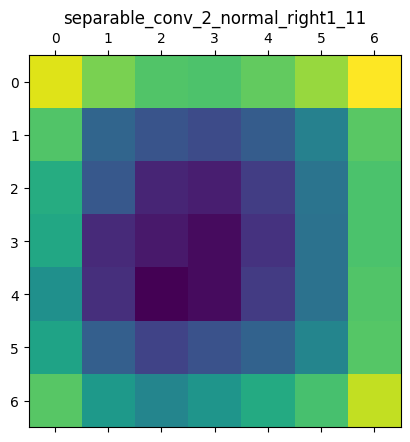

separable_conv_2_normal_left2_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

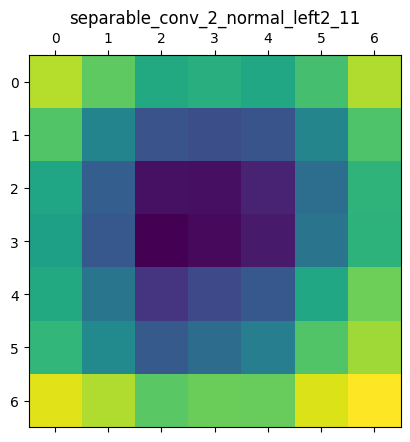

separable_conv_2_normal_right2_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

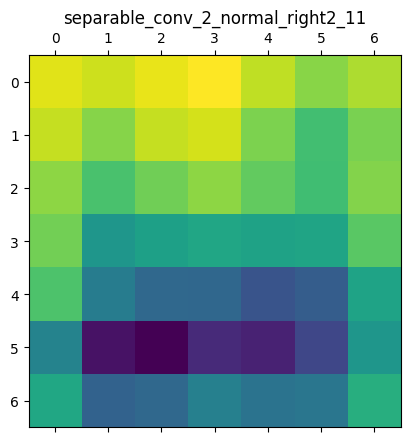

separable_conv_2_normal_left5_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

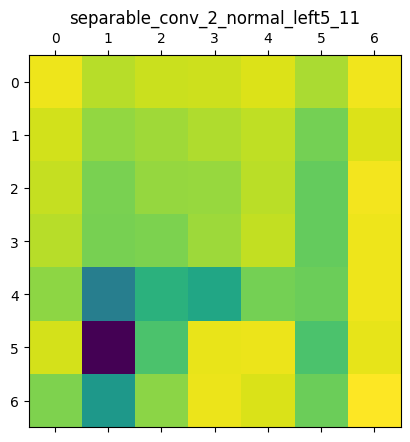

separable_conv_2_bn_normal_left1_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

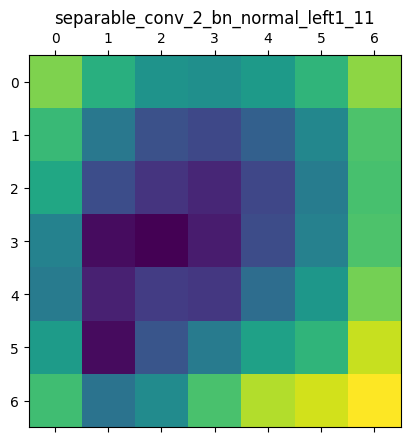

separable_conv_2_bn_normal_right1_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

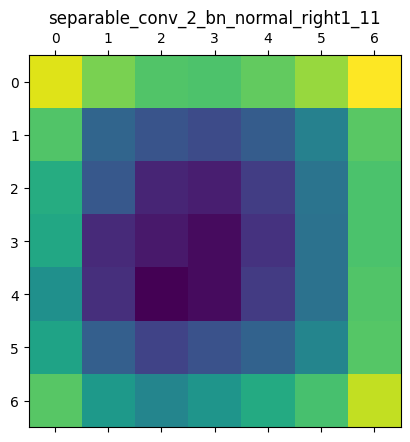

separable_conv_2_bn_normal_left2_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

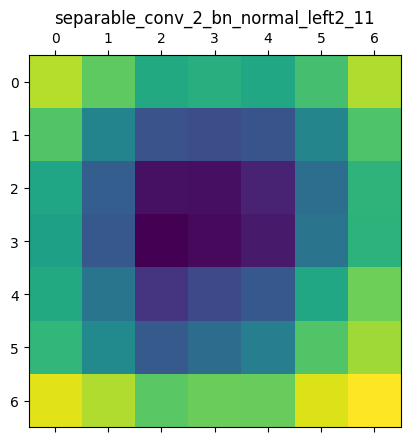

separable_conv_2_bn_normal_right2_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

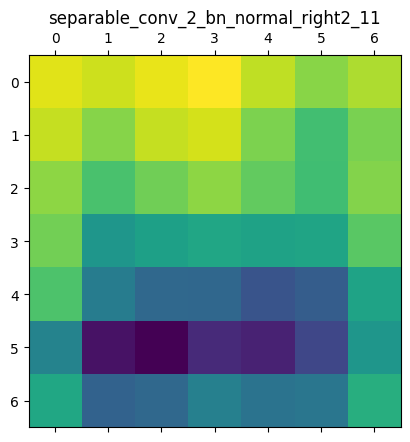

normal_left3_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

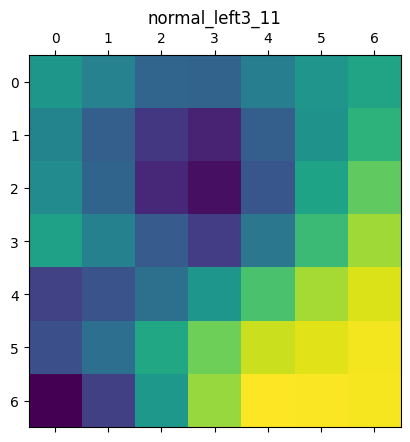

normal_left4_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

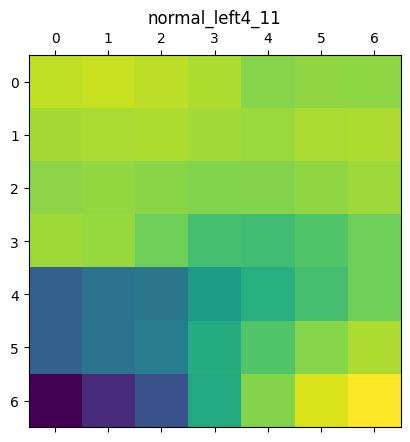

normal_right4_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

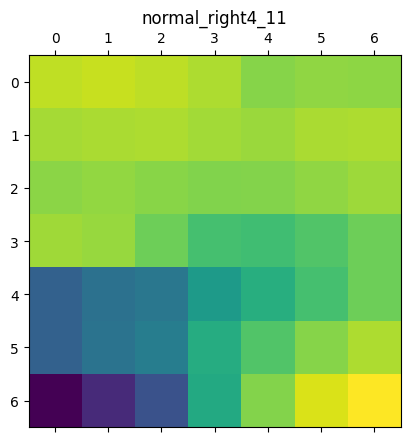

separable_conv_2_bn_normal_left5_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

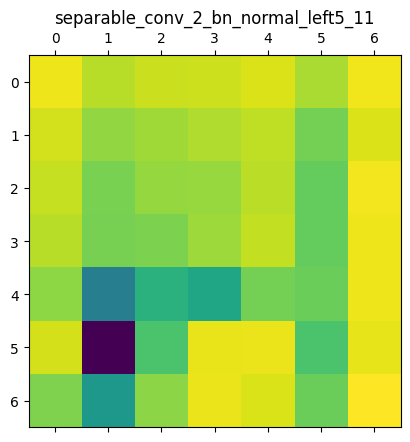

normal_add_1_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

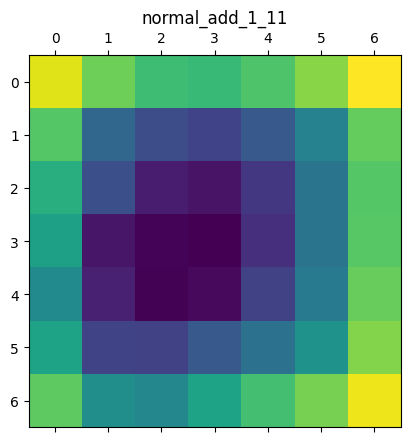

normal_add_2_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

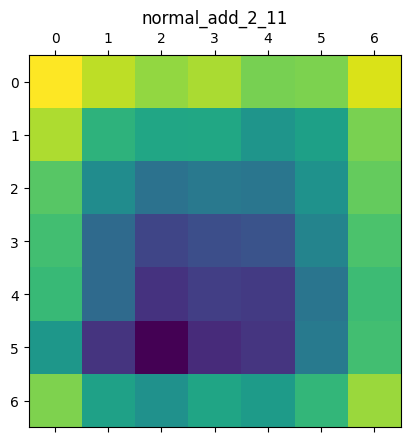

normal_add_3_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

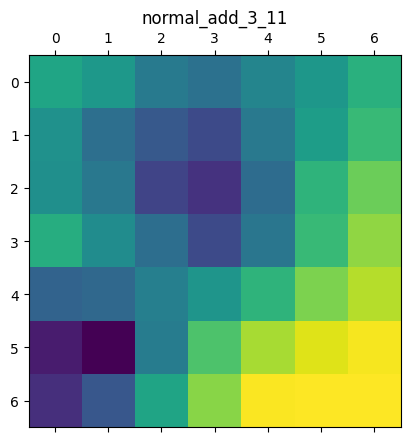

normal_add_4_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

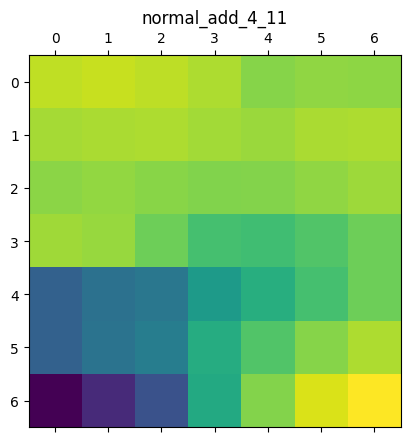

normal_add_5_11 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

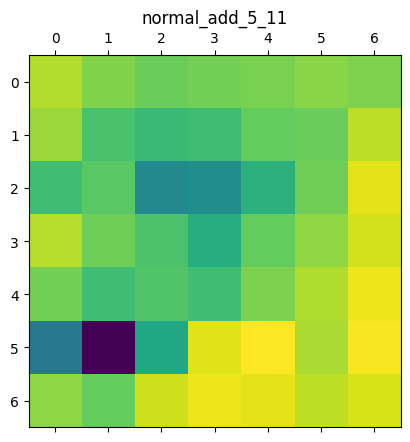

normal_concat_11 (1, 7, 7, 1056)


<Figure size 640x480 with 0 Axes>

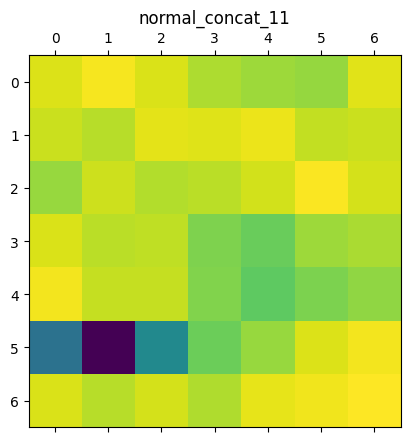

activation_363 (1, 7, 7, 1056)


<Figure size 640x480 with 0 Axes>

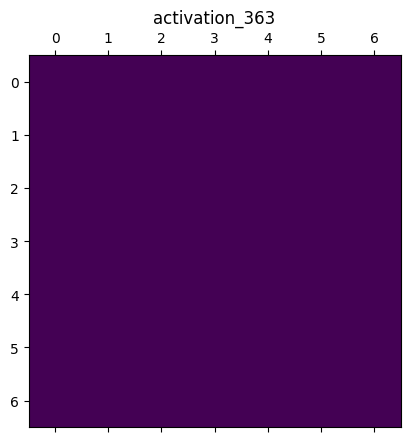

activation_364 (1, 7, 7, 1056)


<Figure size 640x480 with 0 Axes>

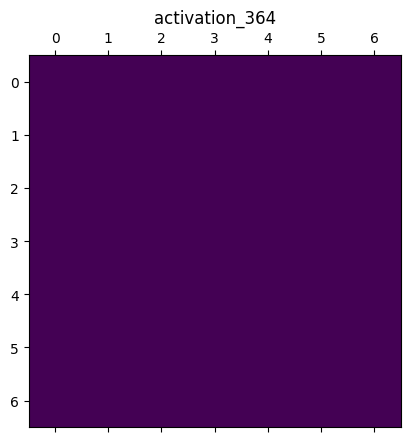

adjust_conv_projection_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

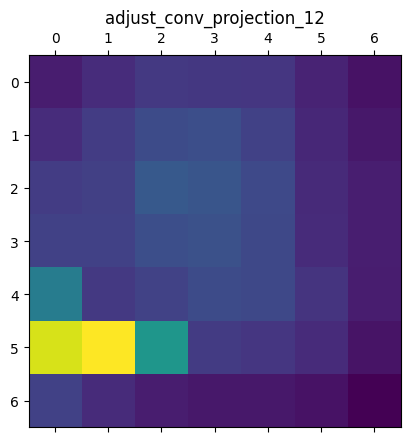

normal_conv_1_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

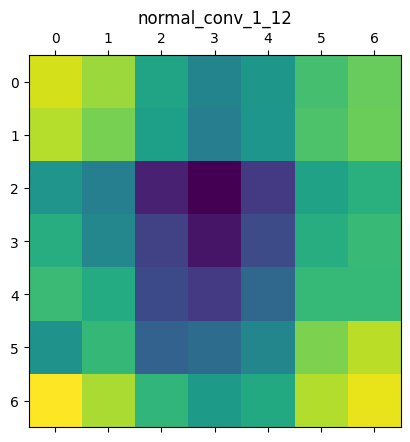

adjust_bn_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

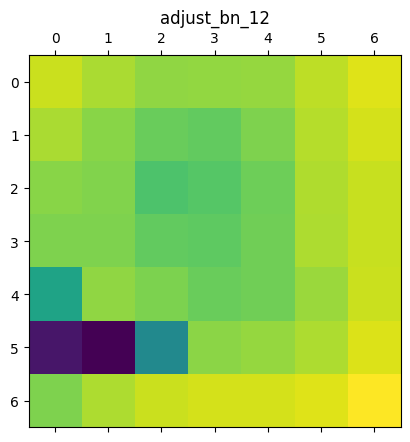

normal_bn_1_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

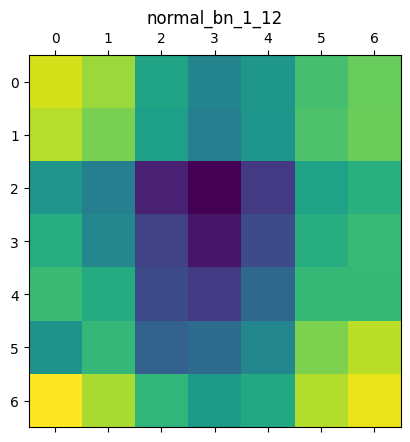

activation_365 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

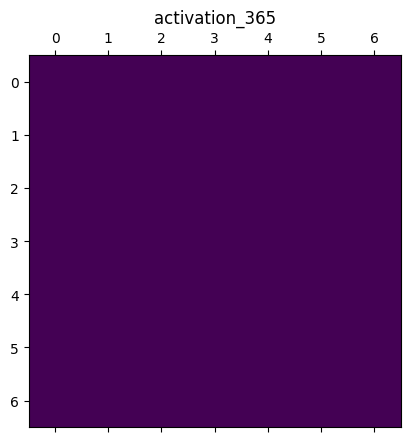

activation_367 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

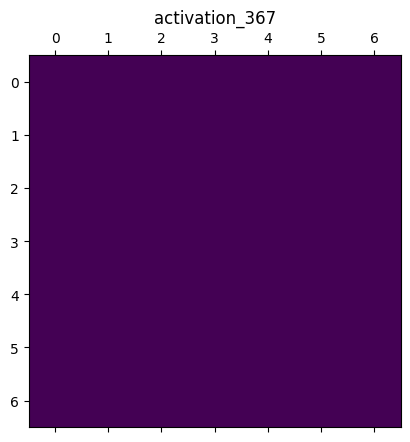

activation_369 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

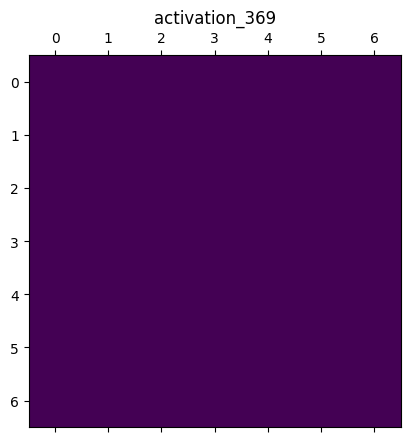

activation_371 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

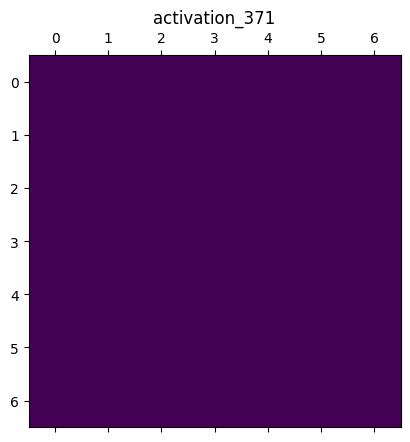

activation_373 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

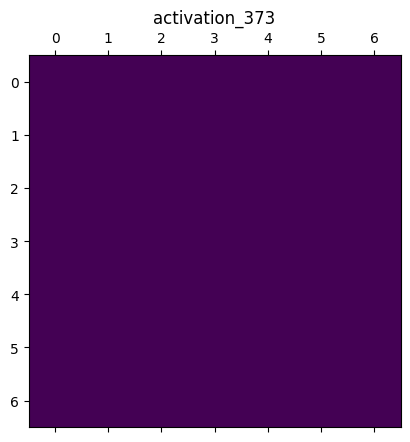

separable_conv_1_normal_left1_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

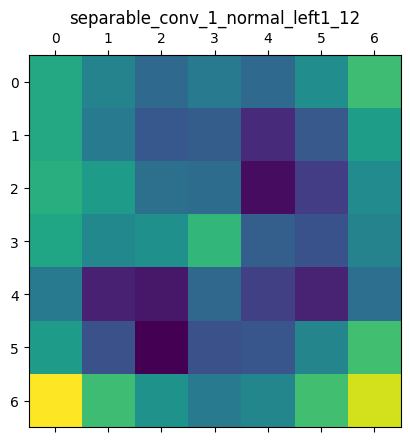

separable_conv_1_normal_right1_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

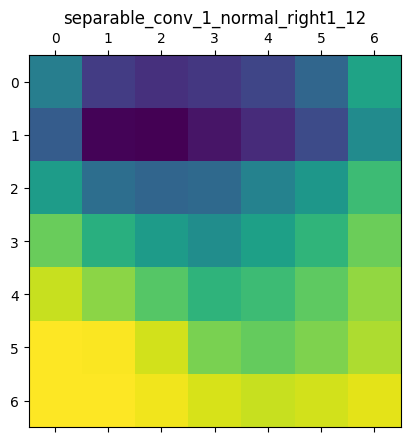

separable_conv_1_normal_left2_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

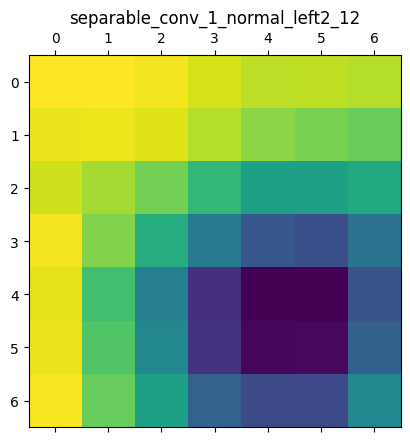

separable_conv_1_normal_right2_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

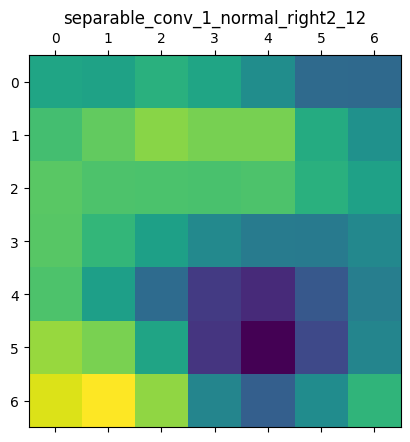

separable_conv_1_normal_left5_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

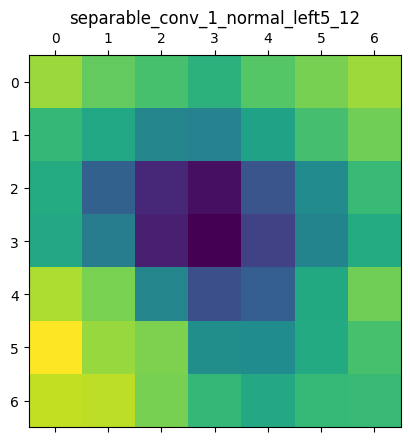

separable_conv_1_bn_normal_left1_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

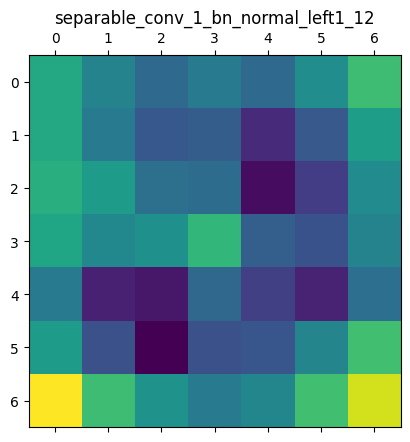

separable_conv_1_bn_normal_right1_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

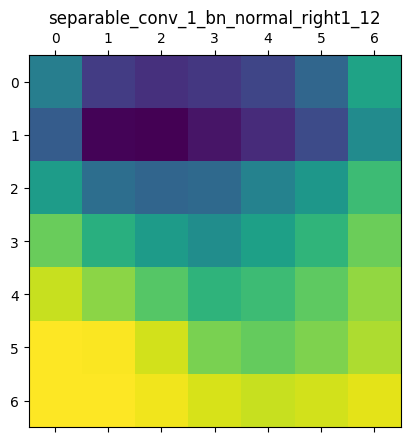

separable_conv_1_bn_normal_left2_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

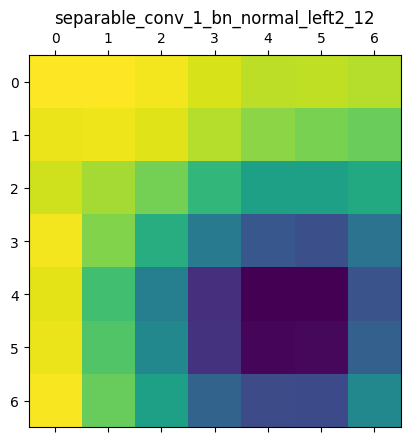

separable_conv_1_bn_normal_right2_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

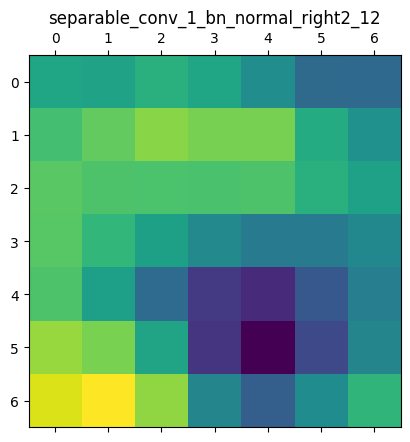

separable_conv_1_bn_normal_left5_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

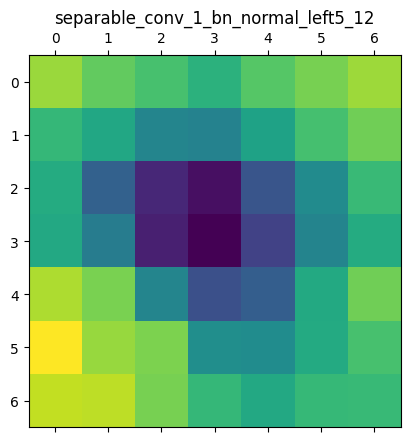

activation_366 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

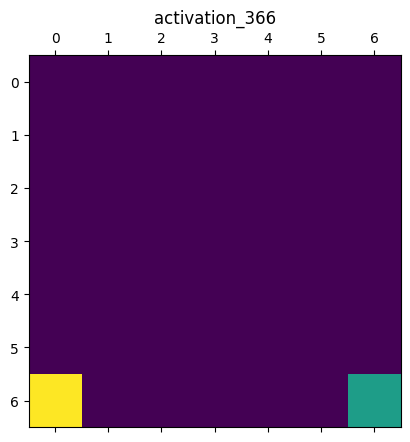

activation_368 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

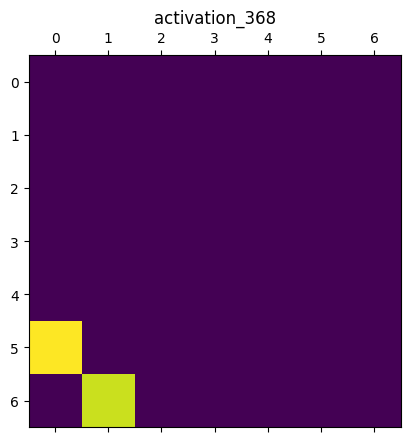

activation_370 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

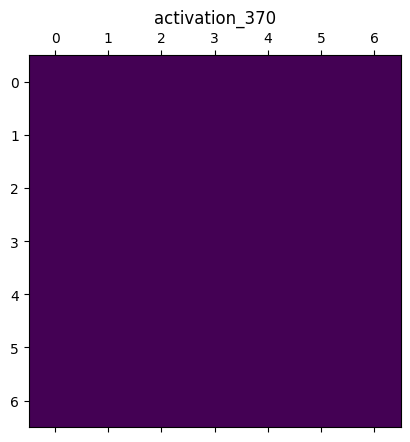

activation_372 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

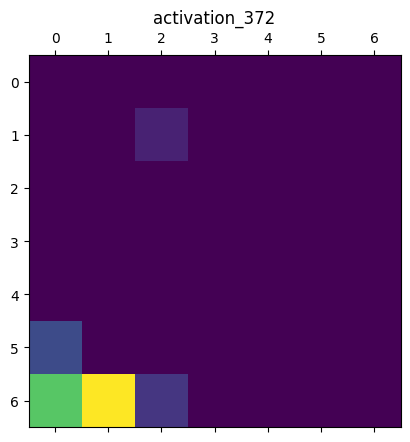

activation_374 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

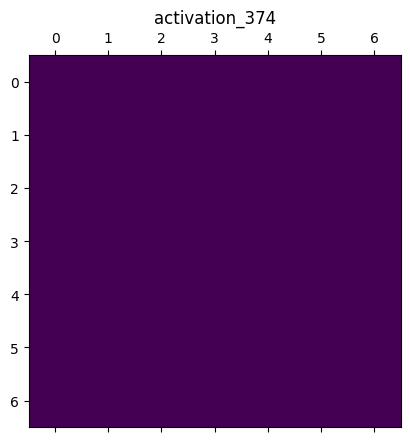

separable_conv_2_normal_left1_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

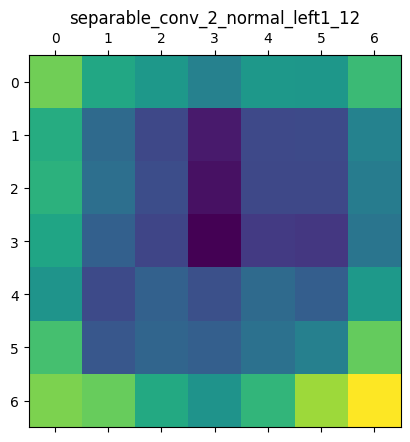

separable_conv_2_normal_right1_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

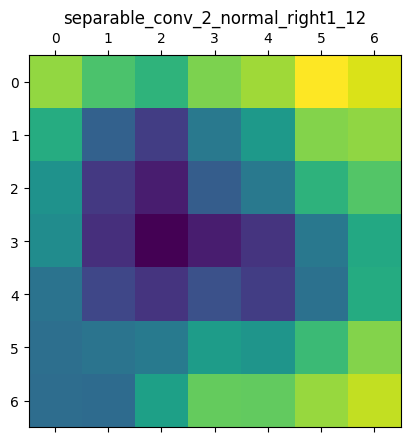

separable_conv_2_normal_left2_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

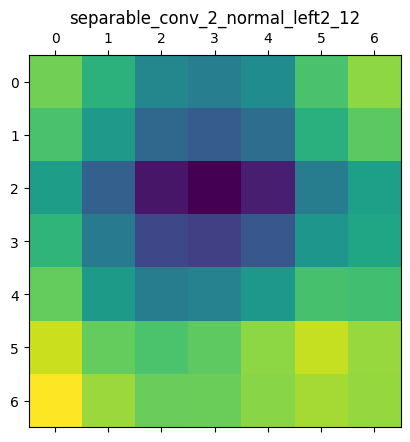

separable_conv_2_normal_right2_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

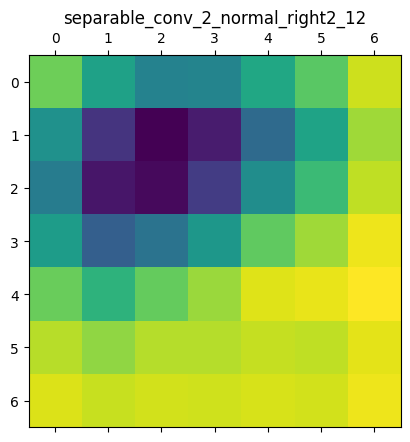

separable_conv_2_normal_left5_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

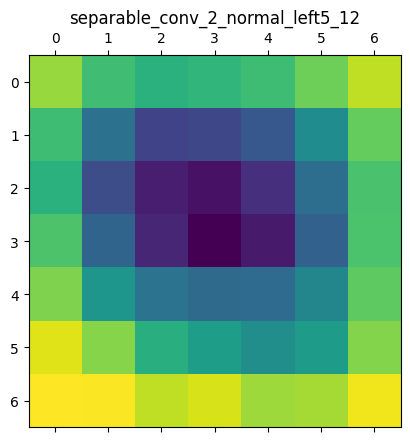

separable_conv_2_bn_normal_left1_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

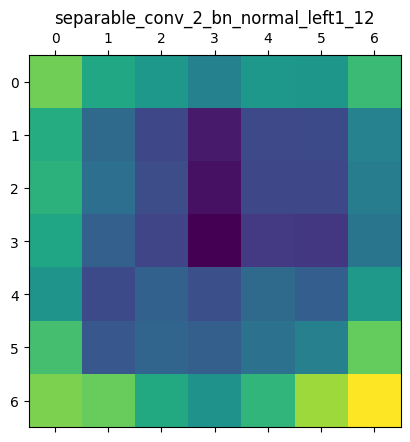

separable_conv_2_bn_normal_right1_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

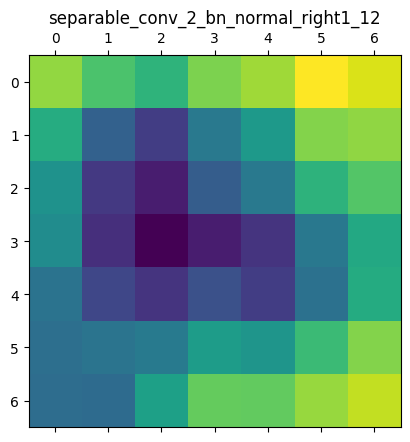

separable_conv_2_bn_normal_left2_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

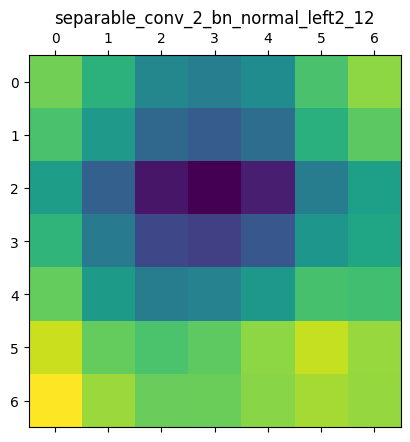

separable_conv_2_bn_normal_right2_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

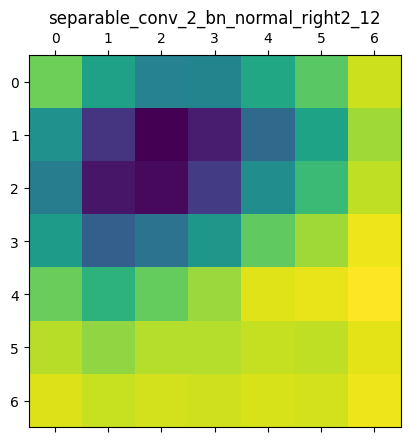

normal_left3_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

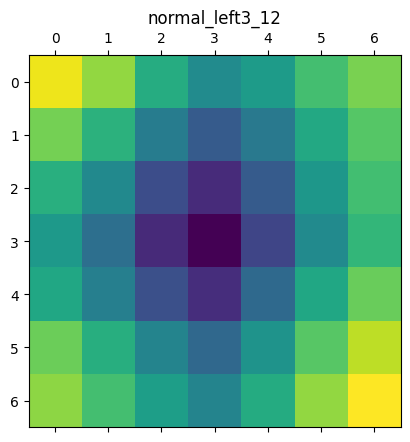

normal_left4_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

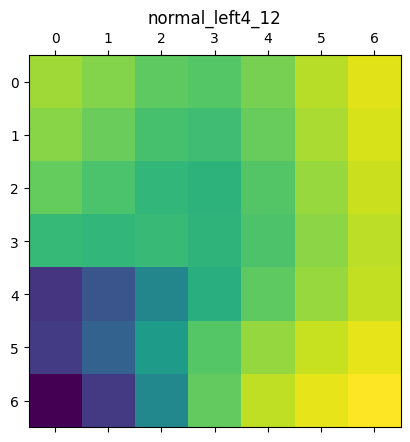

normal_right4_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

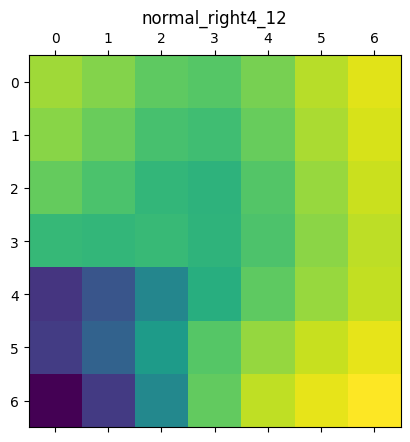

separable_conv_2_bn_normal_left5_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

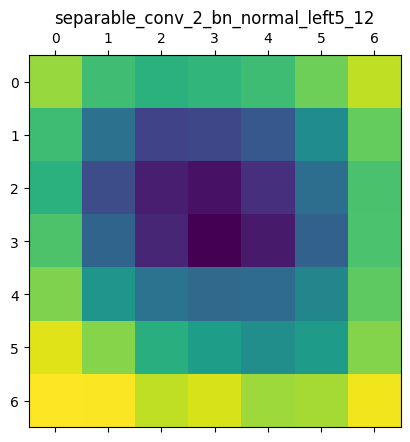

normal_add_1_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

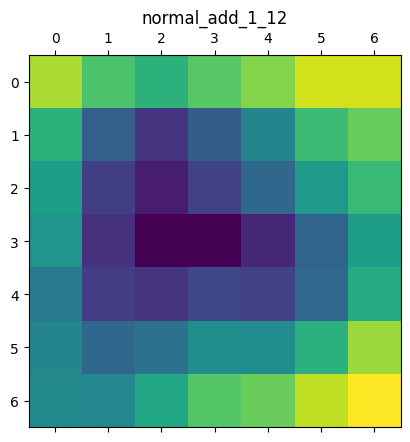

normal_add_2_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

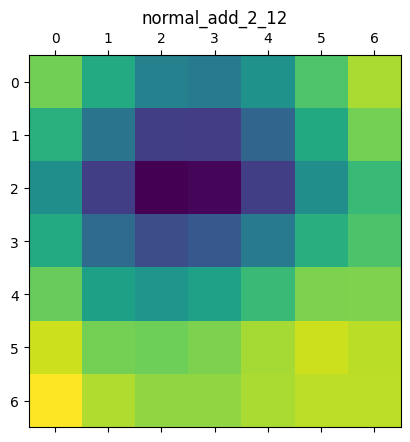

normal_add_3_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

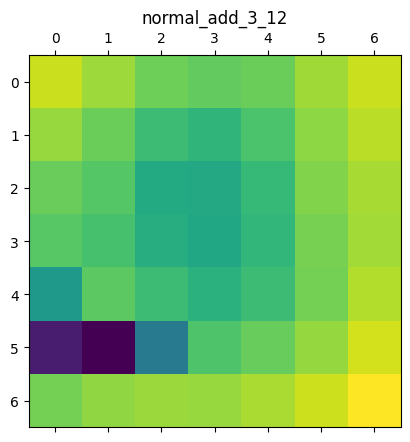

normal_add_4_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

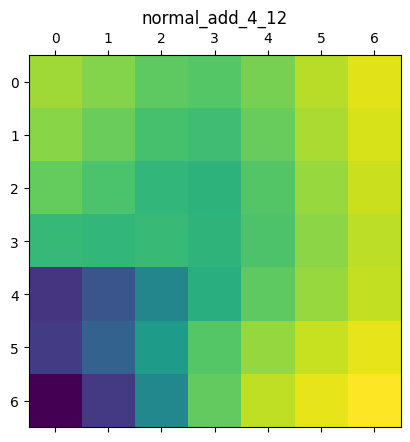

normal_add_5_12 (1, 7, 7, 176)


<Figure size 640x480 with 0 Axes>

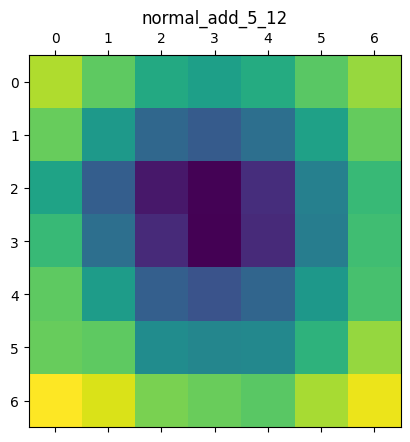

normal_concat_12 (1, 7, 7, 1056)


<Figure size 640x480 with 0 Axes>

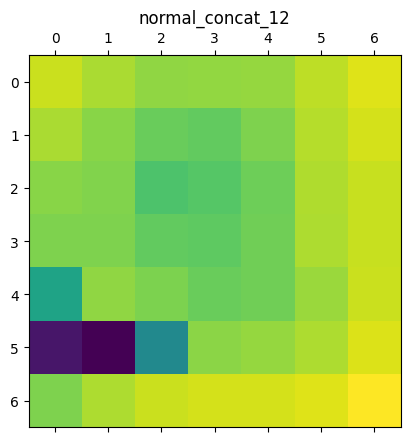

activation_375 (1, 7, 7, 1056)


<Figure size 640x480 with 0 Axes>

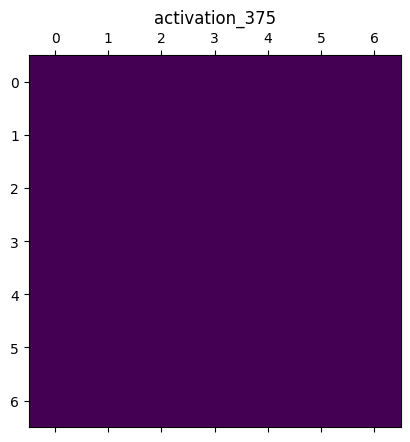

global_average_pooling2d_1 (1, 1056)
dense_2 (1, 256)
dense_3 (1, 58)


In [47]:
import tensorflow as tf


def get_activations(model, input_data):
    layer_outputs = [layer.output for layer in model.layers]
    activation_model = tf.keras.Model(inputs=model.input, outputs=layer_outputs)
    activations = activation_model.predict(input_data)
    return activations
sample_input = X_train_resized[:1]  # assuming X_train_resized is your input data
activations = get_activations(nasnet_model, sample_input)


for layer_name, activation in zip(nasnet_model.layers, activations):
    print(layer_name.name, activation.shape)
    if len(activation.shape) == 4:
        plt.figure()
        plt.matshow(activation[0, :, :, 0], cmap='viridis')
        plt.title(layer_name.name)
        plt.show()

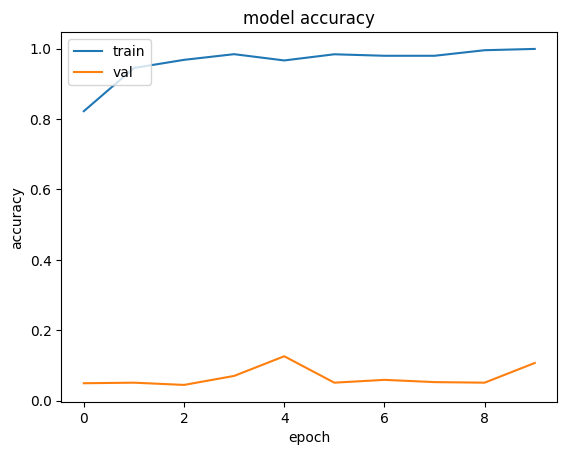

In [48]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

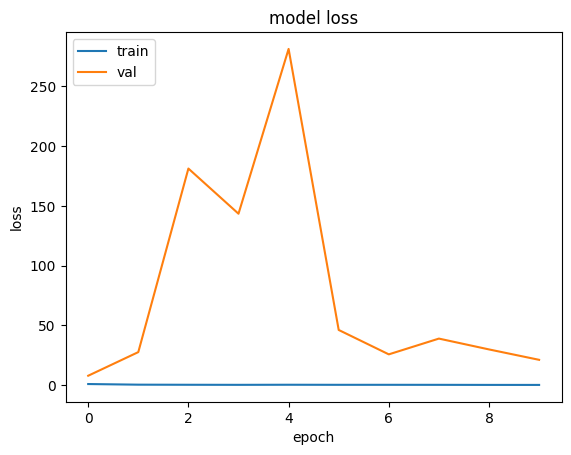

In [49]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

20/20 [==============================] - 51s 2s/step


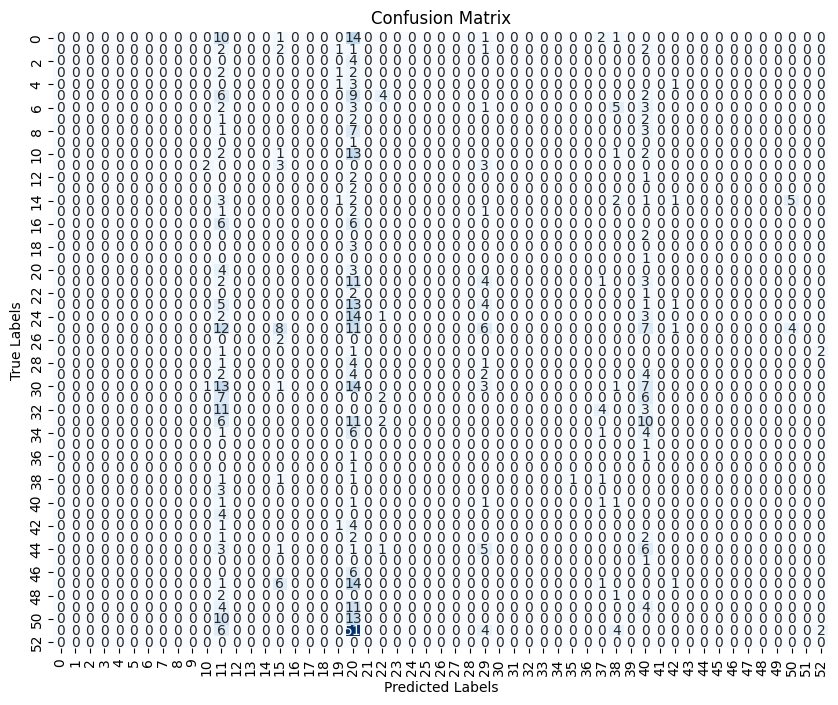

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        29
           1       0.00      0.00      0.00         9
           2       0.00      0.00      0.00         4
           3       0.00      0.00      0.00         5
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00        21
           6       0.00      0.00      0.00        14
           7       0.00      0.00      0.00         5
           8       0.00      0.00      0.00        11
          10       0.00      0.00      0.00         1
          11       0.00      0.00      0.00        19
          12       0.00      0.00      0.00         8
          14       0.00      0.00      0.00         3
          15       0.00      0.00      0.00         2
          16       0.00      0.00      0.00        15
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00        12
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

In [51]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

y_pred = nasnet_model.predict(X_test_resized)

y_pred_labels = np.argmax(y_pred, axis=1)
conf_matrix = confusion_matrix(y_test_encoded, y_pred_labels)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()
print(classification_report(y_test_encoded, y_pred_labels))